## Assignment-2 : Computational Machine Learning (COSC2793)

Student Name: Salina Bharthu                              Student ID: s3736867

In [1]:
#Import useful libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn import ensemble

# To print outpout of all commands, not just the most recent one
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

#To supress warnings
import warnings
warnings.filterwarnings("ignore")

C:\Users\Salina\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Data Extraction and Exploration

In [2]:
#Read CSV file 
data = pd.read_csv('F://Sem-3//CML//UCI-electricity//UCI-electricity//UCI_data.csv', index_col=0, parse_dates=True)
data.head(5)
data.shape

,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,...,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
date,,,,,,,,,,,,,,,,,,,,,
2016-04-19 20:30:00,22.200000,39.500000,20.566667,37.656667,22.230000,37.030000,22.318571,36.610000,20.633333,62.166667,...,33.90,9.70,766.100000,65.5,3.500000,40.000000,3.350000,24.061869,24.061869,60
2016-03-05 04:40:00,20.356667,37.126667,17.566667,40.230000,20.890000,37.663333,18.700000,36.260000,18.463333,43.560000,...,41.09,0.30,740.333333,99.0,1.000000,41.333333,0.100000,4.622052,4.622052,50
2016-03-14 12:40:00,20.926667,38.790000,21.100000,35.526667,21.600000,36.290000,21.000000,34.826667,18.100000,46.126667,...,38.76,4.40,768.466667,72.0,6.000000,22.666667,-0.266667,5.635898,5.635898,80
2016-01-22 15:30:00,18.290000,38.900000,17.290000,39.260000,18.390000,39.326667,16.100000,38.790000,16.100000,47.700000,...,39.20,3.35,760.600000,82.0,5.500000,41.000000,0.500000,49.216445,49.216445,40
2016-02-10 00:40:00,22.290000,42.333333,21.600000,40.433333,22.666667,43.363333,19.100000,40.900000,19.290000,50.745000,...,43.73,3.20,738.900000,88.0,7.333333,56.000000,1.400000,47.617579,47.617579,60


(19735, 27)

In [3]:
#Checking datatypes of variables
data.dtypes

T1               float64
RH_1             float64
T2               float64
RH_2             float64
T3               float64
RH_3             float64
T4               float64
RH_4             float64
T5               float64
RH_5             float64
T6               float64
RH_6             float64
T7               float64
RH_7             float64
T8               float64
RH_8             float64
T9               float64
RH_9             float64
T_out            float64
Press_mm_hg      float64
RH_out           float64
Windspeed        float64
Visibility       float64
Tdewpoint        float64
rv1              float64
rv2              float64
TARGET_energy      int64
dtype: object

In [4]:
#Checking dataset for null values
data.isna().sum()

T1               0
RH_1             0
T2               0
RH_2             0
T3               0
RH_3             0
T4               0
RH_4             0
T5               0
RH_5             0
T6               0
RH_6             0
T7               0
RH_7             0
T8               0
RH_8             0
T9               0
RH_9             0
T_out            0
Press_mm_hg      0
RH_out           0
Windspeed        0
Visibility       0
Tdewpoint        0
rv1              0
rv2              0
TARGET_energy    0
dtype: int64

Text(0, 0.5, 'Target Energy')

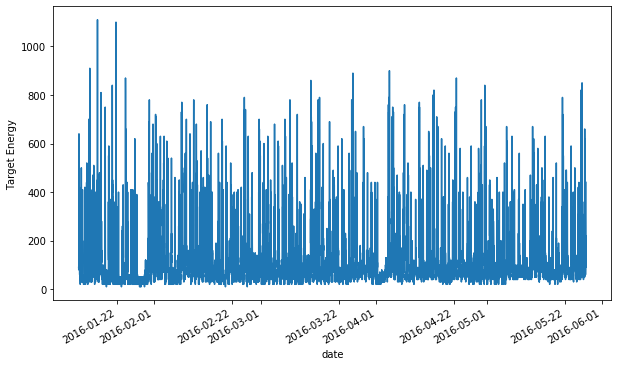

In [5]:
#Display timeseries plot of Target Energy use
fig = plt.figure(figsize = (10,6))
data['TARGET_energy'].plot()
plt.ylabel('Target Energy')
plt.show()

(3290, 27)

Text(0, 0.5, 'Target Energy')

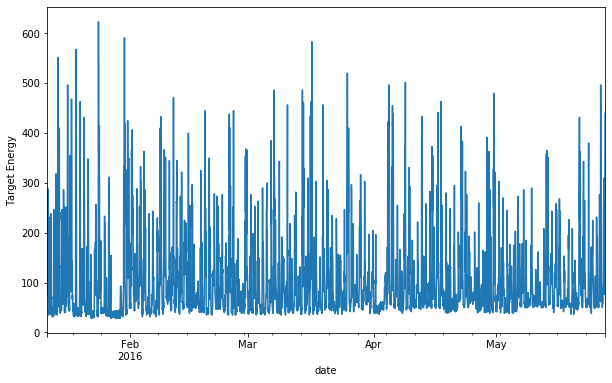

In [6]:
#Resample timeseries data on hourly basis using average values
data = data.resample('H').mean()
data_NN =data
data.shape

#Disply timeseries of Target variable after resampling
fig = plt.figure(figsize = (10,6))
data['TARGET_energy'].plot()
plt.ylabel('Target Energy')
plt.show()

In [7]:
#Display statistics of variables
data.describe()

,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,...,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
count,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,...,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000,3290.000000
mean,21.687537,40.261345,20.342466,40.421067,22.268765,39.242985,20.856309,39.028661,19.593020,50.949599,...,41.553741,7.415410,755.522520,79.744656,4.039742,38.327964,3.763098,24.990346,24.990346,101.582573
std,1.605960,3.942554,2.189660,4.053682,2.005313,3.244749,2.040943,4.336904,1.840764,8.633404,...,4.143581,5.315858,7.398575,14.830042,2.430863,11.212175,4.191967,5.943155,5.943155,83.286942
min,16.790000,27.509167,16.100000,21.010000,17.245000,29.700556,15.100000,28.715571,15.347500,30.188611,...,29.218889,-4.961111,729.383333,25.250000,0.416667,1.000000,-6.475000,5.259551,5.259551,28.333333
25%,20.746250,37.355000,18.828472,37.914135,20.790000,36.887778,19.545799,35.520278,18.263435,45.479298,...,38.520694,3.666667,750.916667,70.416667,2.000000,31.833333,0.933333,20.755123,20.755123,51.666667
50%,21.600000,39.655694,19.995556,40.495556,22.100000,38.540000,20.650556,38.412159,19.390000,49.222870,...,40.861667,6.916667,756.100000,83.666667,3.583333,40.000000,3.412500,24.954809,24.954809,66.666667
75%,22.633333,43.086181,21.506771,43.263750,23.308403,41.757083,22.100000,42.175556,20.629043,53.863718,...,44.352024,10.414583,760.931250,91.583333,5.416667,40.000000,6.566667,29.100607,29.100607,118.333333
max,26.203333,53.980139,29.727778,53.914975,28.975286,49.472222,26.144762,50.747222,25.506389,94.884074,...,53.140000,25.933333,772.258333,100.000000,13.000000,66.000000,15.250000,43.611051,43.611051,623.333333


<Figure size 432x288 with 0 Axes>

T1                  AxesSubplot(0.125,0.772143;0.110714x0.107857)
RH_1             AxesSubplot(0.257857,0.772143;0.110714x0.107857)
T2               AxesSubplot(0.390714,0.772143;0.110714x0.107857)
RH_2             AxesSubplot(0.523571,0.772143;0.110714x0.107857)
T3               AxesSubplot(0.656429,0.772143;0.110714x0.107857)
RH_3             AxesSubplot(0.789286,0.772143;0.110714x0.107857)
T4                  AxesSubplot(0.125,0.642714;0.110714x0.107857)
RH_4             AxesSubplot(0.257857,0.642714;0.110714x0.107857)
T5               AxesSubplot(0.390714,0.642714;0.110714x0.107857)
RH_5             AxesSubplot(0.523571,0.642714;0.110714x0.107857)
T6               AxesSubplot(0.656429,0.642714;0.110714x0.107857)
RH_6             AxesSubplot(0.789286,0.642714;0.110714x0.107857)
T7                  AxesSubplot(0.125,0.513286;0.110714x0.107857)
RH_7             AxesSubplot(0.257857,0.513286;0.110714x0.107857)
T8               AxesSubplot(0.390714,0.513286;0.110714x0.107857)
RH_8      

<Figure size 432x288 with 0 Axes>

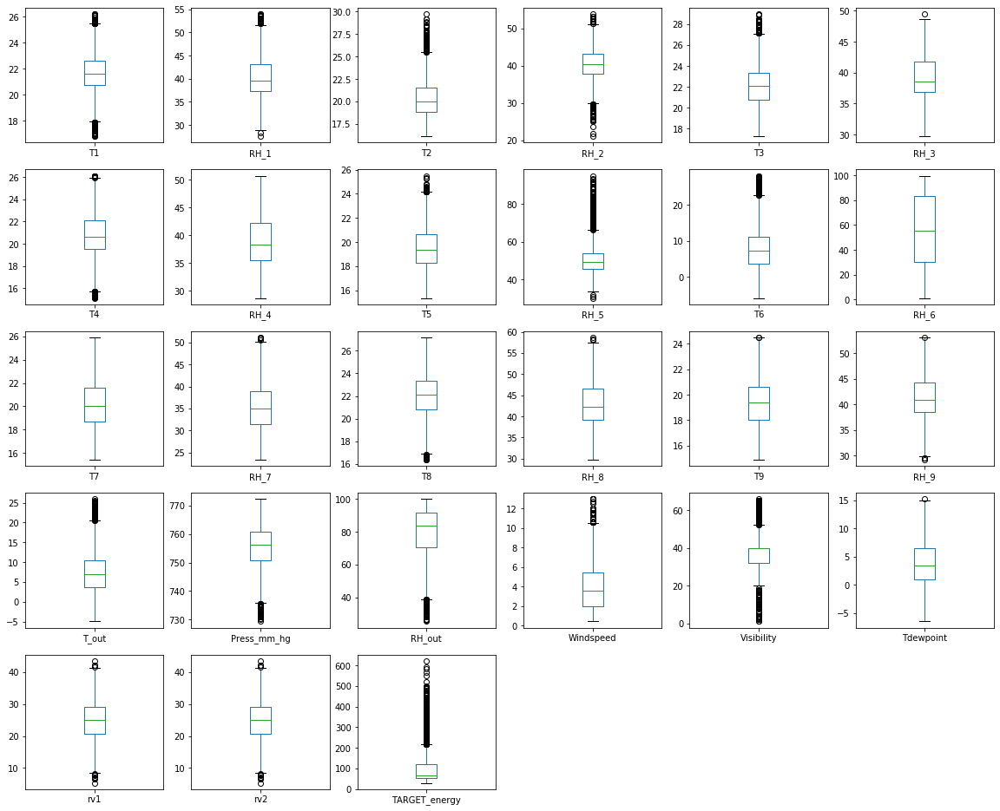

In [8]:
#Plotting boxplot to check the distribution and presence of outliers
plt.figure()
data.plot(kind= 'box',subplots=True, layout=(6,6), sharex=False, sharey=False, figsize=(20,20))
plt.show()

In [9]:
#Extracting useful features from date variable
data = data.reset_index()
data['Hour'] = data['date'].dt.hour
data['Day'] = data['date'].dt.day
data['Month'] = data['date'].dt.month
data['dayofweek_num']=data['date'].dt.dayofweek
data.loc[data['dayofweek_num'] <= 4, 'Weekend'] = 0 #Weekday
data.loc[data['dayofweek_num'] > 4, 'Weekend'] = 1 #Weekend

In [10]:
#Drop the date column after extracting important features from it
data= data.drop(columns = ['date'], axis=1)

Plotting covariance matrix of all variables to understand the correlation among them

<Figure size 1440x1440 with 0 Axes>

Text(0.5, 1, 'Covariance matrix showing correlation coefficients')

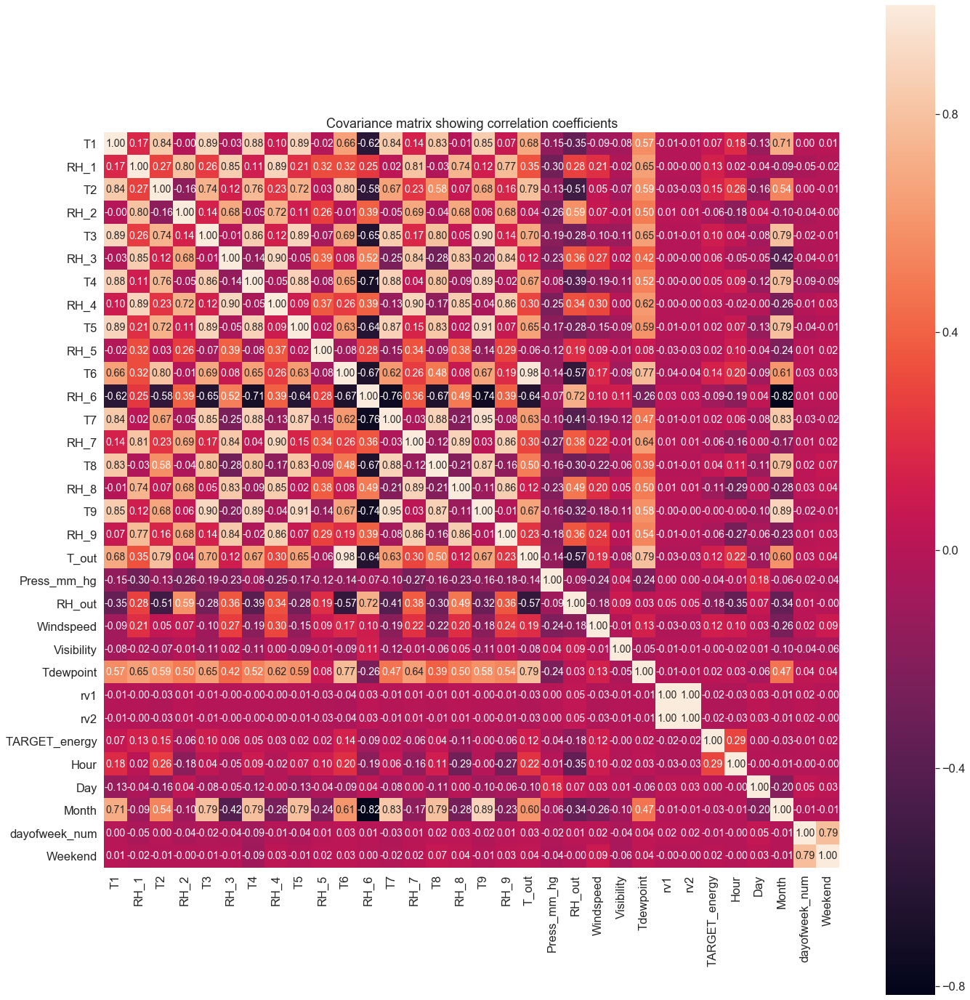

In [11]:
#Scale the data to plot covariance matrix 
from sklearn.preprocessing import StandardScaler
stdsc = StandardScaler()
X_std = stdsc.fit_transform(data)

cols = data.columns
cov_mat =np.cov(X_std.T)

plt.figure(figsize=(20,20))
sns.set(font_scale=1.5)
hm = sns.heatmap(cov_mat, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 14}, yticklabels=cols,
                 xticklabels=cols)

plt.title('Covariance matrix showing correlation coefficients')
plt.tight_layout()
plt.show()

Covariance matrix shows multi collinearity and some features which are poorly correlated with target variables. Therefore, feature selection is required.

In [12]:
#Splitting Independent features and dependent feature
X = data.drop('TARGET_energy', axis=1)
Y = data[['TARGET_energy']]

#Splitting Independent features and dependent feature
X1 = data_NN.drop('TARGET_energy', axis=1)
Y1 = data_NN[['TARGET_energy']]

### Feature Scaling and Feature Selection

Feature Scaling - Using minmaxscaler to deal with outliers and varying scale of data.

In [13]:
from sklearn.preprocessing import MinMaxScaler

#Applying MinMaxScaler
sc = MinMaxScaler()
scale_X = sc.fit_transform(X)
scale_X1 = sc.fit_transform(X1)

#Converting array to dataframe for further use
scale_X= pd.DataFrame(scale_X)
scale_X.columns = X.columns

Feature Selection - Using Lasso Regularization to drop the features which are highly correlated with each other 
and features that does not provide any important information towards predicting target variable.

Text(0.5, 1.0, 'Coefficients in the Lasso Model')

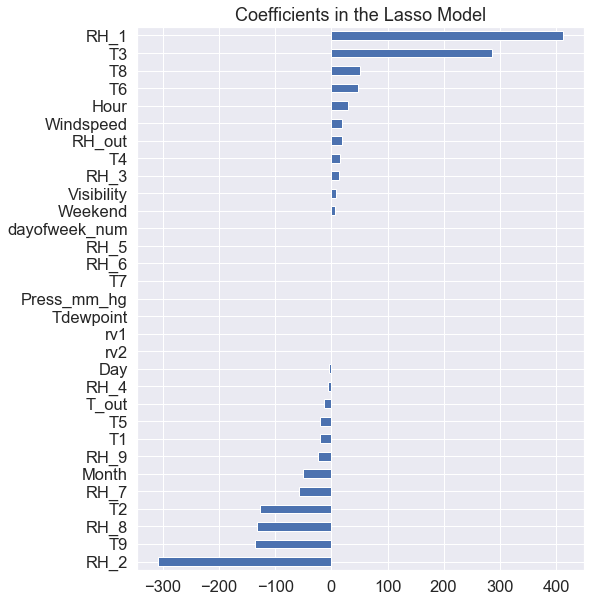

In [14]:
from sklearn.linear_model import LassoCV

#Fit model with LASSO regularization with different alpha values
model_lasso = LassoCV(alphas = [1, 0.1, 0.001]).fit(scale_X, Y)
coef = pd.Series(model_lasso.coef_, index = scale_X.columns)

#Make dataframe with coefficient values 
imp_coef = pd.concat([coef.sort_values().head(15), coef.sort_values().tail(16)])

#Plot feature importance
plt.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model")

In [15]:
#Setting threshold to drop less important features
imp_coef = imp_coef.reset_index()
imp_coef= imp_coef.loc[(imp_coef[0] > 10) | (imp_coef[0] < -10)]

In [16]:
#Reshape the scaled dataframe
cols_filt = imp_coef['index'] 
X = scale_X.filter(cols_filt)
X.shape

(3290, 19)

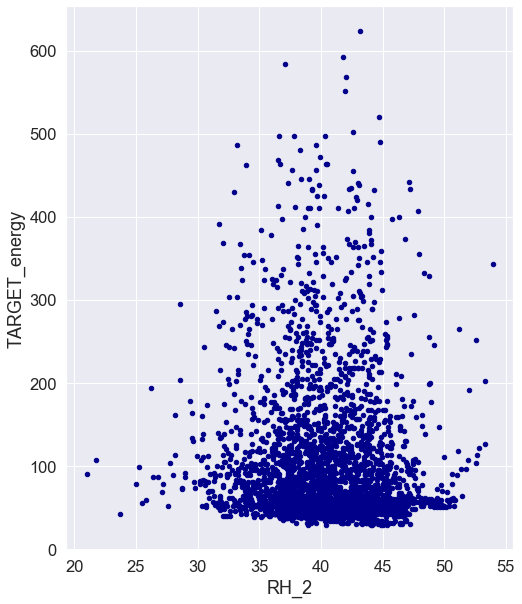

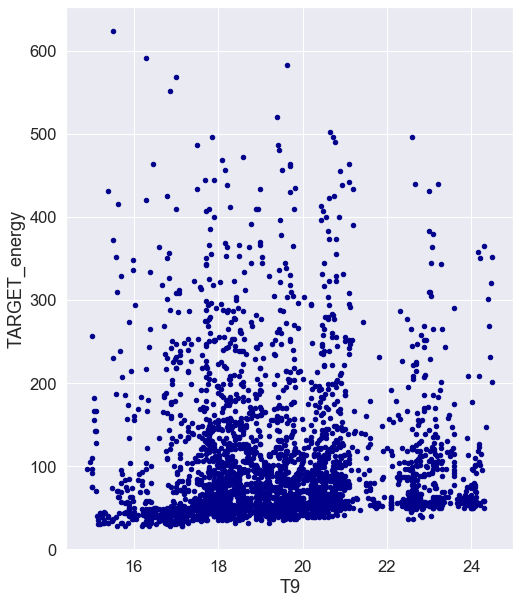

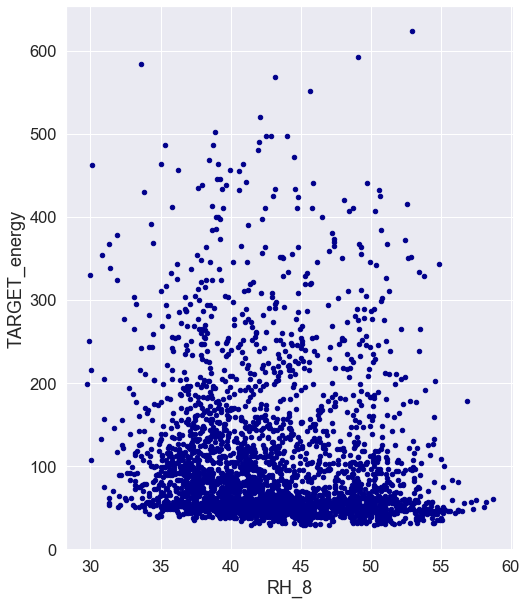

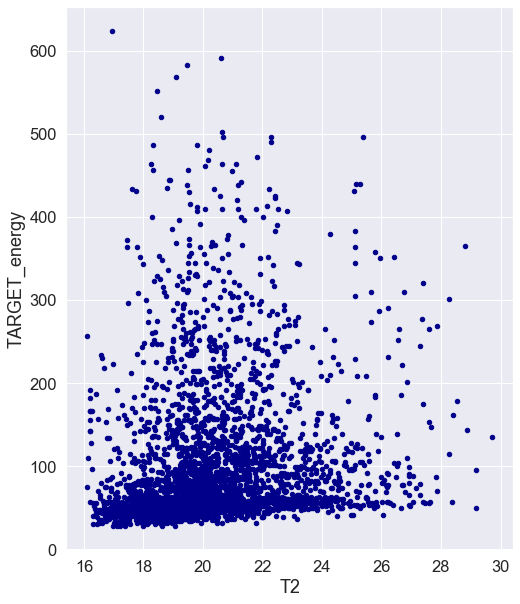

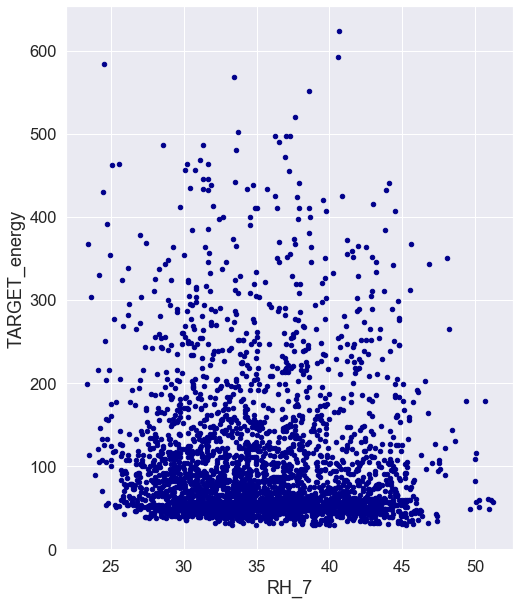

...

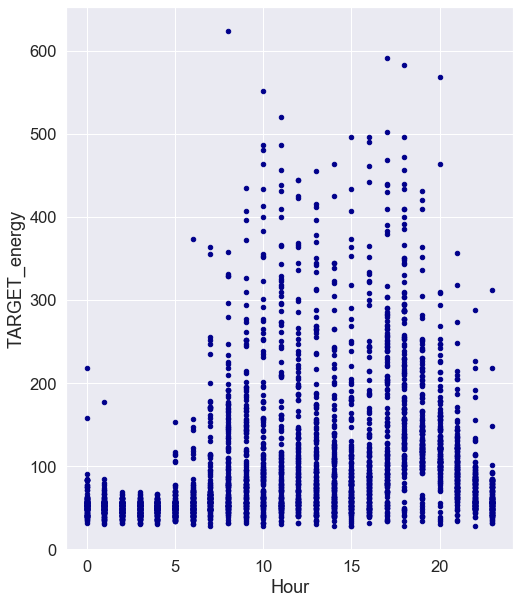

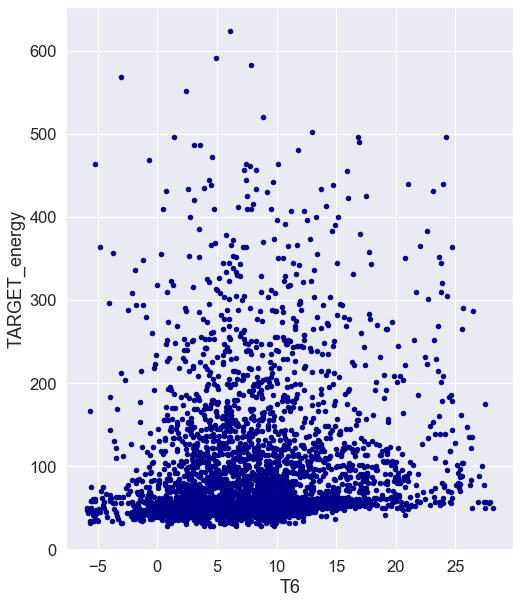

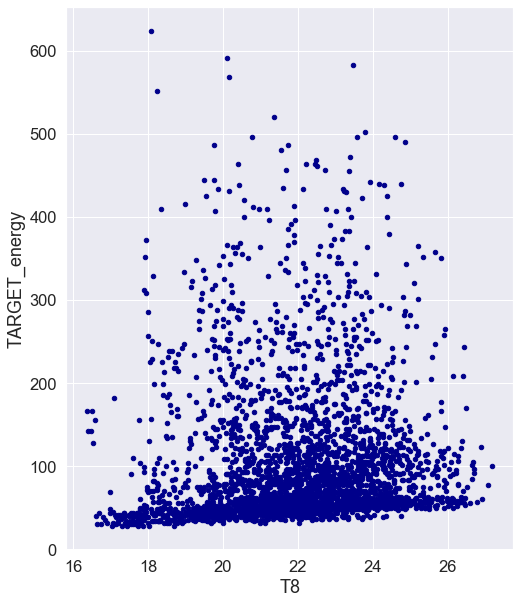

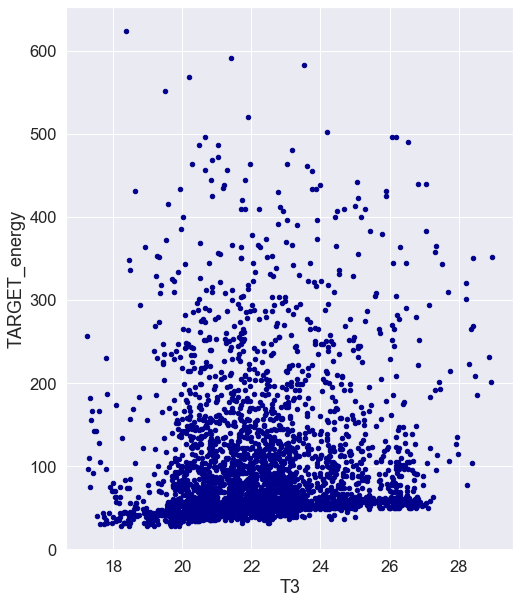

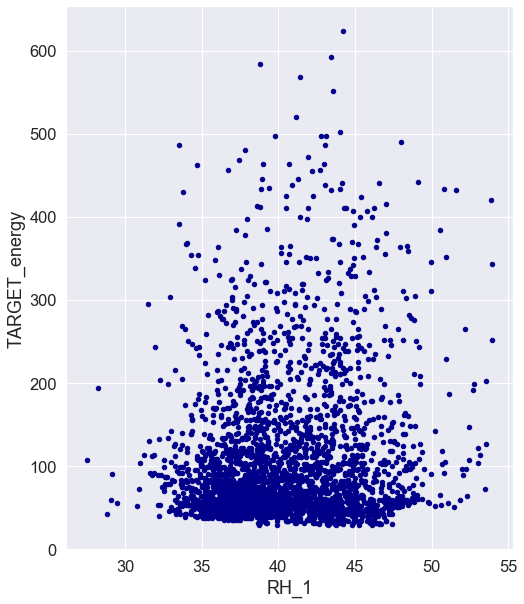

In [17]:
#Scatter plot of important features with target energy usage to understand the distribution
cols1 = X.columns

for col in cols1:
    data.plot.scatter(x = col, y = 'TARGET_energy', c = 'DarkBlue')
    plt.show()

### Data Modelling

In [18]:
from sklearn.model_selection import train_test_split

def train_val_test_split(split1, split2, X):
    trainX1, testX1, trainY1, testY1 = train_test_split(np.array(X), np.array(Y), test_size = split1 , random_state = 0 )
    trainX, testX, trainY, testY = train_test_split(np.array(trainX1), np.array(trainY1), test_size = split2, random_state = 0 )
    
    print('Training dataset size:')
    print(trainX.shape)
    print(trainY.shape)
    
    print('Validation dataset size:')
    print(testX.shape)
    print(testY.shape)
    
    print('Testing dataset size:')
    print(testX1.shape)
    print(testY1.shape)
    
    return trainX, trainY, testX, testY, testX1, testY1

In [38]:
#Function for to calculate model evaluation scores

from sklearn.metrics import mean_squared_error, mean_absolute_error

def evaluate_model(model, test_x, test_y):
    predY = model.predict(test_x)
    mae = mean_absolute_error(test_y, predY)
    train_acc =  model.score(trainX, trainY)
    test_acc = model.score(test_x, test_y)
    
    print("MAE = {}".format(mae))
    print("Train Accuracy = {}".format(train_acc))
    print("Test Accuracy = {}".format(test_acc))
    
    print("Actual Vs Predicted Plot")
    plt.scatter(x = test_y, y = predY, c = 'DarkBlue')
    plt.ylabel('Predicted Values')
    plt.xlabel('Actual Values')
    plt.show() 
    
    return mae, train_acc, test_acc

In [20]:
#Function to plot learning curve of the models 
from sklearn.model_selection import learning_curve

def learning_curve_show(model, trainX, trainY, train_size):
    
    train_sizes,train_scores, test_scores = learning_curve(model, trainX, trainY, 
                                                      train_sizes= train_size, cv=10)
    
    #mean and std of scores over 5 fold cv
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    #Plot the training and validation scores
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
                 label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
                 label="Cross-validation score")

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                    train_scores_mean + train_scores_std, alpha = 0.2, color = "r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                    test_scores_mean + test_scores_std, alpha = 0.2, color = "g")

    plt.legend(loc="best")
    plt.xlabel("Training size")
    plt.ylabel("Accuracy")
    plt.show()

In [21]:
#Function to plot validation curve of the models

from sklearn.model_selection import validation_curve

def validation_curve_show(model, params, param_range_VC, param_name_VC, trainX, trainY):
    train_scores, test_scores = validation_curve(model, 
                                            trainX, trainY,
                                            param_name = param_name_VC,
                                            param_range = param_range_VC,
                                            cv = 10)
    
    #max score from 10 fold cv splits
    train_score_max = np.max(train_scores, axis = 1)
    test_score_max = np.max(test_scores, axis = 1)
    
    #plot training and validation scores with C param value
    fig = plt.figure(figsize = (8,6), dpi= 100)
    plt.plot(param_range_VC, train_score_max, label = 'Training Score', color = "r")
    plt.plot(param_range_VC, test_score_max, label = 'Cross Validation Scores', color = "g")

    plt.xlabel(param_name_VC)
    plt.ylabel('Accuracy')
    plt.legend(loc= "best")
    plt.show()

### Implementation of SVM

In [22]:
#Function to tune hyper parameter of SVM using gridsearchCV and fit the model using best parameter set
from sklearn import svm

    
def svm_model(svm_para):
    best_param_Set = {}
    model = svm.SVR()  
    Regressor_svr = GridSearchCV(model, svm_para, cv=5)
    Regressor_svr.fit(trainX, trainY)
    
    print("Best parameters set found on development set:")
    best_param_Set = Regressor_svr.best_params_
    print(Regressor_svr.best_params_)
    print("")
    
    #Train the model with the best parameter set found
    model_final = svm.SVR( C = Regressor_svr.best_params_['C'],
                      epsilon = Regressor_svr.best_params_['epsilon'], kernel = Regressor_svr.best_params_['kernel'], 
                      gamma = Regressor_svr.best_params_['gamma'])
    model_final.fit(trainX, trainY)

    #calculate the evaluation scores of the model
    print("Evaluation Scores for SVM model:")
    mae, train_acc, test_acc = evaluate_model(model_final, testX, testY)
    
    
    return best_param_Set, model_final

In [23]:
#Function to run SVM regressor
def run_svm(trainX, trainY, testX, testY, train_size):
    best_param = {}
    #Setting parameter grid for tuning
    svm_para = {'kernel': ('poly', 'rbf'), 'C': [50, 100], 'gamma' : ('scale', 'auto'), 
            'epsilon': [0.01, 0.1, 0.5]}

    best_param, model_svm = svm_model(svm_para) #Call function that tunes params using gridsearchCV
    
    #Plotting learning curve of the model trained with best parameter set found
    learning_curve_show(model_svm, trainX, trainY, train_size)
    
     #Plotting validation curve of the model trained with best parameter set found
    C_range = np.linspace(1,150,10).astype('int')
    validation_curve_show(model_svm, best_param, C_range, 'C', trainX, trainY)
    
    #Evaluation scores on unseen data
    print("Evaluation Scores for SVM model on Unseen Data:")
    mae, train_acc, test_acc = evaluate_model(model_svm, testX1, testY1)
    
    
    

Training dataset size:
(1579, 19)
(1579, 1)
Validation dataset size:
(1053, 19)
(1053, 1)
Testing dataset size:
(658, 19)
(658, 1)
Best parameters set found on development set:
{'C': 100, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'poly'}

Evaluation Scores for SVM model:
MAE = 37.225691785618515
Train Accuracy = 0.35212230887187534
Test Accuracy = 0.31006572499330887
Actual Vs Predicted Plot


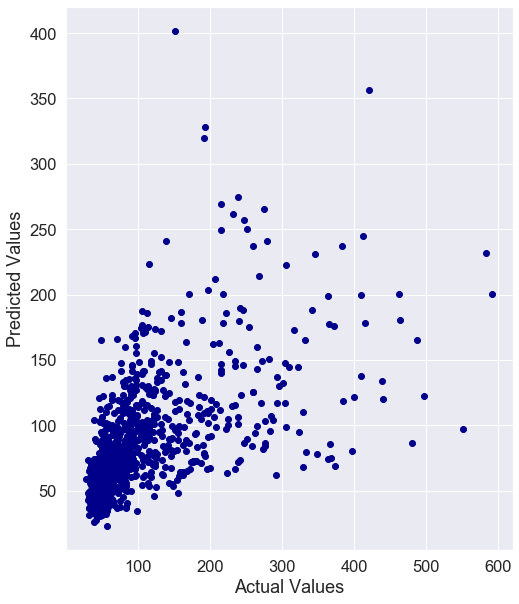

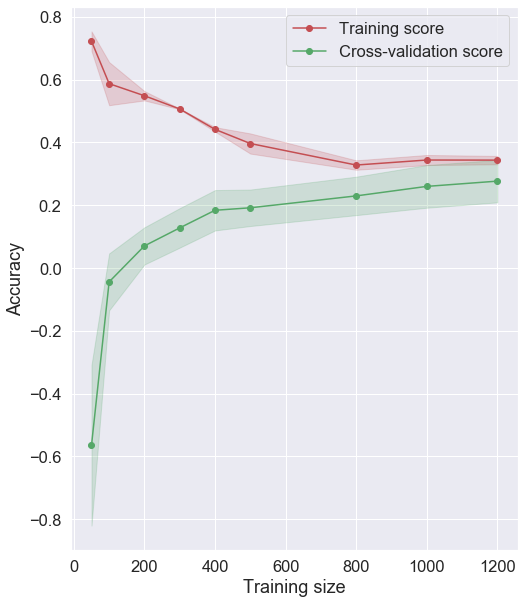

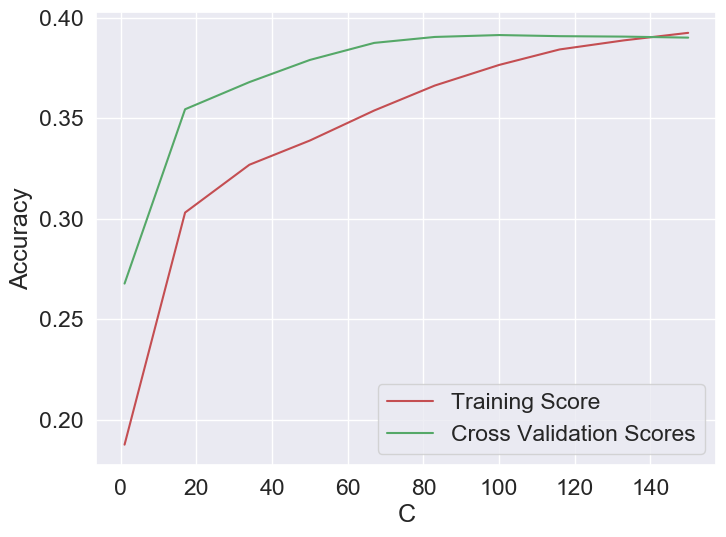

Evaluation Scores for SVM model on Unseen Data:
MAE = 36.91614555851147
Train Accuracy = 0.35212230887187534
Test Accuracy = 0.34965481220625105
Actual Vs Predicted Plot


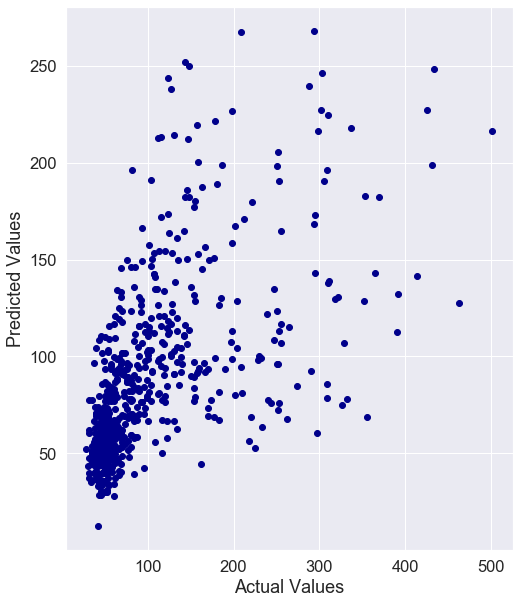

In [42]:
#split the data into train, validation adn test set
trainX, trainY, testX, testY, testX1, testY1 = train_val_test_split(0.2, 0.4, X)
#run the SVM regressor
train_size = [50, 100, 200, 300, 400, 500, 800, 1000, 1200]
run_svm(trainX, trainY, testX, testY, train_size)


Training dataset size:
(2236, 19)
(2236, 1)
Validation dataset size:
(560, 19)
(560, 1)
Testing dataset size:
(494, 19)
(494, 1)
Best parameters set found on development set:
{'C': 100, 'epsilon': 0.5, 'gamma': 'scale', 'kernel': 'poly'}

Evaluation Scores for SVM model:
MAE = 34.17809311354036
Train Accuracy = 0.348219182446166
Test Accuracy = 0.3581461844349386
Actual Vs Predicted Plot


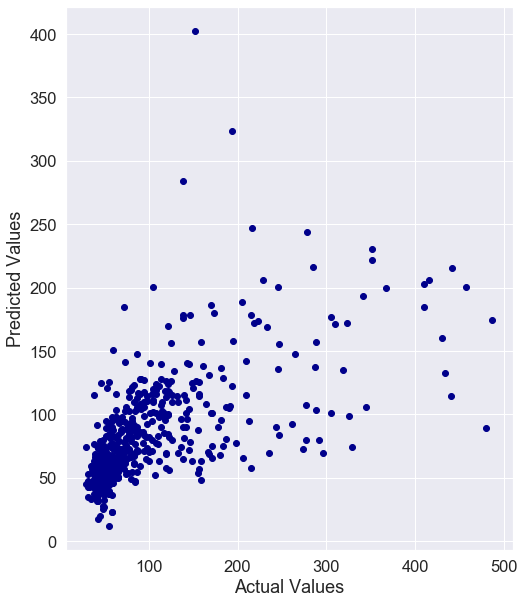

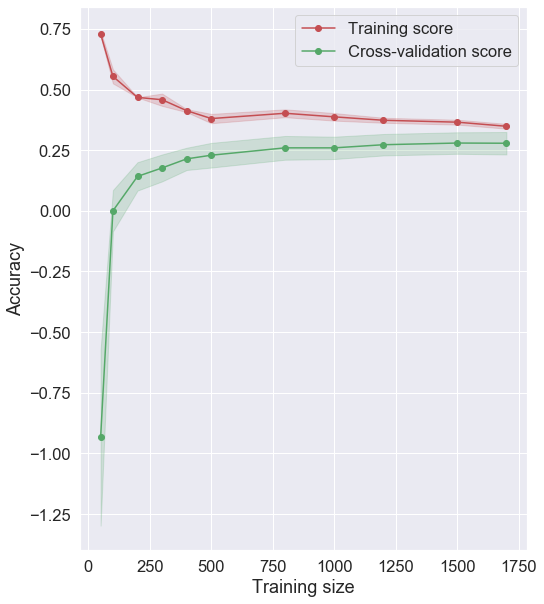

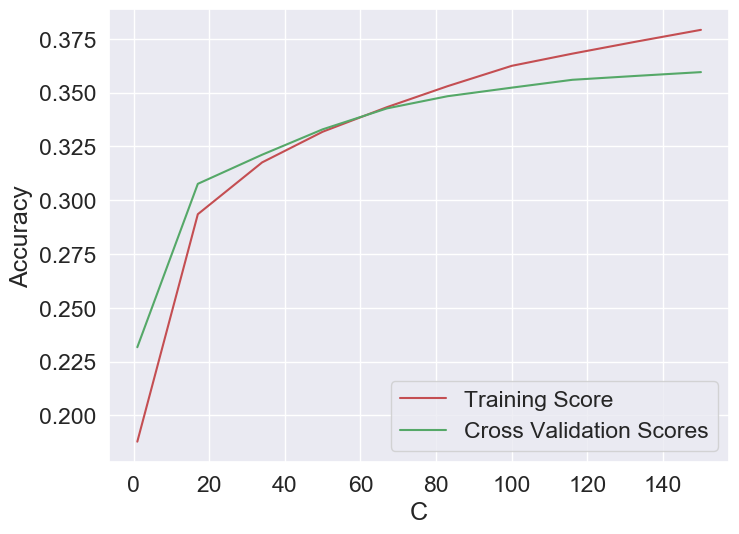

Evaluation Scores for SVM model on Unseen Data:
MAE = 40.087212248619345
Train Accuracy = 0.348219182446166
Test Accuracy = 0.3300367445119664
Actual Vs Predicted Plot


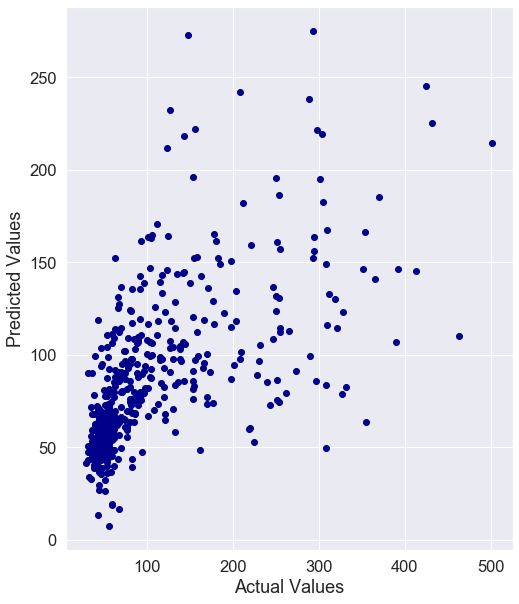

In [41]:
#Change the split value and compare the results
trainX, trainY, testX, testY, testX1, testY1 = train_val_test_split(0.15, 0.2, X)
train_size1= [50, 100, 200, 300, 400, 500, 800, 1000, 1200, 1500, 1700]
run_svm(trainX, trainY, testX, testY, train_size1)

### Implementation of GBM Regressor

In [36]:
#Function to tune hyper parameters of GBM, takes model and parameter grid as input and return best parameter set found

from sklearn import ensemble

params = {'max_depth': range(1,4,1),
          'min_samples_split' : range(100,500, 20)}
def gbm_model(gbm_param, model):
    
    best_param_set = {}

    Regressor = GridSearchCV(model, gbm_param, cv=5, n_jobs=-1)
    Regressor.fit(trainX, trainY)
    
    print("Best parameters set found on development set:")
    best_param_set = Regressor.best_params_
    print(Regressor.best_params_)
    
    return best_param_set

In [37]:
#Function to run GBM Regressor, takes train and validation data as input, train the model using best parameter set found via gridsearchCV and evaluate by learning and validation curve

def run_gbm(trainX, trainY, testX, testY, train_size):
    best_param = {}
    best_param2= {}
    
    #Tree based parameter grid for tuning
    gbm_para1 = {
          'max_depth': range(1,4,1),
          'min_samples_split' : range(100,500, 20)}
    model1 = ensemble.GradientBoostingRegressor(random_state = 0, max_features = 'sqrt')
    
    best_param1 = gbm_model(gbm_para1, model1) #Call function that tunes params using gridsearchCV
    
    #Boosting parameter grid for tuning
    gbm_para2 = {
        'learning_rate': [0.01, 0.05, 0.1, 0.3, 0.5],
        'n_estimators': [25, 50, 80] ,
        'subsample' : [0.7, 0.8, 1],
        'loss' : ['ls', 'lad']
    }

    model2 = ensemble.GradientBoostingRegressor(random_state = 0, max_depth = best_param1['max_depth'], 
                                                 min_samples_split = best_param1['min_samples_split'])
    best_param2 = gbm_model(gbm_para2, model2) #Call function that tunes params using gridsearchCV
    
    #Train the model using best parameters picked
    model_gbm2 = ensemble.GradientBoostingRegressor( loss = best_param2['loss'], max_features = 'sqrt', 
                                       random_state = 0, max_depth = best_param1['max_depth'] ,
                                       min_samples_split = best_param1['min_samples_split'], 
                                       learning_rate = best_param2['learning_rate'], subsample= best_param2['subsample'], 
                                       n_estimators = best_param2['n_estimators'])
    model_gbm2.fit(trainX, trainY)
    
    #Evaluation scores of GBM model on validation data
    print("Evaluation Scores for GBM model on Validation Data:")
    mae, train_acc, test_acc = evaluate_model(model_gbm2, testX, testY)
    
    #Plotting learning curve of the model trained with best parameter set found
    learning_curve_show(model_gbm2, trainX, trainY, train_size)
    
    #Plotting validation curve of the model trained with best parameter set found
    n_estimators_range = np.linspace(1,100,10).astype('int')
    validation_curve_show(model_gbm2, best_param2, n_estimators_range, 'n_estimators', trainX, trainY)
    
    #Evaluation scores of GBM Model on unseen data
    print("Evaluation Scores for GBM model on Unseen Data:")
    mae, train_acc, test_acc = evaluate_model(model_gbm2, testX1, testY1)
    

Training dataset size:
(1579, 19)
(1579, 1)
Validation dataset size:
(1053, 19)
(1053, 1)
Testing dataset size:
(658, 19)
(658, 1)
Best parameters set found on development set:
{'max_depth': 3, 'min_samples_split': 100}
Best parameters set found on development set:
{'learning_rate': 0.3, 'loss': 'ls', 'n_estimators': 50, 'subsample': 0.8}
Evaluation Scores for GBM model on Validation Data:
MAE = 42.87674808103327
Train Accuracy = 0.5671134705649656
Test Accuracy = 0.30801039883716075
Actual Vs Predicted Plot


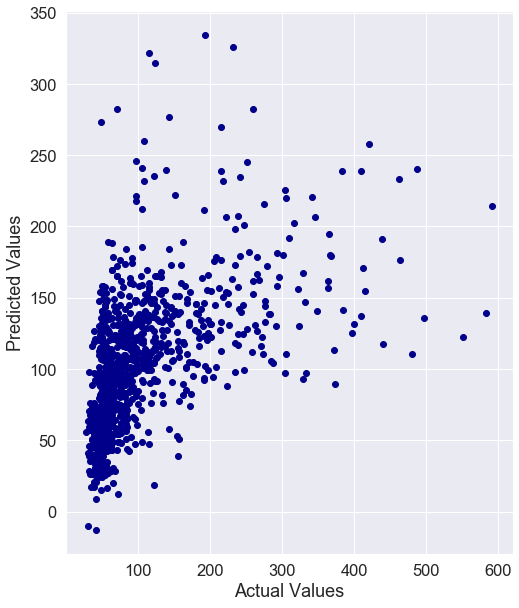

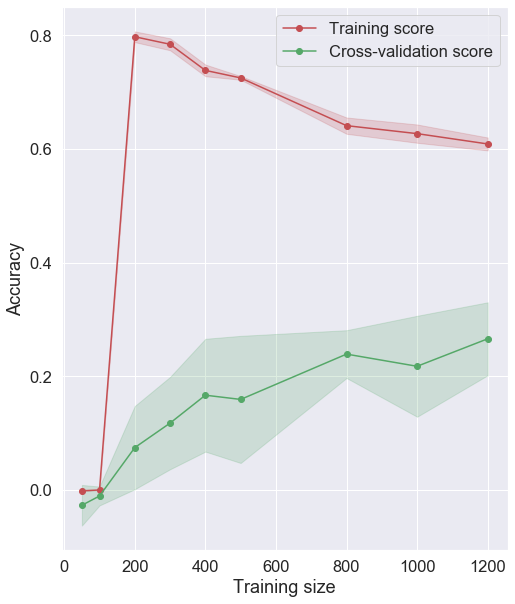

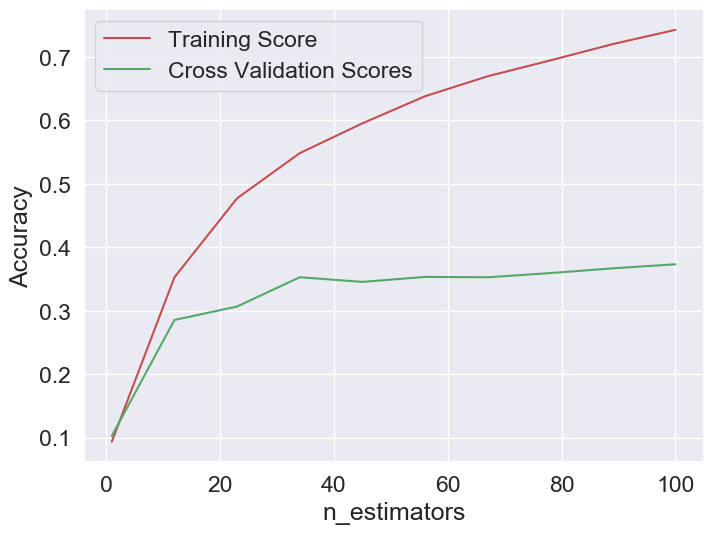

Evaluation Scores for GBM model on Unseen Data:
MAE = 42.69818922685053
Train Accuracy = 0.5671134705649656
Test Accuracy = 0.29528104932254307
Actual Vs Predicted Plot


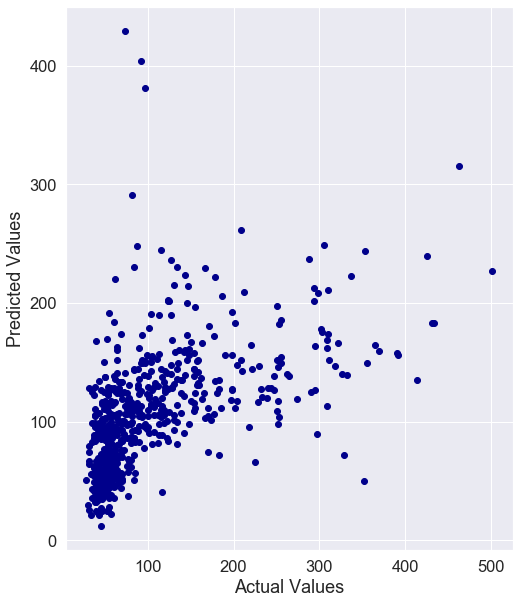

In [39]:
#split the data into train, validation adn test set
trainX, trainY, testX, testY, testX1, testY1 = train_val_test_split(0.2, 0.4,X)
#run the GBM regressor for split1
train_size = [50, 100, 200, 300, 400, 500, 800, 1000, 1200]
run_gbm(trainX, trainY, testX, testY, train_size)


Training dataset size:
(2236, 19)
(2236, 1)
Validation dataset size:
(560, 19)
(560, 1)
Testing dataset size:
(494, 19)
(494, 1)
Best parameters set found on development set:
{'max_depth': 3, 'min_samples_split': 100}
Best parameters set found on development set:
{'learning_rate': 0.3, 'loss': 'ls', 'n_estimators': 80, 'subsample': 1}
Evaluation Scores for GBM model on Validation Data:
MAE = 38.57045526340702
Train Accuracy = 0.6558685590435622
Test Accuracy = 0.3940352860420884
Actual Vs Predicted Plot


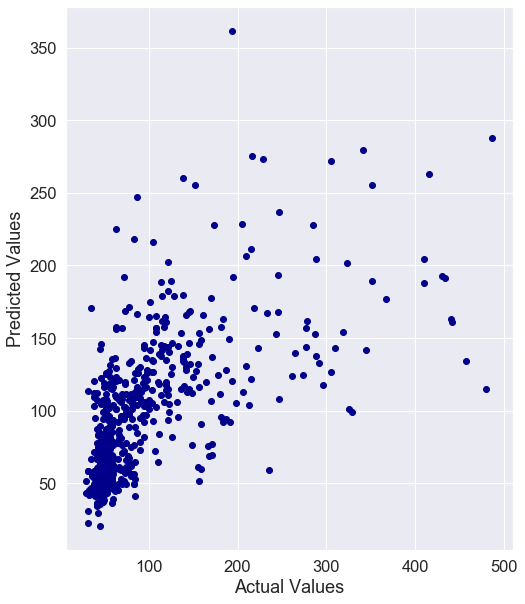

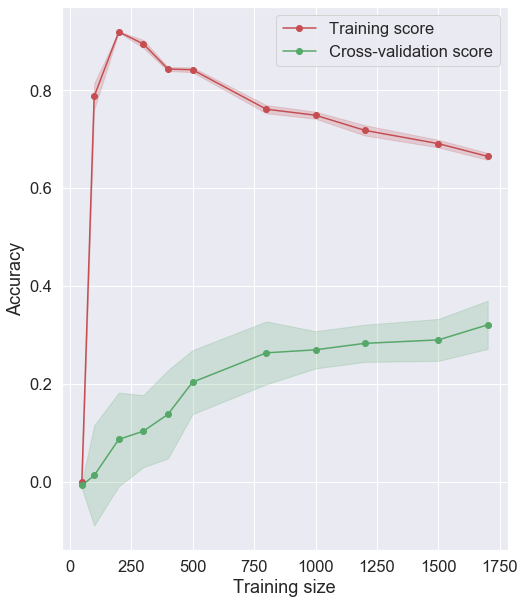

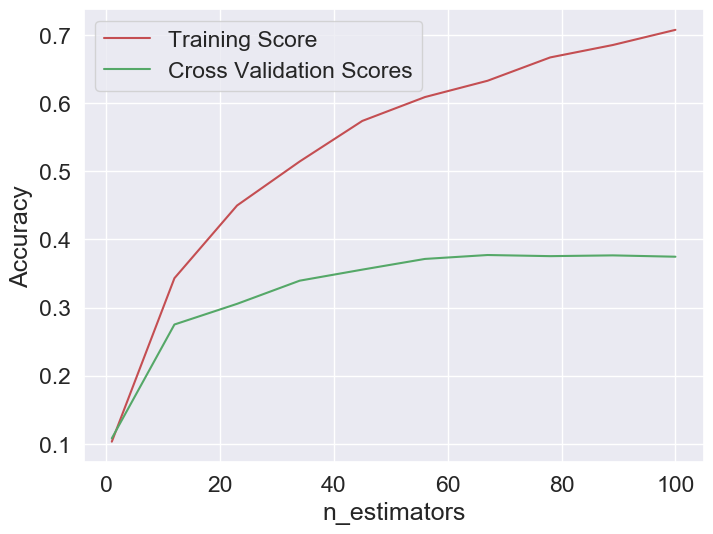

Evaluation Scores for GBM model on Unseen Data:
MAE = 41.30370247008206
Train Accuracy = 0.6558685590435622
Test Accuracy = 0.44068715357493
Actual Vs Predicted Plot


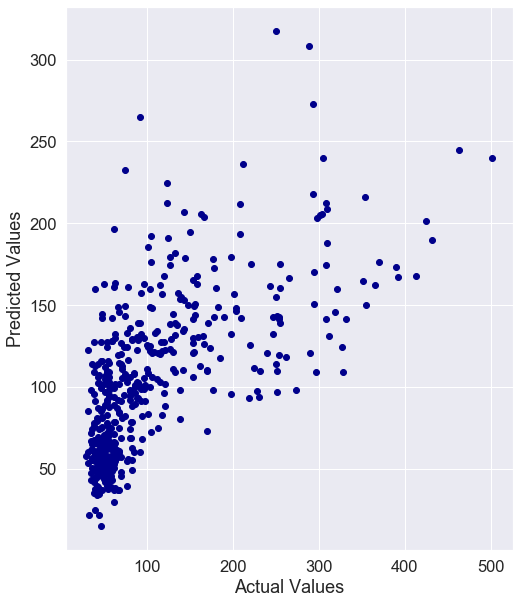

In [40]:
#split the data into train, validation adn test set
trainX, trainY, testX, testY, testX1, testY1 = train_val_test_split(0.15, 0.2, X)
#run the GBM regressor for split2
train_size = [50, 100, 200, 300, 400, 500, 800, 1000, 1200, 1500, 1700]
run_gbm(trainX, trainY, testX, testY, train_size)


### Implementation of RNN LSTM Model

In [27]:
#split the data into train, validation and test set
trainX, trainY, testX, testY, testX1, testY1 = train_val_test_split(0.15, 0.2, scale_X1)

Training dataset size:
(2236, 26)
(2236, 1)
Validation dataset size:
(560, 26)
(560, 1)
Testing dataset size:
(494, 26)
(494, 1)


In [28]:
# reshape input to be 3D [samples, timesteps, features]
trainX = trainX.reshape((trainX.shape[0], 1, trainX.shape[1]))
testX = testX.reshape((testX.shape[0], 1, testX.shape[1]))
testY = testY.reshape((testY.shape[0], 1, testY.shape[1]))
trainY = trainY.reshape((trainY.shape[0], 1, trainY.shape[1]))
testX1 = testX1.reshape((testX1.shape[0], 1, testX1.shape[1]))
testY1 = testY1.reshape((testY1.shape[0], 1, testY1.shape[1]))

In [29]:
from keras import optimizers
from keras.optimizers import SGD, Adam
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping
from keras.wrappers.scikit_learn import KerasRegressor

def Lstm_model(lr = 0.01, neurons = 80, activation = 'relu'):
    #Adding call back function
    earlystop = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=80,  verbose=1, mode='min')
    callbacks_list = [earlystop]
    
    model = Sequential()
    
    #Input Layer and hidden layers
    model.add((LSTM(neurons, activation = activation, init= 'uniform', return_sequences=True, 
                    input_shape=(trainX.shape[1], trainX.shape[2]))))
    model.add(Dropout(0.2))
    
    model.add((LSTM(neurons, activation = activation, init= 'uniform', return_sequences=True)))
    model.add(Dropout(0.3))
    
    model.add((LSTM(neurons, activation = activation, init= 'uniform', return_sequences=True)))
    model.add(Dropout(0.4))
    
    #output layer
    model.add(Dense(1))
    
    adam=optimizers.Adam(lr= lr, epsilon=10E-8, amsgrad=True)
    model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mae'])
    
    return model

Using TensorFlow backend.


In [182]:
# create the sklearn model for the network
model_CV = KerasRegressor(build_fn=Lstm_model, verbose=1)

In [183]:
# grid search for batch size and number of epochs
param_grid = {'epochs' : [500, 1000, 1500], 'batch_size' : [128, 264, 512]}
lstm_reg1 = GridSearchCV(estimator=model_CV, 
                    param_grid=param_grid,
                    cv=3)
lstm_final = lstm_reg1.fit(trainX, trainY)
print("Best parameters set found on development set:")
print(lstm_final.best_params_)

Epoch 1/500
1490/1490 [==============================] - 1s 740us/step - loss: 100.9938 - mae: 100.9938
Epoch 2/500
1490/1490 [==============================] - 0s 181us/step - loss: 100.9250 - mae: 100.9250
Epoch 3/500
1490/1490 [==============================] - 0s 184us/step - loss: 100.6211 - mae: 100.6211
Epoch 4/500
1490/1490 [==============================] - 0s 195us/step - loss: 98.0947 - mae: 98.0947
Epoch 5/500
1490/1490 [==============================] - 0s 189us/step - loss: 76.0069 - mae: 76.0069
Epoch 6/500
1490/1490 [==============================] - 0s 182us/step - loss: 57.8098 - mae: 57.8098
Epoch 7/500
1490/1490 [==============================] - 0s 185us/step - loss: 55.6283 - mae: 55.6283
Epoch 8/500
1490/1490 [==============================] - 0s 205us/step - loss: 54.1060 - mae: 54.1060
Epoch 9/500
1490/1490 [==============================] - 0s 178us/step - loss: 53.9841 - mae: 53.9841
Epoch 10/500
1490/1490 [==============================] - 0s 178us/step - lo

1490/1490 [==============================] - 0s 212us/step - loss: 44.1128 - mae: 44.1128
Epoch 159/500
1490/1490 [==============================] - 0s 235us/step - loss: 45.4117 - mae: 45.4117
Epoch 160/500
1490/1490 [==============================] - 0s 237us/step - loss: 44.7641 - mae: 44.7641
Epoch 161/500
1490/1490 [==============================] - 0s 238us/step - loss: 44.7258 - mae: 44.7258
Epoch 162/500
1490/1490 [==============================] - 0s 237us/step - loss: 44.5599 - mae: 44.5599
Epoch 163/500
1490/1490 [==============================] - 0s 232us/step - loss: 43.8148 - mae: 43.8148
Epoch 164/500
1490/1490 [==============================] - 0s 224us/step - loss: 44.7046 - mae: 44.7046
Epoch 165/500
1490/1490 [==============================] - 0s 239us/step - loss: 44.7823 - mae: 44.7823
Epoch 166/500
1490/1490 [==============================] - 0s 231us/step - loss: 44.4156 - mae: 44.4156
Epoch 167/500
1490/1490 [==============================] - 0s 241us/step - los

1490/1490 [==============================] - 0s 169us/step - loss: 43.1557 - mae: 43.1557
Epoch 315/500
1490/1490 [==============================] - 0s 171us/step - loss: 43.0795 - mae: 43.0795
Epoch 316/500
1490/1490 [==============================] - 0s 169us/step - loss: 43.3838 - mae: 43.3838
Epoch 317/500
1490/1490 [==============================] - 0s 168us/step - loss: 43.1718 - mae: 43.1718
Epoch 318/500
1490/1490 [==============================] - 0s 171us/step - loss: 42.4224 - mae: 42.4224
Epoch 319/500
1490/1490 [==============================] - 0s 165us/step - loss: 42.5319 - mae: 42.5319
Epoch 320/500
1490/1490 [==============================] - 0s 160us/step - loss: 42.8990 - mae: 42.8990
Epoch 321/500
1490/1490 [==============================] - 0s 182us/step - loss: 42.6119 - mae: 42.6119
Epoch 322/500
1490/1490 [==============================] - 0s 195us/step - loss: 42.9555 - mae: 42.9554
Epoch 323/500
1490/1490 [==============================] - 0s 189us/step - los

1490/1490 [==============================] - 0s 152us/step - loss: 40.9535 - mae: 40.9535
Epoch 471/500
1490/1490 [==============================] - 0s 155us/step - loss: 41.9411 - mae: 41.9411
Epoch 472/500
1490/1490 [==============================] - 0s 153us/step - loss: 41.4648 - mae: 41.4648
Epoch 473/500
1490/1490 [==============================] - 0s 154us/step - loss: 41.7866 - mae: 41.7866
Epoch 474/500
1490/1490 [==============================] - 0s 154us/step - loss: 41.0709 - mae: 41.0709
Epoch 475/500
1490/1490 [==============================] - 0s 158us/step - loss: 41.4366 - mae: 41.4366
Epoch 476/500
1490/1490 [==============================] - 0s 163us/step - loss: 40.8711 - mae: 40.8711
Epoch 477/500
1490/1490 [==============================] - 0s 167us/step - loss: 41.2771 - mae: 41.2771
Epoch 478/500
1490/1490 [==============================] - 0s 171us/step - loss: 41.6770 - mae: 41.6770
Epoch 479/500
1490/1490 [==============================] - 0s 167us/step - los

1491/1491 [==============================] - 1s 372us/step - loss: 46.0550 - mae: 46.0550
Epoch 128/500
1491/1491 [==============================] - 1s 340us/step - loss: 45.9569 - mae: 45.9569
Epoch 129/500
1491/1491 [==============================] - 0s 229us/step - loss: 46.3556 - mae: 46.3556
Epoch 130/500
1491/1491 [==============================] - 0s 255us/step - loss: 45.9439 - mae: 45.9439
Epoch 131/500
1491/1491 [==============================] - 0s 251us/step - loss: 46.7220 - mae: 46.7220
Epoch 132/500
1491/1491 [==============================] - 0s 256us/step - loss: 47.0594 - mae: 47.0593
Epoch 133/500
1491/1491 [==============================] - 0s 251us/step - loss: 45.8938 - mae: 45.8938
Epoch 134/500
1491/1491 [==============================] - 0s 254us/step - loss: 45.7107 - mae: 45.7107
Epoch 135/500
1491/1491 [==============================] - 0s 227us/step - loss: 46.4717 - mae: 46.4717
Epoch 136/500
1491/1491 [==============================] - 0s 191us/step - los

1491/1491 [==============================] - 0s 231us/step - loss: 44.3447 - mae: 44.3447
Epoch 284/500
1491/1491 [==============================] - 0s 234us/step - loss: 44.3031 - mae: 44.3031
Epoch 285/500
1491/1491 [==============================] - 0s 231us/step - loss: 43.8002 - mae: 43.8002
Epoch 286/500
1491/1491 [==============================] - 0s 227us/step - loss: 43.2137 - mae: 43.2137
Epoch 287/500
1491/1491 [==============================] - 0s 229us/step - loss: 44.3313 - mae: 44.3313
Epoch 288/500
1491/1491 [==============================] - 0s 233us/step - loss: 43.5594 - mae: 43.5594
Epoch 289/500
1491/1491 [==============================] - 0s 235us/step - loss: 43.7450 - mae: 43.7450
Epoch 290/500
1491/1491 [==============================] - 0s 231us/step - loss: 43.8354 - mae: 43.8354
Epoch 291/500
1491/1491 [==============================] - 0s 235us/step - loss: 43.7894 - mae: 43.7894
Epoch 292/500
1491/1491 [==============================] - 0s 237us/step - los

1491/1491 [==============================] - 0s 227us/step - loss: 42.6676 - mae: 42.6676
Epoch 440/500
1491/1491 [==============================] - 0s 225us/step - loss: 42.5311 - mae: 42.5311
Epoch 441/500
1491/1491 [==============================] - 0s 233us/step - loss: 42.3407 - mae: 42.3407
Epoch 442/500
1491/1491 [==============================] - 0s 231us/step - loss: 43.1790 - mae: 43.1790
Epoch 443/500
1491/1491 [==============================] - 0s 231us/step - loss: 42.8464 - mae: 42.8464
Epoch 444/500
1491/1491 [==============================] - 0s 228us/step - loss: 42.2657 - mae: 42.2657
Epoch 445/500
1491/1491 [==============================] - 0s 233us/step - loss: 42.5371 - mae: 42.5371
Epoch 446/500
1491/1491 [==============================] - 0s 234us/step - loss: 42.4301 - mae: 42.4301
Epoch 447/500
1491/1491 [==============================] - 0s 223us/step - loss: 42.2324 - mae: 42.2324
Epoch 448/500
1491/1491 [==============================] - 0s 191us/step - los

1491/1491 [==============================] - 0s 230us/step - loss: 47.4992 - mae: 47.4992
Epoch 95/500
1491/1491 [==============================] - 0s 237us/step - loss: 47.3710 - mae: 47.3710
Epoch 96/500
1491/1491 [==============================] - 0s 229us/step - loss: 47.9590 - mae: 47.9590
Epoch 97/500
1491/1491 [==============================] - 0s 234us/step - loss: 47.1427 - mae: 47.1427
Epoch 98/500
1491/1491 [==============================] - 0s 232us/step - loss: 47.5263 - mae: 47.5263
Epoch 99/500
1491/1491 [==============================] - 0s 242us/step - loss: 47.1540 - mae: 47.1540
Epoch 100/500
1491/1491 [==============================] - 0s 234us/step - loss: 46.7198 - mae: 46.7198
Epoch 101/500
1491/1491 [==============================] - 0s 234us/step - loss: 47.2806 - mae: 47.2806
Epoch 102/500
1491/1491 [==============================] - 0s 224us/step - loss: 47.5317 - mae: 47.5317
Epoch 103/500
1491/1491 [==============================] - 0s 235us/step - loss: 46

1491/1491 [==============================] - 0s 243us/step - loss: 43.5205 - mae: 43.5205
Epoch 251/500
1491/1491 [==============================] - 0s 234us/step - loss: 43.7619 - mae: 43.7619
Epoch 252/500
1491/1491 [==============================] - 0s 229us/step - loss: 43.5982 - mae: 43.5982
Epoch 253/500
1491/1491 [==============================] - 0s 219us/step - loss: 43.5169 - mae: 43.5169
Epoch 254/500
1491/1491 [==============================] - 0s 232us/step - loss: 43.8457 - mae: 43.8457
Epoch 255/500
1491/1491 [==============================] - 0s 230us/step - loss: 43.2354 - mae: 43.2354
Epoch 256/500
1491/1491 [==============================] - 0s 236us/step - loss: 43.3689 - mae: 43.3689
Epoch 257/500
1491/1491 [==============================] - 0s 231us/step - loss: 43.3774 - mae: 43.3774
Epoch 258/500
1491/1491 [==============================] - 0s 229us/step - loss: 43.9427 - mae: 43.9427
Epoch 259/500
1491/1491 [==============================] - 0s 231us/step - los

1491/1491 [==============================] - 0s 233us/step - loss: 42.7545 - mae: 42.7545
Epoch 406/500
1491/1491 [==============================] - 0s 238us/step - loss: 41.8884 - mae: 41.8884
Epoch 407/500
1491/1491 [==============================] - 0s 239us/step - loss: 42.0480 - mae: 42.0480
Epoch 408/500
1491/1491 [==============================] - 0s 208us/step - loss: 43.0096 - mae: 43.0096
Epoch 409/500
1491/1491 [==============================] - 0s 193us/step - loss: 42.2331 - mae: 42.2331
Epoch 410/500
1491/1491 [==============================] - 0s 181us/step - loss: 42.1724 - mae: 42.1724
Epoch 411/500
1491/1491 [==============================] - 0s 180us/step - loss: 42.2645 - mae: 42.2645
Epoch 412/500
1491/1491 [==============================] - 0s 185us/step - loss: 42.7237 - mae: 42.7237
Epoch 413/500
1491/1491 [==============================] - 0s 201us/step - loss: 41.9639 - mae: 41.9639
Epoch 414/500
1491/1491 [==============================] - 0s 234us/step - los

Epoch 61/1000
1490/1490 [==============================] - 0s 180us/step - loss: 48.4655 - mae: 48.4655
Epoch 62/1000
1490/1490 [==============================] - 0s 178us/step - loss: 48.2636 - mae: 48.2636
Epoch 63/1000
1490/1490 [==============================] - 0s 169us/step - loss: 47.6949 - mae: 47.6949
Epoch 64/1000
1490/1490 [==============================] - 0s 185us/step - loss: 48.8748 - mae: 48.8748
Epoch 65/1000
1490/1490 [==============================] - 0s 177us/step - loss: 48.2342 - mae: 48.2342
Epoch 66/1000
1490/1490 [==============================] - 0s 183us/step - loss: 47.9149 - mae: 47.9149
Epoch 67/1000
1490/1490 [==============================] - 0s 177us/step - loss: 47.8841 - mae: 47.8841
Epoch 68/1000
1490/1490 [==============================] - 0s 177us/step - loss: 48.2025 - mae: 48.2025
Epoch 69/1000
1490/1490 [==============================] - 0s 191us/step - loss: 47.8689 - mae: 47.8689
Epoch 70/1000
1490/1490 [==============================] - 0s 19

1490/1490 [==============================] - 0s 171us/step - loss: 44.1442 - mae: 44.1442
Epoch 218/1000
1490/1490 [==============================] - 0s 172us/step - loss: 44.5464 - mae: 44.5464
Epoch 219/1000
1490/1490 [==============================] - 0s 172us/step - loss: 44.2610 - mae: 44.2610
Epoch 220/1000
1490/1490 [==============================] - 0s 177us/step - loss: 44.4678 - mae: 44.4678
Epoch 221/1000
1490/1490 [==============================] - 0s 177us/step - loss: 43.9929 - mae: 43.9929
Epoch 222/1000
1490/1490 [==============================] - 0s 174us/step - loss: 43.5155 - mae: 43.5155
Epoch 223/1000
1490/1490 [==============================] - 0s 185us/step - loss: 43.6806 - mae: 43.6806
Epoch 224/1000
1490/1490 [==============================] - 0s 173us/step - loss: 44.0039 - mae: 44.0039
Epoch 225/1000
1490/1490 [==============================] - 0s 187us/step - loss: 44.8027 - mae: 44.8027
Epoch 226/1000
1490/1490 [==============================] - 0s 177us/s

1490/1490 [==============================] - 0s 175us/step - loss: 42.2869 - mae: 42.2869
Epoch 373/1000
1490/1490 [==============================] - 0s 168us/step - loss: 42.6315 - mae: 42.6315
Epoch 374/1000
1490/1490 [==============================] - 0s 171us/step - loss: 42.9538 - mae: 42.9538
Epoch 375/1000
1490/1490 [==============================] - 0s 171us/step - loss: 41.6095 - mae: 41.6095
Epoch 376/1000
1490/1490 [==============================] - 0s 175us/step - loss: 42.7516 - mae: 42.7516
Epoch 377/1000
1490/1490 [==============================] - 0s 171us/step - loss: 42.4324 - mae: 42.4324
Epoch 378/1000
1490/1490 [==============================] - 0s 183us/step - loss: 42.7973 - mae: 42.7973
Epoch 379/1000
1490/1490 [==============================] - 0s 171us/step - loss: 42.8318 - mae: 42.8318
Epoch 380/1000
1490/1490 [==============================] - 0s 179us/step - loss: 42.3652 - mae: 42.3652
Epoch 381/1000
1490/1490 [==============================] - 0s 179us/s

1490/1490 [==============================] - 0s 176us/step - loss: 41.4665 - mae: 41.4665
Epoch 529/1000
1490/1490 [==============================] - 0s 179us/step - loss: 41.4106 - mae: 41.4106
Epoch 530/1000
1490/1490 [==============================] - 0s 175us/step - loss: 41.9846 - mae: 41.9846
Epoch 531/1000
1490/1490 [==============================] - 0s 179us/step - loss: 41.4287 - mae: 41.4287
Epoch 532/1000
1490/1490 [==============================] - 0s 176us/step - loss: 42.2224 - mae: 42.2224
Epoch 533/1000
1490/1490 [==============================] - 0s 175us/step - loss: 41.6888 - mae: 41.6888
Epoch 534/1000
1490/1490 [==============================] - 0s 171us/step - loss: 41.1957 - mae: 41.1957
Epoch 535/1000
1490/1490 [==============================] - 0s 180us/step - loss: 41.3401 - mae: 41.3401
Epoch 536/1000
1490/1490 [==============================] - 0s 178us/step - loss: 40.9883 - mae: 40.9883
Epoch 537/1000
1490/1490 [==============================] - 0s 183us/s

1490/1490 [==============================] - 0s 173us/step - loss: 40.6423 - mae: 40.6423
Epoch 684/1000
1490/1490 [==============================] - 0s 175us/step - loss: 40.5054 - mae: 40.5054
Epoch 685/1000
1490/1490 [==============================] - 0s 175us/step - loss: 41.0462 - mae: 41.0462
Epoch 686/1000
1490/1490 [==============================] - 0s 169us/step - loss: 40.7766 - mae: 40.7766
Epoch 687/1000
1490/1490 [==============================] - 0s 176us/step - loss: 40.4983 - mae: 40.4983
Epoch 688/1000
1490/1490 [==============================] - 0s 180us/step - loss: 40.5092 - mae: 40.5092
Epoch 689/1000
1490/1490 [==============================] - 0s 174us/step - loss: 40.6439 - mae: 40.6439
Epoch 690/1000
1490/1490 [==============================] - 0s 174us/step - loss: 40.7344 - mae: 40.7344
Epoch 691/1000
1490/1490 [==============================] - 0s 169us/step - loss: 40.8533 - mae: 40.8533
Epoch 692/1000
1490/1490 [==============================] - 0s 185us/s

1490/1490 [==============================] - 0s 174us/step - loss: 39.7503 - mae: 39.7503
Epoch 839/1000
1490/1490 [==============================] - 0s 172us/step - loss: 39.9838 - mae: 39.9838
Epoch 840/1000
1490/1490 [==============================] - 0s 173us/step - loss: 40.1998 - mae: 40.1998
Epoch 841/1000
1490/1490 [==============================] - 0s 181us/step - loss: 40.0284 - mae: 40.0284
Epoch 842/1000
1490/1490 [==============================] - 0s 171us/step - loss: 39.7709 - mae: 39.7709
Epoch 843/1000
1490/1490 [==============================] - 0s 177us/step - loss: 39.6280 - mae: 39.6280
Epoch 844/1000
1490/1490 [==============================] - 0s 175us/step - loss: 40.3679 - mae: 40.3679
Epoch 845/1000
1490/1490 [==============================] - 0s 176us/step - loss: 40.0321 - mae: 40.0321
Epoch 846/1000
1490/1490 [==============================] - 0s 171us/step - loss: 39.8864 - mae: 39.8864
Epoch 847/1000
1490/1490 [==============================] - 0s 171us/s

1490/1490 [==============================] - 0s 171us/step - loss: 40.4539 - mae: 40.4539
Epoch 995/1000
1490/1490 [==============================] - 0s 171us/step - loss: 39.0798 - mae: 39.0798
Epoch 996/1000
1490/1490 [==============================] - 0s 179us/step - loss: 39.1690 - mae: 39.1690
Epoch 997/1000
1490/1490 [==============================] - 0s 179us/step - loss: 39.1067 - mae: 39.1067
Epoch 998/1000
1490/1490 [==============================] - 0s 171us/step - loss: 39.4902 - mae: 39.4902
Epoch 999/1000
1490/1490 [==============================] - 0s 171us/step - loss: 39.0936 - mae: 39.0937
Epoch 1000/1000
746/746 [==============================] - 0s 226us/step
Epoch 1/1000
1491/1491 [==============================] - 1s 701us/step - loss: 101.4192 - mae: 101.4192
Epoch 2/1000
1491/1491 [==============================] - 0s 169us/step - loss: 101.3535 - mae: 101.3535
Epoch 3/1000
1491/1491 [==============================] - 0s 167us/step - loss: 101.0813 - mae: 101.08

1491/1491 [==============================] - 0s 229us/step - loss: 45.5827 - mae: 45.5827
Epoch 150/1000
1491/1491 [==============================] - 0s 210us/step - loss: 45.4238 - mae: 45.4238
Epoch 151/1000
1491/1491 [==============================] - 0s 235us/step - loss: 45.7075 - mae: 45.7075
Epoch 152/1000
1491/1491 [==============================] - 0s 208us/step - loss: 45.7820 - mae: 45.7820
Epoch 153/1000
1491/1491 [==============================] - 0s 239us/step - loss: 46.0219 - mae: 46.0219
Epoch 154/1000
1491/1491 [==============================] - 0s 242us/step - loss: 45.0154 - mae: 45.0154
Epoch 155/1000
1491/1491 [==============================] - 0s 231us/step - loss: 45.8093 - mae: 45.8093
Epoch 156/1000
1491/1491 [==============================] - 0s 238us/step - loss: 45.2107 - mae: 45.2107
Epoch 157/1000
1491/1491 [==============================] - 0s 237us/step - loss: 45.6212 - mae: 45.6212
Epoch 158/1000
1491/1491 [==============================] - 0s 235us/s

1491/1491 [==============================] - 0s 232us/step - loss: 43.6992 - mae: 43.6992
Epoch 306/1000
1491/1491 [==============================] - 0s 233us/step - loss: 43.4813 - mae: 43.4813
Epoch 307/1000
1491/1491 [==============================] - 0s 235us/step - loss: 43.5244 - mae: 43.5244
Epoch 308/1000
1491/1491 [==============================] - 0s 242us/step - loss: 43.3748 - mae: 43.3748 0s - loss: 43.0100 - mae: 43.010
Epoch 309/1000
1491/1491 [==============================] - 0s 232us/step - loss: 43.2229 - mae: 43.2229
Epoch 310/1000
1491/1491 [==============================] - 0s 231us/step - loss: 43.0912 - mae: 43.0912
Epoch 311/1000
1491/1491 [==============================] - 0s 219us/step - loss: 43.3718 - mae: 43.3718
Epoch 312/1000
1491/1491 [==============================] - 0s 191us/step - loss: 43.0307 - mae: 43.0307
Epoch 313/1000
1491/1491 [==============================] - 0s 183us/step - loss: 43.7614 - mae: 43.7614
Epoch 314/1000
1491/1491 [===========

1491/1491 [==============================] - 0s 242us/step - loss: 41.9967 - mae: 41.9967
Epoch 460/1000
1491/1491 [==============================] - 0s 231us/step - loss: 42.2786 - mae: 42.2786
Epoch 461/1000
1491/1491 [==============================] - 0s 230us/step - loss: 42.0729 - mae: 42.0729
Epoch 462/1000
1491/1491 [==============================] - 0s 201us/step - loss: 42.5002 - mae: 42.5002
Epoch 463/1000
1491/1491 [==============================] - 0s 221us/step - loss: 43.0654 - mae: 43.0654
Epoch 464/1000
1491/1491 [==============================] - 0s 231us/step - loss: 41.9398 - mae: 41.9398
Epoch 465/1000
1491/1491 [==============================] - 0s 225us/step - loss: 42.1015 - mae: 42.1015
Epoch 466/1000
1491/1491 [==============================] - 0s 241us/step - loss: 41.7812 - mae: 41.7812
Epoch 467/1000
1491/1491 [==============================] - 0s 240us/step - loss: 42.1415 - mae: 42.1415
Epoch 468/1000
1491/1491 [==============================] - 0s 248us/s

1491/1491 [==============================] - 0s 237us/step - loss: 41.7392 - mae: 41.7392
Epoch 614/1000
1491/1491 [==============================] - 0s 206us/step - loss: 40.8105 - mae: 40.8105
Epoch 615/1000
1491/1491 [==============================] - 0s 202us/step - loss: 41.2411 - mae: 41.2411
Epoch 616/1000
1491/1491 [==============================] - 0s 216us/step - loss: 40.5914 - mae: 40.5914
Epoch 617/1000
1491/1491 [==============================] - 0s 231us/step - loss: 40.8045 - mae: 40.8045
Epoch 618/1000
1491/1491 [==============================] - 0s 236us/step - loss: 40.8002 - mae: 40.8002
Epoch 619/1000
1491/1491 [==============================] - 0s 201us/step - loss: 40.3104 - mae: 40.3104
Epoch 620/1000
1491/1491 [==============================] - 0s 209us/step - loss: 40.8977 - mae: 40.8977
Epoch 621/1000
1491/1491 [==============================] - 0s 221us/step - loss: 41.3198 - mae: 41.3198
Epoch 622/1000
1491/1491 [==============================] - 0s 233us/s

1491/1491 [==============================] - 0s 239us/step - loss: 40.5305 - mae: 40.5305
Epoch 767/1000
1491/1491 [==============================] - 0s 235us/step - loss: 40.2853 - mae: 40.2853
Epoch 768/1000
1491/1491 [==============================] - 0s 245us/step - loss: 40.3814 - mae: 40.3814
Epoch 769/1000
1491/1491 [==============================] - 0s 236us/step - loss: 41.2491 - mae: 41.2491
Epoch 770/1000
1491/1491 [==============================] - 0s 236us/step - loss: 40.4153 - mae: 40.4153
Epoch 771/1000
1491/1491 [==============================] - 0s 230us/step - loss: 39.8065 - mae: 39.8065
Epoch 772/1000
1491/1491 [==============================] - 0s 245us/step - loss: 40.8337 - mae: 40.8337
Epoch 773/1000
1491/1491 [==============================] - 0s 238us/step - loss: 40.6954 - mae: 40.6954
Epoch 774/1000
1491/1491 [==============================] - 0s 230us/step - loss: 40.2189 - mae: 40.2189
Epoch 775/1000
1491/1491 [==============================] - 0s 213us/s

1491/1491 [==============================] - 0s 169us/step - loss: 39.9788 - mae: 39.9788
Epoch 923/1000
1491/1491 [==============================] - 0s 173us/step - loss: 40.3173 - mae: 40.3173
Epoch 924/1000
1491/1491 [==============================] - 0s 171us/step - loss: 39.7937 - mae: 39.7937
Epoch 925/1000
1491/1491 [==============================] - 0s 175us/step - loss: 39.9657 - mae: 39.9657
Epoch 926/1000
1491/1491 [==============================] - 0s 173us/step - loss: 39.8283 - mae: 39.8283
Epoch 927/1000
1491/1491 [==============================] - 0s 168us/step - loss: 39.7742 - mae: 39.7742
Epoch 928/1000
1491/1491 [==============================] - 0s 180us/step - loss: 39.7916 - mae: 39.7916 0s - loss: 40.5638 - mae: 40.563
Epoch 929/1000
1491/1491 [==============================] - 0s 173us/step - loss: 39.5980 - mae: 39.5980
Epoch 930/1000
1491/1491 [==============================] - 0s 172us/step - loss: 39.8616 - mae: 39.8616
Epoch 931/1000
1491/1491 [===========

1491/1491 [==============================] - 0s 176us/step - loss: 47.7990 - mae: 47.7990
Epoch 76/1000
1491/1491 [==============================] - 0s 181us/step - loss: 47.2588 - mae: 47.2588
Epoch 77/1000
1491/1491 [==============================] - 0s 178us/step - loss: 47.9920 - mae: 47.9920
Epoch 78/1000
1491/1491 [==============================] - 0s 185us/step - loss: 47.6432 - mae: 47.6432
Epoch 79/1000
1491/1491 [==============================] - 0s 172us/step - loss: 47.3118 - mae: 47.3118
Epoch 80/1000
1491/1491 [==============================] - 0s 185us/step - loss: 47.8010 - mae: 47.8010
Epoch 81/1000
1491/1491 [==============================] - 0s 175us/step - loss: 47.5997 - mae: 47.5997
Epoch 82/1000
1491/1491 [==============================] - 0s 184us/step - loss: 47.3645 - mae: 47.3645
Epoch 83/1000
1491/1491 [==============================] - 0s 177us/step - loss: 47.2130 - mae: 47.2130
Epoch 84/1000
1491/1491 [==============================] - 0s 184us/step - los

1491/1491 [==============================] - 0s 175us/step - loss: 45.4538 - mae: 45.4538
Epoch 154/1000
1491/1491 [==============================] - 0s 199us/step - loss: 44.2835 - mae: 44.2835
Epoch 155/1000
1491/1491 [==============================] - 0s 171us/step - loss: 45.3257 - mae: 45.3257
Epoch 156/1000
1491/1491 [==============================] - 0s 163us/step - loss: 44.5607 - mae: 44.5607
Epoch 157/1000
1491/1491 [==============================] - 0s 167us/step - loss: 45.1118 - mae: 45.1118
Epoch 158/1000
1491/1491 [==============================] - 0s 175us/step - loss: 44.9875 - mae: 44.9875
Epoch 159/1000
1491/1491 [==============================] - 0s 184us/step - loss: 44.1277 - mae: 44.1277
Epoch 160/1000
1491/1491 [==============================] - 0s 181us/step - loss: 44.7697 - mae: 44.7697
Epoch 161/1000
1491/1491 [==============================] - 0s 181us/step - loss: 45.2902 - mae: 45.2902
Epoch 162/1000
1491/1491 [==============================] - 0s 174us/s

1491/1491 [==============================] - 0s 179us/step - loss: 43.2288 - mae: 43.2288
Epoch 308/1000
1491/1491 [==============================] - 0s 175us/step - loss: 42.5695 - mae: 42.5695
Epoch 309/1000
1491/1491 [==============================] - 0s 184us/step - loss: 42.5735 - mae: 42.5735
Epoch 310/1000
1491/1491 [==============================] - 0s 180us/step - loss: 42.4873 - mae: 42.4873
Epoch 311/1000
1491/1491 [==============================] - 0s 178us/step - loss: 42.7615 - mae: 42.7615
Epoch 312/1000
1491/1491 [==============================] - 0s 177us/step - loss: 43.0570 - mae: 43.0570
Epoch 313/1000
1491/1491 [==============================] - 0s 176us/step - loss: 42.5717 - mae: 42.5716
Epoch 314/1000
1491/1491 [==============================] - 0s 177us/step - loss: 42.0724 - mae: 42.0724
Epoch 315/1000
1491/1491 [==============================] - 0s 183us/step - loss: 42.5817 - mae: 42.5817
Epoch 316/1000
1491/1491 [==============================] - 0s 178us/s

1491/1491 [==============================] - 0s 238us/step - loss: 41.7559 - mae: 41.7559
Epoch 463/1000
1491/1491 [==============================] - 0s 243us/step - loss: 41.3726 - mae: 41.3726
Epoch 464/1000
1491/1491 [==============================] - 0s 240us/step - loss: 41.3461 - mae: 41.3461
Epoch 465/1000
1491/1491 [==============================] - 0s 244us/step - loss: 41.4129 - mae: 41.4129
Epoch 466/1000
1491/1491 [==============================] - 0s 234us/step - loss: 40.8968 - mae: 40.8968
Epoch 467/1000
1491/1491 [==============================] - 0s 238us/step - loss: 41.6881 - mae: 41.6881
Epoch 468/1000
1491/1491 [==============================] - 0s 233us/step - loss: 41.3001 - mae: 41.3001
Epoch 469/1000
1491/1491 [==============================] - 0s 243us/step - loss: 41.7822 - mae: 41.7822
Epoch 470/1000
1491/1491 [==============================] - 0s 233us/step - loss: 42.0457 - mae: 42.0457
Epoch 471/1000
1491/1491 [==============================] - 0s 235us/s

1491/1491 [==============================] - 0s 245us/step - loss: 40.4668 - mae: 40.4668
Epoch 617/1000
1491/1491 [==============================] - 0s 235us/step - loss: 40.9143 - mae: 40.9143
Epoch 618/1000
1491/1491 [==============================] - 0s 191us/step - loss: 40.7961 - mae: 40.7961
Epoch 619/1000
1491/1491 [==============================] - 0s 187us/step - loss: 40.4522 - mae: 40.4522
Epoch 620/1000
1491/1491 [==============================] - 0s 182us/step - loss: 40.1536 - mae: 40.1536
Epoch 621/1000
1491/1491 [==============================] - 0s 211us/step - loss: 40.3378 - mae: 40.3378
Epoch 622/1000
1491/1491 [==============================] - 0s 247us/step - loss: 40.8917 - mae: 40.8917
Epoch 623/1000
1491/1491 [==============================] - 0s 239us/step - loss: 40.7371 - mae: 40.7371
Epoch 624/1000
1491/1491 [==============================] - 0s 224us/step - loss: 40.0161 - mae: 40.0161
Epoch 625/1000
1491/1491 [==============================] - 0s 223us/s

1491/1491 [==============================] - 0s 246us/step - loss: 40.0577 - mae: 40.0577
Epoch 771/1000
1491/1491 [==============================] - 0s 235us/step - loss: 40.1438 - mae: 40.1438
Epoch 772/1000
1491/1491 [==============================] - 0s 239us/step - loss: 39.0152 - mae: 39.0152
Epoch 773/1000
1491/1491 [==============================] - 0s 236us/step - loss: 40.0046 - mae: 40.0046
Epoch 774/1000
1491/1491 [==============================] - 0s 236us/step - loss: 38.9608 - mae: 38.9608
Epoch 775/1000
1491/1491 [==============================] - 0s 240us/step - loss: 40.2169 - mae: 40.2169
Epoch 776/1000
1491/1491 [==============================] - 0s 237us/step - loss: 39.2433 - mae: 39.2433
Epoch 777/1000
1491/1491 [==============================] - 0s 240us/step - loss: 39.9731 - mae: 39.9730
Epoch 778/1000
1491/1491 [==============================] - 0s 243us/step - loss: 39.6315 - mae: 39.6315
Epoch 779/1000
1491/1491 [==============================] - 0s 235us/s

1491/1491 [==============================] - 0s 191us/step - loss: 39.0808 - mae: 39.0808
Epoch 926/1000
1491/1491 [==============================] - 0s 195us/step - loss: 38.1097 - mae: 38.1097
Epoch 927/1000
1491/1491 [==============================] - 0s 176us/step - loss: 38.5453 - mae: 38.5453
Epoch 928/1000
1491/1491 [==============================] - 0s 183us/step - loss: 38.3897 - mae: 38.3897
Epoch 929/1000
1491/1491 [==============================] - 0s 179us/step - loss: 38.5467 - mae: 38.5467
Epoch 930/1000
1491/1491 [==============================] - 0s 173us/step - loss: 38.5340 - mae: 38.5340
Epoch 931/1000
1491/1491 [==============================] - 0s 172us/step - loss: 37.9809 - mae: 37.9809
Epoch 932/1000
1491/1491 [==============================] - 0s 183us/step - loss: 37.9514 - mae: 37.9514
Epoch 933/1000
1491/1491 [==============================] - 0s 184us/step - loss: 38.3518 - mae: 38.3517
Epoch 934/1000
1491/1491 [==============================] - 0s 180us/s

1490/1490 [==============================] - 0s 117us/step - loss: 48.9120 - mae: 48.9120
Epoch 82/500
1490/1490 [==============================] - 0s 108us/step - loss: 49.5513 - mae: 49.5513
Epoch 83/500
1490/1490 [==============================] - 0s 120us/step - loss: 48.7150 - mae: 48.7150
Epoch 84/500
1490/1490 [==============================] - 0s 113us/step - loss: 48.9237 - mae: 48.9237
Epoch 85/500
1490/1490 [==============================] - 0s 115us/step - loss: 49.0220 - mae: 49.0220
Epoch 86/500
1490/1490 [==============================] - 0s 118us/step - loss: 49.0981 - mae: 49.0981
Epoch 87/500
1490/1490 [==============================] - 0s 116us/step - loss: 49.2750 - mae: 49.2750
Epoch 88/500
1490/1490 [==============================] - 0s 119us/step - loss: 49.2328 - mae: 49.2328 0s - loss: 52.2305 - mae: 52.23
Epoch 89/500
1490/1490 [==============================] - 0s 118us/step - loss: 49.0816 - mae: 49.0816
Epoch 90/500
1490/1490 [==============================

1490/1490 [==============================] - 0s 120us/step - loss: 45.3173 - mae: 45.3173
Epoch 238/500
1490/1490 [==============================] - 0s 120us/step - loss: 45.0403 - mae: 45.0403
Epoch 239/500
1490/1490 [==============================] - 0s 114us/step - loss: 45.7589 - mae: 45.7589 0s - loss: 46.0460 - mae: 46.046
Epoch 240/500
1490/1490 [==============================] - 0s 114us/step - loss: 45.0925 - mae: 45.0925
Epoch 241/500
1490/1490 [==============================] - 0s 116us/step - loss: 45.1253 - mae: 45.1253
Epoch 242/500
1490/1490 [==============================] - 0s 127us/step - loss: 45.3879 - mae: 45.3879
Epoch 243/500
1490/1490 [==============================] - 0s 131us/step - loss: 45.0674 - mae: 45.0674
Epoch 244/500
1490/1490 [==============================] - 0s 129us/step - loss: 45.4811 - mae: 45.4811
Epoch 245/500
1490/1490 [==============================] - 0s 125us/step - loss: 45.1929 - mae: 45.1929
Epoch 246/500
1490/1490 [====================

1490/1490 [==============================] - 0s 119us/step - loss: 43.2635 - mae: 43.2635
Epoch 393/500
1490/1490 [==============================] - 0s 114us/step - loss: 43.6947 - mae: 43.6947
Epoch 394/500
1490/1490 [==============================] - 0s 118us/step - loss: 43.4310 - mae: 43.4310
Epoch 395/500
1490/1490 [==============================] - 0s 114us/step - loss: 43.7639 - mae: 43.7639
Epoch 396/500
1490/1490 [==============================] - 0s 112us/step - loss: 43.4727 - mae: 43.4727
Epoch 397/500
1490/1490 [==============================] - 0s 119us/step - loss: 43.0367 - mae: 43.0367
Epoch 398/500
1490/1490 [==============================] - 0s 127us/step - loss: 43.9144 - mae: 43.9144
Epoch 399/500
1490/1490 [==============================] - 0s 122us/step - loss: 43.0852 - mae: 43.0852
Epoch 400/500
1490/1490 [==============================] - 0s 121us/step - loss: 44.3925 - mae: 44.3925
Epoch 401/500
1490/1490 [==============================] - 0s 122us/step - los

1491/1491 [==============================] - 0s 111us/step - loss: 52.5907 - mae: 52.5907
Epoch 48/500
1491/1491 [==============================] - 0s 115us/step - loss: 52.3716 - mae: 52.3716
Epoch 49/500
1491/1491 [==============================] - 0s 117us/step - loss: 52.5011 - mae: 52.5011
Epoch 50/500
1491/1491 [==============================] - 0s 113us/step - loss: 51.5867 - mae: 51.5867
Epoch 51/500
1491/1491 [==============================] - 0s 120us/step - loss: 52.2724 - mae: 52.2724
Epoch 52/500
1491/1491 [==============================] - 0s 114us/step - loss: 52.2217 - mae: 52.2217
Epoch 53/500
1491/1491 [==============================] - 0s 116us/step - loss: 52.0460 - mae: 52.0460
Epoch 54/500
1491/1491 [==============================] - 0s 114us/step - loss: 51.6700 - mae: 51.6700
Epoch 55/500
1491/1491 [==============================] - 0s 118us/step - loss: 51.6128 - mae: 51.6128
Epoch 56/500
1491/1491 [==============================] - 0s 114us/step - loss: 51.533

1491/1491 [==============================] - 0s 116us/step - loss: 46.2996 - mae: 46.2996
Epoch 203/500
1491/1491 [==============================] - 0s 112us/step - loss: 46.3603 - mae: 46.3603
Epoch 204/500
1491/1491 [==============================] - 0s 122us/step - loss: 46.9045 - mae: 46.9045
Epoch 205/500
1491/1491 [==============================] - 0s 119us/step - loss: 46.3206 - mae: 46.3206
Epoch 206/500
1491/1491 [==============================] - 0s 115us/step - loss: 47.0460 - mae: 47.0460
Epoch 207/500
1491/1491 [==============================] - 0s 114us/step - loss: 46.0355 - mae: 46.0355
Epoch 208/500
1491/1491 [==============================] - 0s 118us/step - loss: 46.2856 - mae: 46.2856
Epoch 209/500
1491/1491 [==============================] - 0s 117us/step - loss: 46.2309 - mae: 46.2309
Epoch 210/500
1491/1491 [==============================] - 0s 119us/step - loss: 46.5130 - mae: 46.5130
Epoch 211/500
1491/1491 [==============================] - 0s 115us/step - los

1491/1491 [==============================] - 0s 117us/step - loss: 44.4643 - mae: 44.4643
Epoch 359/500
1491/1491 [==============================] - 0s 117us/step - loss: 44.3995 - mae: 44.3995
Epoch 360/500
1491/1491 [==============================] - 0s 118us/step - loss: 44.7943 - mae: 44.7943
Epoch 361/500
1491/1491 [==============================] - 0s 122us/step - loss: 44.3887 - mae: 44.3887
Epoch 362/500
1491/1491 [==============================] - 0s 124us/step - loss: 43.9229 - mae: 43.9229
Epoch 363/500
1491/1491 [==============================] - 0s 115us/step - loss: 44.6013 - mae: 44.6013
Epoch 364/500
1491/1491 [==============================] - 0s 116us/step - loss: 44.3349 - mae: 44.3349
Epoch 365/500
1491/1491 [==============================] - 0s 114us/step - loss: 44.1700 - mae: 44.1700
Epoch 366/500
1491/1491 [==============================] - 0s 116us/step - loss: 44.3849 - mae: 44.3849
Epoch 367/500
1491/1491 [==============================] - 0s 120us/step - los

1491/1491 [==============================] - 0s 113us/step - loss: 56.9685 - mae: 56.9685
Epoch 15/500
1491/1491 [==============================] - 0s 115us/step - loss: 56.6370 - mae: 56.6370
Epoch 16/500
1491/1491 [==============================] - 0s 114us/step - loss: 56.6989 - mae: 56.6989
Epoch 17/500
1491/1491 [==============================] - 0s 120us/step - loss: 56.6070 - mae: 56.6070
Epoch 18/500
1491/1491 [==============================] - 0s 114us/step - loss: 56.0874 - mae: 56.0873
Epoch 19/500
1491/1491 [==============================] - 0s 115us/step - loss: 55.9088 - mae: 55.9088
Epoch 20/500
1491/1491 [==============================] - 0s 116us/step - loss: 56.0972 - mae: 56.0972
Epoch 21/500
1491/1491 [==============================] - 0s 114us/step - loss: 55.2038 - mae: 55.2038
Epoch 22/500
1491/1491 [==============================] - 0s 116us/step - loss: 55.7125 - mae: 55.7125
Epoch 23/500
1491/1491 [==============================] - 0s 117us/step - loss: 55.011

1491/1491 [==============================] - 0s 117us/step - loss: 45.9202 - mae: 45.9202
Epoch 172/500
1491/1491 [==============================] - 0s 122us/step - loss: 46.6638 - mae: 46.6638
Epoch 173/500
1491/1491 [==============================] - 0s 120us/step - loss: 46.3298 - mae: 46.3298
Epoch 174/500
1491/1491 [==============================] - 0s 116us/step - loss: 46.6605 - mae: 46.6605
Epoch 175/500
1491/1491 [==============================] - 0s 119us/step - loss: 46.4013 - mae: 46.4013
Epoch 176/500
1491/1491 [==============================] - 0s 124us/step - loss: 46.1853 - mae: 46.1853
Epoch 177/500
1491/1491 [==============================] - 0s 116us/step - loss: 46.6159 - mae: 46.6159
Epoch 178/500
1491/1491 [==============================] - 0s 117us/step - loss: 46.6825 - mae: 46.6825
Epoch 179/500
1491/1491 [==============================] - 0s 126us/step - loss: 46.3722 - mae: 46.3722
Epoch 180/500
1491/1491 [==============================] - 0s 124us/step - los

1491/1491 [==============================] - 0s 115us/step - loss: 43.5983 - mae: 43.5983
Epoch 328/500
1491/1491 [==============================] - 0s 114us/step - loss: 43.5334 - mae: 43.5334
Epoch 329/500
1491/1491 [==============================] - 0s 118us/step - loss: 43.4940 - mae: 43.4940
Epoch 330/500
1491/1491 [==============================] - 0s 117us/step - loss: 43.8389 - mae: 43.8389
Epoch 331/500
1491/1491 [==============================] - 0s 116us/step - loss: 43.3235 - mae: 43.3235
Epoch 332/500
1491/1491 [==============================] - 0s 113us/step - loss: 43.7856 - mae: 43.7856
Epoch 333/500
1491/1491 [==============================] - 0s 121us/step - loss: 43.5671 - mae: 43.5671
Epoch 334/500
1491/1491 [==============================] - 0s 115us/step - loss: 43.2944 - mae: 43.2945
Epoch 335/500
1491/1491 [==============================] - 0s 116us/step - loss: 44.1503 - mae: 44.1503
Epoch 336/500
1491/1491 [==============================] - ETA: 0s - loss: 43.

1491/1491 [==============================] - 0s 119us/step - loss: 42.7309 - mae: 42.7309
Epoch 482/500
1491/1491 [==============================] - 0s 121us/step - loss: 42.5896 - mae: 42.5896
Epoch 483/500
1491/1491 [==============================] - 0s 114us/step - loss: 42.7902 - mae: 42.7902
Epoch 484/500
1491/1491 [==============================] - 0s 116us/step - loss: 42.7804 - mae: 42.7804
Epoch 485/500
1491/1491 [==============================] - 0s 116us/step - loss: 42.6389 - mae: 42.6389 0s - loss: 43.3433 - mae: 43.343
Epoch 486/500
1491/1491 [==============================] - 0s 115us/step - loss: 42.4086 - mae: 42.4086
Epoch 487/500
1491/1491 [==============================] - 0s 128us/step - loss: 42.6756 - mae: 42.6756
Epoch 488/500
1491/1491 [==============================] - 0s 136us/step - loss: 42.5356 - mae: 42.5356
Epoch 489/500
1491/1491 [==============================] - 0s 116us/step - loss: 41.8039 - mae: 41.8039
Epoch 490/500
1491/1491 [====================

Epoch 59/1000
1490/1490 [==============================] - 0s 103us/step - loss: 50.1687 - mae: 50.1687
Epoch 60/1000
1490/1490 [==============================] - 0s 104us/step - loss: 50.6105 - mae: 50.6105
Epoch 61/1000
1490/1490 [==============================] - 0s 103us/step - loss: 50.8416 - mae: 50.8416
Epoch 62/1000
1490/1490 [==============================] - 0s 103us/step - loss: 50.0476 - mae: 50.0476
Epoch 63/1000
1490/1490 [==============================] - 0s 104us/step - loss: 50.4017 - mae: 50.4017
Epoch 64/1000
1490/1490 [==============================] - 0s 102us/step - loss: 50.5193 - mae: 50.5193
Epoch 65/1000
1490/1490 [==============================] - 0s 103us/step - loss: 50.3626 - mae: 50.3626
Epoch 66/1000
1490/1490 [==============================] - 0s 103us/step - loss: 50.7535 - mae: 50.7535
Epoch 67/1000
1490/1490 [==============================] - 0s 104us/step - loss: 50.1210 - mae: 50.1210
Epoch 68/1000
1490/1490 [==============================] - 0s 10

1490/1490 [==============================] - 0s 107us/step - loss: 45.5030 - mae: 45.5030
Epoch 215/1000
1490/1490 [==============================] - 0s 107us/step - loss: 45.5088 - mae: 45.5088
Epoch 216/1000
1490/1490 [==============================] - 0s 107us/step - loss: 45.8118 - mae: 45.8118
Epoch 217/1000
1490/1490 [==============================] - 0s 106us/step - loss: 45.6311 - mae: 45.6311
Epoch 218/1000
1490/1490 [==============================] - 0s 104us/step - loss: 45.8074 - mae: 45.8074
Epoch 219/1000
1490/1490 [==============================] - 0s 109us/step - loss: 45.3572 - mae: 45.3572
Epoch 220/1000
1490/1490 [==============================] - 0s 105us/step - loss: 45.0908 - mae: 45.0908
Epoch 221/1000
1490/1490 [==============================] - 0s 107us/step - loss: 45.3011 - mae: 45.3011
Epoch 222/1000
1490/1490 [==============================] - ETA: 0s - loss: 45.9039 - mae: 45.903 - 0s 104us/step - loss: 45.7396 - mae: 45.7396
Epoch 223/1000
1490/1490 [====

1490/1490 [==============================] - 0s 103us/step - loss: 43.6398 - mae: 43.6398
Epoch 369/1000
1490/1490 [==============================] - 0s 102us/step - loss: 43.8403 - mae: 43.8403
Epoch 370/1000
1490/1490 [==============================] - 0s 105us/step - loss: 44.3961 - mae: 44.3961
Epoch 371/1000
1490/1490 [==============================] - 0s 104us/step - loss: 44.2032 - mae: 44.2032
Epoch 372/1000
1490/1490 [==============================] - 0s 105us/step - loss: 43.9312 - mae: 43.9312
Epoch 373/1000
1490/1490 [==============================] - 0s 111us/step - loss: 43.8385 - mae: 43.8385
Epoch 374/1000
1490/1490 [==============================] - 0s 107us/step - loss: 43.7084 - mae: 43.7084
Epoch 375/1000
1490/1490 [==============================] - 0s 105us/step - loss: 44.1194 - mae: 44.1194
Epoch 376/1000
1490/1490 [==============================] - 0s 107us/step - loss: 43.8780 - mae: 43.8780
Epoch 377/1000
1490/1490 [==============================] - 0s 104us/s

1490/1490 [==============================] - 0s 106us/step - loss: 42.1183 - mae: 42.1183
Epoch 525/1000
1490/1490 [==============================] - 0s 104us/step - loss: 42.6486 - mae: 42.6486
Epoch 526/1000
1490/1490 [==============================] - 0s 103us/step - loss: 42.6742 - mae: 42.6742
Epoch 527/1000
1490/1490 [==============================] - 0s 104us/step - loss: 43.1277 - mae: 43.1277
Epoch 528/1000
1490/1490 [==============================] - 0s 103us/step - loss: 43.2101 - mae: 43.2101
Epoch 529/1000
1490/1490 [==============================] - 0s 105us/step - loss: 43.1352 - mae: 43.1352
Epoch 530/1000
1490/1490 [==============================] - 0s 104us/step - loss: 43.2102 - mae: 43.2103
Epoch 531/1000
1490/1490 [==============================] - 0s 103us/step - loss: 43.3369 - mae: 43.3369
Epoch 532/1000
1490/1490 [==============================] - 0s 108us/step - loss: 43.0852 - mae: 43.0852
Epoch 533/1000
1490/1490 [==============================] - 0s 105us/s

1490/1490 [==============================] - 0s 115us/step - loss: 41.6200 - mae: 41.6200
Epoch 679/1000
1490/1490 [==============================] - 0s 132us/step - loss: 42.1510 - mae: 42.1510
Epoch 680/1000
1490/1490 [==============================] - 0s 120us/step - loss: 42.4533 - mae: 42.4533
Epoch 681/1000
1490/1490 [==============================] - 0s 121us/step - loss: 41.9942 - mae: 41.9942
Epoch 682/1000
1490/1490 [==============================] - ETA: 0s - loss: 41.3686 - mae: 41.368 - 0s 120us/step - loss: 42.1840 - mae: 42.1840
Epoch 683/1000
1490/1490 [==============================] - 0s 123us/step - loss: 42.1056 - mae: 42.1056
Epoch 684/1000
1490/1490 [==============================] - 0s 135us/step - loss: 42.2617 - mae: 42.2617 0s - loss: 42.7105 - mae: 42.710
Epoch 685/1000
1490/1490 [==============================] - 0s 132us/step - loss: 42.3192 - mae: 42.3192
Epoch 686/1000
1490/1490 [==============================] - 0s 130us/step - loss: 42.3494 - mae: 42.34

1490/1490 [==============================] - 0s 126us/step - loss: 41.4374 - mae: 41.4374
Epoch 832/1000
1490/1490 [==============================] - 0s 122us/step - loss: 41.0398 - mae: 41.0398
Epoch 833/1000
1490/1490 [==============================] - 0s 117us/step - loss: 41.6663 - mae: 41.6663
Epoch 834/1000
1490/1490 [==============================] - 0s 127us/step - loss: 41.5212 - mae: 41.5212
Epoch 835/1000
1490/1490 [==============================] - 0s 120us/step - loss: 41.0818 - mae: 41.0818
Epoch 836/1000
1490/1490 [==============================] - 0s 131us/step - loss: 41.9052 - mae: 41.9052
Epoch 837/1000
1490/1490 [==============================] - 0s 120us/step - loss: 41.1235 - mae: 41.1235
Epoch 838/1000
1490/1490 [==============================] - 0s 122us/step - loss: 41.8817 - mae: 41.8817
Epoch 839/1000
1490/1490 [==============================] - 0s 117us/step - loss: 41.9238 - mae: 41.9238
Epoch 840/1000
1490/1490 [==============================] - 0s 119us/s

1490/1490 [==============================] - 0s 139us/step - loss: 40.7518 - mae: 40.7518
Epoch 986/1000
1490/1490 [==============================] - 0s 130us/step - loss: 41.3709 - mae: 41.3709
Epoch 987/1000
1490/1490 [==============================] - 0s 129us/step - loss: 41.4103 - mae: 41.4103
Epoch 988/1000
1490/1490 [==============================] - 0s 122us/step - loss: 41.0620 - mae: 41.0620
Epoch 989/1000
1490/1490 [==============================] - 0s 119us/step - loss: 40.8545 - mae: 40.8545
Epoch 990/1000
1490/1490 [==============================] - 0s 126us/step - loss: 41.0587 - mae: 41.0587
Epoch 991/1000
1490/1490 [==============================] - 0s 119us/step - loss: 40.7415 - mae: 40.7415
Epoch 992/1000
1490/1490 [==============================] - 0s 117us/step - loss: 40.8524 - mae: 40.8524
Epoch 993/1000
1490/1490 [==============================] - 0s 122us/step - loss: 41.0362 - mae: 41.0362
Epoch 994/1000
1490/1490 [==============================] - 0s 120us/s

1491/1491 [==============================] - 0s 119us/step - loss: 48.4427 - mae: 48.4427
Epoch 140/1000
1491/1491 [==============================] - 0s 122us/step - loss: 48.4707 - mae: 48.4707
Epoch 141/1000
1491/1491 [==============================] - 0s 125us/step - loss: 48.5907 - mae: 48.5907
Epoch 142/1000
1491/1491 [==============================] - 0s 118us/step - loss: 48.6563 - mae: 48.6563
Epoch 143/1000
1491/1491 [==============================] - 0s 122us/step - loss: 48.2247 - mae: 48.2247
Epoch 144/1000
1491/1491 [==============================] - 0s 121us/step - loss: 48.2688 - mae: 48.2688
Epoch 145/1000
1491/1491 [==============================] - 0s 117us/step - loss: 47.8553 - mae: 47.8553
Epoch 146/1000
1491/1491 [==============================] - 0s 118us/step - loss: 47.7347 - mae: 47.7347
Epoch 147/1000
1491/1491 [==============================] - 0s 119us/step - loss: 48.4251 - mae: 48.4251
Epoch 148/1000
1491/1491 [==============================] - 0s 116us/s

1491/1491 [==============================] - 0s 145us/step - loss: 45.5079 - mae: 45.5079
Epoch 295/1000
1491/1491 [==============================] - 0s 149us/step - loss: 45.1603 - mae: 45.1603
Epoch 296/1000
1491/1491 [==============================] - 0s 144us/step - loss: 44.9266 - mae: 44.9265
Epoch 297/1000
1491/1491 [==============================] - 0s 160us/step - loss: 45.7076 - mae: 45.7076
Epoch 298/1000
1491/1491 [==============================] - 0s 159us/step - loss: 45.7690 - mae: 45.7690
Epoch 299/1000
1491/1491 [==============================] - 0s 157us/step - loss: 45.1361 - mae: 45.1361
Epoch 300/1000
1491/1491 [==============================] - 0s 158us/step - loss: 45.3114 - mae: 45.3114
Epoch 301/1000
1491/1491 [==============================] - 0s 168us/step - loss: 45.5697 - mae: 45.5697
Epoch 302/1000
1491/1491 [==============================] - 0s 164us/step - loss: 45.4559 - mae: 45.4559
Epoch 303/1000
1491/1491 [==============================] - 0s 165us/s

1491/1491 [==============================] - 0s 116us/step - loss: 43.7888 - mae: 43.7888
Epoch 449/1000
1491/1491 [==============================] - 0s 119us/step - loss: 43.7014 - mae: 43.7014
Epoch 450/1000
1491/1491 [==============================] - 0s 120us/step - loss: 43.8715 - mae: 43.8715
Epoch 451/1000
1491/1491 [==============================] - 0s 120us/step - loss: 43.5117 - mae: 43.5117
Epoch 452/1000
1491/1491 [==============================] - 0s 118us/step - loss: 44.0832 - mae: 44.0832
Epoch 453/1000
1491/1491 [==============================] - 0s 142us/step - loss: 43.5842 - mae: 43.5842
Epoch 454/1000
1491/1491 [==============================] - 0s 134us/step - loss: 44.0900 - mae: 44.0900
Epoch 455/1000
1491/1491 [==============================] - 0s 142us/step - loss: 43.8227 - mae: 43.8227
Epoch 456/1000
1491/1491 [==============================] - 0s 134us/step - loss: 43.6894 - mae: 43.6894
Epoch 457/1000
1491/1491 [==============================] - 0s 141us/s

1491/1491 [==============================] - 0s 120us/step - loss: 42.7144 - mae: 42.7144
Epoch 604/1000
1491/1491 [==============================] - 0s 128us/step - loss: 42.7999 - mae: 42.7999
Epoch 605/1000
1491/1491 [==============================] - 0s 138us/step - loss: 42.3352 - mae: 42.3352
Epoch 606/1000
1491/1491 [==============================] - 0s 134us/step - loss: 42.5687 - mae: 42.5687
Epoch 607/1000
1491/1491 [==============================] - 0s 123us/step - loss: 42.9545 - mae: 42.9545
Epoch 608/1000
1491/1491 [==============================] - 0s 117us/step - loss: 43.4668 - mae: 43.4668
Epoch 609/1000
1491/1491 [==============================] - 0s 114us/step - loss: 42.9457 - mae: 42.9457
Epoch 610/1000
1491/1491 [==============================] - 0s 128us/step - loss: 42.4387 - mae: 42.4387
Epoch 611/1000
1491/1491 [==============================] - 0s 122us/step - loss: 43.3138 - mae: 43.3138
Epoch 612/1000
1491/1491 [==============================] - 0s 111us/s

1491/1491 [==============================] - 0s 119us/step - loss: 42.2970 - mae: 42.2970
Epoch 758/1000
1491/1491 [==============================] - 0s 130us/step - loss: 42.6212 - mae: 42.6212
Epoch 759/1000
1491/1491 [==============================] - 0s 132us/step - loss: 42.5101 - mae: 42.5101
Epoch 760/1000
1491/1491 [==============================] - 0s 124us/step - loss: 42.0224 - mae: 42.0224
Epoch 761/1000
1491/1491 [==============================] - 0s 128us/step - loss: 42.2280 - mae: 42.2280
Epoch 762/1000
1491/1491 [==============================] - 0s 125us/step - loss: 41.9828 - mae: 41.9828
Epoch 763/1000
1491/1491 [==============================] - 0s 127us/step - loss: 42.5356 - mae: 42.5356
Epoch 764/1000
1491/1491 [==============================] - 0s 124us/step - loss: 42.0162 - mae: 42.0162
Epoch 765/1000
1491/1491 [==============================] - 0s 124us/step - loss: 42.3490 - mae: 42.3490
Epoch 766/1000
1491/1491 [==============================] - 0s 118us/s

1491/1491 [==============================] - 0s 141us/step - loss: 41.4567 - mae: 41.4567
Epoch 912/1000
1491/1491 [==============================] - 0s 163us/step - loss: 41.7286 - mae: 41.7286
Epoch 913/1000
1491/1491 [==============================] - 0s 160us/step - loss: 42.2554 - mae: 42.2554
Epoch 914/1000
1491/1491 [==============================] - 0s 163us/step - loss: 41.6503 - mae: 41.6503
Epoch 915/1000
1491/1491 [==============================] - 0s 155us/step - loss: 40.6942 - mae: 40.6942
Epoch 916/1000
1491/1491 [==============================] - 0s 159us/step - loss: 41.5065 - mae: 41.5065
Epoch 917/1000
1491/1491 [==============================] - 0s 152us/step - loss: 41.6117 - mae: 41.6117
Epoch 918/1000
1491/1491 [==============================] - 0s 152us/step - loss: 41.8393 - mae: 41.8393
Epoch 919/1000
1491/1491 [==============================] - 0s 157us/step - loss: 41.6888 - mae: 41.6888
Epoch 920/1000
1491/1491 [==============================] - 0s 156us/s

1491/1491 [==============================] - 0s 125us/step - loss: 51.1479 - mae: 51.1479
Epoch 67/1000
1491/1491 [==============================] - 0s 124us/step - loss: 51.1089 - mae: 51.1089
Epoch 68/1000
1491/1491 [==============================] - 0s 115us/step - loss: 51.3365 - mae: 51.3365
Epoch 69/1000
1491/1491 [==============================] - 0s 110us/step - loss: 51.0220 - mae: 51.0220
Epoch 70/1000
1491/1491 [==============================] - 0s 114us/step - loss: 51.5142 - mae: 51.5142
Epoch 71/1000
1491/1491 [==============================] - 0s 110us/step - loss: 50.6936 - mae: 50.6936
Epoch 72/1000
1491/1491 [==============================] - 0s 116us/step - loss: 50.5805 - mae: 50.5805
Epoch 73/1000
1491/1491 [==============================] - 0s 115us/step - loss: 51.3590 - mae: 51.3590
Epoch 74/1000
1491/1491 [==============================] - 0s 118us/step - loss: 51.0752 - mae: 51.0752
Epoch 75/1000
1491/1491 [==============================] - 0s 121us/step - los

1491/1491 [==============================] - 0s 118us/step - loss: 44.7111 - mae: 44.7111
Epoch 222/1000
1491/1491 [==============================] - 0s 118us/step - loss: 46.0103 - mae: 46.0103
Epoch 223/1000
1491/1491 [==============================] - 0s 122us/step - loss: 45.0404 - mae: 45.0404
Epoch 224/1000
1491/1491 [==============================] - 0s 122us/step - loss: 45.3038 - mae: 45.3038
Epoch 225/1000
1491/1491 [==============================] - 0s 118us/step - loss: 45.0965 - mae: 45.0965
Epoch 226/1000
1491/1491 [==============================] - 0s 126us/step - loss: 45.2102 - mae: 45.2102
Epoch 227/1000
1491/1491 [==============================] - 0s 120us/step - loss: 45.0583 - mae: 45.0583
Epoch 228/1000
1491/1491 [==============================] - 0s 117us/step - loss: 45.1895 - mae: 45.1895
Epoch 229/1000
1491/1491 [==============================] - 0s 122us/step - loss: 45.1804 - mae: 45.1804
Epoch 230/1000
1491/1491 [==============================] - 0s 116us/s

1491/1491 [==============================] - 0s 120us/step - loss: 42.7987 - mae: 42.7987
Epoch 377/1000
1491/1491 [==============================] - 0s 120us/step - loss: 42.9698 - mae: 42.9698
Epoch 378/1000
1491/1491 [==============================] - 0s 133us/step - loss: 43.3703 - mae: 43.3703
Epoch 379/1000
1491/1491 [==============================] - 0s 113us/step - loss: 42.7455 - mae: 42.7455
Epoch 380/1000
1491/1491 [==============================] - 0s 120us/step - loss: 43.6462 - mae: 43.6462
Epoch 381/1000
1491/1491 [==============================] - 0s 120us/step - loss: 43.9804 - mae: 43.9804
Epoch 382/1000
1491/1491 [==============================] - 0s 126us/step - loss: 42.8211 - mae: 42.8211
Epoch 383/1000
1491/1491 [==============================] - 0s 126us/step - loss: 42.8490 - mae: 42.8490
Epoch 384/1000
1491/1491 [==============================] - 0s 117us/step - loss: 43.2968 - mae: 43.2968
Epoch 385/1000
1491/1491 [==============================] - 0s 114us/s

1491/1491 [==============================] - 0s 125us/step - loss: 41.9482 - mae: 41.9482
Epoch 531/1000
1491/1491 [==============================] - 0s 123us/step - loss: 42.9125 - mae: 42.9125
Epoch 532/1000
1491/1491 [==============================] - 0s 122us/step - loss: 42.2526 - mae: 42.2526
Epoch 533/1000
1491/1491 [==============================] - 0s 127us/step - loss: 42.1681 - mae: 42.1681
Epoch 534/1000
1491/1491 [==============================] - 0s 122us/step - loss: 42.2903 - mae: 42.2903
Epoch 535/1000
1491/1491 [==============================] - 0s 121us/step - loss: 42.5480 - mae: 42.5480
Epoch 536/1000
1491/1491 [==============================] - 0s 128us/step - loss: 42.2805 - mae: 42.2805
Epoch 537/1000
1491/1491 [==============================] - 0s 118us/step - loss: 42.6870 - mae: 42.6870
Epoch 538/1000
1491/1491 [==============================] - 0s 126us/step - loss: 41.5083 - mae: 41.5083
Epoch 539/1000
1491/1491 [==============================] - 0s 128us/s

1491/1491 [==============================] - 0s 119us/step - loss: 41.9189 - mae: 41.9189
Epoch 608/1000
1491/1491 [==============================] - 0s 125us/step - loss: 41.8940 - mae: 41.8940
Epoch 609/1000
1491/1491 [==============================] - 0s 124us/step - loss: 42.1269 - mae: 42.1269
Epoch 610/1000
1491/1491 [==============================] - 0s 116us/step - loss: 42.2917 - mae: 42.2917
Epoch 611/1000
1491/1491 [==============================] - 0s 126us/step - loss: 41.9090 - mae: 41.9090
Epoch 612/1000
1491/1491 [==============================] - ETA: 0s - loss: 42.1383 - mae: 42.138 - 0s 124us/step - loss: 41.9994 - mae: 41.9994
Epoch 613/1000
1491/1491 [==============================] - 0s 117us/step - loss: 41.3839 - mae: 41.3839
Epoch 614/1000
1491/1491 [==============================] - 0s 119us/step - loss: 41.2649 - mae: 41.2649
Epoch 615/1000
1491/1491 [==============================] - 0s 126us/step - loss: 41.3518 - mae: 41.3518
Epoch 616/1000
1491/1491 [====

1491/1491 [==============================] - 0s 114us/step - loss: 41.1915 - mae: 41.1915
Epoch 762/1000
1491/1491 [==============================] - 0s 118us/step - loss: 40.8358 - mae: 40.8358
Epoch 763/1000
1491/1491 [==============================] - 0s 116us/step - loss: 40.7401 - mae: 40.7401
Epoch 764/1000
1491/1491 [==============================] - 0s 118us/step - loss: 40.7537 - mae: 40.7537
Epoch 765/1000
1491/1491 [==============================] - 0s 126us/step - loss: 41.0466 - mae: 41.0466
Epoch 766/1000
1491/1491 [==============================] - 0s 122us/step - loss: 40.8928 - mae: 40.8928
Epoch 767/1000
1491/1491 [==============================] - 0s 116us/step - loss: 40.9981 - mae: 40.9981
Epoch 768/1000
1491/1491 [==============================] - 0s 119us/step - loss: 40.6097 - mae: 40.6097
Epoch 769/1000
1491/1491 [==============================] - 0s 118us/step - loss: 40.6168 - mae: 40.6168
Epoch 770/1000
1491/1491 [==============================] - 0s 116us/s

1491/1491 [==============================] - 0s 122us/step - loss: 39.9642 - mae: 39.9642
Epoch 917/1000
1491/1491 [==============================] - 0s 124us/step - loss: 40.1745 - mae: 40.1745
Epoch 918/1000
1491/1491 [==============================] - 0s 122us/step - loss: 40.6025 - mae: 40.6025
Epoch 919/1000
1491/1491 [==============================] - 0s 119us/step - loss: 40.2949 - mae: 40.2949
Epoch 920/1000
1491/1491 [==============================] - 0s 118us/step - loss: 39.7702 - mae: 39.7702
Epoch 921/1000
1491/1491 [==============================] - 0s 119us/step - loss: 40.2469 - mae: 40.2469
Epoch 922/1000
1491/1491 [==============================] - 0s 120us/step - loss: 39.5614 - mae: 39.5614
Epoch 923/1000
1491/1491 [==============================] - 0s 125us/step - loss: 39.6744 - mae: 39.6744
Epoch 924/1000
1491/1491 [==============================] - 0s 124us/step - loss: 40.5683 - mae: 40.5683
Epoch 925/1000
1491/1491 [==============================] - 0s 126us/s

1490/1490 [==============================] - 0s 74us/step - loss: 51.7227 - mae: 51.7227
Epoch 73/500
1490/1490 [==============================] - 0s 84us/step - loss: 51.6571 - mae: 51.6571
Epoch 74/500
1490/1490 [==============================] - 0s 88us/step - loss: 52.0107 - mae: 52.0107
Epoch 75/500
1490/1490 [==============================] - 0s 80us/step - loss: 52.2098 - mae: 52.2098
Epoch 76/500
1490/1490 [==============================] - 0s 86us/step - loss: 51.8366 - mae: 51.8366
Epoch 77/500
1490/1490 [==============================] - 0s 90us/step - loss: 52.3366 - mae: 52.3366
Epoch 78/500
1490/1490 [==============================] - 0s 78us/step - loss: 51.3829 - mae: 51.3829
Epoch 79/500
1490/1490 [==============================] - 0s 72us/step - loss: 51.5966 - mae: 51.5966
Epoch 80/500
1490/1490 [==============================] - 0s 74us/step - loss: 51.5844 - mae: 51.5844
Epoch 81/500
1490/1490 [==============================] - 0s 76us/step - loss: 51.3312 - mae: 5

1490/1490 [==============================] - 0s 68us/step - loss: 47.6357 - mae: 47.6357
Epoch 231/500
1490/1490 [==============================] - 0s 68us/step - loss: 47.5556 - mae: 47.5556
Epoch 232/500
1490/1490 [==============================] - 0s 66us/step - loss: 47.6907 - mae: 47.6907
Epoch 233/500
1490/1490 [==============================] - 0s 67us/step - loss: 48.0994 - mae: 48.0994
Epoch 234/500
1490/1490 [==============================] - 0s 66us/step - loss: 47.8447 - mae: 47.8447
Epoch 235/500
1490/1490 [==============================] - 0s 70us/step - loss: 47.5883 - mae: 47.5883
Epoch 236/500
1490/1490 [==============================] - 0s 68us/step - loss: 47.8196 - mae: 47.8196
Epoch 237/500
1490/1490 [==============================] - 1s 342us/step - loss: 47.5801 - mae: 47.5801
Epoch 238/500
1490/1490 [==============================] - 1s 538us/step - loss: 47.3197 - mae: 47.3197
Epoch 239/500
1490/1490 [==============================] - 1s 545us/step - loss: 47.4

Epoch 309/500
1490/1490 [==============================] - 0s 157us/step - loss: 46.8208 - mae: 46.8208
Epoch 310/500
1490/1490 [==============================] - 0s 161us/step - loss: 46.4617 - mae: 46.4617
Epoch 311/500
1490/1490 [==============================] - 0s 112us/step - loss: 46.8356 - mae: 46.8356
Epoch 312/500
1490/1490 [==============================] - 0s 81us/step - loss: 46.4593 - mae: 46.4593
Epoch 313/500
1490/1490 [==============================] - 0s 76us/step - loss: 46.6708 - mae: 46.6708
Epoch 314/500
1490/1490 [==============================] - 0s 86us/step - loss: 46.5301 - mae: 46.5301
Epoch 315/500
1490/1490 [==============================] - 0s 78us/step - loss: 46.4767 - mae: 46.4767
Epoch 316/500
1490/1490 [==============================] - 0s 77us/step - loss: 45.8992 - mae: 45.8992
Epoch 317/500
1490/1490 [==============================] - 0s 76us/step - loss: 46.0154 - mae: 46.0154
Epoch 318/500
1490/1490 [==============================] - 0s 78us/ste

1490/1490 [==============================] - 0s 79us/step - loss: 43.8756 - mae: 43.8756
Epoch 468/500
1490/1490 [==============================] - 0s 83us/step - loss: 44.7221 - mae: 44.7221
Epoch 469/500
1490/1490 [==============================] - 0s 82us/step - loss: 44.7591 - mae: 44.7591
Epoch 470/500
1490/1490 [==============================] - 0s 73us/step - loss: 44.1111 - mae: 44.1111
Epoch 471/500
1490/1490 [==============================] - 0s 80us/step - loss: 44.5556 - mae: 44.5556
Epoch 472/500
1490/1490 [==============================] - 0s 80us/step - loss: 44.5479 - mae: 44.5479
Epoch 473/500
1490/1490 [==============================] - 0s 76us/step - loss: 44.7447 - mae: 44.7447
Epoch 474/500
1490/1490 [==============================] - 0s 78us/step - loss: 44.2609 - mae: 44.2609
Epoch 475/500
1490/1490 [==============================] - 0s 74us/step - loss: 44.5569 - mae: 44.5569
Epoch 476/500
1490/1490 [==============================] - 0s 77us/step - loss: 44.6460

1491/1491 [==============================] - 0s 197us/step - loss: 50.9723 - mae: 50.9723
Epoch 126/500
1491/1491 [==============================] - 0s 175us/step - loss: 51.1501 - mae: 51.1501
Epoch 127/500
1491/1491 [==============================] - 0s 150us/step - loss: 51.0538 - mae: 51.0538
Epoch 128/500
1491/1491 [==============================] - 0s 175us/step - loss: 51.2895 - mae: 51.2895
Epoch 129/500
1491/1491 [==============================] - 0s 191us/step - loss: 50.9658 - mae: 50.9658
Epoch 130/500
1491/1491 [==============================] - 0s 159us/step - loss: 50.4409 - mae: 50.4409 0s - loss: 53.6665 - mae: 53.666
Epoch 131/500
1491/1491 [==============================] - 0s 164us/step - loss: 50.9061 - mae: 50.9061
Epoch 132/500
1491/1491 [==============================] - 0s 166us/step - loss: 50.9984 - mae: 50.9984
Epoch 133/500
1491/1491 [==============================] - 0s 170us/step - loss: 50.8926 - mae: 50.8926
Epoch 134/500
1491/1491 [====================

1491/1491 [==============================] - 0s 84us/step - loss: 48.7789 - mae: 48.7789
Epoch 205/500
1491/1491 [==============================] - 0s 83us/step - loss: 48.4056 - mae: 48.4056
Epoch 206/500
1491/1491 [==============================] - 0s 84us/step - loss: 48.5363 - mae: 48.5363
Epoch 207/500
1491/1491 [==============================] - 0s 86us/step - loss: 48.9780 - mae: 48.9780
Epoch 208/500
1491/1491 [==============================] - 0s 82us/step - loss: 48.3059 - mae: 48.3059
Epoch 209/500
1491/1491 [==============================] - 0s 82us/step - loss: 48.5655 - mae: 48.5655
Epoch 210/500
1491/1491 [==============================] - 0s 92us/step - loss: 48.6219 - mae: 48.6219
Epoch 211/500
1491/1491 [==============================] - 0s 78us/step - loss: 48.5051 - mae: 48.5051
Epoch 212/500
1491/1491 [==============================] - 0s 84us/step - loss: 48.5031 - mae: 48.5031
Epoch 213/500
1491/1491 [==============================] - 0s 82us/step - loss: 48.1420

1491/1491 [==============================] - 0s 81us/step - loss: 45.5283 - mae: 45.5283
Epoch 363/500
1491/1491 [==============================] - 0s 79us/step - loss: 45.4901 - mae: 45.4901
Epoch 364/500
1491/1491 [==============================] - 0s 84us/step - loss: 45.8262 - mae: 45.8262
Epoch 365/500
1491/1491 [==============================] - 0s 78us/step - loss: 45.6655 - mae: 45.6655
Epoch 366/500
1491/1491 [==============================] - 0s 78us/step - loss: 45.9775 - mae: 45.9775
Epoch 367/500
1491/1491 [==============================] - 0s 84us/step - loss: 45.4379 - mae: 45.4379
Epoch 368/500
1491/1491 [==============================] - 0s 83us/step - loss: 44.8368 - mae: 44.8368
Epoch 369/500
1491/1491 [==============================] - 0s 86us/step - loss: 45.9468 - mae: 45.9468
Epoch 370/500
1491/1491 [==============================] - 0s 82us/step - loss: 45.3712 - mae: 45.3712
Epoch 371/500
1491/1491 [==============================] - 0s 80us/step - loss: 45.6545

1491/1491 [==============================] - 0s 84us/step - loss: 66.0492 - mae: 66.0492
Epoch 21/500
1491/1491 [==============================] - 0s 83us/step - loss: 58.0421 - mae: 58.0421
Epoch 22/500
1491/1491 [==============================] - 0s 83us/step - loss: 58.4934 - mae: 58.4934
Epoch 23/500
1491/1491 [==============================] - 0s 79us/step - loss: 60.7351 - mae: 60.7351
Epoch 24/500
1491/1491 [==============================] - 0s 84us/step - loss: 61.1334 - mae: 61.1334
Epoch 25/500
1491/1491 [==============================] - 0s 82us/step - loss: 57.6968 - mae: 57.6968
Epoch 26/500
1491/1491 [==============================] - 0s 80us/step - loss: 56.7188 - mae: 56.7188
Epoch 27/500
1491/1491 [==============================] - 0s 76us/step - loss: 56.6831 - mae: 56.6831
Epoch 28/500
1491/1491 [==============================] - 0s 80us/step - loss: 57.0360 - mae: 57.0360
Epoch 29/500
1491/1491 [==============================] - 0s 82us/step - loss: 57.1665 - mae: 5

1491/1491 [==============================] - 0s 84us/step - loss: 49.3861 - mae: 49.3861
Epoch 180/500
1491/1491 [==============================] - 0s 81us/step - loss: 49.2472 - mae: 49.2472
Epoch 181/500
1491/1491 [==============================] - 0s 84us/step - loss: 48.9144 - mae: 48.9145
Epoch 182/500
1491/1491 [==============================] - 0s 80us/step - loss: 49.0307 - mae: 49.0307
Epoch 183/500
1491/1491 [==============================] - 0s 85us/step - loss: 49.1276 - mae: 49.1276
Epoch 184/500
1491/1491 [==============================] - 0s 84us/step - loss: 49.1143 - mae: 49.1143
Epoch 185/500
1491/1491 [==============================] - 0s 81us/step - loss: 49.1490 - mae: 49.1490
Epoch 186/500
1491/1491 [==============================] - 0s 80us/step - loss: 49.1718 - mae: 49.1718
Epoch 187/500
1491/1491 [==============================] - 0s 84us/step - loss: 48.9199 - mae: 48.9199
Epoch 188/500
1491/1491 [==============================] - 0s 82us/step - loss: 49.4377

1491/1491 [==============================] - 0s 77us/step - loss: 45.8740 - mae: 45.8740
Epoch 338/500
1491/1491 [==============================] - 0s 78us/step - loss: 45.6973 - mae: 45.6973
Epoch 339/500
1491/1491 [==============================] - 0s 80us/step - loss: 45.7936 - mae: 45.7936
Epoch 340/500
1491/1491 [==============================] - 0s 79us/step - loss: 45.7906 - mae: 45.7906
Epoch 341/500
1491/1491 [==============================] - 0s 83us/step - loss: 45.9089 - mae: 45.9089
Epoch 342/500
1491/1491 [==============================] - 0s 81us/step - loss: 46.4077 - mae: 46.4077
Epoch 343/500
1491/1491 [==============================] - 0s 76us/step - loss: 45.7998 - mae: 45.7998
Epoch 344/500
1491/1491 [==============================] - 0s 84us/step - loss: 45.4220 - mae: 45.4220
Epoch 345/500
1491/1491 [==============================] - 0s 93us/step - loss: 45.7642 - mae: 45.7642
Epoch 346/500
1491/1491 [==============================] - 0s 85us/step - loss: 46.0883

1491/1491 [==============================] - 0s 81us/step - loss: 43.7877 - mae: 43.7877
Epoch 496/500
1491/1491 [==============================] - 0s 76us/step - loss: 44.4626 - mae: 44.4626
Epoch 497/500
1491/1491 [==============================] - 0s 82us/step - loss: 43.6032 - mae: 43.6032
Epoch 498/500
1491/1491 [==============================] - 0s 83us/step - loss: 44.1767 - mae: 44.1767
Epoch 499/500
1491/1491 [==============================] - 0s 81us/step - loss: 44.4900 - mae: 44.4900
Epoch 500/500
745/745 [==============================] - 0s 169us/step
Epoch 1/1000
1490/1490 [==============================] - 1s 644us/step - loss: 101.0064 - mae: 101.0064
Epoch 2/1000
1490/1490 [==============================] - 0s 78us/step - loss: 100.9981 - mae: 100.9981
Epoch 3/1000
1490/1490 [==============================] - 0s 84us/step - loss: 100.9888 - mae: 100.9888
Epoch 4/1000
1490/1490 [==============================] - 0s 80us/step - loss: 100.9784 - mae: 100.9784
Epoch 5/100

1490/1490 [==============================] - 0s 70us/step - loss: 48.8470 - mae: 48.8470
Epoch 153/1000
1490/1490 [==============================] - 0s 70us/step - loss: 48.8000 - mae: 48.8000
Epoch 154/1000
1490/1490 [==============================] - 0s 68us/step - loss: 49.0989 - mae: 49.0989
Epoch 155/1000
1490/1490 [==============================] - 0s 71us/step - loss: 48.9787 - mae: 48.9787
Epoch 156/1000
1490/1490 [==============================] - 0s 70us/step - loss: 48.6801 - mae: 48.6801
Epoch 157/1000
1490/1490 [==============================] - 0s 68us/step - loss: 48.3660 - mae: 48.3660
Epoch 158/1000
1490/1490 [==============================] - 0s 68us/step - loss: 49.0578 - mae: 49.0578
Epoch 159/1000
1490/1490 [==============================] - 0s 70us/step - loss: 49.6430 - mae: 49.6430
Epoch 160/1000
1490/1490 [==============================] - 0s 70us/step - loss: 49.0624 - mae: 49.0624
Epoch 161/1000
1490/1490 [==============================] - 0s 68us/step - loss

1490/1490 [==============================] - 0s 74us/step - loss: 46.5044 - mae: 46.5044
Epoch 309/1000
1490/1490 [==============================] - 0s 69us/step - loss: 46.0945 - mae: 46.0945
Epoch 310/1000
1490/1490 [==============================] - 0s 68us/step - loss: 45.3471 - mae: 45.3471
Epoch 311/1000
1490/1490 [==============================] - 0s 71us/step - loss: 45.7859 - mae: 45.7859
Epoch 312/1000
1490/1490 [==============================] - 0s 70us/step - loss: 46.1345 - mae: 46.1345
Epoch 313/1000
1490/1490 [==============================] - 0s 69us/step - loss: 45.6064 - mae: 45.6064
Epoch 314/1000
1490/1490 [==============================] - 0s 68us/step - loss: 46.6530 - mae: 46.6530
Epoch 315/1000
1490/1490 [==============================] - 0s 70us/step - loss: 45.8740 - mae: 45.8740
Epoch 316/1000
1490/1490 [==============================] - 0s 68us/step - loss: 46.1333 - mae: 46.1333
Epoch 317/1000
1490/1490 [==============================] - 0s 71us/step - loss

1490/1490 [==============================] - 0s 68us/step - loss: 43.7329 - mae: 43.7329
Epoch 465/1000
1490/1490 [==============================] - 0s 69us/step - loss: 44.0633 - mae: 44.0633
Epoch 466/1000
1490/1490 [==============================] - 0s 76us/step - loss: 43.8471 - mae: 43.8471
Epoch 467/1000
1490/1490 [==============================] - 0s 68us/step - loss: 43.8930 - mae: 43.8930
Epoch 468/1000
1490/1490 [==============================] - 0s 70us/step - loss: 44.3226 - mae: 44.3226
Epoch 469/1000
1490/1490 [==============================] - 0s 69us/step - loss: 43.6158 - mae: 43.6158
Epoch 470/1000
1490/1490 [==============================] - 0s 70us/step - loss: 44.3516 - mae: 44.3516
Epoch 471/1000
1490/1490 [==============================] - 0s 71us/step - loss: 43.9548 - mae: 43.9548
Epoch 472/1000
1490/1490 [==============================] - 0s 69us/step - loss: 44.6066 - mae: 44.6066
Epoch 473/1000
1490/1490 [==============================] - 0s 70us/step - loss

1490/1490 [==============================] - 0s 68us/step - loss: 43.7638 - mae: 43.7638
Epoch 621/1000
1490/1490 [==============================] - 0s 68us/step - loss: 43.3650 - mae: 43.3650
Epoch 622/1000
1490/1490 [==============================] - 0s 69us/step - loss: 43.3914 - mae: 43.3914
Epoch 623/1000
1490/1490 [==============================] - 0s 72us/step - loss: 43.5381 - mae: 43.5381
Epoch 624/1000
1490/1490 [==============================] - 0s 69us/step - loss: 43.3820 - mae: 43.3820
Epoch 625/1000
1490/1490 [==============================] - 0s 69us/step - loss: 43.2444 - mae: 43.2444
Epoch 626/1000
1490/1490 [==============================] - 0s 69us/step - loss: 42.7360 - mae: 42.7360
Epoch 627/1000
1490/1490 [==============================] - 0s 68us/step - loss: 43.6087 - mae: 43.6087
Epoch 628/1000
1490/1490 [==============================] - 0s 69us/step - loss: 43.5529 - mae: 43.5529
Epoch 629/1000
1490/1490 [==============================] - 0s 69us/step - loss

1490/1490 [==============================] - 0s 68us/step - loss: 42.9611 - mae: 42.9611
Epoch 777/1000
1490/1490 [==============================] - 0s 71us/step - loss: 42.1112 - mae: 42.1112
Epoch 778/1000
1490/1490 [==============================] - 0s 69us/step - loss: 42.9992 - mae: 42.9992
Epoch 779/1000
1490/1490 [==============================] - 0s 74us/step - loss: 42.8160 - mae: 42.8160
Epoch 780/1000
1490/1490 [==============================] - 0s 68us/step - loss: 42.7150 - mae: 42.7149
Epoch 781/1000
1490/1490 [==============================] - 0s 68us/step - loss: 42.7644 - mae: 42.7644
Epoch 782/1000
1490/1490 [==============================] - 0s 68us/step - loss: 42.5139 - mae: 42.5139
Epoch 783/1000
1490/1490 [==============================] - 0s 69us/step - loss: 41.8784 - mae: 41.8784
Epoch 784/1000
1490/1490 [==============================] - 0s 69us/step - loss: 42.8831 - mae: 42.8831
Epoch 785/1000
1490/1490 [==============================] - 0s 70us/step - loss

1490/1490 [==============================] - 0s 68us/step - loss: 42.0704 - mae: 42.0704
Epoch 933/1000
1490/1490 [==============================] - 0s 69us/step - loss: 42.2114 - mae: 42.2115
Epoch 934/1000
1490/1490 [==============================] - 0s 68us/step - loss: 41.6301 - mae: 41.6301
Epoch 935/1000
1490/1490 [==============================] - 0s 70us/step - loss: 42.8386 - mae: 42.8386
Epoch 936/1000
1490/1490 [==============================] - 0s 69us/step - loss: 41.9944 - mae: 41.9944
Epoch 937/1000
1490/1490 [==============================] - 0s 68us/step - loss: 42.1626 - mae: 42.1626
Epoch 938/1000
1490/1490 [==============================] - 0s 68us/step - loss: 42.3032 - mae: 42.3032
Epoch 939/1000
1490/1490 [==============================] - 0s 68us/step - loss: 42.2933 - mae: 42.2933
Epoch 940/1000
1490/1490 [==============================] - 0s 69us/step - loss: 42.4739 - mae: 42.4739
Epoch 941/1000
1490/1490 [==============================] - 0s 67us/step - loss

1491/1491 [==============================] - 0s 86us/step - loss: 52.8047 - mae: 52.8047
Epoch 90/1000
1491/1491 [==============================] - 0s 86us/step - loss: 52.6631 - mae: 52.6631
Epoch 91/1000
1491/1491 [==============================] - 0s 85us/step - loss: 52.4339 - mae: 52.4339
Epoch 92/1000
1491/1491 [==============================] - 0s 83us/step - loss: 52.1752 - mae: 52.1752
Epoch 93/1000
1491/1491 [==============================] - 0s 86us/step - loss: 52.4529 - mae: 52.4529
Epoch 94/1000
1491/1491 [==============================] - 0s 80us/step - loss: 52.1438 - mae: 52.1438
Epoch 95/1000
1491/1491 [==============================] - 0s 78us/step - loss: 52.2979 - mae: 52.2979
Epoch 96/1000
1491/1491 [==============================] - 0s 82us/step - loss: 51.9749 - mae: 51.9749
Epoch 97/1000
1491/1491 [==============================] - 0s 92us/step - loss: 52.4050 - mae: 52.4050
Epoch 98/1000
1491/1491 [==============================] - 0s 84us/step - loss: 52.1912

1491/1491 [==============================] - 0s 83us/step - loss: 50.2883 - mae: 50.2883
Epoch 169/1000
1491/1491 [==============================] - 0s 81us/step - loss: 50.3179 - mae: 50.3179
Epoch 170/1000
1491/1491 [==============================] - 0s 80us/step - loss: 50.2795 - mae: 50.2795
Epoch 171/1000
1491/1491 [==============================] - 0s 82us/step - loss: 49.4428 - mae: 49.4428
Epoch 172/1000
1491/1491 [==============================] - 0s 80us/step - loss: 50.0243 - mae: 50.0243
Epoch 173/1000
1491/1491 [==============================] - 0s 82us/step - loss: 49.8257 - mae: 49.8257
Epoch 174/1000
1491/1491 [==============================] - 0s 81us/step - loss: 49.6001 - mae: 49.6001
Epoch 175/1000
1491/1491 [==============================] - 0s 80us/step - loss: 49.9021 - mae: 49.9021
Epoch 176/1000
1491/1491 [==============================] - 0s 82us/step - loss: 49.7707 - mae: 49.7707
Epoch 177/1000
1491/1491 [==============================] - 0s 77us/step - loss

1491/1491 [==============================] - 0s 80us/step - loss: 46.4148 - mae: 46.4148
Epoch 325/1000
1491/1491 [==============================] - 0s 81us/step - loss: 46.6563 - mae: 46.6563
Epoch 326/1000
1491/1491 [==============================] - 0s 80us/step - loss: 46.9674 - mae: 46.9674
Epoch 327/1000
1491/1491 [==============================] - 0s 78us/step - loss: 46.5944 - mae: 46.5944
Epoch 328/1000
1491/1491 [==============================] - 0s 77us/step - loss: 46.7446 - mae: 46.7446
Epoch 329/1000
1491/1491 [==============================] - 0s 81us/step - loss: 46.3581 - mae: 46.3582
Epoch 330/1000
1491/1491 [==============================] - 0s 82us/step - loss: 46.3643 - mae: 46.3643
Epoch 331/1000
1491/1491 [==============================] - 0s 87us/step - loss: 46.4370 - mae: 46.4370
Epoch 332/1000
1491/1491 [==============================] - 0s 80us/step - loss: 46.8137 - mae: 46.8137
Epoch 333/1000
1491/1491 [==============================] - 0s 82us/step - loss

1491/1491 [==============================] - 0s 81us/step - loss: 45.2502 - mae: 45.2502
Epoch 481/1000
1491/1491 [==============================] - 0s 80us/step - loss: 44.9136 - mae: 44.9136
Epoch 482/1000
1491/1491 [==============================] - 0s 81us/step - loss: 44.8010 - mae: 44.8010
Epoch 483/1000
1491/1491 [==============================] - 0s 89us/step - loss: 44.8482 - mae: 44.8482
Epoch 484/1000
1491/1491 [==============================] - 0s 83us/step - loss: 46.1197 - mae: 46.1197
Epoch 485/1000
1491/1491 [==============================] - 0s 79us/step - loss: 45.1072 - mae: 45.1072
Epoch 486/1000
1491/1491 [==============================] - 0s 80us/step - loss: 45.1590 - mae: 45.1590
Epoch 487/1000
1491/1491 [==============================] - 0s 83us/step - loss: 45.0633 - mae: 45.0633
Epoch 488/1000
1491/1491 [==============================] - 0s 85us/step - loss: 45.6620 - mae: 45.6620
Epoch 489/1000
1491/1491 [==============================] - 0s 82us/step - loss

1491/1491 [==============================] - 0s 82us/step - loss: 43.9613 - mae: 43.9613
Epoch 637/1000
1491/1491 [==============================] - 0s 84us/step - loss: 44.0382 - mae: 44.0382
Epoch 638/1000
1491/1491 [==============================] - 0s 78us/step - loss: 43.7837 - mae: 43.7837
Epoch 639/1000
1491/1491 [==============================] - 0s 81us/step - loss: 44.1808 - mae: 44.1808
Epoch 640/1000
1491/1491 [==============================] - 0s 80us/step - loss: 44.1850 - mae: 44.1850
Epoch 641/1000
1491/1491 [==============================] - 0s 82us/step - loss: 43.6084 - mae: 43.6084
Epoch 642/1000
1491/1491 [==============================] - 0s 82us/step - loss: 43.8293 - mae: 43.8293
Epoch 643/1000
1491/1491 [==============================] - 0s 82us/step - loss: 43.9283 - mae: 43.9283
Epoch 644/1000
1491/1491 [==============================] - 0s 85us/step - loss: 44.5416 - mae: 44.5415
Epoch 645/1000
1491/1491 [==============================] - 0s 78us/step - loss

1491/1491 [==============================] - 0s 82us/step - loss: 43.5333 - mae: 43.5333
Epoch 793/1000
1491/1491 [==============================] - 0s 80us/step - loss: 42.8391 - mae: 42.8391
Epoch 794/1000
1491/1491 [==============================] - 0s 81us/step - loss: 42.5736 - mae: 42.5736
Epoch 795/1000
1491/1491 [==============================] - 0s 76us/step - loss: 43.0951 - mae: 43.0951
Epoch 796/1000
1491/1491 [==============================] - 0s 75us/step - loss: 43.0173 - mae: 43.0173
Epoch 797/1000
1491/1491 [==============================] - 0s 76us/step - loss: 43.5575 - mae: 43.5575
Epoch 798/1000
1491/1491 [==============================] - 0s 81us/step - loss: 43.2961 - mae: 43.2961
Epoch 799/1000
1491/1491 [==============================] - 0s 84us/step - loss: 43.7046 - mae: 43.7046
Epoch 800/1000
1491/1491 [==============================] - 0s 84us/step - loss: 43.6240 - mae: 43.6240
Epoch 801/1000
1491/1491 [==============================] - 0s 82us/step - loss

1491/1491 [==============================] - 0s 80us/step - loss: 42.1493 - mae: 42.1493
Epoch 949/1000
1491/1491 [==============================] - 0s 82us/step - loss: 43.0809 - mae: 43.0809
Epoch 950/1000
1491/1491 [==============================] - 0s 78us/step - loss: 43.1439 - mae: 43.1439
Epoch 951/1000
1491/1491 [==============================] - 0s 86us/step - loss: 42.5091 - mae: 42.5091
Epoch 952/1000
1491/1491 [==============================] - 0s 77us/step - loss: 42.6351 - mae: 42.6351
Epoch 953/1000
1491/1491 [==============================] - 0s 82us/step - loss: 41.8970 - mae: 41.8970
Epoch 954/1000
1491/1491 [==============================] - 0s 80us/step - loss: 42.2039 - mae: 42.2039
Epoch 955/1000
1491/1491 [==============================] - 0s 82us/step - loss: 42.7143 - mae: 42.7143
Epoch 956/1000
1491/1491 [==============================] - 0s 83us/step - loss: 42.6539 - mae: 42.6539
Epoch 957/1000
1491/1491 [==============================] - 0s 79us/step - loss

1491/1491 [==============================] - 0s 76us/step - loss: 52.6112 - mae: 52.6112
Epoch 106/1000
1491/1491 [==============================] - 0s 74us/step - loss: 52.1239 - mae: 52.1239
Epoch 107/1000
1491/1491 [==============================] - 0s 74us/step - loss: 52.1054 - mae: 52.1054
Epoch 108/1000
1491/1491 [==============================] - 0s 74us/step - loss: 52.1060 - mae: 52.1060
Epoch 109/1000
1491/1491 [==============================] - 0s 74us/step - loss: 51.6652 - mae: 51.6652
Epoch 110/1000
1491/1491 [==============================] - 0s 73us/step - loss: 52.3308 - mae: 52.3308
Epoch 111/1000
1491/1491 [==============================] - 0s 77us/step - loss: 52.0066 - mae: 52.0066
Epoch 112/1000
1491/1491 [==============================] - 0s 76us/step - loss: 51.5478 - mae: 51.5478
Epoch 113/1000
1491/1491 [==============================] - 0s 80us/step - loss: 51.9259 - mae: 51.9259
Epoch 114/1000
1491/1491 [==============================] - 0s 78us/step - loss

1491/1491 [==============================] - 0s 79us/step - loss: 47.4139 - mae: 47.4139
Epoch 262/1000
1491/1491 [==============================] - 0s 81us/step - loss: 48.2818 - mae: 48.2818
Epoch 263/1000
1491/1491 [==============================] - 0s 82us/step - loss: 47.1223 - mae: 47.1223
Epoch 264/1000
1491/1491 [==============================] - 0s 86us/step - loss: 47.5819 - mae: 47.5819
Epoch 265/1000
1491/1491 [==============================] - 0s 82us/step - loss: 47.7500 - mae: 47.7500
Epoch 266/1000
1491/1491 [==============================] - 0s 82us/step - loss: 47.5244 - mae: 47.5244
Epoch 267/1000
1491/1491 [==============================] - 0s 94us/step - loss: 46.9584 - mae: 46.9585
Epoch 268/1000
1491/1491 [==============================] - 0s 80us/step - loss: 47.8670 - mae: 47.8670
Epoch 269/1000
1491/1491 [==============================] - 0s 82us/step - loss: 47.5458 - mae: 47.5458
Epoch 270/1000
1491/1491 [==============================] - 0s 82us/step - loss

1491/1491 [==============================] - 0s 84us/step - loss: 45.2659 - mae: 45.2659
Epoch 418/1000
1491/1491 [==============================] - 0s 80us/step - loss: 45.1029 - mae: 45.1029
Epoch 419/1000
1491/1491 [==============================] - 0s 84us/step - loss: 44.4204 - mae: 44.4204
Epoch 420/1000
1491/1491 [==============================] - 0s 82us/step - loss: 45.0779 - mae: 45.0779
Epoch 421/1000
1491/1491 [==============================] - 0s 83us/step - loss: 45.4715 - mae: 45.4715
Epoch 422/1000
1491/1491 [==============================] - 0s 82us/step - loss: 44.6076 - mae: 44.6076
Epoch 423/1000
1491/1491 [==============================] - 0s 79us/step - loss: 45.3234 - mae: 45.3234
Epoch 424/1000
1491/1491 [==============================] - 0s 85us/step - loss: 45.1853 - mae: 45.1853
Epoch 425/1000
1491/1491 [==============================] - 0s 82us/step - loss: 44.9621 - mae: 44.9621
Epoch 426/1000
1491/1491 [==============================] - 0s 77us/step - loss

1491/1491 [==============================] - 0s 79us/step - loss: 44.5676 - mae: 44.5676
Epoch 574/1000
1491/1491 [==============================] - 0s 82us/step - loss: 43.9345 - mae: 43.9345
Epoch 575/1000
1491/1491 [==============================] - 0s 83us/step - loss: 44.0531 - mae: 44.0531
Epoch 576/1000
1491/1491 [==============================] - 0s 86us/step - loss: 43.8184 - mae: 43.8184
Epoch 577/1000
1491/1491 [==============================] - 0s 83us/step - loss: 43.3796 - mae: 43.3796
Epoch 578/1000
1491/1491 [==============================] - 0s 78us/step - loss: 44.2750 - mae: 44.2750
Epoch 579/1000
1491/1491 [==============================] - 0s 80us/step - loss: 44.2625 - mae: 44.2626
Epoch 580/1000
1491/1491 [==============================] - 0s 85us/step - loss: 43.8461 - mae: 43.8461
Epoch 581/1000
1491/1491 [==============================] - 0s 81us/step - loss: 43.6932 - mae: 43.6932
Epoch 582/1000
1491/1491 [==============================] - 0s 83us/step - loss

1491/1491 [==============================] - 0s 77us/step - loss: 42.8525 - mae: 42.8525
Epoch 730/1000
1491/1491 [==============================] - 0s 75us/step - loss: 43.1570 - mae: 43.1570
Epoch 731/1000
1491/1491 [==============================] - 0s 76us/step - loss: 42.6783 - mae: 42.6783
Epoch 732/1000
1491/1491 [==============================] - 0s 72us/step - loss: 43.1641 - mae: 43.1641
Epoch 733/1000
1491/1491 [==============================] - 0s 71us/step - loss: 43.2444 - mae: 43.2444
Epoch 734/1000
1491/1491 [==============================] - 0s 72us/step - loss: 42.7807 - mae: 42.7807
Epoch 735/1000
1491/1491 [==============================] - 0s 72us/step - loss: 43.0614 - mae: 43.0614
Epoch 736/1000
1491/1491 [==============================] - 0s 70us/step - loss: 42.7406 - mae: 42.7406
Epoch 737/1000
1491/1491 [==============================] - 0s 71us/step - loss: 42.6714 - mae: 42.6714
Epoch 738/1000
1491/1491 [==============================] - 0s 72us/step - loss

1491/1491 [==============================] - 0s 72us/step - loss: 42.0815 - mae: 42.0815
Epoch 886/1000
1491/1491 [==============================] - 0s 72us/step - loss: 42.7221 - mae: 42.7221
Epoch 887/1000
1491/1491 [==============================] - 0s 72us/step - loss: 41.9882 - mae: 41.9882
Epoch 888/1000
1491/1491 [==============================] - 0s 74us/step - loss: 42.2887 - mae: 42.2887
Epoch 889/1000
1491/1491 [==============================] - 0s 71us/step - loss: 41.9414 - mae: 41.9414
Epoch 890/1000
1491/1491 [==============================] - 0s 72us/step - loss: 42.1108 - mae: 42.1108
Epoch 891/1000
1491/1491 [==============================] - 0s 72us/step - loss: 41.9524 - mae: 41.9524
Epoch 892/1000
1491/1491 [==============================] - 0s 76us/step - loss: 42.3767 - mae: 42.3767
Epoch 893/1000
1491/1491 [==============================] - 0s 71us/step - loss: 42.4906 - mae: 42.4906
Epoch 894/1000
1491/1491 [==============================] - 0s 79us/step - loss

2236/2236 [==============================] - 0s 198us/step - loss: 48.6474 - mae: 48.6474
Epoch 41/1000
2236/2236 [==============================] - 0s 195us/step - loss: 49.1003 - mae: 49.1003
Epoch 42/1000
2236/2236 [==============================] - 0s 199us/step - loss: 48.5351 - mae: 48.5351
Epoch 43/1000
2236/2236 [==============================] - 0s 201us/step - loss: 48.9209 - mae: 48.9209
Epoch 44/1000
2236/2236 [==============================] - 0s 198us/step - loss: 48.9328 - mae: 48.9328
Epoch 45/1000
2236/2236 [==============================] - 0s 192us/step - loss: 48.5480 - mae: 48.5480
Epoch 46/1000
2236/2236 [==============================] - 0s 203us/step - loss: 48.2474 - mae: 48.2474
Epoch 47/1000
2236/2236 [==============================] - 0s 193us/step - loss: 47.8838 - mae: 47.8838
Epoch 48/1000
2236/2236 [==============================] - 0s 193us/step - loss: 48.1991 - mae: 48.1991
Epoch 49/1000
2236/2236 [==============================] - 0s 196us/step - los

2236/2236 [==============================] - 3s 2ms/step - loss: 43.8141 - mae: 43.8141
Epoch 195/1000
2236/2236 [==============================] - 1s 439us/step - loss: 43.7117 - mae: 43.7117
Epoch 196/1000
2236/2236 [==============================] - 1s 477us/step - loss: 43.7687 - mae: 43.7687 0s - loss: 42.7137 - mae
Epoch 197/1000
2236/2236 [==============================] - ETA: 0s - loss: 44.1001 - mae: 44.100 - 1s 549us/step - loss: 43.9403 - mae: 43.9403
Epoch 198/1000
2236/2236 [==============================] - 1s 610us/step - loss: 43.6793 - mae: 43.6793
Epoch 199/1000
2236/2236 [==============================] - 1s 542us/step - loss: 43.8786 - mae: 43.8786
Epoch 200/1000
2236/2236 [==============================] - 1s 546us/step - loss: 44.2149 - mae: 44.2149
Epoch 201/1000
2236/2236 [==============================] - 1s 602us/step - loss: 43.9988 - mae: 43.9988
Epoch 202/1000
2236/2236 [==============================] - 1s 443us/step - loss: 43.4134 - mae: 43.4134
Epoch 2

2236/2236 [==============================] - 1s 420us/step - loss: 42.1255 - mae: 42.1255
Epoch 349/1000
2236/2236 [==============================] - 1s 421us/step - loss: 42.2051 - mae: 42.2051
Epoch 350/1000
2236/2236 [==============================] - 1s 426us/step - loss: 41.9887 - mae: 41.9887
Epoch 351/1000
2236/2236 [==============================] - 1s 423us/step - loss: 42.0451 - mae: 42.0452
Epoch 352/1000
2236/2236 [==============================] - 1s 420us/step - loss: 41.9166 - mae: 41.9166
Epoch 353/1000
2236/2236 [==============================] - 1s 422us/step - loss: 42.1001 - mae: 42.1001
Epoch 354/1000
2236/2236 [==============================] - 1s 424us/step - loss: 42.1258 - mae: 42.1258
Epoch 355/1000
2236/2236 [==============================] - 1s 424us/step - loss: 42.4977 - mae: 42.4977
Epoch 356/1000
2236/2236 [==============================] - 1s 421us/step - loss: 41.7611 - mae: 41.7611
Epoch 357/1000
2236/2236 [==============================] - 1s 428us/s

2236/2236 [==============================] - 1s 426us/step - loss: 41.3536 - mae: 41.3536
Epoch 504/1000
2236/2236 [==============================] - 1s 427us/step - loss: 41.1204 - mae: 41.1204
Epoch 505/1000
2236/2236 [==============================] - 1s 424us/step - loss: 41.4055 - mae: 41.4055
Epoch 506/1000
2236/2236 [==============================] - 1s 424us/step - loss: 41.2806 - mae: 41.2806
Epoch 507/1000
2236/2236 [==============================] - 1s 426us/step - loss: 40.8418 - mae: 40.8418
Epoch 508/1000
2236/2236 [==============================] - 1s 422us/step - loss: 41.7693 - mae: 41.7693
Epoch 509/1000
2236/2236 [==============================] - 1s 429us/step - loss: 41.2524 - mae: 41.2524
Epoch 510/1000
2236/2236 [==============================] - 1s 420us/step - loss: 41.0672 - mae: 41.0672
Epoch 511/1000
2236/2236 [==============================] - 1s 422us/step - loss: 41.3839 - mae: 41.3839
Epoch 512/1000
2236/2236 [==============================] - 1s 424us/s

2236/2236 [==============================] - 1s 424us/step - loss: 40.5862 - mae: 40.5862
Epoch 658/1000
2236/2236 [==============================] - 1s 428us/step - loss: 41.4269 - mae: 41.4269
Epoch 659/1000
2236/2236 [==============================] - 1s 426us/step - loss: 40.5362 - mae: 40.5362
Epoch 660/1000
2236/2236 [==============================] - 1s 424us/step - loss: 40.6981 - mae: 40.6981
Epoch 661/1000
2236/2236 [==============================] - 1s 429us/step - loss: 40.0441 - mae: 40.0441
Epoch 662/1000
2236/2236 [==============================] - 1s 426us/step - loss: 40.5164 - mae: 40.5164
Epoch 663/1000
2236/2236 [==============================] - 1s 423us/step - loss: 40.5168 - mae: 40.5168
Epoch 664/1000
2236/2236 [==============================] - 1s 428us/step - loss: 40.3547 - mae: 40.3547
Epoch 665/1000
2236/2236 [==============================] - 1s 424us/step - loss: 40.0674 - mae: 40.0674
Epoch 666/1000
2236/2236 [==============================] - 1s 422us/s

2236/2236 [==============================] - 1s 427us/step - loss: 39.1351 - mae: 39.1351
Epoch 813/1000
2236/2236 [==============================] - 1s 426us/step - loss: 39.5864 - mae: 39.5864
Epoch 814/1000
2236/2236 [==============================] - 1s 426us/step - loss: 39.2563 - mae: 39.2563
Epoch 815/1000
2236/2236 [==============================] - 1s 428us/step - loss: 39.7004 - mae: 39.7004
Epoch 816/1000
2236/2236 [==============================] - 1s 426us/step - loss: 39.4185 - mae: 39.4185
Epoch 817/1000
2236/2236 [==============================] - 1s 428us/step - loss: 39.6865 - mae: 39.6865
Epoch 818/1000
2236/2236 [==============================] - 1s 423us/step - loss: 39.4284 - mae: 39.4284
Epoch 819/1000
2236/2236 [==============================] - 1s 423us/step - loss: 39.8675 - mae: 39.8675
Epoch 820/1000
2236/2236 [==============================] - 1s 428us/step - loss: 39.7215 - mae: 39.7215
Epoch 821/1000
2236/2236 [==============================] - 1s 428us/s

2236/2236 [==============================] - 1s 425us/step - loss: 38.8470 - mae: 38.8470
Epoch 967/1000
2236/2236 [==============================] - 1s 426us/step - loss: 38.4447 - mae: 38.4447
Epoch 968/1000
2236/2236 [==============================] - 1s 423us/step - loss: 38.6649 - mae: 38.6649
Epoch 969/1000
2236/2236 [==============================] - 1s 423us/step - loss: 38.4043 - mae: 38.4043
Epoch 970/1000
2236/2236 [==============================] - 1s 425us/step - loss: 38.7669 - mae: 38.7669
Epoch 971/1000
2236/2236 [==============================] - 1s 428us/step - loss: 38.3619 - mae: 38.3619
Epoch 972/1000
2236/2236 [==============================] - 1s 426us/step - loss: 38.6823 - mae: 38.6823
Epoch 973/1000
2236/2236 [==============================] - 1s 427us/step - loss: 38.2518 - mae: 38.2518
Epoch 974/1000
2236/2236 [==============================] - 1s 425us/step - loss: 38.5393 - mae: 38.5393
Epoch 975/1000
2236/2236 [==============================] - 1s 428us/s

In [185]:
# grid search for learning_rate
param_grid_1 = {'lr' : [0.001, 0.01, 0.1, 0.2, 0.3]}
lstm_reg1 = GridSearchCV(estimator = model_CV, 
                    param_grid = param_grid_1,
                    cv = 3)
lstm_final1 = lstm_reg1.fit(trainX, trainY, epochs = lstm_final.best_params_['epochs'],
                           batch_size = lstm_final.best_params_['batch_size'] )
print("Best parameters set found on development set:")
print(lstm_final1.best_params_)

Epoch 1/1000
1490/1490 [==============================] - 2s 2ms/step - loss: 100.9956 - mae: 100.9956
Epoch 2/1000
1490/1490 [==============================] - 1s 446us/step - loss: 100.9437 - mae: 100.9437
Epoch 3/1000
1490/1490 [==============================] - 1s 512us/step - loss: 100.7571 - mae: 100.7571
Epoch 4/1000
1490/1490 [==============================] - 1s 524us/step - loss: 99.5303 - mae: 99.5303
Epoch 5/1000
1490/1490 [==============================] - 1s 520us/step - loss: 86.4897 - mae: 86.4897
Epoch 6/1000
1490/1490 [==============================] - 1s 517us/step - loss: 59.5463 - mae: 59.5463
Epoch 7/1000
1490/1490 [==============================] - 1s 529us/step - loss: 57.1516 - mae: 57.1516
Epoch 8/1000
1490/1490 [==============================] - 1s 521us/step - loss: 55.7797 - mae: 55.7797
Epoch 9/1000
1490/1490 [==============================] - 1s 515us/step - loss: 54.5138 - mae: 54.5138
Epoch 10/1000
1490/1490 [==============================] - 1s 516us/s

1490/1490 [==============================] - 1s 574us/step - loss: 45.3468 - mae: 45.3468
Epoch 157/1000
1490/1490 [==============================] - 1s 824us/step - loss: 44.9758 - mae: 44.9758
Epoch 158/1000
1490/1490 [==============================] - 1s 824us/step - loss: 44.4062 - mae: 44.4062
Epoch 159/1000
1490/1490 [==============================] - 1s 794us/step - loss: 45.1231 - mae: 45.1231
Epoch 160/1000
1490/1490 [==============================] - 1s 809us/step - loss: 45.0481 - mae: 45.0481
Epoch 161/1000
1490/1490 [==============================] - 1s 730us/step - loss: 45.0572 - mae: 45.0572
Epoch 162/1000
1490/1490 [==============================] - 1s 513us/step - loss: 45.0014 - mae: 45.0014
Epoch 163/1000
1490/1490 [==============================] - 1s 469us/step - loss: 44.7914 - mae: 44.7914
Epoch 164/1000
1490/1490 [==============================] - 1s 473us/step - loss: 43.9185 - mae: 43.9185
Epoch 165/1000
1490/1490 [==============================] - 1s 472us/s

1490/1490 [==============================] - 1s 490us/step - loss: 43.1975 - mae: 43.1975
Epoch 313/1000
1490/1490 [==============================] - 1s 519us/step - loss: 42.7791 - mae: 42.7791
Epoch 314/1000
1490/1490 [==============================] - 1s 517us/step - loss: 42.9572 - mae: 42.9572
Epoch 315/1000
1490/1490 [==============================] - 1s 518us/step - loss: 43.1084 - mae: 43.1084
Epoch 316/1000
1490/1490 [==============================] - 1s 505us/step - loss: 43.4347 - mae: 43.4347
Epoch 317/1000
1490/1490 [==============================] - 1s 481us/step - loss: 43.0669 - mae: 43.0669
Epoch 318/1000
1490/1490 [==============================] - 1s 444us/step - loss: 42.9678 - mae: 42.9678
Epoch 319/1000
1490/1490 [==============================] - 1s 449us/step - loss: 42.4354 - mae: 42.4354
Epoch 320/1000
1490/1490 [==============================] - 1s 443us/step - loss: 42.8083 - mae: 42.8083
Epoch 321/1000
1490/1490 [==============================] - 1s 439us/s

1490/1490 [==============================] - 1s 485us/step - loss: 42.3366 - mae: 42.3366
Epoch 467/1000
1490/1490 [==============================] - 1s 477us/step - loss: 42.0235 - mae: 42.0236
Epoch 468/1000
1490/1490 [==============================] - 1s 443us/step - loss: 41.7650 - mae: 41.7650
Epoch 469/1000
1490/1490 [==============================] - 1s 447us/step - loss: 42.1959 - mae: 42.1959
Epoch 470/1000
1490/1490 [==============================] - 1s 495us/step - loss: 42.2301 - mae: 42.2301
Epoch 471/1000
1490/1490 [==============================] - 1s 517us/step - loss: 42.4209 - mae: 42.4209
Epoch 472/1000
1490/1490 [==============================] - 1s 520us/step - loss: 42.3238 - mae: 42.3238
Epoch 473/1000
1490/1490 [==============================] - 1s 519us/step - loss: 42.0491 - mae: 42.0491
Epoch 474/1000
1490/1490 [==============================] - 1s 514us/step - loss: 41.7462 - mae: 41.7462
Epoch 475/1000
1490/1490 [==============================] - 1s 515us/s

1490/1490 [==============================] - 1s 473us/step - loss: 40.9927 - mae: 40.9927
Epoch 622/1000
1490/1490 [==============================] - 1s 474us/step - loss: 40.6575 - mae: 40.6576
Epoch 623/1000
1490/1490 [==============================] - 1s 474us/step - loss: 41.1999 - mae: 41.1999
Epoch 624/1000
1490/1490 [==============================] - 1s 479us/step - loss: 40.6919 - mae: 40.6919
Epoch 625/1000
1490/1490 [==============================] - 1s 485us/step - loss: 41.5029 - mae: 41.5029
Epoch 626/1000
1490/1490 [==============================] - 1s 475us/step - loss: 41.1949 - mae: 41.1949
Epoch 627/1000
1490/1490 [==============================] - 1s 452us/step - loss: 40.5037 - mae: 40.5037
Epoch 628/1000
1490/1490 [==============================] - 1s 458us/step - loss: 41.2385 - mae: 41.2385
Epoch 629/1000
1490/1490 [==============================] - 1s 475us/step - loss: 41.1948 - mae: 41.1948
Epoch 630/1000
1490/1490 [==============================] - 1s 475us/s

1490/1490 [==============================] - 1s 516us/step - loss: 40.8749 - mae: 40.8749
Epoch 778/1000
1490/1490 [==============================] - 1s 512us/step - loss: 40.6622 - mae: 40.6622
Epoch 779/1000
1490/1490 [==============================] - 1s 520us/step - loss: 41.0021 - mae: 41.0021
Epoch 780/1000
1490/1490 [==============================] - 1s 521us/step - loss: 40.6067 - mae: 40.6067
Epoch 781/1000
1490/1490 [==============================] - 1s 522us/step - loss: 40.5152 - mae: 40.5153
Epoch 782/1000
1490/1490 [==============================] - 1s 482us/step - loss: 39.8988 - mae: 39.8988
Epoch 783/1000
1490/1490 [==============================] - 1s 464us/step - loss: 40.1873 - mae: 40.1873
Epoch 784/1000
1490/1490 [==============================] - 1s 477us/step - loss: 40.6108 - mae: 40.6108
Epoch 785/1000
1490/1490 [==============================] - 1s 448us/step - loss: 40.5310 - mae: 40.5310
Epoch 786/1000
1490/1490 [==============================] - 1s 445us/s

1490/1490 [==============================] - 1s 488us/step - loss: 39.3889 - mae: 39.3889
Epoch 933/1000
1490/1490 [==============================] - 1s 516us/step - loss: 39.7596 - mae: 39.7596
Epoch 934/1000
1490/1490 [==============================] - 1s 513us/step - loss: 39.1900 - mae: 39.1900
Epoch 935/1000
1490/1490 [==============================] - 1s 511us/step - loss: 39.4478 - mae: 39.4478
Epoch 936/1000
1490/1490 [==============================] - 1s 516us/step - loss: 39.8203 - mae: 39.8203
Epoch 937/1000
1490/1490 [==============================] - 1s 510us/step - loss: 39.2732 - mae: 39.2732
Epoch 938/1000
1490/1490 [==============================] - 1s 518us/step - loss: 39.6480 - mae: 39.6480
Epoch 939/1000
1490/1490 [==============================] - 1s 515us/step - loss: 39.1994 - mae: 39.1995
Epoch 940/1000
1490/1490 [==============================] - 1s 515us/step - loss: 38.7334 - mae: 38.7334
Epoch 941/1000
1490/1490 [==============================] - 1s 511us/s

1491/1491 [==============================] - 1s 472us/step - loss: 48.3094 - mae: 48.3094
Epoch 88/1000
1491/1491 [==============================] - 1s 512us/step - loss: 47.8554 - mae: 47.8554
Epoch 89/1000
1491/1491 [==============================] - 1s 513us/step - loss: 48.1481 - mae: 48.1481
Epoch 90/1000
1491/1491 [==============================] - 1s 510us/step - loss: 48.2013 - mae: 48.2013
Epoch 91/1000
1491/1491 [==============================] - 1s 518us/step - loss: 47.6410 - mae: 47.6410
Epoch 92/1000
1491/1491 [==============================] - 1s 516us/step - loss: 47.7832 - mae: 47.7832
Epoch 93/1000
1491/1491 [==============================] - 1s 500us/step - loss: 47.7260 - mae: 47.7260
Epoch 94/1000
1491/1491 [==============================] - 1s 434us/step - loss: 47.9278 - mae: 47.9278
Epoch 95/1000
1491/1491 [==============================] - 1s 461us/step - loss: 48.0001 - mae: 48.0001
Epoch 96/1000
1491/1491 [==============================] - 1s 447us/step - los

1491/1491 [==============================] - 1s 443us/step - loss: 45.7708 - mae: 45.7708
Epoch 166/1000
1491/1491 [==============================] - 1s 437us/step - loss: 44.8930 - mae: 44.8930
Epoch 167/1000
1491/1491 [==============================] - 1s 440us/step - loss: 46.0522 - mae: 46.0522
Epoch 168/1000
1491/1491 [==============================] - 1s 451us/step - loss: 45.1647 - mae: 45.1647
Epoch 169/1000
1491/1491 [==============================] - 1s 474us/step - loss: 45.8295 - mae: 45.8295
Epoch 170/1000
1491/1491 [==============================] - 1s 488us/step - loss: 46.2123 - mae: 46.2123
Epoch 171/1000
1491/1491 [==============================] - 1s 446us/step - loss: 45.2706 - mae: 45.2706
Epoch 172/1000
1491/1491 [==============================] - 1s 445us/step - loss: 45.0108 - mae: 45.0109
Epoch 173/1000
1491/1491 [==============================] - 1s 467us/step - loss: 45.3878 - mae: 45.3878
Epoch 174/1000
1491/1491 [==============================] - 1s 474us/s

1491/1491 [==============================] - 1s 475us/step - loss: 43.2118 - mae: 43.2118
Epoch 322/1000
1491/1491 [==============================] - 1s 476us/step - loss: 43.4765 - mae: 43.4765
Epoch 323/1000
1491/1491 [==============================] - 1s 452us/step - loss: 43.7990 - mae: 43.7990
Epoch 324/1000
1491/1491 [==============================] - 1s 443us/step - loss: 43.2679 - mae: 43.2679
Epoch 325/1000
1491/1491 [==============================] - 1s 439us/step - loss: 43.3122 - mae: 43.3122
Epoch 326/1000
1491/1491 [==============================] - 1s 469us/step - loss: 43.8563 - mae: 43.8563
Epoch 327/1000
1491/1491 [==============================] - 1s 441us/step - loss: 43.3912 - mae: 43.3912
Epoch 328/1000
1491/1491 [==============================] - 1s 453us/step - loss: 43.4351 - mae: 43.4351
Epoch 329/1000
1491/1491 [==============================] - 1s 486us/step - loss: 43.0911 - mae: 43.0911
Epoch 330/1000
1491/1491 [==============================] - 1s 464us/s

1491/1491 [==============================] - 1s 443us/step - loss: 42.1594 - mae: 42.1594
Epoch 477/1000
1491/1491 [==============================] - 1s 435us/step - loss: 42.9157 - mae: 42.9157
Epoch 478/1000
1491/1491 [==============================] - 1s 437us/step - loss: 42.3226 - mae: 42.3226
Epoch 479/1000
1491/1491 [==============================] - 1s 437us/step - loss: 41.9108 - mae: 41.9108
Epoch 480/1000
1491/1491 [==============================] - 1s 440us/step - loss: 42.7808 - mae: 42.7808
Epoch 481/1000
1491/1491 [==============================] - 1s 440us/step - loss: 42.5164 - mae: 42.5164
Epoch 482/1000
1491/1491 [==============================] - 1s 434us/step - loss: 42.3801 - mae: 42.3801
Epoch 483/1000
1491/1491 [==============================] - 1s 440us/step - loss: 42.2658 - mae: 42.2658
Epoch 484/1000
1491/1491 [==============================] - 1s 433us/step - loss: 42.1945 - mae: 42.1945
Epoch 485/1000
1491/1491 [==============================] - 1s 442us/s

1491/1491 [==============================] - 1s 438us/step - loss: 41.0366 - mae: 41.0366
Epoch 633/1000
1491/1491 [==============================] - 1s 437us/step - loss: 41.8204 - mae: 41.8204
Epoch 634/1000
1491/1491 [==============================] - 1s 439us/step - loss: 40.8281 - mae: 40.8281
Epoch 635/1000
1491/1491 [==============================] - 1s 439us/step - loss: 41.9554 - mae: 41.9554
Epoch 636/1000
1491/1491 [==============================] - 1s 438us/step - loss: 41.1114 - mae: 41.1114
Epoch 637/1000
1491/1491 [==============================] - 1s 436us/step - loss: 41.2922 - mae: 41.2922
Epoch 638/1000
1491/1491 [==============================] - 1s 441us/step - loss: 41.8722 - mae: 41.8722
Epoch 639/1000
1491/1491 [==============================] - 1s 441us/step - loss: 41.4153 - mae: 41.4153
Epoch 640/1000
1491/1491 [==============================] - 1s 446us/step - loss: 41.0669 - mae: 41.0669
Epoch 641/1000
1491/1491 [==============================] - 1s 444us/s

1491/1491 [==============================] - 1s 437us/step - loss: 40.7123 - mae: 40.7123
Epoch 789/1000
1491/1491 [==============================] - 1s 438us/step - loss: 40.7147 - mae: 40.7147
Epoch 790/1000
1491/1491 [==============================] - 1s 441us/step - loss: 40.7117 - mae: 40.7117
Epoch 791/1000
1491/1491 [==============================] - 1s 448us/step - loss: 40.8993 - mae: 40.8993
Epoch 792/1000
1491/1491 [==============================] - 1s 416us/step - loss: 40.2716 - mae: 40.2716
Epoch 793/1000
1491/1491 [==============================] - 1s 432us/step - loss: 40.5077 - mae: 40.5077
Epoch 794/1000
1491/1491 [==============================] - 1s 426us/step - loss: 40.7285 - mae: 40.7285
Epoch 795/1000
1491/1491 [==============================] - 1s 439us/step - loss: 40.0332 - mae: 40.0332
Epoch 796/1000
1491/1491 [==============================] - 1s 436us/step - loss: 41.0911 - mae: 41.0911
Epoch 797/1000
1491/1491 [==============================] - 1s 445us/s

1491/1491 [==============================] - 1s 434us/step - loss: 39.6497 - mae: 39.6497
Epoch 945/1000
1491/1491 [==============================] - 1s 435us/step - loss: 40.1477 - mae: 40.1477
Epoch 946/1000
1491/1491 [==============================] - 1s 438us/step - loss: 39.9698 - mae: 39.9698
Epoch 947/1000
1491/1491 [==============================] - 1s 435us/step - loss: 39.6041 - mae: 39.6041
Epoch 948/1000
1491/1491 [==============================] - 1s 440us/step - loss: 40.2976 - mae: 40.2976
Epoch 949/1000
1491/1491 [==============================] - 1s 437us/step - loss: 40.1782 - mae: 40.1782
Epoch 950/1000
1491/1491 [==============================] - 1s 439us/step - loss: 40.1055 - mae: 40.1055
Epoch 951/1000
1491/1491 [==============================] - 1s 435us/step - loss: 39.7258 - mae: 39.7258
Epoch 952/1000
1491/1491 [==============================] - 1s 438us/step - loss: 40.4476 - mae: 40.4476
Epoch 953/1000
1491/1491 [==============================] - 1s 439us/s

1491/1491 [==============================] - 1s 445us/step - loss: 47.3391 - mae: 47.3391
Epoch 100/1000
1491/1491 [==============================] - 1s 442us/step - loss: 46.3533 - mae: 46.3533
Epoch 101/1000
1491/1491 [==============================] - 1s 442us/step - loss: 46.5867 - mae: 46.5867
Epoch 102/1000
1491/1491 [==============================] - 1s 384us/step - loss: 46.5896 - mae: 46.5896
Epoch 103/1000
1491/1491 [==============================] - 1s 443us/step - loss: 46.3737 - mae: 46.3737
Epoch 104/1000
1491/1491 [==============================] - 1s 445us/step - loss: 46.4969 - mae: 46.4969
Epoch 105/1000
1491/1491 [==============================] - 1s 446us/step - loss: 46.3412 - mae: 46.3412
Epoch 106/1000
1491/1491 [==============================] - 1s 447us/step - loss: 46.2514 - mae: 46.2514
Epoch 107/1000
1491/1491 [==============================] - 1s 446us/step - loss: 46.1414 - mae: 46.1414
Epoch 108/1000
1491/1491 [==============================] - 1s 445us/s

1491/1491 [==============================] - 1s 444us/step - loss: 43.0393 - mae: 43.0393
Epoch 256/1000
1491/1491 [==============================] - 1s 449us/step - loss: 43.9000 - mae: 43.9000
Epoch 257/1000
1491/1491 [==============================] - 1s 444us/step - loss: 43.6198 - mae: 43.6198
Epoch 258/1000
1491/1491 [==============================] - 1s 451us/step - loss: 43.7253 - mae: 43.7253
Epoch 259/1000
1491/1491 [==============================] - 1s 444us/step - loss: 43.6506 - mae: 43.6506
Epoch 260/1000
1491/1491 [==============================] - 1s 447us/step - loss: 43.9402 - mae: 43.9402
Epoch 261/1000
1491/1491 [==============================] - 1s 439us/step - loss: 43.0886 - mae: 43.0886
Epoch 262/1000
1491/1491 [==============================] - 1s 443us/step - loss: 43.6561 - mae: 43.6561
Epoch 263/1000
1491/1491 [==============================] - 1s 443us/step - loss: 43.1118 - mae: 43.1118
Epoch 264/1000
1491/1491 [==============================] - 1s 444us/s

1491/1491 [==============================] - 1s 442us/step - loss: 42.0123 - mae: 42.0123
Epoch 412/1000
1491/1491 [==============================] - 1s 443us/step - loss: 41.5685 - mae: 41.5686
Epoch 413/1000
1491/1491 [==============================] - 1s 443us/step - loss: 42.1844 - mae: 42.1844
Epoch 414/1000
1491/1491 [==============================] - 1s 445us/step - loss: 41.9450 - mae: 41.9450
Epoch 415/1000
1491/1491 [==============================] - 1s 446us/step - loss: 42.2173 - mae: 42.2173
Epoch 416/1000
1491/1491 [==============================] - 1s 441us/step - loss: 42.0211 - mae: 42.0211
Epoch 417/1000
1491/1491 [==============================] - 1s 442us/step - loss: 42.5820 - mae: 42.5820
Epoch 418/1000
1491/1491 [==============================] - 1s 443us/step - loss: 41.6746 - mae: 41.6746
Epoch 419/1000
1491/1491 [==============================] - 1s 444us/step - loss: 41.7712 - mae: 41.7712
Epoch 420/1000
1491/1491 [==============================] - 1s 445us/s

1491/1491 [==============================] - 1s 444us/step - loss: 41.6478 - mae: 41.6478
Epoch 568/1000
1491/1491 [==============================] - 1s 443us/step - loss: 41.3047 - mae: 41.3046
Epoch 569/1000
1491/1491 [==============================] - 1s 440us/step - loss: 41.1936 - mae: 41.1936
Epoch 570/1000
1491/1491 [==============================] - 1s 441us/step - loss: 41.0885 - mae: 41.0885
Epoch 571/1000
1491/1491 [==============================] - 1s 440us/step - loss: 41.4104 - mae: 41.4104
Epoch 572/1000
1491/1491 [==============================] - 1s 443us/step - loss: 41.1768 - mae: 41.1768
Epoch 573/1000
1491/1491 [==============================] - 1s 571us/step - loss: 41.4546 - mae: 41.4546
Epoch 574/1000
1491/1491 [==============================] - 1s 635us/step - loss: 41.7286 - mae: 41.7286
Epoch 575/1000
1491/1491 [==============================] - 1s 633us/step - loss: 41.0633 - mae: 41.0633
Epoch 576/1000
1491/1491 [==============================] - 1s 636us/s

1491/1491 [==============================] - 1s 449us/step - loss: 40.3637 - mae: 40.3637
Epoch 723/1000
1491/1491 [==============================] - 1s 441us/step - loss: 40.5296 - mae: 40.5296
Epoch 724/1000
1491/1491 [==============================] - 1s 442us/step - loss: 39.4538 - mae: 39.4538
Epoch 725/1000
1491/1491 [==============================] - 1s 440us/step - loss: 40.5408 - mae: 40.5408
Epoch 726/1000
1491/1491 [==============================] - 1s 439us/step - loss: 39.8415 - mae: 39.8415
Epoch 727/1000
1491/1491 [==============================] - 1s 436us/step - loss: 40.7864 - mae: 40.7864
Epoch 728/1000
1491/1491 [==============================] - 1s 430us/step - loss: 40.4055 - mae: 40.4055
Epoch 729/1000
1491/1491 [==============================] - 1s 434us/step - loss: 40.4194 - mae: 40.4194
Epoch 730/1000
1491/1491 [==============================] - 1s 448us/step - loss: 40.0401 - mae: 40.0401
Epoch 731/1000
1491/1491 [==============================] - 1s 456us/s

1491/1491 [==============================] - 1s 440us/step - loss: 39.8273 - mae: 39.8273
Epoch 879/1000
1491/1491 [==============================] - 1s 438us/step - loss: 38.6560 - mae: 38.6560
Epoch 880/1000
1491/1491 [==============================] - 1s 439us/step - loss: 39.1064 - mae: 39.1064
Epoch 881/1000
1491/1491 [==============================] - 1s 441us/step - loss: 38.9855 - mae: 38.9855
Epoch 882/1000
1491/1491 [==============================] - 1s 444us/step - loss: 39.7703 - mae: 39.7703
Epoch 883/1000
1491/1491 [==============================] - 1s 442us/step - loss: 39.5531 - mae: 39.5531
Epoch 884/1000
1491/1491 [==============================] - 1s 441us/step - loss: 39.5873 - mae: 39.5872
Epoch 885/1000
1491/1491 [==============================] - 1s 438us/step - loss: 39.0619 - mae: 39.0619
Epoch 886/1000
1491/1491 [==============================] - 1s 438us/step - loss: 39.6415 - mae: 39.6415
Epoch 887/1000
1491/1491 [==============================] - 1s 441us/s

Epoch 33/1000
1490/1490 [==============================] - 1s 445us/step - loss: 50.9873 - mae: 50.9873
Epoch 34/1000
1490/1490 [==============================] - 1s 442us/step - loss: 50.9376 - mae: 50.9376
Epoch 35/1000
1490/1490 [==============================] - 1s 445us/step - loss: 51.0650 - mae: 51.0650
Epoch 36/1000
1490/1490 [==============================] - 1s 445us/step - loss: 50.6668 - mae: 50.6668
Epoch 37/1000
1490/1490 [==============================] - 1s 444us/step - loss: 50.6182 - mae: 50.6183
Epoch 38/1000
1490/1490 [==============================] - 1s 444us/step - loss: 50.4016 - mae: 50.4016
Epoch 39/1000
1490/1490 [==============================] - 1s 443us/step - loss: 50.2881 - mae: 50.2881
Epoch 40/1000
1490/1490 [==============================] - 1s 441us/step - loss: 49.9295 - mae: 49.9295
Epoch 41/1000
1490/1490 [==============================] - 1s 446us/step - loss: 50.9761 - mae: 50.9761
Epoch 42/1000
1490/1490 [==============================] - 1s 44

1490/1490 [==============================] - 1s 446us/step - loss: 44.6132 - mae: 44.6132
Epoch 190/1000
1490/1490 [==============================] - 1s 450us/step - loss: 45.0095 - mae: 45.0095
Epoch 191/1000
1490/1490 [==============================] - 1s 445us/step - loss: 44.4695 - mae: 44.4694
Epoch 192/1000
1490/1490 [==============================] - 1s 445us/step - loss: 45.1798 - mae: 45.1798
Epoch 193/1000
1490/1490 [==============================] - 1s 449us/step - loss: 45.2905 - mae: 45.2905
Epoch 194/1000
1490/1490 [==============================] - 1s 443us/step - loss: 45.1879 - mae: 45.1879
Epoch 195/1000
1490/1490 [==============================] - 1s 439us/step - loss: 44.7990 - mae: 44.7990
Epoch 196/1000
1490/1490 [==============================] - 1s 432us/step - loss: 44.7901 - mae: 44.7901
Epoch 197/1000
1490/1490 [==============================] - 1s 441us/step - loss: 44.6988 - mae: 44.6988
Epoch 198/1000
1490/1490 [==============================] - 1s 443us/s

1490/1490 [==============================] - 1s 442us/step - loss: 43.2644 - mae: 43.2644
Epoch 345/1000
1490/1490 [==============================] - 1s 442us/step - loss: 43.9557 - mae: 43.9557
Epoch 346/1000
1490/1490 [==============================] - 1s 448us/step - loss: 43.0451 - mae: 43.0451
Epoch 347/1000
1490/1490 [==============================] - 1s 445us/step - loss: 42.6271 - mae: 42.6271
Epoch 348/1000
1490/1490 [==============================] - 1s 443us/step - loss: 43.1796 - mae: 43.1796
Epoch 349/1000
1490/1490 [==============================] - 1s 446us/step - loss: 43.7440 - mae: 43.7440
Epoch 350/1000
1490/1490 [==============================] - 1s 446us/step - loss: 43.3035 - mae: 43.3035
Epoch 351/1000
1490/1490 [==============================] - 1s 440us/step - loss: 43.3876 - mae: 43.3876
Epoch 352/1000
1490/1490 [==============================] - 1s 445us/step - loss: 42.9122 - mae: 42.9122
Epoch 353/1000
1490/1490 [==============================] - 1s 441us/s

1490/1490 [==============================] - 1s 444us/step - loss: 41.8966 - mae: 41.8966
Epoch 501/1000
1490/1490 [==============================] - 1s 444us/step - loss: 41.8817 - mae: 41.8817
Epoch 502/1000
1490/1490 [==============================] - 1s 445us/step - loss: 42.7947 - mae: 42.7947
Epoch 503/1000
1490/1490 [==============================] - 1s 445us/step - loss: 41.9643 - mae: 41.9643
Epoch 504/1000
1490/1490 [==============================] - 1s 442us/step - loss: 42.3197 - mae: 42.3197
Epoch 505/1000
1490/1490 [==============================] - 1s 442us/step - loss: 42.2753 - mae: 42.2753
Epoch 506/1000
1490/1490 [==============================] - 1s 442us/step - loss: 42.3575 - mae: 42.3575
Epoch 507/1000
1490/1490 [==============================] - 1s 440us/step - loss: 42.1916 - mae: 42.1916
Epoch 508/1000
1490/1490 [==============================] - 1s 443us/step - loss: 42.0384 - mae: 42.0384
Epoch 509/1000
1490/1490 [==============================] - 1s 442us/s

1490/1490 [==============================] - 1s 441us/step - loss: 41.6220 - mae: 41.6220
Epoch 657/1000
1490/1490 [==============================] - 1s 442us/step - loss: 40.9712 - mae: 40.9712
Epoch 658/1000
1490/1490 [==============================] - 1s 448us/step - loss: 41.4276 - mae: 41.4276
Epoch 659/1000
1490/1490 [==============================] - 1s 445us/step - loss: 41.2275 - mae: 41.2275
Epoch 660/1000
1490/1490 [==============================] - 1s 441us/step - loss: 41.5368 - mae: 41.5368
Epoch 661/1000
1490/1490 [==============================] - 1s 441us/step - loss: 41.0197 - mae: 41.0197
Epoch 662/1000
1490/1490 [==============================] - 1s 441us/step - loss: 41.2584 - mae: 41.2584
Epoch 663/1000
1490/1490 [==============================] - 1s 439us/step - loss: 41.2271 - mae: 41.2271
Epoch 664/1000
1490/1490 [==============================] - 1s 440us/step - loss: 41.3190 - mae: 41.3190
Epoch 665/1000
1490/1490 [==============================] - 1s 439us/s

1490/1490 [==============================] - 1s 439us/step - loss: 40.2803 - mae: 40.2803
Epoch 813/1000
1490/1490 [==============================] - 1s 444us/step - loss: 40.3443 - mae: 40.3443
Epoch 814/1000
1490/1490 [==============================] - 1s 444us/step - loss: 40.6108 - mae: 40.6108
Epoch 815/1000
1490/1490 [==============================] - 1s 442us/step - loss: 41.3924 - mae: 41.3924
Epoch 816/1000
1490/1490 [==============================] - 1s 444us/step - loss: 40.1002 - mae: 40.1002
Epoch 817/1000
1490/1490 [==============================] - 1s 445us/step - loss: 40.0470 - mae: 40.0470
Epoch 818/1000
1490/1490 [==============================] - 1s 445us/step - loss: 40.0373 - mae: 40.0373
Epoch 819/1000
1490/1490 [==============================] - 1s 446us/step - loss: 41.1653 - mae: 41.1653
Epoch 820/1000
1490/1490 [==============================] - 1s 443us/step - loss: 40.6192 - mae: 40.6192
Epoch 821/1000
1490/1490 [==============================] - 1s 444us/s

1490/1490 [==============================] - 1s 445us/step - loss: 39.5976 - mae: 39.5976
Epoch 968/1000
1490/1490 [==============================] - 1s 446us/step - loss: 39.6529 - mae: 39.6529
Epoch 969/1000
1490/1490 [==============================] - 1s 445us/step - loss: 40.1163 - mae: 40.1163
Epoch 970/1000
1490/1490 [==============================] - 1s 441us/step - loss: 40.0058 - mae: 40.0058
Epoch 971/1000
1490/1490 [==============================] - 1s 445us/step - loss: 40.1452 - mae: 40.1452
Epoch 972/1000
1490/1490 [==============================] - 1s 443us/step - loss: 40.9161 - mae: 40.9161
Epoch 973/1000
1490/1490 [==============================] - 1s 440us/step - loss: 39.4697 - mae: 39.4697
Epoch 974/1000
1490/1490 [==============================] - 1s 582us/step - loss: 39.5078 - mae: 39.5078
Epoch 975/1000
1490/1490 [==============================] - 1s 634us/step - loss: 39.2730 - mae: 39.2730
Epoch 976/1000
1490/1490 [==============================] - 1s 634us/s

1491/1491 [==============================] - 1s 451us/step - loss: 51.6296 - mae: 51.6296
Epoch 46/1000
1491/1491 [==============================] - 1s 446us/step - loss: 51.6218 - mae: 51.6218
Epoch 47/1000
1491/1491 [==============================] - 1s 448us/step - loss: 50.6754 - mae: 50.6754
Epoch 48/1000
1491/1491 [==============================] - 1s 443us/step - loss: 50.5490 - mae: 50.5490
Epoch 49/1000
1491/1491 [==============================] - 1s 444us/step - loss: 50.9700 - mae: 50.9700
Epoch 50/1000
1491/1491 [==============================] - 1s 440us/step - loss: 50.9440 - mae: 50.9440
Epoch 51/1000
1491/1491 [==============================] - 1s 443us/step - loss: 50.8002 - mae: 50.8002
Epoch 52/1000
1491/1491 [==============================] - 1s 445us/step - loss: 50.7814 - mae: 50.7814
Epoch 53/1000
1491/1491 [==============================] - 1s 445us/step - loss: 50.3585 - mae: 50.3585
Epoch 54/1000
1491/1491 [==============================] - 1s 443us/step - los

1491/1491 [==============================] - 1s 443us/step - loss: 46.2508 - mae: 46.2508
Epoch 202/1000
1491/1491 [==============================] - 1s 442us/step - loss: 45.3188 - mae: 45.3188
Epoch 203/1000
1491/1491 [==============================] - 1s 445us/step - loss: 45.2749 - mae: 45.2749
Epoch 204/1000
1491/1491 [==============================] - 1s 443us/step - loss: 46.0695 - mae: 46.0695
Epoch 205/1000
1491/1491 [==============================] - 1s 666us/step - loss: 45.2265 - mae: 45.2265
Epoch 206/1000
1491/1491 [==============================] - 1s 805us/step - loss: 44.7665 - mae: 44.7665
Epoch 207/1000
1491/1491 [==============================] - 1s 812us/step - loss: 44.7028 - mae: 44.7028
Epoch 208/1000
1491/1491 [==============================] - 1s 806us/step - loss: 45.3307 - mae: 45.3307
Epoch 209/1000
1491/1491 [==============================] - 1s 445us/step - loss: 45.3665 - mae: 45.3665
Epoch 210/1000
1491/1491 [==============================] - 1s 448us/s

1491/1491 [==============================] - 1s 439us/step - loss: 43.7860 - mae: 43.7860
Epoch 357/1000
1491/1491 [==============================] - 1s 445us/step - loss: 43.4579 - mae: 43.4579
Epoch 358/1000
1491/1491 [==============================] - 1s 445us/step - loss: 43.7674 - mae: 43.7674
Epoch 359/1000
1491/1491 [==============================] - 1s 440us/step - loss: 43.9370 - mae: 43.9370
Epoch 360/1000
1491/1491 [==============================] - 1s 445us/step - loss: 44.3890 - mae: 44.3890
Epoch 361/1000
1491/1491 [==============================] - 1s 443us/step - loss: 44.0871 - mae: 44.0871
Epoch 362/1000
1491/1491 [==============================] - 1s 441us/step - loss: 43.6453 - mae: 43.6453
Epoch 363/1000
1491/1491 [==============================] - 1s 443us/step - loss: 44.1230 - mae: 44.1230
Epoch 364/1000
1491/1491 [==============================] - 1s 446us/step - loss: 43.9245 - mae: 43.9245
Epoch 365/1000
1491/1491 [==============================] - 1s 447us/s

1491/1491 [==============================] - 1s 431us/step - loss: 42.3220 - mae: 42.3220
Epoch 513/1000
1491/1491 [==============================] - 1s 431us/step - loss: 42.7487 - mae: 42.7487
Epoch 514/1000
1491/1491 [==============================] - 1s 444us/step - loss: 42.6983 - mae: 42.6983
Epoch 515/1000
1491/1491 [==============================] - 1s 443us/step - loss: 43.1382 - mae: 43.1382
Epoch 516/1000
1491/1491 [==============================] - 1s 442us/step - loss: 43.1576 - mae: 43.1576
Epoch 517/1000
1491/1491 [==============================] - 1s 445us/step - loss: 42.6978 - mae: 42.6978
Epoch 518/1000
1491/1491 [==============================] - 1s 445us/step - loss: 42.5895 - mae: 42.5895
Epoch 519/1000
1491/1491 [==============================] - 1s 444us/step - loss: 43.5806 - mae: 43.5806
Epoch 520/1000
1491/1491 [==============================] - 1s 441us/step - loss: 42.4491 - mae: 42.4491
Epoch 521/1000
1491/1491 [==============================] - 1s 439us/s

1491/1491 [==============================] - 1s 440us/step - loss: 41.7630 - mae: 41.7630
Epoch 669/1000
1491/1491 [==============================] - 1s 444us/step - loss: 41.6980 - mae: 41.6980
Epoch 670/1000
1491/1491 [==============================] - 1s 437us/step - loss: 41.8156 - mae: 41.8156
Epoch 671/1000
1491/1491 [==============================] - 1s 444us/step - loss: 42.1888 - mae: 42.1888
Epoch 672/1000
1491/1491 [==============================] - 1s 445us/step - loss: 41.2251 - mae: 41.2251
Epoch 673/1000
1491/1491 [==============================] - 1s 445us/step - loss: 41.8152 - mae: 41.8152
Epoch 674/1000
1491/1491 [==============================] - 1s 440us/step - loss: 41.5789 - mae: 41.5789
Epoch 675/1000
1491/1491 [==============================] - 1s 441us/step - loss: 42.5553 - mae: 42.5553
Epoch 676/1000
1491/1491 [==============================] - 1s 438us/step - loss: 41.4579 - mae: 41.4579
Epoch 677/1000
1491/1491 [==============================] - 1s 441us/s

1491/1491 [==============================] - 1s 526us/step - loss: 41.0431 - mae: 41.0431
Epoch 825/1000
1491/1491 [==============================] - 1s 489us/step - loss: 40.7900 - mae: 40.7900
Epoch 826/1000
1491/1491 [==============================] - 1s 572us/step - loss: 41.0301 - mae: 41.0301
Epoch 827/1000
1491/1491 [==============================] - 1s 520us/step - loss: 41.6695 - mae: 41.6695
Epoch 828/1000
1491/1491 [==============================] - 1s 493us/step - loss: 41.6141 - mae: 41.6141 0s - loss: 45.1410 - mae: 45.1 - ETA: 0s - loss: 43.7746 - mae: 43
Epoch 829/1000
1491/1491 [==============================] - 1s 442us/step - loss: 40.8515 - mae: 40.8515
Epoch 830/1000
1491/1491 [==============================] - 1s 462us/step - loss: 41.8353 - mae: 41.8353
Epoch 831/1000
1491/1491 [==============================] - 1s 461us/step - loss: 41.1234 - mae: 41.1234
Epoch 832/1000
1491/1491 [==============================] - 1s 452us/step - loss: 40.5922 - mae: 40.5922
Epo

1491/1491 [==============================] - 1s 443us/step - loss: 39.9985 - mae: 39.9985
Epoch 979/1000
1491/1491 [==============================] - 1s 441us/step - loss: 40.1032 - mae: 40.1032
Epoch 980/1000
1491/1491 [==============================] - 1s 442us/step - loss: 40.5101 - mae: 40.5101
Epoch 981/1000
1491/1491 [==============================] - 1s 445us/step - loss: 40.2297 - mae: 40.2297
Epoch 982/1000
1491/1491 [==============================] - 1s 441us/step - loss: 40.0980 - mae: 40.0980
Epoch 983/1000
1491/1491 [==============================] - 1s 443us/step - loss: 41.0588 - mae: 41.0588
Epoch 984/1000
1491/1491 [==============================] - 1s 441us/step - loss: 40.3752 - mae: 40.3752
Epoch 985/1000
1491/1491 [==============================] - 1s 442us/step - loss: 41.3036 - mae: 41.3036
Epoch 986/1000
1491/1491 [==============================] - 1s 446us/step - loss: 40.1213 - mae: 40.1213
Epoch 987/1000
1491/1491 [==============================] - 1s 445us/s

1491/1491 [==============================] - 1s 445us/step - loss: 45.4283 - mae: 45.4283
Epoch 134/1000
1491/1491 [==============================] - 1s 452us/step - loss: 45.6482 - mae: 45.6482
Epoch 135/1000
1491/1491 [==============================] - 1s 445us/step - loss: 44.6161 - mae: 44.6161
Epoch 136/1000
1491/1491 [==============================] - 1s 444us/step - loss: 45.3128 - mae: 45.3128
Epoch 137/1000
1491/1491 [==============================] - 1s 438us/step - loss: 45.2208 - mae: 45.2208
Epoch 138/1000
1491/1491 [==============================] - 1s 442us/step - loss: 45.1978 - mae: 45.1978
Epoch 139/1000
1491/1491 [==============================] - 1s 446us/step - loss: 45.0828 - mae: 45.0828
Epoch 140/1000
1491/1491 [==============================] - 1s 446us/step - loss: 45.5509 - mae: 45.5509
Epoch 141/1000
1491/1491 [==============================] - 1s 443us/step - loss: 44.5938 - mae: 44.5938
Epoch 142/1000
1491/1491 [==============================] - 1s 443us/s

1491/1491 [==============================] - 1s 479us/step - loss: 43.2472 - mae: 43.2472
Epoch 290/1000
1491/1491 [==============================] - 1s 489us/step - loss: 42.9200 - mae: 42.9200
Epoch 291/1000
1491/1491 [==============================] - 1s 481us/step - loss: 43.2105 - mae: 43.2104
Epoch 292/1000
1491/1491 [==============================] - 1s 483us/step - loss: 42.8230 - mae: 42.8230
Epoch 293/1000
1491/1491 [==============================] - 1s 478us/step - loss: 43.5427 - mae: 43.5427
Epoch 294/1000
1491/1491 [==============================] - 1s 480us/step - loss: 42.6377 - mae: 42.6377 0s - loss: 42.5278 - mae: 42.52
Epoch 295/1000
1491/1491 [==============================] - 1s 484us/step - loss: 43.4124 - mae: 43.4124
Epoch 296/1000
1491/1491 [==============================] - 1s 480us/step - loss: 42.7903 - mae: 42.7903
Epoch 297/1000
1491/1491 [==============================] - 1s 479us/step - loss: 42.4613 - mae: 42.4613
Epoch 298/1000
1491/1491 [============

1491/1491 [==============================] - 1s 786us/step - loss: 41.4697 - mae: 41.4697
Epoch 444/1000
1491/1491 [==============================] - 1s 567us/step - loss: 42.1269 - mae: 42.1269
Epoch 445/1000
1491/1491 [==============================] - 1s 624us/step - loss: 41.2017 - mae: 41.2017
Epoch 446/1000
1491/1491 [==============================] - 1s 718us/step - loss: 41.3876 - mae: 41.3876
Epoch 447/1000
1491/1491 [==============================] - 1s 621us/step - loss: 41.3968 - mae: 41.3968
Epoch 448/1000
1491/1491 [==============================] - 1s 505us/step - loss: 41.5409 - mae: 41.5409
Epoch 449/1000
1491/1491 [==============================] - 1s 493us/step - loss: 41.6117 - mae: 41.6117
Epoch 450/1000
1491/1491 [==============================] - 1s 461us/step - loss: 42.0199 - mae: 42.0199
Epoch 451/1000
1491/1491 [==============================] - 1s 480us/step - loss: 41.4266 - mae: 41.4266
Epoch 452/1000
1491/1491 [==============================] - 1s 484us/s

1491/1491 [==============================] - 1s 650us/step - loss: 40.0931 - mae: 40.0931
Epoch 599/1000
1491/1491 [==============================] - 1s 739us/step - loss: 40.4882 - mae: 40.4882
Epoch 600/1000
1491/1491 [==============================] - 1s 966us/step - loss: 40.3021 - mae: 40.3021
Epoch 601/1000
1491/1491 [==============================] - 1s 953us/step - loss: 40.8276 - mae: 40.8276
Epoch 602/1000
1491/1491 [==============================] - 1s 585us/step - loss: 40.3124 - mae: 40.3124
Epoch 603/1000
1491/1491 [==============================] - 1s 710us/step - loss: 40.7423 - mae: 40.7423
Epoch 604/1000
1491/1491 [==============================] - 1s 723us/step - loss: 40.8599 - mae: 40.8599
Epoch 605/1000
1491/1491 [==============================] - 1s 722us/step - loss: 40.8879 - mae: 40.8879
Epoch 606/1000
1491/1491 [==============================] - 1s 728us/step - loss: 40.7620 - mae: 40.7620
Epoch 607/1000
1491/1491 [==============================] - 1s 720us/s

1491/1491 [==============================] - 1s 482us/step - loss: 39.8847 - mae: 39.8847
Epoch 755/1000
1491/1491 [==============================] - 1s 482us/step - loss: 39.9700 - mae: 39.9700
Epoch 756/1000
1491/1491 [==============================] - 1s 482us/step - loss: 39.4065 - mae: 39.4065
Epoch 757/1000
1491/1491 [==============================] - 1s 461us/step - loss: 39.0726 - mae: 39.0726
Epoch 758/1000
1491/1491 [==============================] - 1s 486us/step - loss: 40.5337 - mae: 40.5337
Epoch 759/1000
1491/1491 [==============================] - 1s 488us/step - loss: 38.9766 - mae: 38.9766
Epoch 760/1000
1491/1491 [==============================] - 1s 494us/step - loss: 40.2473 - mae: 40.2473
Epoch 761/1000
1491/1491 [==============================] - 1s 522us/step - loss: 39.5436 - mae: 39.5436
Epoch 762/1000
1491/1491 [==============================] - 1s 530us/step - loss: 39.1908 - mae: 39.1908
Epoch 763/1000
1491/1491 [==============================] - 1s 527us/s

1491/1491 [==============================] - 1s 445us/step - loss: 38.2333 - mae: 38.2333
Epoch 910/1000
1491/1491 [==============================] - 1s 453us/step - loss: 39.2480 - mae: 39.2480
Epoch 911/1000
1491/1491 [==============================] - 1s 448us/step - loss: 38.0197 - mae: 38.0197
Epoch 912/1000
1491/1491 [==============================] - 1s 451us/step - loss: 39.0289 - mae: 39.0289
Epoch 913/1000
1491/1491 [==============================] - 1s 452us/step - loss: 38.7608 - mae: 38.7608
Epoch 914/1000
1491/1491 [==============================] - 1s 451us/step - loss: 38.1662 - mae: 38.1662
Epoch 915/1000
1491/1491 [==============================] - 1s 518us/step - loss: 38.7539 - mae: 38.7539
Epoch 916/1000
1491/1491 [==============================] - 1s 486us/step - loss: 38.7656 - mae: 38.7656
Epoch 917/1000
1491/1491 [==============================] - 1s 457us/step - loss: 38.5542 - mae: 38.5542
Epoch 918/1000
1491/1491 [==============================] - 1s 440us/s

1490/1490 [==============================] - 1s 454us/step - loss: 48.2789 - mae: 48.2789
Epoch 65/1000
1490/1490 [==============================] - 1s 444us/step - loss: 48.6010 - mae: 48.6010
Epoch 66/1000
1490/1490 [==============================] - 1s 485us/step - loss: 47.9280 - mae: 47.9280
Epoch 67/1000
1490/1490 [==============================] - 1s 455us/step - loss: 47.9305 - mae: 47.9305
Epoch 68/1000
1490/1490 [==============================] - 1s 446us/step - loss: 47.9423 - mae: 47.9423
Epoch 69/1000
1490/1490 [==============================] - 1s 452us/step - loss: 47.8882 - mae: 47.8882
Epoch 70/1000
1490/1490 [==============================] - 1s 451us/step - loss: 48.2889 - mae: 48.2889
Epoch 71/1000
1490/1490 [==============================] - 1s 452us/step - loss: 48.4541 - mae: 48.4541
Epoch 72/1000
1490/1490 [==============================] - 1s 487us/step - loss: 47.4681 - mae: 47.4681
Epoch 73/1000
1490/1490 [==============================] - 1s 479us/step - los

1490/1490 [==============================] - 1s 508us/step - loss: 44.1177 - mae: 44.1177
Epoch 221/1000
1490/1490 [==============================] - 1s 493us/step - loss: 43.2153 - mae: 43.2153
Epoch 222/1000
1490/1490 [==============================] - 1s 453us/step - loss: 43.8471 - mae: 43.8471
Epoch 223/1000
1490/1490 [==============================] - 1s 446us/step - loss: 44.2002 - mae: 44.2002
Epoch 224/1000
1490/1490 [==============================] - 1s 449us/step - loss: 44.3003 - mae: 44.3004
Epoch 225/1000
1490/1490 [==============================] - 1s 449us/step - loss: 44.3454 - mae: 44.3454
Epoch 226/1000
1490/1490 [==============================] - 1s 448us/step - loss: 44.1654 - mae: 44.1654
Epoch 227/1000
1490/1490 [==============================] - 1s 475us/step - loss: 43.9322 - mae: 43.9322
Epoch 228/1000
1490/1490 [==============================] - 1s 525us/step - loss: 43.5816 - mae: 43.5816
Epoch 229/1000
1490/1490 [==============================] - 1s 533us/s

1490/1490 [==============================] - 1s 457us/step - loss: 42.4442 - mae: 42.4442
Epoch 375/1000
1490/1490 [==============================] - 1s 486us/step - loss: 42.3081 - mae: 42.3081
Epoch 376/1000
1490/1490 [==============================] - 1s 496us/step - loss: 42.5584 - mae: 42.5584
Epoch 377/1000
1490/1490 [==============================] - 1s 497us/step - loss: 42.7167 - mae: 42.7167
Epoch 378/1000
1490/1490 [==============================] - 1s 745us/step - loss: 41.9657 - mae: 41.9657
Epoch 379/1000
1490/1490 [==============================] - 1s 878us/step - loss: 42.4909 - mae: 42.4909
Epoch 380/1000
1490/1490 [==============================] - 1s 706us/step - loss: 42.2427 - mae: 42.2426
Epoch 381/1000
1490/1490 [==============================] - 1s 671us/step - loss: 41.6948 - mae: 41.6948
Epoch 382/1000
1490/1490 [==============================] - 1s 481us/step - loss: 41.9436 - mae: 41.9436
Epoch 383/1000
1490/1490 [==============================] - 1s 495us/s

1490/1490 [==============================] - 1s 476us/step - loss: 40.8198 - mae: 40.8198
Epoch 529/1000
1490/1490 [==============================] - 1s 463us/step - loss: 40.7346 - mae: 40.7346
Epoch 530/1000
1490/1490 [==============================] - 1s 453us/step - loss: 41.0646 - mae: 41.0646
Epoch 531/1000
1490/1490 [==============================] - 1s 457us/step - loss: 41.5095 - mae: 41.5095
Epoch 532/1000
1490/1490 [==============================] - 1s 452us/step - loss: 41.4184 - mae: 41.4184
Epoch 533/1000
1490/1490 [==============================] - 1s 454us/step - loss: 41.0565 - mae: 41.0565
Epoch 534/1000
1490/1490 [==============================] - 1s 493us/step - loss: 41.1829 - mae: 41.1829
Epoch 535/1000
1490/1490 [==============================] - 1s 467us/step - loss: 41.8149 - mae: 41.8149
Epoch 536/1000
1490/1490 [==============================] - 1s 465us/step - loss: 40.4884 - mae: 40.4884
Epoch 537/1000
1490/1490 [==============================] - 1s 496us/s

1490/1490 [==============================] - 1s 466us/step - loss: 40.2404 - mae: 40.2404
Epoch 683/1000
1490/1490 [==============================] - 1s 454us/step - loss: 40.3532 - mae: 40.3532
Epoch 684/1000
1490/1490 [==============================] - 1s 453us/step - loss: 39.6765 - mae: 39.6765
Epoch 685/1000
1490/1490 [==============================] - 1s 445us/step - loss: 40.1866 - mae: 40.1866
Epoch 686/1000
1490/1490 [==============================] - 1s 463us/step - loss: 40.7251 - mae: 40.7251
Epoch 687/1000
1490/1490 [==============================] - 1s 447us/step - loss: 40.1983 - mae: 40.1983
Epoch 688/1000
1490/1490 [==============================] - 1s 450us/step - loss: 40.2188 - mae: 40.2188
Epoch 689/1000
1490/1490 [==============================] - 1s 544us/step - loss: 40.5111 - mae: 40.5111
Epoch 690/1000
1490/1490 [==============================] - 1s 536us/step - loss: 40.8248 - mae: 40.8248
Epoch 691/1000
1490/1490 [==============================] - 1s 501us/s

1490/1490 [==============================] - 1s 457us/step - loss: 39.7790 - mae: 39.7790
Epoch 837/1000
1490/1490 [==============================] - 1s 459us/step - loss: 39.2304 - mae: 39.2304
Epoch 838/1000
1490/1490 [==============================] - 1s 439us/step - loss: 39.6813 - mae: 39.6813
Epoch 839/1000
1490/1490 [==============================] - 1s 498us/step - loss: 38.9124 - mae: 38.9124
Epoch 840/1000
1490/1490 [==============================] - 1s 535us/step - loss: 39.4571 - mae: 39.4571
Epoch 841/1000
1490/1490 [==============================] - 1s 529us/step - loss: 39.3821 - mae: 39.3821
Epoch 842/1000
1490/1490 [==============================] - 1s 536us/step - loss: 39.6135 - mae: 39.6135
Epoch 843/1000
1490/1490 [==============================] - 1s 532us/step - loss: 39.6692 - mae: 39.6692
Epoch 844/1000
1490/1490 [==============================] - 1s 527us/step - loss: 39.6813 - mae: 39.6813
Epoch 845/1000
1490/1490 [==============================] - 1s 502us/s

1490/1490 [==============================] - 1s 478us/step - loss: 38.8732 - mae: 38.8732
Epoch 991/1000
1490/1490 [==============================] - 1s 509us/step - loss: 39.0780 - mae: 39.0780
Epoch 992/1000
1490/1490 [==============================] - 1s 471us/step - loss: 39.1725 - mae: 39.1725
Epoch 993/1000
1490/1490 [==============================] - 1s 467us/step - loss: 38.1606 - mae: 38.1606
Epoch 994/1000
1490/1490 [==============================] - 1s 501us/step - loss: 38.4825 - mae: 38.4825
Epoch 995/1000
1490/1490 [==============================] - 1s 512us/step - loss: 38.6844 - mae: 38.6844
Epoch 996/1000
1490/1490 [==============================] - 1s 498us/step - loss: 38.7164 - mae: 38.7164
Epoch 997/1000
1490/1490 [==============================] - 1s 505us/step - loss: 38.7632 - mae: 38.7632
Epoch 998/1000
1490/1490 [==============================] - 1s 450us/step - loss: 38.5813 - mae: 38.5813
Epoch 999/1000
1490/1490 [==============================] - 1s 450us/s

1491/1491 [==============================] - 1s 465us/step - loss: 46.7241 - mae: 46.7241
Epoch 147/1000
1491/1491 [==============================] - 1s 459us/step - loss: 46.0711 - mae: 46.0711
Epoch 148/1000
1491/1491 [==============================] - 1s 468us/step - loss: 45.9370 - mae: 45.9370
Epoch 149/1000
1491/1491 [==============================] - 1s 500us/step - loss: 45.6769 - mae: 45.6769
Epoch 150/1000
1491/1491 [==============================] - 1s 471us/step - loss: 46.1162 - mae: 46.1162
Epoch 151/1000
1491/1491 [==============================] - 1s 480us/step - loss: 45.9688 - mae: 45.9688
Epoch 152/1000
1491/1491 [==============================] - 1s 484us/step - loss: 46.0550 - mae: 46.0550
Epoch 153/1000
1491/1491 [==============================] - 1s 470us/step - loss: 45.9066 - mae: 45.9066
Epoch 154/1000
1491/1491 [==============================] - 1s 484us/step - loss: 45.5360 - mae: 45.5360
Epoch 155/1000
1491/1491 [==============================] - 1s 498us/s

1491/1491 [==============================] - 1s 491us/step - loss: 43.2961 - mae: 43.2961
Epoch 301/1000
1491/1491 [==============================] - 1s 488us/step - loss: 43.6476 - mae: 43.6476
Epoch 302/1000
1491/1491 [==============================] - 1s 495us/step - loss: 43.8189 - mae: 43.8189
Epoch 303/1000
1491/1491 [==============================] - 1s 493us/step - loss: 44.0254 - mae: 44.0254
Epoch 304/1000
1491/1491 [==============================] - 1s 488us/step - loss: 43.9787 - mae: 43.9787
Epoch 305/1000
1491/1491 [==============================] - 1s 489us/step - loss: 43.6829 - mae: 43.6829
Epoch 306/1000
1491/1491 [==============================] - 1s 475us/step - loss: 43.6988 - mae: 43.6988
Epoch 307/1000
1491/1491 [==============================] - 1s 489us/step - loss: 44.1647 - mae: 44.1647
Epoch 308/1000
1491/1491 [==============================] - 1s 491us/step - loss: 44.2613 - mae: 44.2613
Epoch 309/1000
1491/1491 [==============================] - 1s 488us/s

Epoch 456/1000
1491/1491 [==============================] - 1s 530us/step - loss: 42.7524 - mae: 42.7524
Epoch 457/1000
1491/1491 [==============================] - 1s 441us/step - loss: 42.6784 - mae: 42.6784
Epoch 458/1000
1491/1491 [==============================] - 1s 447us/step - loss: 42.5152 - mae: 42.5152
Epoch 459/1000
1491/1491 [==============================] - 1s 447us/step - loss: 42.6526 - mae: 42.6526
Epoch 460/1000
1491/1491 [==============================] - 1s 450us/step - loss: 42.9135 - mae: 42.9135
Epoch 461/1000
1491/1491 [==============================] - 1s 457us/step - loss: 42.2326 - mae: 42.2326
Epoch 462/1000
1491/1491 [==============================] - 1s 456us/step - loss: 42.3655 - mae: 42.3655
Epoch 463/1000
1491/1491 [==============================] - 1s 846us/step - loss: 42.9806 - mae: 42.9806
Epoch 464/1000
1491/1491 [==============================] - 1s 820us/step - loss: 41.6153 - mae: 41.6153
Epoch 465/1000
1491/1491 [=============================

1491/1491 [==============================] - 1s 459us/step - loss: 41.4115 - mae: 41.4115
Epoch 612/1000
1491/1491 [==============================] - 1s 487us/step - loss: 42.4600 - mae: 42.4600
Epoch 613/1000
1491/1491 [==============================] - 1s 488us/step - loss: 41.5076 - mae: 41.5076
Epoch 614/1000
1491/1491 [==============================] - 1s 495us/step - loss: 41.8717 - mae: 41.8717
Epoch 615/1000
1491/1491 [==============================] - 1s 491us/step - loss: 41.4746 - mae: 41.4746
Epoch 616/1000
1491/1491 [==============================] - 1s 492us/step - loss: 41.5467 - mae: 41.5467
Epoch 617/1000
1491/1491 [==============================] - 1s 484us/step - loss: 41.6136 - mae: 41.6136
Epoch 618/1000
1491/1491 [==============================] - 1s 458us/step - loss: 41.4044 - mae: 41.4044
Epoch 619/1000
1491/1491 [==============================] - 1s 492us/step - loss: 41.7690 - mae: 41.7690
Epoch 620/1000
1491/1491 [==============================] - 1s 485us/s

1491/1491 [==============================] - 1s 533us/step - loss: 40.8004 - mae: 40.8004
Epoch 766/1000
1491/1491 [==============================] - 1s 533us/step - loss: 40.8976 - mae: 40.8976
Epoch 767/1000
1491/1491 [==============================] - 1s 535us/step - loss: 40.6691 - mae: 40.6691
Epoch 768/1000
1491/1491 [==============================] - 1s 454us/step - loss: 40.8129 - mae: 40.8129
Epoch 769/1000
1491/1491 [==============================] - 1s 452us/step - loss: 40.6974 - mae: 40.6974
Epoch 770/1000
1491/1491 [==============================] - 1s 518us/step - loss: 41.3480 - mae: 41.3480
Epoch 771/1000
1491/1491 [==============================] - 1s 529us/step - loss: 40.4968 - mae: 40.4968
Epoch 772/1000
1491/1491 [==============================] - 1s 525us/step - loss: 41.3105 - mae: 41.3105
Epoch 773/1000
1491/1491 [==============================] - 1s 484us/step - loss: 40.9531 - mae: 40.9531
Epoch 774/1000
1491/1491 [==============================] - 1s 459us/s

1491/1491 [==============================] - 1s 501us/step - loss: 39.8898 - mae: 39.8898
Epoch 920/1000
1491/1491 [==============================] - 1s 610us/step - loss: 40.7612 - mae: 40.7612
Epoch 921/1000
1491/1491 [==============================] - 1s 473us/step - loss: 39.6851 - mae: 39.6851
Epoch 922/1000
1491/1491 [==============================] - 1s 558us/step - loss: 40.5431 - mae: 40.5431
Epoch 923/1000
1491/1491 [==============================] - 1s 547us/step - loss: 40.2794 - mae: 40.2794
Epoch 924/1000
1491/1491 [==============================] - 1s 632us/step - loss: 39.8608 - mae: 39.8608
Epoch 925/1000
1491/1491 [==============================] - 1s 845us/step - loss: 40.4469 - mae: 40.4469
Epoch 926/1000
1491/1491 [==============================] - 1s 635us/step - loss: 40.9720 - mae: 40.9720
Epoch 927/1000
1491/1491 [==============================] - 1s 551us/step - loss: 40.1387 - mae: 40.1387
Epoch 928/1000
1491/1491 [==============================] - 1s 485us/s

1491/1491 [==============================] - 1s 508us/step - loss: 48.5131 - mae: 48.5131
Epoch 75/1000
1491/1491 [==============================] - 1s 463us/step - loss: 48.2644 - mae: 48.2644
Epoch 76/1000
1491/1491 [==============================] - 1s 480us/step - loss: 47.9416 - mae: 47.9416
Epoch 77/1000
1491/1491 [==============================] - 1s 470us/step - loss: 47.7115 - mae: 47.7115
Epoch 78/1000
1491/1491 [==============================] - 1s 572us/step - loss: 47.4867 - mae: 47.4867
Epoch 79/1000
1491/1491 [==============================] - 1s 624us/step - loss: 47.9587 - mae: 47.9587 0s - loss: 44.4326 - ma
Epoch 80/1000
1491/1491 [==============================] - 1s 724us/step - loss: 47.5389 - mae: 47.5389
Epoch 81/1000
1491/1491 [==============================] - 1s 762us/step - loss: 46.8050 - mae: 46.8050
Epoch 82/1000
1491/1491 [==============================] - 1s 674us/step - loss: 47.1023 - mae: 47.1023
Epoch 83/1000
1491/1491 [=============================

Epoch 152/1000
1491/1491 [==============================] - 1s 538us/step - loss: 45.1405 - mae: 45.1405
Epoch 153/1000
1491/1491 [==============================] - 1s 650us/step - loss: 44.8797 - mae: 44.8797
Epoch 154/1000
1491/1491 [==============================] - 1s 593us/step - loss: 44.8676 - mae: 44.8676
Epoch 155/1000
1491/1491 [==============================] - 1s 638us/step - loss: 44.8110 - mae: 44.8110
Epoch 156/1000
1491/1491 [==============================] - 1s 661us/step - loss: 44.7319 - mae: 44.7319
Epoch 157/1000
1491/1491 [==============================] - 1s 478us/step - loss: 45.6034 - mae: 45.6034
Epoch 158/1000
1491/1491 [==============================] - 1s 508us/step - loss: 45.4066 - mae: 45.4066
Epoch 159/1000
1491/1491 [==============================] - 1s 465us/step - loss: 45.3109 - mae: 45.3109
Epoch 160/1000
1491/1491 [==============================] - 1s 540us/step - loss: 45.6470 - mae: 45.6470
Epoch 161/1000
1491/1491 [=============================

1491/1491 [==============================] - 1s 460us/step - loss: 43.7214 - mae: 43.7214
Epoch 231/1000
1491/1491 [==============================] - 1s 432us/step - loss: 44.1201 - mae: 44.1201
Epoch 232/1000
1491/1491 [==============================] - 1s 434us/step - loss: 44.5853 - mae: 44.5853
Epoch 233/1000
1491/1491 [==============================] - 1s 453us/step - loss: 44.3872 - mae: 44.3872
Epoch 234/1000
1491/1491 [==============================] - 1s 463us/step - loss: 44.0987 - mae: 44.0987
Epoch 235/1000
1491/1491 [==============================] - 1s 460us/step - loss: 43.6514 - mae: 43.6514
Epoch 236/1000
1491/1491 [==============================] - 1s 468us/step - loss: 43.7124 - mae: 43.7124
Epoch 237/1000
1491/1491 [==============================] - 1s 443us/step - loss: 43.8227 - mae: 43.8227
Epoch 238/1000
1491/1491 [==============================] - 1s 446us/step - loss: 44.0558 - mae: 44.0558
Epoch 239/1000
1491/1491 [==============================] - 1s 404us/s

1491/1491 [==============================] - 0s 221us/step - loss: 43.2070 - mae: 43.2070
Epoch 383/1000
1491/1491 [==============================] - 0s 220us/step - loss: 42.1786 - mae: 42.1786
Epoch 384/1000
1491/1491 [==============================] - 0s 215us/step - loss: 42.3634 - mae: 42.3634
Epoch 385/1000
1491/1491 [==============================] - 0s 209us/step - loss: 42.4708 - mae: 42.4708
Epoch 386/1000
1491/1491 [==============================] - 0s 212us/step - loss: 42.1717 - mae: 42.1717
Epoch 387/1000
1491/1491 [==============================] - 0s 208us/step - loss: 42.2282 - mae: 42.2281
Epoch 388/1000
1491/1491 [==============================] - 0s 214us/step - loss: 42.5662 - mae: 42.5662
Epoch 389/1000
1491/1491 [==============================] - 0s 217us/step - loss: 42.5566 - mae: 42.5566
Epoch 390/1000
1491/1491 [==============================] - 0s 207us/step - loss: 42.7015 - mae: 42.7015
Epoch 391/1000
1491/1491 [==============================] - 0s 210us/s

1491/1491 [==============================] - 1s 542us/step - loss: 41.5859 - mae: 41.5859
Epoch 536/1000
1491/1491 [==============================] - 1s 573us/step - loss: 41.1495 - mae: 41.1495
Epoch 537/1000
1491/1491 [==============================] - 1s 587us/step - loss: 41.6056 - mae: 41.6056
Epoch 538/1000
1491/1491 [==============================] - 1s 634us/step - loss: 40.6889 - mae: 40.6889
Epoch 539/1000
1491/1491 [==============================] - 1s 554us/step - loss: 41.9268 - mae: 41.9268
Epoch 540/1000
1491/1491 [==============================] - 1s 548us/step - loss: 41.4868 - mae: 41.4868
Epoch 541/1000
1491/1491 [==============================] - 1s 524us/step - loss: 41.1897 - mae: 41.1897
Epoch 542/1000
1491/1491 [==============================] - 1s 573us/step - loss: 41.3745 - mae: 41.3745
Epoch 543/1000
1491/1491 [==============================] - 1s 507us/step - loss: 41.5960 - mae: 41.5960
Epoch 544/1000
1491/1491 [==============================] - 1s 501us/s

1491/1491 [==============================] - 0s 226us/step - loss: 40.5426 - mae: 40.5426
Epoch 690/1000
1491/1491 [==============================] - 0s 227us/step - loss: 40.4655 - mae: 40.4655
Epoch 691/1000
1491/1491 [==============================] - ETA: 0s - loss: 40.3445 - mae: 40.344 - 0s 223us/step - loss: 40.3584 - mae: 40.3584
Epoch 692/1000
1491/1491 [==============================] - 0s 223us/step - loss: 40.4402 - mae: 40.4402
Epoch 693/1000
1491/1491 [==============================] - 0s 218us/step - loss: 40.6852 - mae: 40.6852
Epoch 694/1000
1491/1491 [==============================] - 0s 228us/step - loss: 40.6951 - mae: 40.6951
Epoch 695/1000
1491/1491 [==============================] - 0s 225us/step - loss: 40.0603 - mae: 40.0603
Epoch 696/1000
1491/1491 [==============================] - 0s 227us/step - loss: 40.4525 - mae: 40.4525
Epoch 697/1000
1491/1491 [==============================] - 0s 245us/step - loss: 40.5660 - mae: 40.5660
Epoch 698/1000
1491/1491 [====

1491/1491 [==============================] - 1s 621us/step - loss: 39.0130 - mae: 39.0130
Epoch 843/1000
1491/1491 [==============================] - 1s 583us/step - loss: 39.5736 - mae: 39.5736
Epoch 844/1000
1491/1491 [==============================] - 1s 555us/step - loss: 39.0793 - mae: 39.0793
Epoch 845/1000
1491/1491 [==============================] - 1s 594us/step - loss: 39.8234 - mae: 39.8234
Epoch 846/1000
1491/1491 [==============================] - 1s 597us/step - loss: 38.9539 - mae: 38.9539
Epoch 847/1000
1491/1491 [==============================] - 1s 681us/step - loss: 39.0142 - mae: 39.0142
Epoch 848/1000
1491/1491 [==============================] - 1s 761us/step - loss: 39.6610 - mae: 39.6609
Epoch 849/1000
1491/1491 [==============================] - 1s 721us/step - loss: 39.7103 - mae: 39.7103
Epoch 850/1000
1491/1491 [==============================] - 1s 594us/step - loss: 38.6989 - mae: 38.6989
Epoch 851/1000
1491/1491 [==============================] - 1s 444us/s

1491/1491 [==============================] - 1s 516us/step - loss: 38.3052 - mae: 38.3052
Epoch 998/1000
1491/1491 [==============================] - 1s 445us/step - loss: 38.4286 - mae: 38.4286
Epoch 999/1000
1491/1491 [==============================] - 1s 414us/step - loss: 38.3251 - mae: 38.3251
Epoch 1000/1000
745/745 [==============================] - 0s 508us/step
Epoch 1/1000
1490/1490 [==============================] - 1s 820us/step - loss: 100.9964 - mae: 100.9964
Epoch 2/1000
1490/1490 [==============================] - 0s 210us/step - loss: 100.9478 - mae: 100.9478
Epoch 3/1000
1490/1490 [==============================] - 0s 209us/step - loss: 100.7728 - mae: 100.7728
Epoch 4/1000
1490/1490 [==============================] - 0s 236us/step - loss: 99.5480 - mae: 99.5480
Epoch 5/1000
1490/1490 [==============================] - 0s 216us/step - loss: 87.0199 - mae: 87.0199
Epoch 6/1000
1490/1490 [==============================] - 0s 206us/step - loss: 58.8251 - mae: 58.8251
Epo

1490/1490 [==============================] - 0s 213us/step - loss: 47.1616 - mae: 47.1616
Epoch 76/1000
1490/1490 [==============================] - 0s 203us/step - loss: 47.1112 - mae: 47.1112
Epoch 77/1000
1490/1490 [==============================] - 0s 262us/step - loss: 47.0932 - mae: 47.0932
Epoch 78/1000
1490/1490 [==============================] - 0s 319us/step - loss: 47.1444 - mae: 47.1444
Epoch 79/1000
1490/1490 [==============================] - 1s 415us/step - loss: 47.4587 - mae: 47.4587
Epoch 80/1000
1490/1490 [==============================] - 0s 231us/step - loss: 47.1616 - mae: 47.1616
Epoch 81/1000
1490/1490 [==============================] - 0s 239us/step - loss: 46.8160 - mae: 46.8160
Epoch 82/1000
1490/1490 [==============================] - 0s 222us/step - loss: 47.1516 - mae: 47.1516
Epoch 83/1000
1490/1490 [==============================] - 0s 224us/step - loss: 46.1241 - mae: 46.1241
Epoch 84/1000
1490/1490 [==============================] - 0s 234us/step - los

1490/1490 [==============================] - 0s 220us/step - loss: 43.8992 - mae: 43.8992
Epoch 229/1000
1490/1490 [==============================] - 0s 230us/step - loss: 43.7735 - mae: 43.7735
Epoch 230/1000
1490/1490 [==============================] - 0s 224us/step - loss: 44.0216 - mae: 44.0216
Epoch 231/1000
1490/1490 [==============================] - 0s 232us/step - loss: 43.4348 - mae: 43.4348 0s - loss: 43.9096 - mae: 43.90
Epoch 232/1000
1490/1490 [==============================] - 0s 242us/step - loss: 43.7013 - mae: 43.7013
Epoch 233/1000
1490/1490 [==============================] - 0s 230us/step - loss: 43.9622 - mae: 43.9622
Epoch 234/1000
1490/1490 [==============================] - 1s 342us/step - loss: 44.2084 - mae: 44.2084
Epoch 235/1000
1490/1490 [==============================] - 1s 481us/step - loss: 43.8426 - mae: 43.8426
Epoch 236/1000
1490/1490 [==============================] - 1s 428us/step - loss: 44.3030 - mae: 44.3030
Epoch 237/1000
1490/1490 [============

1490/1490 [==============================] - 0s 255us/step - loss: 42.3739 - mae: 42.3739
Epoch 383/1000
1490/1490 [==============================] - 0s 260us/step - loss: 42.5718 - mae: 42.5718
Epoch 384/1000
1490/1490 [==============================] - 0s 244us/step - loss: 42.3162 - mae: 42.3162
Epoch 385/1000
1490/1490 [==============================] - 0s 241us/step - loss: 42.4706 - mae: 42.4706
Epoch 386/1000
1490/1490 [==============================] - 0s 264us/step - loss: 42.3354 - mae: 42.3354
Epoch 387/1000
1490/1490 [==============================] - 0s 236us/step - loss: 42.2982 - mae: 42.2982
Epoch 388/1000
1490/1490 [==============================] - 0s 270us/step - loss: 42.1911 - mae: 42.1911
Epoch 389/1000
1490/1490 [==============================] - 0s 286us/step - loss: 42.5742 - mae: 42.5742
Epoch 390/1000
1490/1490 [==============================] - 0s 284us/step - loss: 42.6599 - mae: 42.6599
Epoch 391/1000
1490/1490 [==============================] - 0s 262us/s

1490/1490 [==============================] - 0s 277us/step - loss: 41.8881 - mae: 41.8881
Epoch 537/1000
1490/1490 [==============================] - 0s 272us/step - loss: 41.5848 - mae: 41.5848
Epoch 538/1000
1490/1490 [==============================] - 0s 273us/step - loss: 42.0668 - mae: 42.0668
Epoch 539/1000
1490/1490 [==============================] - 0s 268us/step - loss: 41.4297 - mae: 41.4297 0s - loss: 41.5463 - mae: 41
Epoch 540/1000
1490/1490 [==============================] - 0s 272us/step - loss: 41.6661 - mae: 41.6661
Epoch 541/1000
1490/1490 [==============================] - 0s 274us/step - loss: 41.7673 - mae: 41.7673
Epoch 542/1000
1490/1490 [==============================] - 0s 274us/step - loss: 40.6168 - mae: 40.6168
Epoch 543/1000
1490/1490 [==============================] - 0s 283us/step - loss: 41.6807 - mae: 41.6807
Epoch 544/1000
1490/1490 [==============================] - 0s 277us/step - loss: 41.3183 - mae: 41.3183
Epoch 545/1000
1490/1490 [===============

1490/1490 [==============================] - 0s 223us/step - loss: 40.6548 - mae: 40.6548
Epoch 691/1000
1490/1490 [==============================] - 0s 228us/step - loss: 40.4058 - mae: 40.4058
Epoch 692/1000
1490/1490 [==============================] - 0s 229us/step - loss: 41.0162 - mae: 41.0162
Epoch 693/1000
1490/1490 [==============================] - 0s 241us/step - loss: 40.1206 - mae: 40.1206
Epoch 694/1000
1490/1490 [==============================] - 1s 392us/step - loss: 40.7261 - mae: 40.7261
Epoch 695/1000
1490/1490 [==============================] - 3s 2ms/step - loss: 40.4682 - mae: 40.4682
Epoch 696/1000
1490/1490 [==============================] - 1s 548us/step - loss: 40.6782 - mae: 40.6782
Epoch 697/1000
1490/1490 [==============================] - 1s 513us/step - loss: 41.1405 - mae: 41.1405
Epoch 698/1000
1490/1490 [==============================] - 1s 679us/step - loss: 40.9475 - mae: 40.9475
Epoch 699/1000
1490/1490 [==============================] - 1s 726us/ste

Epoch 845/1000
1490/1490 [==============================] - 0s 245us/step - loss: 40.6862 - mae: 40.6862
Epoch 846/1000
1490/1490 [==============================] - 0s 215us/step - loss: 40.2283 - mae: 40.2283
Epoch 847/1000
1490/1490 [==============================] - 0s 210us/step - loss: 39.8425 - mae: 39.8425
Epoch 848/1000
1490/1490 [==============================] - 0s 234us/step - loss: 39.3816 - mae: 39.3816
Epoch 849/1000
1490/1490 [==============================] - 0s 225us/step - loss: 39.3861 - mae: 39.3861
Epoch 850/1000
1490/1490 [==============================] - 0s 229us/step - loss: 39.7990 - mae: 39.7990
Epoch 851/1000
1490/1490 [==============================] - 0s 236us/step - loss: 40.0575 - mae: 40.0575
Epoch 852/1000
1490/1490 [==============================] - 0s 232us/step - loss: 39.3160 - mae: 39.3160
Epoch 853/1000
1490/1490 [==============================] - 0s 235us/step - loss: 39.6332 - mae: 39.6332
Epoch 854/1000
1490/1490 [=============================

1490/1490 [==============================] - 0s 279us/step - loss: 39.0431 - mae: 39.0431
Epoch 1000/1000
746/746 [==============================] - 0s 303us/step
Epoch 1/1000
1491/1491 [==============================] - 1s 939us/step - loss: 101.4203 - mae: 101.4203
Epoch 2/1000
1491/1491 [==============================] - 0s 284us/step - loss: 101.3550 - mae: 101.3550
Epoch 3/1000
1491/1491 [==============================] - 0s 239us/step - loss: 101.0748 - mae: 101.0748
Epoch 4/1000
1491/1491 [==============================] - 0s 233us/step - loss: 98.7904 - mae: 98.7904
Epoch 5/1000
1491/1491 [==============================] - 0s 274us/step - loss: 77.3054 - mae: 77.3054
Epoch 6/1000
1491/1491 [==============================] - 0s 287us/step - loss: 58.6102 - mae: 58.6102
Epoch 7/1000
1491/1491 [==============================] - 0s 285us/step - loss: 56.1248 - mae: 56.1248
Epoch 8/1000
1491/1491 [==============================] - 0s 274us/step - loss: 55.8866 - mae: 55.8866
Epoch 9

1491/1491 [==============================] - 1s 444us/step - loss: 47.5575 - mae: 47.5574
Epoch 78/1000
1491/1491 [==============================] - 1s 453us/step - loss: 47.8556 - mae: 47.8556
Epoch 79/1000
1491/1491 [==============================] - 1s 436us/step - loss: 47.3999 - mae: 47.3999
Epoch 80/1000
1491/1491 [==============================] - 0s 304us/step - loss: 47.9859 - mae: 47.9859
Epoch 81/1000
1491/1491 [==============================] - 0s 227us/step - loss: 47.7015 - mae: 47.7015
Epoch 82/1000
1491/1491 [==============================] - 0s 230us/step - loss: 47.7031 - mae: 47.7030
Epoch 83/1000
1491/1491 [==============================] - 0s 214us/step - loss: 48.1911 - mae: 48.1911
Epoch 84/1000
1491/1491 [==============================] - 0s 214us/step - loss: 47.1387 - mae: 47.1387
Epoch 85/1000
1491/1491 [==============================] - 0s 225us/step - loss: 47.2722 - mae: 47.2722
Epoch 86/1000
1491/1491 [==============================] - 0s 228us/step - los

1491/1491 [==============================] - 0s 219us/step - loss: 43.8955 - mae: 43.8955
Epoch 233/1000
1491/1491 [==============================] - 0s 206us/step - loss: 44.2907 - mae: 44.2906
Epoch 234/1000
1491/1491 [==============================] - 0s 213us/step - loss: 44.3149 - mae: 44.3149
Epoch 235/1000
1491/1491 [==============================] - 0s 227us/step - loss: 44.0072 - mae: 44.0072
Epoch 236/1000
1491/1491 [==============================] - 0s 234us/step - loss: 44.3011 - mae: 44.3011
Epoch 237/1000
1491/1491 [==============================] - 0s 235us/step - loss: 44.5634 - mae: 44.5634
Epoch 238/1000
1491/1491 [==============================] - 0s 229us/step - loss: 44.1692 - mae: 44.1692 0s - loss: 43.4794 - mae: 43
Epoch 239/1000
1491/1491 [==============================] - 0s 235us/step - loss: 43.9740 - mae: 43.9740
Epoch 240/1000
1491/1491 [==============================] - 0s 227us/step - loss: 44.2683 - mae: 44.2683
Epoch 241/1000
1491/1491 [===============

1491/1491 [==============================] - 0s 226us/step - loss: 42.6008 - mae: 42.6008
Epoch 388/1000
1491/1491 [==============================] - 0s 231us/step - loss: 42.5176 - mae: 42.5176
Epoch 389/1000
1491/1491 [==============================] - 0s 227us/step - loss: 42.0712 - mae: 42.0712
Epoch 390/1000
1491/1491 [==============================] - 0s 230us/step - loss: 43.0631 - mae: 43.0631
Epoch 391/1000
1491/1491 [==============================] - 0s 229us/step - loss: 42.2652 - mae: 42.2652
Epoch 392/1000
1491/1491 [==============================] - 0s 234us/step - loss: 42.4174 - mae: 42.4174
Epoch 393/1000
1491/1491 [==============================] - 0s 231us/step - loss: 43.1907 - mae: 43.1908
Epoch 394/1000
1491/1491 [==============================] - 0s 239us/step - loss: 42.9367 - mae: 42.9367
Epoch 395/1000
1491/1491 [==============================] - 0s 222us/step - loss: 42.2571 - mae: 42.2571
Epoch 396/1000
1491/1491 [==============================] - 0s 233us/s

1491/1491 [==============================] - 0s 236us/step - loss: 41.1381 - mae: 41.1381
Epoch 543/1000
1491/1491 [==============================] - 0s 220us/step - loss: 41.5344 - mae: 41.5344
Epoch 544/1000
1491/1491 [==============================] - 0s 221us/step - loss: 41.1794 - mae: 41.1794
Epoch 545/1000
1491/1491 [==============================] - 2s 1ms/step - loss: 42.0307 - mae: 42.0307
Epoch 546/1000
1491/1491 [==============================] - 2s 1ms/step - loss: 41.5757 - mae: 41.5757
Epoch 547/1000
1491/1491 [==============================] - 1s 591us/step - loss: 41.2095 - mae: 41.2095
Epoch 548/1000
1491/1491 [==============================] - 1s 667us/step - loss: 41.1962 - mae: 41.1962
Epoch 549/1000
1491/1491 [==============================] - 1s 499us/step - loss: 41.6956 - mae: 41.6956
Epoch 550/1000
1491/1491 [==============================] - 1s 474us/step - loss: 41.7506 - mae: 41.7506 0s - loss: 42.9054 - mae: 42.
Epoch 551/1000
1491/1491 [==================

1491/1491 [==============================] - 0s 234us/step - loss: 40.2072 - mae: 40.2072
Epoch 697/1000
1491/1491 [==============================] - 0s 203us/step - loss: 41.1250 - mae: 41.1250
Epoch 698/1000
1491/1491 [==============================] - 0s 211us/step - loss: 40.3715 - mae: 40.3715
Epoch 699/1000
1491/1491 [==============================] - 0s 232us/step - loss: 39.8131 - mae: 39.8131
Epoch 700/1000
1491/1491 [==============================] - 0s 232us/step - loss: 40.1650 - mae: 40.1650
Epoch 701/1000
1491/1491 [==============================] - 0s 236us/step - loss: 40.6046 - mae: 40.6046
Epoch 702/1000
1491/1491 [==============================] - 0s 226us/step - loss: 40.2761 - mae: 40.2761
Epoch 703/1000
1491/1491 [==============================] - 0s 234us/step - loss: 40.8625 - mae: 40.8625
Epoch 704/1000
1491/1491 [==============================] - 0s 241us/step - loss: 40.6808 - mae: 40.6808
Epoch 705/1000
1491/1491 [==============================] - 0s 248us/s

1491/1491 [==============================] - 0s 233us/step - loss: 39.9898 - mae: 39.9898
Epoch 851/1000
1491/1491 [==============================] - 0s 243us/step - loss: 40.3483 - mae: 40.3483
Epoch 852/1000
1491/1491 [==============================] - 0s 222us/step - loss: 40.2497 - mae: 40.2497
Epoch 853/1000
1491/1491 [==============================] - 0s 239us/step - loss: 39.9607 - mae: 39.9607
Epoch 854/1000
1491/1491 [==============================] - 0s 228us/step - loss: 40.1020 - mae: 40.1020
Epoch 855/1000
1491/1491 [==============================] - 0s 252us/step - loss: 39.4936 - mae: 39.4936
Epoch 856/1000
1491/1491 [==============================] - 0s 229us/step - loss: 39.9289 - mae: 39.9289
Epoch 857/1000
1491/1491 [==============================] - 0s 230us/step - loss: 39.6368 - mae: 39.6368
Epoch 858/1000
1491/1491 [==============================] - 0s 231us/step - loss: 39.6188 - mae: 39.6188
Epoch 859/1000
1491/1491 [==============================] - 0s 237us/s

1491/1491 [==============================] - 0s 240us/step - loss: 101.8046 - mae: 101.8046
Epoch 4/1000
1491/1491 [==============================] - 0s 229us/step - loss: 99.9727 - mae: 99.9727
Epoch 5/1000
1491/1491 [==============================] - 0s 237us/step - loss: 81.8671 - mae: 81.8671
Epoch 6/1000
1491/1491 [==============================] - 0s 231us/step - loss: 60.1506 - mae: 60.1506
Epoch 7/1000
1491/1491 [==============================] - 0s 236us/step - loss: 57.2272 - mae: 57.2272
Epoch 8/1000
1491/1491 [==============================] - 0s 227us/step - loss: 56.9796 - mae: 56.9795
Epoch 9/1000
1491/1491 [==============================] - 0s 236us/step - loss: 56.0315 - mae: 56.0315
Epoch 10/1000
1491/1491 [==============================] - 0s 234us/step - loss: 55.9914 - mae: 55.9914
Epoch 11/1000
1491/1491 [==============================] - 0s 327us/step - loss: 55.1663 - mae: 55.1663
Epoch 12/1000
1491/1491 [==============================] - 2s 2ms/step - loss: 54.

1491/1491 [==============================] - 0s 235us/step - loss: 44.8753 - mae: 44.8753
Epoch 158/1000
1491/1491 [==============================] - 0s 241us/step - loss: 44.8224 - mae: 44.8224
Epoch 159/1000
1491/1491 [==============================] - 0s 245us/step - loss: 44.7158 - mae: 44.7158
Epoch 160/1000
1491/1491 [==============================] - 0s 218us/step - loss: 44.8745 - mae: 44.8745
Epoch 161/1000
1491/1491 [==============================] - 2s 1ms/step - loss: 45.0882 - mae: 45.0882
Epoch 162/1000
1491/1491 [==============================] - 2s 1ms/step - loss: 44.6280 - mae: 44.6280
Epoch 163/1000
1491/1491 [==============================] - 1s 642us/step - loss: 45.1512 - mae: 45.1512
Epoch 164/1000
1491/1491 [==============================] - 1s 756us/step - loss: 44.4829 - mae: 44.4829
Epoch 165/1000
1491/1491 [==============================] - 1s 572us/step - loss: 44.7891 - mae: 44.7891
Epoch 166/1000
1491/1491 [==============================] - 1s 486us/step 

1491/1491 [==============================] - 0s 230us/step - loss: 42.7071 - mae: 42.7071
Epoch 312/1000
1491/1491 [==============================] - 0s 247us/step - loss: 42.4064 - mae: 42.4064
Epoch 313/1000
1491/1491 [==============================] - 0s 259us/step - loss: 42.5693 - mae: 42.5693
Epoch 314/1000
1491/1491 [==============================] - 0s 229us/step - loss: 43.0268 - mae: 43.0268
Epoch 315/1000
1491/1491 [==============================] - 0s 233us/step - loss: 42.6790 - mae: 42.6790
Epoch 316/1000
1491/1491 [==============================] - 0s 225us/step - loss: 42.7768 - mae: 42.7768
Epoch 317/1000
1491/1491 [==============================] - 0s 239us/step - loss: 42.7423 - mae: 42.7423 0s - loss: 40.5933 - mae: 40
Epoch 318/1000
1491/1491 [==============================] - 0s 235us/step - loss: 42.6769 - mae: 42.6769
Epoch 319/1000
1491/1491 [==============================] - 0s 236us/step - loss: 42.7732 - mae: 42.7732
Epoch 320/1000
1491/1491 [===============

1491/1491 [==============================] - 0s 236us/step - loss: 42.4062 - mae: 42.4062
Epoch 466/1000
1491/1491 [==============================] - 0s 225us/step - loss: 42.2910 - mae: 42.2910
Epoch 467/1000
1491/1491 [==============================] - 0s 230us/step - loss: 41.1352 - mae: 41.1353
Epoch 468/1000
1491/1491 [==============================] - 0s 239us/step - loss: 41.4534 - mae: 41.4534
Epoch 469/1000
1491/1491 [==============================] - 0s 228us/step - loss: 40.8066 - mae: 40.8066
Epoch 470/1000
1491/1491 [==============================] - 0s 255us/step - loss: 41.4745 - mae: 41.4745
Epoch 471/1000
1491/1491 [==============================] - 0s 235us/step - loss: 41.5792 - mae: 41.5792
Epoch 472/1000
1491/1491 [==============================] - 0s 241us/step - loss: 41.8927 - mae: 41.8927
Epoch 473/1000
1491/1491 [==============================] - 0s 232us/step - loss: 41.0018 - mae: 41.0018
Epoch 474/1000
1491/1491 [==============================] - 0s 225us/s

1491/1491 [==============================] - 0s 233us/step - loss: 40.5572 - mae: 40.5572
Epoch 620/1000
1491/1491 [==============================] - 0s 239us/step - loss: 40.0895 - mae: 40.0895
Epoch 621/1000
1491/1491 [==============================] - 0s 218us/step - loss: 40.8953 - mae: 40.8953
Epoch 622/1000
1491/1491 [==============================] - 0s 221us/step - loss: 40.1856 - mae: 40.1856
Epoch 623/1000
1491/1491 [==============================] - 0s 221us/step - loss: 40.4156 - mae: 40.4155
Epoch 624/1000
1491/1491 [==============================] - 0s 248us/step - loss: 41.0385 - mae: 41.0385
Epoch 625/1000
1491/1491 [==============================] - 0s 235us/step - loss: 40.6284 - mae: 40.6284
Epoch 626/1000
1491/1491 [==============================] - 0s 233us/step - loss: 40.5102 - mae: 40.5102
Epoch 627/1000
1491/1491 [==============================] - 0s 232us/step - loss: 40.2807 - mae: 40.2807
Epoch 628/1000
1491/1491 [==============================] - 0s 252us/s

1491/1491 [==============================] - 0s 237us/step - loss: 39.4607 - mae: 39.4607
Epoch 774/1000
1491/1491 [==============================] - 0s 231us/step - loss: 39.6705 - mae: 39.6705
Epoch 775/1000
1491/1491 [==============================] - 0s 231us/step - loss: 39.2400 - mae: 39.2400
Epoch 776/1000
1491/1491 [==============================] - 0s 232us/step - loss: 39.1361 - mae: 39.1361
Epoch 777/1000
1491/1491 [==============================] - 0s 235us/step - loss: 39.1716 - mae: 39.1716 0s - loss: 38.1801 - mae: 38.
Epoch 778/1000
1491/1491 [==============================] - 0s 236us/step - loss: 40.2097 - mae: 40.2097
Epoch 779/1000
1491/1491 [==============================] - 0s 236us/step - loss: 38.7608 - mae: 38.7608
Epoch 780/1000
1491/1491 [==============================] - 0s 247us/step - loss: 39.3035 - mae: 39.3035
Epoch 781/1000
1491/1491 [==============================] - 0s 250us/step - loss: 39.4394 - mae: 39.4394
Epoch 782/1000
1491/1491 [==============

1491/1491 [==============================] - 1s 654us/step - loss: 38.2929 - mae: 38.2929
Epoch 928/1000
1491/1491 [==============================] - 1s 616us/step - loss: 38.8775 - mae: 38.8775
Epoch 929/1000
1491/1491 [==============================] - 1s 600us/step - loss: 37.9816 - mae: 37.9816
Epoch 930/1000
1491/1491 [==============================] - 1s 623us/step - loss: 38.0066 - mae: 38.0066
Epoch 931/1000
1491/1491 [==============================] - 1s 583us/step - loss: 38.3908 - mae: 38.3908
Epoch 932/1000
1491/1491 [==============================] - 1s 442us/step - loss: 38.4012 - mae: 38.4012
Epoch 933/1000
1491/1491 [==============================] - 1s 430us/step - loss: 38.1873 - mae: 38.1873
Epoch 934/1000
1491/1491 [==============================] - 1s 544us/step - loss: 37.8260 - mae: 37.8260
Epoch 935/1000
1491/1491 [==============================] - 1s 559us/step - loss: 38.7077 - mae: 38.7077
Epoch 936/1000
1491/1491 [==============================] - 1s 529us/s

1490/1490 [==============================] - 0s 254us/step - loss: 98.9924 - mae: 98.9924
Epoch 5/1000
1490/1490 [==============================] - 0s 249us/step - loss: 82.3078 - mae: 82.3078
Epoch 6/1000
1490/1490 [==============================] - 0s 245us/step - loss: 58.0705 - mae: 58.0705
Epoch 7/1000
1490/1490 [==============================] - 0s 251us/step - loss: 56.4802 - mae: 56.4802
Epoch 8/1000
1490/1490 [==============================] - 0s 253us/step - loss: 55.3391 - mae: 55.3391
Epoch 9/1000
1490/1490 [==============================] - 0s 255us/step - loss: 54.3133 - mae: 54.3133 0s - loss: 53.6036 - mae: 53.
Epoch 10/1000
1490/1490 [==============================] - 0s 230us/step - loss: 54.0429 - mae: 54.0429
Epoch 11/1000
1490/1490 [==============================] - 0s 225us/step - loss: 54.1567 - mae: 54.1567
Epoch 12/1000
1490/1490 [==============================] - 0s 232us/step - loss: 53.5966 - mae: 53.5966
Epoch 13/1000
1490/1490 [============================

1490/1490 [==============================] - 1s 602us/step - loss: 45.0106 - mae: 45.0106
Epoch 159/1000
1490/1490 [==============================] - 1s 636us/step - loss: 44.8261 - mae: 44.8261
Epoch 160/1000
1490/1490 [==============================] - 1s 675us/step - loss: 45.2511 - mae: 45.2511
Epoch 161/1000
1490/1490 [==============================] - 1s 686us/step - loss: 44.4725 - mae: 44.4725
Epoch 162/1000
1490/1490 [==============================] - 1s 560us/step - loss: 44.6687 - mae: 44.6687
Epoch 163/1000
1490/1490 [==============================] - 1s 544us/step - loss: 45.0821 - mae: 45.0821
Epoch 164/1000
1490/1490 [==============================] - 1s 478us/step - loss: 45.0820 - mae: 45.0820
Epoch 165/1000
1490/1490 [==============================] - 1s 666us/step - loss: 44.9171 - mae: 44.9171
Epoch 166/1000
1490/1490 [==============================] - 1s 869us/step - loss: 44.4678 - mae: 44.4678
Epoch 167/1000
1490/1490 [==============================] - 1s 835us/s

1490/1490 [==============================] - 0s 244us/step - loss: 42.8116 - mae: 42.8116
Epoch 313/1000
1490/1490 [==============================] - 0s 245us/step - loss: 43.0964 - mae: 43.0964
Epoch 314/1000
1490/1490 [==============================] - 0s 242us/step - loss: 43.2898 - mae: 43.2898
Epoch 315/1000
1490/1490 [==============================] - 0s 242us/step - loss: 43.1549 - mae: 43.1549
Epoch 316/1000
1490/1490 [==============================] - 0s 241us/step - loss: 42.8518 - mae: 42.8518
Epoch 317/1000
1490/1490 [==============================] - 0s 229us/step - loss: 43.1405 - mae: 43.1405
Epoch 318/1000
1490/1490 [==============================] - 0s 230us/step - loss: 43.0441 - mae: 43.0441
Epoch 319/1000
1490/1490 [==============================] - 0s 230us/step - loss: 42.7537 - mae: 42.7537
Epoch 320/1000
1490/1490 [==============================] - 0s 242us/step - loss: 43.3055 - mae: 43.3055
Epoch 321/1000
1490/1490 [==============================] - 0s 245us/s

1490/1490 [==============================] - 0s 244us/step - loss: 41.6486 - mae: 41.6486
Epoch 466/1000
1490/1490 [==============================] - 0s 249us/step - loss: 41.7523 - mae: 41.7523
Epoch 467/1000
1490/1490 [==============================] - 0s 236us/step - loss: 41.6248 - mae: 41.6248
Epoch 468/1000
1490/1490 [==============================] - 0s 224us/step - loss: 41.6208 - mae: 41.6208
Epoch 469/1000
1490/1490 [==============================] - 0s 236us/step - loss: 41.5713 - mae: 41.5713
Epoch 470/1000
1490/1490 [==============================] - 0s 249us/step - loss: 41.1950 - mae: 41.1950
Epoch 471/1000
1490/1490 [==============================] - 0s 232us/step - loss: 41.4577 - mae: 41.4577
Epoch 472/1000
1490/1490 [==============================] - 0s 220us/step - loss: 41.3046 - mae: 41.3046
Epoch 473/1000
1490/1490 [==============================] - 0s 228us/step - loss: 41.5998 - mae: 41.5998
Epoch 474/1000
1490/1490 [==============================] - 0s 239us/s

Epoch 619/1000
1490/1490 [==============================] - 0s 230us/step - loss: 40.8588 - mae: 40.8588
Epoch 620/1000
1490/1490 [==============================] - 0s 245us/step - loss: 40.8128 - mae: 40.8128
Epoch 621/1000
1490/1490 [==============================] - 0s 230us/step - loss: 41.0394 - mae: 41.0394
Epoch 622/1000
1490/1490 [==============================] - 0s 239us/step - loss: 41.0839 - mae: 41.0839
Epoch 623/1000
1490/1490 [==============================] - 0s 230us/step - loss: 41.2435 - mae: 41.2435
Epoch 624/1000
1490/1490 [==============================] - 0s 240us/step - loss: 40.9523 - mae: 40.9523
Epoch 625/1000
1490/1490 [==============================] - 0s 242us/step - loss: 41.4178 - mae: 41.4178
Epoch 626/1000
1490/1490 [==============================] - 0s 243us/step - loss: 41.5751 - mae: 41.5751
Epoch 627/1000
1490/1490 [==============================] - 0s 240us/step - loss: 41.2314 - mae: 41.2314
Epoch 628/1000
1490/1490 [=============================

1490/1490 [==============================] - 1s 579us/step - loss: 40.5222 - mae: 40.5222
Epoch 774/1000
1490/1490 [==============================] - 1s 555us/step - loss: 40.6570 - mae: 40.6570
Epoch 775/1000
1490/1490 [==============================] - 1s 512us/step - loss: 40.1505 - mae: 40.1505
Epoch 776/1000
1490/1490 [==============================] - 1s 501us/step - loss: 39.9606 - mae: 39.9606
Epoch 777/1000
1490/1490 [==============================] - 1s 536us/step - loss: 41.1249 - mae: 41.1249
Epoch 778/1000
1490/1490 [==============================] - 1s 508us/step - loss: 40.2654 - mae: 40.2654
Epoch 779/1000
1490/1490 [==============================] - 1s 488us/step - loss: 40.7664 - mae: 40.7664
Epoch 780/1000
1490/1490 [==============================] - 1s 533us/step - loss: 39.5322 - mae: 39.5322
Epoch 781/1000
1490/1490 [==============================] - 1s 455us/step - loss: 40.1295 - mae: 40.1295
Epoch 782/1000
1490/1490 [==============================] - 1s 440us/s

1490/1490 [==============================] - 0s 243us/step - loss: 39.5094 - mae: 39.5094
Epoch 928/1000
1490/1490 [==============================] - 0s 230us/step - loss: 39.6460 - mae: 39.6460
Epoch 929/1000
1490/1490 [==============================] - 0s 229us/step - loss: 39.6062 - mae: 39.6062
Epoch 930/1000
1490/1490 [==============================] - 0s 235us/step - loss: 39.7923 - mae: 39.7923
Epoch 931/1000
1490/1490 [==============================] - 0s 221us/step - loss: 39.3801 - mae: 39.3801
Epoch 932/1000
1490/1490 [==============================] - 0s 226us/step - loss: 39.9623 - mae: 39.9623
Epoch 933/1000
1490/1490 [==============================] - 0s 240us/step - loss: 39.7497 - mae: 39.7497
Epoch 934/1000
1490/1490 [==============================] - 0s 241us/step - loss: 39.4635 - mae: 39.4635
Epoch 935/1000
1490/1490 [==============================] - 0s 246us/step - loss: 39.4491 - mae: 39.4491
Epoch 936/1000
1490/1490 [==============================] - 0s 234us/s

1491/1491 [==============================] - 0s 232us/step - loss: 48.3360 - mae: 48.3360
Epoch 83/1000
1491/1491 [==============================] - 0s 225us/step - loss: 48.2640 - mae: 48.2640
Epoch 84/1000
1491/1491 [==============================] - 0s 231us/step - loss: 48.2975 - mae: 48.2974
Epoch 85/1000
1491/1491 [==============================] - 0s 232us/step - loss: 47.8627 - mae: 47.8627
Epoch 86/1000
1491/1491 [==============================] - 0s 217us/step - loss: 48.0204 - mae: 48.0204
Epoch 87/1000
1491/1491 [==============================] - 0s 244us/step - loss: 48.1234 - mae: 48.1234
Epoch 88/1000
1491/1491 [==============================] - 0s 247us/step - loss: 47.7789 - mae: 47.7789
Epoch 89/1000
1491/1491 [==============================] - 0s 220us/step - loss: 48.2061 - mae: 48.2061
Epoch 90/1000
1491/1491 [==============================] - 3s 2ms/step - loss: 47.7198 - mae: 47.7198
Epoch 91/1000
1491/1491 [==============================] - 1s 633us/step - loss:

1491/1491 [==============================] - 0s 247us/step - loss: 45.5901 - mae: 45.5901 0s - loss: 46.3230 - mae: 46.32
Epoch 160/1000
1491/1491 [==============================] - 0s 237us/step - loss: 45.5970 - mae: 45.5970
Epoch 161/1000
1491/1491 [==============================] - 0s 254us/step - loss: 45.9184 - mae: 45.9184
Epoch 162/1000
1491/1491 [==============================] - 0s 246us/step - loss: 45.7728 - mae: 45.7728
Epoch 163/1000
1491/1491 [==============================] - 0s 253us/step - loss: 45.3913 - mae: 45.3913
Epoch 164/1000
1491/1491 [==============================] - 0s 257us/step - loss: 44.8613 - mae: 44.8613
Epoch 165/1000
1491/1491 [==============================] - 0s 254us/step - loss: 45.4358 - mae: 45.4357
Epoch 166/1000
1491/1491 [==============================] - 0s 248us/step - loss: 45.7064 - mae: 45.7064
Epoch 167/1000
1491/1491 [==============================] - 0s 239us/step - loss: 45.4638 - mae: 45.4638
Epoch 168/1000
1491/1491 [============

Epoch 236/1000
1491/1491 [==============================] - 0s 232us/step - loss: 45.0519 - mae: 45.0519
Epoch 237/1000
1491/1491 [==============================] - 0s 220us/step - loss: 44.1823 - mae: 44.1823
Epoch 238/1000
1491/1491 [==============================] - 0s 215us/step - loss: 43.5477 - mae: 43.5477
Epoch 239/1000
1491/1491 [==============================] - 0s 252us/step - loss: 44.3586 - mae: 44.3586
Epoch 240/1000
1491/1491 [==============================] - 0s 254us/step - loss: 44.6075 - mae: 44.6075
Epoch 241/1000
1491/1491 [==============================] - 0s 244us/step - loss: 44.2622 - mae: 44.2622
Epoch 242/1000
1491/1491 [==============================] - 0s 244us/step - loss: 43.6033 - mae: 43.6033
Epoch 243/1000
1491/1491 [==============================] - 0s 261us/step - loss: 44.6731 - mae: 44.6731
Epoch 244/1000
1491/1491 [==============================] - 0s 250us/step - loss: 43.7051 - mae: 43.7051
Epoch 245/1000
1491/1491 [=============================

1491/1491 [==============================] - 1s 471us/step - loss: 43.3713 - mae: 43.3713
Epoch 389/1000
1491/1491 [==============================] - 1s 473us/step - loss: 43.0452 - mae: 43.0452
Epoch 390/1000
1491/1491 [==============================] - 1s 528us/step - loss: 43.2070 - mae: 43.2070
Epoch 391/1000
1491/1491 [==============================] - 1s 439us/step - loss: 43.3204 - mae: 43.3204
Epoch 392/1000
1491/1491 [==============================] - 1s 460us/step - loss: 43.0810 - mae: 43.0810
Epoch 393/1000
1491/1491 [==============================] - 1s 448us/step - loss: 42.5854 - mae: 42.5854
Epoch 394/1000
1491/1491 [==============================] - 1s 456us/step - loss: 42.9222 - mae: 42.9222
Epoch 395/1000
1491/1491 [==============================] - 0s 296us/step - loss: 42.8324 - mae: 42.8324
Epoch 396/1000
1491/1491 [==============================] - 0s 226us/step - loss: 43.9403 - mae: 43.9403
Epoch 397/1000
1491/1491 [==============================] - 0s 238us/s

1491/1491 [==============================] - 0s 228us/step - loss: 41.7392 - mae: 41.7392
Epoch 543/1000
1491/1491 [==============================] - 0s 234us/step - loss: 41.9373 - mae: 41.9373
Epoch 544/1000
1491/1491 [==============================] - 0s 236us/step - loss: 42.2352 - mae: 42.2352
Epoch 545/1000
1491/1491 [==============================] - 0s 235us/step - loss: 41.4710 - mae: 41.4710
Epoch 546/1000
1491/1491 [==============================] - 0s 230us/step - loss: 41.0883 - mae: 41.0883
Epoch 547/1000
1491/1491 [==============================] - 0s 225us/step - loss: 41.9527 - mae: 41.9527
Epoch 548/1000
1491/1491 [==============================] - 0s 221us/step - loss: 41.5063 - mae: 41.5063
Epoch 549/1000
1491/1491 [==============================] - 0s 232us/step - loss: 41.6252 - mae: 41.6252
Epoch 550/1000
1491/1491 [==============================] - 0s 217us/step - loss: 42.8870 - mae: 42.8870
Epoch 551/1000
1491/1491 [==============================] - 0s 209us/s

1491/1491 [==============================] - 1s 446us/step - loss: 41.3439 - mae: 41.3439
Epoch 698/1000
1491/1491 [==============================] - 1s 500us/step - loss: 40.8333 - mae: 40.8333
Epoch 699/1000
1491/1491 [==============================] - 1s 423us/step - loss: 41.7497 - mae: 41.7497
Epoch 700/1000
1491/1491 [==============================] - 0s 224us/step - loss: 41.3660 - mae: 41.3660
Epoch 701/1000
1491/1491 [==============================] - 0s 227us/step - loss: 41.0986 - mae: 41.0986
Epoch 702/1000
1491/1491 [==============================] - 0s 226us/step - loss: 41.1925 - mae: 41.1925
Epoch 703/1000
1491/1491 [==============================] - 1s 456us/step - loss: 41.6414 - mae: 41.6414
Epoch 704/1000
1491/1491 [==============================] - 3s 2ms/step - loss: 41.4273 - mae: 41.4273
Epoch 705/1000
1491/1491 [==============================] - 1s 541us/step - loss: 41.3516 - mae: 41.3516 0s - loss: 41.7411 - mae: 41.741 - ETA: 0s - loss: 41.7567 - mae: 4
Epoc

1491/1491 [==============================] - 0s 239us/step - loss: 40.8913 - mae: 40.8913
Epoch 852/1000
1491/1491 [==============================] - 0s 234us/step - loss: 41.7230 - mae: 41.7230
Epoch 853/1000
1491/1491 [==============================] - 0s 232us/step - loss: 40.5561 - mae: 40.5561
Epoch 854/1000
1491/1491 [==============================] - 0s 231us/step - loss: 40.1296 - mae: 40.1296
Epoch 855/1000
1491/1491 [==============================] - 0s 234us/step - loss: 40.5578 - mae: 40.5578
Epoch 856/1000
1491/1491 [==============================] - 0s 235us/step - loss: 40.7064 - mae: 40.7064
Epoch 857/1000
1491/1491 [==============================] - 0s 227us/step - loss: 40.8003 - mae: 40.8003
Epoch 858/1000
1491/1491 [==============================] - 0s 231us/step - loss: 41.3971 - mae: 41.3971
Epoch 859/1000
1491/1491 [==============================] - 0s 230us/step - loss: 40.6704 - mae: 40.6704
Epoch 860/1000
1491/1491 [==============================] - 0s 222us/s

1491/1491 [==============================] - 0s 244us/step - loss: 100.7868 - mae: 100.7868
Epoch 5/1000
1491/1491 [==============================] - 0s 247us/step - loss: 89.7960 - mae: 89.7960
Epoch 6/1000
1491/1491 [==============================] - 0s 246us/step - loss: 60.6812 - mae: 60.6812
Epoch 7/1000
1491/1491 [==============================] - 0s 245us/step - loss: 58.6669 - mae: 58.6669
Epoch 8/1000
1491/1491 [==============================] - 0s 239us/step - loss: 57.4201 - mae: 57.4202 0s - loss: 57.6270 - mae: 57.62
Epoch 9/1000
1491/1491 [==============================] - 0s 229us/step - loss: 56.4045 - mae: 56.4045
Epoch 10/1000
1491/1491 [==============================] - 0s 245us/step - loss: 56.5137 - mae: 56.5137
Epoch 11/1000
1491/1491 [==============================] - 0s 251us/step - loss: 56.1032 - mae: 56.1032
Epoch 12/1000
1491/1491 [==============================] - 0s 245us/step - loss: 55.5489 - mae: 55.5489
Epoch 13/1000
1491/1491 [========================

1491/1491 [==============================] - 1s 515us/step - loss: 45.2056 - mae: 45.2056
Epoch 159/1000
1491/1491 [==============================] - 1s 515us/step - loss: 44.9643 - mae: 44.9643
Epoch 160/1000
1491/1491 [==============================] - 1s 537us/step - loss: 44.9316 - mae: 44.9316
Epoch 161/1000
1491/1491 [==============================] - 1s 526us/step - loss: 45.4160 - mae: 45.4160
Epoch 162/1000
1491/1491 [==============================] - 1s 505us/step - loss: 44.6932 - mae: 44.6932
Epoch 163/1000
1491/1491 [==============================] - 1s 530us/step - loss: 45.1643 - mae: 45.1643
Epoch 164/1000
1491/1491 [==============================] - 1s 548us/step - loss: 45.4265 - mae: 45.4265
Epoch 165/1000
1491/1491 [==============================] - 1s 530us/step - loss: 44.6715 - mae: 44.6715
Epoch 166/1000
1491/1491 [==============================] - 1s 492us/step - loss: 45.2330 - mae: 45.2330
Epoch 167/1000
1491/1491 [==============================] - 1s 467us/s

1491/1491 [==============================] - 0s 241us/step - loss: 43.7989 - mae: 43.7990
Epoch 236/1000
1491/1491 [==============================] - 0s 228us/step - loss: 43.6173 - mae: 43.6173
Epoch 237/1000
1491/1491 [==============================] - 0s 249us/step - loss: 43.2724 - mae: 43.2724
Epoch 238/1000
1491/1491 [==============================] - 0s 242us/step - loss: 44.3055 - mae: 44.3055
Epoch 239/1000
1491/1491 [==============================] - 0s 251us/step - loss: 44.1050 - mae: 44.1050
Epoch 240/1000
1491/1491 [==============================] - 0s 239us/step - loss: 44.1429 - mae: 44.1429
Epoch 241/1000
1491/1491 [==============================] - 0s 234us/step - loss: 43.5902 - mae: 43.5902
Epoch 242/1000
1491/1491 [==============================] - 0s 249us/step - loss: 43.7739 - mae: 43.7739
Epoch 243/1000
1491/1491 [==============================] - 0s 239us/step - loss: 44.0550 - mae: 44.0550
Epoch 244/1000
1491/1491 [==============================] - 0s 245us/s

1491/1491 [==============================] - 0s 236us/step - loss: 42.3327 - mae: 42.3327
Epoch 389/1000
1491/1491 [==============================] - 0s 247us/step - loss: 42.3606 - mae: 42.3606
Epoch 390/1000
1491/1491 [==============================] - 0s 236us/step - loss: 42.2206 - mae: 42.2206
Epoch 391/1000
1491/1491 [==============================] - 0s 244us/step - loss: 42.9718 - mae: 42.9718
Epoch 392/1000
1491/1491 [==============================] - 0s 238us/step - loss: 42.8545 - mae: 42.8545
Epoch 393/1000
1491/1491 [==============================] - 0s 255us/step - loss: 42.2872 - mae: 42.2872
Epoch 394/1000
1491/1491 [==============================] - 0s 233us/step - loss: 41.8382 - mae: 41.8382
Epoch 395/1000
1491/1491 [==============================] - 0s 237us/step - loss: 42.5218 - mae: 42.5218
Epoch 396/1000
1491/1491 [==============================] - 0s 236us/step - loss: 42.7444 - mae: 42.7444
Epoch 397/1000
1491/1491 [==============================] - 0s 242us/s

1491/1491 [==============================] - 1s 428us/step - loss: 41.5806 - mae: 41.5806
Epoch 544/1000
1491/1491 [==============================] - 0s 211us/step - loss: 41.4617 - mae: 41.4617
Epoch 545/1000
1491/1491 [==============================] - 0s 212us/step - loss: 41.5060 - mae: 41.5060
Epoch 546/1000
1491/1491 [==============================] - 0s 212us/step - loss: 40.9496 - mae: 40.9496
Epoch 547/1000
1491/1491 [==============================] - 0s 237us/step - loss: 40.6945 - mae: 40.6945
Epoch 548/1000
1491/1491 [==============================] - 0s 240us/step - loss: 41.5091 - mae: 41.5091
Epoch 549/1000
1491/1491 [==============================] - 0s 245us/step - loss: 42.0654 - mae: 42.0654
Epoch 550/1000
1491/1491 [==============================] - 0s 236us/step - loss: 41.1194 - mae: 41.1194
Epoch 551/1000
1491/1491 [==============================] - 0s 255us/step - loss: 41.3218 - mae: 41.3218
Epoch 552/1000
1491/1491 [==============================] - 0s 241us/s

Epoch 620/1000
1491/1491 [==============================] - 0s 250us/step - loss: 41.2924 - mae: 41.2924
Epoch 621/1000
1491/1491 [==============================] - 0s 243us/step - loss: 40.5260 - mae: 40.5260
Epoch 622/1000
1491/1491 [==============================] - 0s 240us/step - loss: 40.7987 - mae: 40.7986
Epoch 623/1000
1491/1491 [==============================] - 0s 242us/step - loss: 40.7443 - mae: 40.7443
Epoch 624/1000
1491/1491 [==============================] - 0s 241us/step - loss: 41.0868 - mae: 41.0868
Epoch 625/1000
1491/1491 [==============================] - 0s 237us/step - loss: 40.4120 - mae: 40.4121
Epoch 626/1000
1491/1491 [==============================] - 0s 245us/step - loss: 40.6912 - mae: 40.6912
Epoch 627/1000
1491/1491 [==============================] - 0s 250us/step - loss: 40.5884 - mae: 40.5884
Epoch 628/1000
1491/1491 [==============================] - 0s 249us/step - loss: 40.6523 - mae: 40.6523
Epoch 629/1000
1491/1491 [=============================

Epoch 774/1000
1491/1491 [==============================] - 0s 234us/step - loss: 39.7849 - mae: 39.7849
Epoch 775/1000
1491/1491 [==============================] - 0s 251us/step - loss: 40.0549 - mae: 40.0549
Epoch 776/1000
1491/1491 [==============================] - 0s 231us/step - loss: 39.8019 - mae: 39.8019
Epoch 777/1000
1491/1491 [==============================] - 0s 237us/step - loss: 39.8688 - mae: 39.8688
Epoch 778/1000
1491/1491 [==============================] - 0s 238us/step - loss: 39.3553 - mae: 39.3553
Epoch 779/1000
1491/1491 [==============================] - 0s 248us/step - loss: 39.4696 - mae: 39.4696
Epoch 780/1000
1491/1491 [==============================] - 0s 237us/step - loss: 40.3997 - mae: 40.3997
Epoch 781/1000
1491/1491 [==============================] - 0s 245us/step - loss: 40.3599 - mae: 40.3599
Epoch 782/1000
1491/1491 [==============================] - 0s 232us/step - loss: 40.3194 - mae: 40.3194
Epoch 783/1000
1491/1491 [=============================

1491/1491 [==============================] - 0s 257us/step - loss: 39.3832 - mae: 39.3832
Epoch 929/1000
1491/1491 [==============================] - 0s 236us/step - loss: 39.2647 - mae: 39.2647
Epoch 930/1000
1491/1491 [==============================] - 0s 245us/step - loss: 38.4168 - mae: 38.4168
Epoch 931/1000
1491/1491 [==============================] - 0s 247us/step - loss: 38.6929 - mae: 38.6929
Epoch 932/1000
1491/1491 [==============================] - 0s 231us/step - loss: 38.9310 - mae: 38.9310
Epoch 933/1000
1491/1491 [==============================] - 0s 246us/step - loss: 38.9009 - mae: 38.9009 0s - loss: 38.8184 - mae: 38.818
Epoch 934/1000
1491/1491 [==============================] - 0s 228us/step - loss: 38.6833 - mae: 38.6833
Epoch 935/1000
1491/1491 [==============================] - 0s 245us/step - loss: 38.7841 - mae: 38.7841
Epoch 936/1000
1491/1491 [==============================] - 0s 239us/step - loss: 38.9989 - mae: 38.9989
Epoch 937/1000
1491/1491 [===========

2236/2236 [==============================] - 1s 521us/step - loss: 45.9624 - mae: 45.9624
Epoch 83/1000
2236/2236 [==============================] - 1s 284us/step - loss: 46.2325 - mae: 46.2325
Epoch 84/1000
2236/2236 [==============================] - 1s 227us/step - loss: 46.3677 - mae: 46.3677
Epoch 85/1000
2236/2236 [==============================] - 1s 238us/step - loss: 46.4233 - mae: 46.4233
Epoch 86/1000
2236/2236 [==============================] - 1s 234us/step - loss: 45.8450 - mae: 45.8450
Epoch 87/1000
2236/2236 [==============================] - 1s 237us/step - loss: 45.4847 - mae: 45.4847
Epoch 88/1000
2236/2236 [==============================] - 1s 236us/step - loss: 46.0195 - mae: 46.0195
Epoch 89/1000
2236/2236 [==============================] - 1s 239us/step - loss: 46.0244 - mae: 46.0244
Epoch 90/1000
2236/2236 [==============================] - 1s 243us/step - loss: 45.8375 - mae: 45.8375
Epoch 91/1000
2236/2236 [==============================] - 1s 239us/step - los

2236/2236 [==============================] - 1s 241us/step - loss: 44.0934 - mae: 44.0934
Epoch 160/1000
2236/2236 [==============================] - 0s 222us/step - loss: 43.9896 - mae: 43.9896
Epoch 161/1000
2236/2236 [==============================] - 0s 220us/step - loss: 44.2914 - mae: 44.2914
Epoch 162/1000
2236/2236 [==============================] - 1s 244us/step - loss: 44.0035 - mae: 44.0035
Epoch 163/1000
2236/2236 [==============================] - 1s 237us/step - loss: 44.1004 - mae: 44.1004
Epoch 164/1000
2236/2236 [==============================] - 1s 224us/step - loss: 43.9741 - mae: 43.9741
Epoch 165/1000
2236/2236 [==============================] - 2s 1ms/step - loss: 44.4527 - mae: 44.4527
Epoch 166/1000
2236/2236 [==============================] - 2s 941us/step - loss: 44.2425 - mae: 44.2425
Epoch 167/1000
2236/2236 [==============================] - 2s 719us/step - loss: 43.7641 - mae: 43.7641
Epoch 168/1000
2236/2236 [==============================] - 2s 693us/ste

2236/2236 [==============================] - 1s 231us/step - loss: 42.3382 - mae: 42.3382
Epoch 314/1000
2236/2236 [==============================] - 1s 231us/step - loss: 42.2532 - mae: 42.2532
Epoch 315/1000
2236/2236 [==============================] - 1s 241us/step - loss: 42.2280 - mae: 42.2280
Epoch 316/1000
2236/2236 [==============================] - 0s 214us/step - loss: 42.2610 - mae: 42.2610
Epoch 317/1000
2236/2236 [==============================] - 0s 210us/step - loss: 42.0586 - mae: 42.0586
Epoch 318/1000
2236/2236 [==============================] - 3s 1ms/step - loss: 42.5073 - mae: 42.5073
Epoch 319/1000
2236/2236 [==============================] - 2s 787us/step - loss: 42.0796 - mae: 42.0796
Epoch 320/1000
2236/2236 [==============================] - 1s 617us/step - loss: 42.4063 - mae: 42.4063 0s - loss: 43.0066 - mae: 43
Epoch 321/1000
2236/2236 [==============================] - 1s 632us/step - loss: 41.8814 - mae: 41.8814
Epoch 322/1000
2236/2236 [=================

2236/2236 [==============================] - 1s 233us/step - loss: 41.1690 - mae: 41.1690
Epoch 467/1000
2236/2236 [==============================] - 1s 234us/step - loss: 40.6772 - mae: 40.6772
Epoch 468/1000
2236/2236 [==============================] - 1s 236us/step - loss: 41.6467 - mae: 41.6467
Epoch 469/1000
2236/2236 [==============================] - 1s 224us/step - loss: 40.7918 - mae: 40.7918
Epoch 470/1000
2236/2236 [==============================] - 1s 233us/step - loss: 41.0197 - mae: 41.0197
Epoch 471/1000
2236/2236 [==============================] - 1s 229us/step - loss: 40.9121 - mae: 40.9121
Epoch 472/1000
2236/2236 [==============================] - 1s 230us/step - loss: 40.7840 - mae: 40.7840
Epoch 473/1000
2236/2236 [==============================] - 1s 240us/step - loss: 41.0840 - mae: 41.0840
Epoch 474/1000
2236/2236 [==============================] - 1s 235us/step - loss: 41.3113 - mae: 41.3113
Epoch 475/1000
2236/2236 [==============================] - 1s 235us/s

2236/2236 [==============================] - 1s 230us/step - loss: 40.9990 - mae: 40.9990 0s - loss: 41.1590 - mae: 41
Epoch 544/1000
2236/2236 [==============================] - 1s 238us/step - loss: 40.5182 - mae: 40.5182
Epoch 545/1000
2236/2236 [==============================] - 1s 232us/step - loss: 40.6786 - mae: 40.6786 0s - loss: 41.6941 - mae: 41
Epoch 546/1000
2236/2236 [==============================] - 1s 246us/step - loss: 40.6612 - mae: 40.6612 0s - loss: 41.8787 - mae: 41.8
Epoch 547/1000
2236/2236 [==============================] - 1s 231us/step - loss: 40.6483 - mae: 40.6483
Epoch 548/1000
2236/2236 [==============================] - 1s 232us/step - loss: 40.5235 - mae: 40.5235
Epoch 549/1000
2236/2236 [==============================] - 1s 240us/step - loss: 40.4561 - mae: 40.4561
Epoch 550/1000
2236/2236 [==============================] - 1s 237us/step - loss: 40.4790 - mae: 40.4790 0s - loss: 39.8331 - mae: 39.8
Epoch 551/1000
2236/2236 [=============================

2236/2236 [==============================] - 0s 220us/step - loss: 39.6250 - mae: 39.6250
Epoch 696/1000
2236/2236 [==============================] - 1s 230us/step - loss: 39.5723 - mae: 39.5723
Epoch 697/1000
2236/2236 [==============================] - 0s 222us/step - loss: 40.0867 - mae: 40.0867
Epoch 698/1000
2236/2236 [==============================] - 1s 232us/step - loss: 39.8238 - mae: 39.8238
Epoch 699/1000
2236/2236 [==============================] - 1s 228us/step - loss: 39.6690 - mae: 39.6690
Epoch 700/1000
2236/2236 [==============================] - 1s 238us/step - loss: 39.6282 - mae: 39.6282
Epoch 701/1000
2236/2236 [==============================] - 1s 232us/step - loss: 38.8772 - mae: 38.8772
Epoch 702/1000
2236/2236 [==============================] - 1s 231us/step - loss: 38.9816 - mae: 38.9816
Epoch 703/1000
2236/2236 [==============================] - 1s 238us/step - loss: 39.8143 - mae: 39.8143
Epoch 704/1000
2236/2236 [==============================] - 1s 236us/s

2236/2236 [==============================] - 1s 245us/step - loss: 38.2416 - mae: 38.2416
Epoch 848/1000
2236/2236 [==============================] - 1s 233us/step - loss: 38.3293 - mae: 38.3293
Epoch 849/1000
2236/2236 [==============================] - 1s 236us/step - loss: 38.5488 - mae: 38.5488
Epoch 850/1000
2236/2236 [==============================] - 1s 238us/step - loss: 38.6104 - mae: 38.6104
Epoch 851/1000
2236/2236 [==============================] - 1s 237us/step - loss: 38.4138 - mae: 38.4138
Epoch 852/1000
2236/2236 [==============================] - 1s 234us/step - loss: 38.5715 - mae: 38.5715
Epoch 853/1000
2236/2236 [==============================] - 0s 221us/step - loss: 38.2801 - mae: 38.2801
Epoch 854/1000
2236/2236 [==============================] - 1s 229us/step - loss: 38.5982 - mae: 38.5982
Epoch 855/1000
2236/2236 [==============================] - 1s 237us/step - loss: 38.6075 - mae: 38.6075
Epoch 856/1000
2236/2236 [==============================] - 1s 240us/s

2236/2236 [==============================] - 1s 242us/step - loss: 37.2393 - mae: 37.2393
Epoch 999/1000
2236/2236 [==============================] - 1s 231us/step - loss: 37.9660 - mae: 37.9660
Epoch 1000/1000
2236/2236 [==============================] - 1s 229us/step - loss: 37.1658 - mae: 37.1658
Best parameters set found on development set:
{'lr': 0.1}


In [186]:
## grid search for batch size and number of neurons
param_grid_2 = {'neurons' : [30, 50, 80, 100]}

lstm_reg2 = GridSearchCV(estimator = model_CV, 
                    param_grid = param_grid_2,
                    cv = 3)

lstm_final2 = lstm_reg2.fit(trainX, trainY, epochs = lstm_final.best_params_['epochs'],
                           batch_size = lstm_final.best_params_['batch_size'],  )
print("Best parameters set found on development set:")
print(lstm_final2.best_params_)


Epoch 1/1000
1490/1490 [==============================] - 1s 924us/step - loss: 100.9989 - mae: 100.9989
Epoch 2/1000
1490/1490 [==============================] - 0s 149us/step - loss: 100.9730 - mae: 100.9730
Epoch 3/1000
1490/1490 [==============================] - 0s 150us/step - loss: 100.9355 - mae: 100.9355
Epoch 4/1000
1490/1490 [==============================] - 0s 147us/step - loss: 100.8516 - mae: 100.8516
Epoch 5/1000
1490/1490 [==============================] - 0s 148us/step - loss: 100.5537 - mae: 100.5536
Epoch 6/1000
1490/1490 [==============================] - 0s 148us/step - loss: 98.9356 - mae: 98.9356
Epoch 7/1000
1490/1490 [==============================] - 0s 149us/step - loss: 90.5880 - mae: 90.5880
Epoch 8/1000
1490/1490 [==============================] - 0s 150us/step - loss: 70.4533 - mae: 70.4533
Epoch 9/1000
1490/1490 [==============================] - 0s 146us/step - loss: 56.0770 - mae: 56.0770
Epoch 10/1000
1490/1490 [==============================] - 0s 1

1490/1490 [==============================] - 0s 161us/step - loss: 49.7356 - mae: 49.7356
Epoch 158/1000
1490/1490 [==============================] - 0s 169us/step - loss: 48.9424 - mae: 48.9424
Epoch 159/1000
1490/1490 [==============================] - 0s 175us/step - loss: 49.5122 - mae: 49.5122
Epoch 160/1000
1490/1490 [==============================] - 0s 171us/step - loss: 49.3666 - mae: 49.3666
Epoch 161/1000
1490/1490 [==============================] - 0s 177us/step - loss: 49.3768 - mae: 49.3768
Epoch 162/1000
1490/1490 [==============================] - 0s 181us/step - loss: 48.8277 - mae: 48.8277
Epoch 163/1000
1490/1490 [==============================] - 0s 177us/step - loss: 48.5889 - mae: 48.5889
Epoch 164/1000
1490/1490 [==============================] - 0s 183us/step - loss: 49.3177 - mae: 49.3177
Epoch 165/1000
1490/1490 [==============================] - 0s 179us/step - loss: 49.0802 - mae: 49.0802
Epoch 166/1000
1490/1490 [==============================] - 0s 179us/s

1490/1490 [==============================] - 0s 147us/step - loss: 45.8010 - mae: 45.8010
Epoch 314/1000
1490/1490 [==============================] - 0s 199us/step - loss: 46.9699 - mae: 46.9699
Epoch 315/1000
1490/1490 [==============================] - 0s 213us/step - loss: 45.8405 - mae: 45.8405
Epoch 316/1000
1490/1490 [==============================] - 0s 237us/step - loss: 45.6116 - mae: 45.6116
Epoch 317/1000
1490/1490 [==============================] - 0s 139us/step - loss: 46.4005 - mae: 46.4005
Epoch 318/1000
1490/1490 [==============================] - 0s 167us/step - loss: 46.0985 - mae: 46.0985
Epoch 319/1000
1490/1490 [==============================] - 0s 163us/step - loss: 46.6591 - mae: 46.6591
Epoch 320/1000
1490/1490 [==============================] - 0s 143us/step - loss: 46.6517 - mae: 46.6517
Epoch 321/1000
1490/1490 [==============================] - 0s 131us/step - loss: 46.1813 - mae: 46.1813
Epoch 322/1000
1490/1490 [==============================] - 0s 138us/s

1490/1490 [==============================] - 0s 141us/step - loss: 45.2633 - mae: 45.2633
Epoch 470/1000
1490/1490 [==============================] - 0s 141us/step - loss: 45.4096 - mae: 45.4096
Epoch 471/1000
1490/1490 [==============================] - 0s 152us/step - loss: 44.9309 - mae: 44.9309
Epoch 472/1000
1490/1490 [==============================] - 0s 152us/step - loss: 44.7314 - mae: 44.7314
Epoch 473/1000
1490/1490 [==============================] - 0s 166us/step - loss: 44.7373 - mae: 44.7373
Epoch 474/1000
1490/1490 [==============================] - 0s 123us/step - loss: 44.8330 - mae: 44.8330
Epoch 475/1000
1490/1490 [==============================] - 0s 114us/step - loss: 45.1982 - mae: 45.1982
Epoch 476/1000
1490/1490 [==============================] - 0s 191us/step - loss: 44.5338 - mae: 44.5338
Epoch 477/1000
1490/1490 [==============================] - 0s 173us/step - loss: 44.7338 - mae: 44.7338
Epoch 478/1000
1490/1490 [==============================] - 0s 121us/s

1490/1490 [==============================] - 0s 140us/step - loss: 44.6239 - mae: 44.6239
Epoch 623/1000
1490/1490 [==============================] - 0s 128us/step - loss: 43.8810 - mae: 43.8810
Epoch 624/1000
1490/1490 [==============================] - 0s 158us/step - loss: 44.8668 - mae: 44.8668
Epoch 625/1000
1490/1490 [==============================] - 0s 136us/step - loss: 43.3491 - mae: 43.3491
Epoch 626/1000
1490/1490 [==============================] - 0s 146us/step - loss: 43.4614 - mae: 43.4614
Epoch 627/1000
1490/1490 [==============================] - 0s 185us/step - loss: 43.8622 - mae: 43.8622
Epoch 628/1000
1490/1490 [==============================] - 0s 193us/step - loss: 44.2060 - mae: 44.2060
Epoch 629/1000
1490/1490 [==============================] - 0s 233us/step - loss: 43.8598 - mae: 43.8598
Epoch 630/1000
1490/1490 [==============================] - 0s 128us/step - loss: 44.7673 - mae: 44.7673
Epoch 631/1000
1490/1490 [==============================] - 0s 151us/s

1490/1490 [==============================] - 0s 133us/step - loss: 43.6215 - mae: 43.6215
Epoch 777/1000
1490/1490 [==============================] - 0s 146us/step - loss: 42.8192 - mae: 42.8192
Epoch 778/1000
1490/1490 [==============================] - 0s 155us/step - loss: 44.4022 - mae: 44.4022
Epoch 779/1000
1490/1490 [==============================] - 0s 169us/step - loss: 43.5080 - mae: 43.5080
Epoch 780/1000
1490/1490 [==============================] - 0s 144us/step - loss: 43.4102 - mae: 43.4102
Epoch 781/1000
1490/1490 [==============================] - 0s 155us/step - loss: 42.8266 - mae: 42.8266
Epoch 782/1000
1490/1490 [==============================] - 0s 156us/step - loss: 42.7925 - mae: 42.7925
Epoch 783/1000
1490/1490 [==============================] - 0s 131us/step - loss: 43.3629 - mae: 43.3629
Epoch 784/1000
1490/1490 [==============================] - 0s 128us/step - loss: 42.6931 - mae: 42.6931
Epoch 785/1000
1490/1490 [==============================] - 0s 128us/s

1490/1490 [==============================] - 0s 132us/step - loss: 42.3477 - mae: 42.3477
Epoch 931/1000
1490/1490 [==============================] - 0s 131us/step - loss: 42.2981 - mae: 42.2981
Epoch 932/1000
1490/1490 [==============================] - 0s 129us/step - loss: 41.9887 - mae: 41.9887
Epoch 933/1000
1490/1490 [==============================] - 0s 143us/step - loss: 42.8223 - mae: 42.8223
Epoch 934/1000
1490/1490 [==============================] - 0s 164us/step - loss: 42.6996 - mae: 42.6996
Epoch 935/1000
1490/1490 [==============================] - 0s 138us/step - loss: 42.9522 - mae: 42.9522
Epoch 936/1000
1490/1490 [==============================] - 0s 145us/step - loss: 43.1474 - mae: 43.1474
Epoch 937/1000
1490/1490 [==============================] - 0s 158us/step - loss: 42.4677 - mae: 42.4677
Epoch 938/1000
1490/1490 [==============================] - 0s 141us/step - loss: 42.2827 - mae: 42.2827
Epoch 939/1000
1490/1490 [==============================] - 0s 127us/s

1491/1491 [==============================] - 0s 133us/step - loss: 51.5606 - mae: 51.5606
Epoch 86/1000
1491/1491 [==============================] - 0s 143us/step - loss: 51.4397 - mae: 51.4397
Epoch 87/1000
1491/1491 [==============================] - 0s 137us/step - loss: 51.4014 - mae: 51.4014
Epoch 88/1000
1491/1491 [==============================] - 0s 148us/step - loss: 51.0304 - mae: 51.0304
Epoch 89/1000
1491/1491 [==============================] - 0s 139us/step - loss: 51.3442 - mae: 51.3442
Epoch 90/1000
1491/1491 [==============================] - 0s 137us/step - loss: 51.5665 - mae: 51.5665
Epoch 91/1000
1491/1491 [==============================] - 0s 142us/step - loss: 51.2471 - mae: 51.2471
Epoch 92/1000
1491/1491 [==============================] - 0s 141us/step - loss: 50.8264 - mae: 50.8264
Epoch 93/1000
1491/1491 [==============================] - 0s 151us/step - loss: 50.9634 - mae: 50.9634
Epoch 94/1000
1491/1491 [==============================] - 0s 161us/step - los

1491/1491 [==============================] - 0s 189us/step - loss: 46.7204 - mae: 46.7204
Epoch 242/1000
1491/1491 [==============================] - 0s 194us/step - loss: 46.6917 - mae: 46.6917
Epoch 243/1000
1491/1491 [==============================] - 0s 191us/step - loss: 46.5601 - mae: 46.5601
Epoch 244/1000
1491/1491 [==============================] - 0s 189us/step - loss: 46.2207 - mae: 46.2207
Epoch 245/1000
1491/1491 [==============================] - 0s 189us/step - loss: 45.6675 - mae: 45.6675
Epoch 246/1000
1491/1491 [==============================] - 0s 190us/step - loss: 46.3058 - mae: 46.3058
Epoch 247/1000
1491/1491 [==============================] - 0s 193us/step - loss: 46.3775 - mae: 46.3775
Epoch 248/1000
1491/1491 [==============================] - 0s 188us/step - loss: 45.2690 - mae: 45.2690
Epoch 249/1000
1491/1491 [==============================] - 0s 189us/step - loss: 46.6032 - mae: 46.6032
Epoch 250/1000
1491/1491 [==============================] - 0s 188us/s

1491/1491 [==============================] - 0s 138us/step - loss: 45.2659 - mae: 45.2659
Epoch 397/1000
1491/1491 [==============================] - 0s 141us/step - loss: 44.6189 - mae: 44.6189
Epoch 398/1000
1491/1491 [==============================] - 0s 137us/step - loss: 45.2390 - mae: 45.2390
Epoch 399/1000
1491/1491 [==============================] - 0s 148us/step - loss: 45.0610 - mae: 45.0610
Epoch 400/1000
1491/1491 [==============================] - 0s 147us/step - loss: 44.3990 - mae: 44.3990
Epoch 401/1000
1491/1491 [==============================] - 0s 146us/step - loss: 45.0361 - mae: 45.0361
Epoch 402/1000
1491/1491 [==============================] - 0s 144us/step - loss: 44.6384 - mae: 44.6384
Epoch 403/1000
1491/1491 [==============================] - 0s 144us/step - loss: 45.1333 - mae: 45.1333
Epoch 404/1000
1491/1491 [==============================] - 0s 146us/step - loss: 44.3053 - mae: 44.3053
Epoch 405/1000
1491/1491 [==============================] - 0s 146us/s

1491/1491 [==============================] - 0s 294us/step - loss: 43.1382 - mae: 43.1382
Epoch 551/1000
1491/1491 [==============================] - 0s 301us/step - loss: 43.8187 - mae: 43.8187
Epoch 552/1000
1491/1491 [==============================] - 0s 307us/step - loss: 44.3973 - mae: 44.3973
Epoch 553/1000
1491/1491 [==============================] - 0s 299us/step - loss: 44.1536 - mae: 44.1536
Epoch 554/1000
1491/1491 [==============================] - 0s 295us/step - loss: 44.2451 - mae: 44.2451
Epoch 555/1000
1491/1491 [==============================] - 0s 287us/step - loss: 43.8206 - mae: 43.8206
Epoch 556/1000
1491/1491 [==============================] - 0s 297us/step - loss: 43.4683 - mae: 43.4683
Epoch 557/1000
1491/1491 [==============================] - 0s 292us/step - loss: 44.3696 - mae: 44.3697
Epoch 558/1000
1491/1491 [==============================] - 0s 302us/step - loss: 43.9279 - mae: 43.9279
Epoch 559/1000
1491/1491 [==============================] - 0s 309us/s

1491/1491 [==============================] - 0s 302us/step - loss: 43.6951 - mae: 43.6951
Epoch 628/1000
1491/1491 [==============================] - 0s 308us/step - loss: 43.5851 - mae: 43.5851 0s - loss: 40.0541 - mae: 40
Epoch 629/1000
1491/1491 [==============================] - 0s 298us/step - loss: 43.6858 - mae: 43.6858
Epoch 630/1000
1491/1491 [==============================] - 0s 313us/step - loss: 43.9414 - mae: 43.9414
Epoch 631/1000
1491/1491 [==============================] - 0s 299us/step - loss: 43.5272 - mae: 43.5272
Epoch 632/1000
1491/1491 [==============================] - 0s 299us/step - loss: 43.8563 - mae: 43.8563
Epoch 633/1000
1491/1491 [==============================] - 0s 308us/step - loss: 43.1134 - mae: 43.1134
Epoch 634/1000
1491/1491 [==============================] - 0s 300us/step - loss: 43.8436 - mae: 43.8436
Epoch 635/1000
1491/1491 [==============================] - 0s 297us/step - loss: 43.2374 - mae: 43.2374
Epoch 636/1000
1491/1491 [===============

1491/1491 [==============================] - 0s 120us/step - loss: 42.5291 - mae: 42.5291
Epoch 783/1000
1491/1491 [==============================] - 0s 159us/step - loss: 43.8138 - mae: 43.8138
Epoch 784/1000
1491/1491 [==============================] - 0s 145us/step - loss: 42.3599 - mae: 42.3599
Epoch 785/1000
1491/1491 [==============================] - 0s 143us/step - loss: 42.7890 - mae: 42.7890
Epoch 786/1000
1491/1491 [==============================] - 0s 160us/step - loss: 42.5113 - mae: 42.5113
Epoch 787/1000
1491/1491 [==============================] - 0s 150us/step - loss: 42.8126 - mae: 42.8126
Epoch 788/1000
1491/1491 [==============================] - 0s 131us/step - loss: 43.3028 - mae: 43.3028
Epoch 789/1000
1491/1491 [==============================] - 0s 138us/step - loss: 43.5393 - mae: 43.5393
Epoch 790/1000
1491/1491 [==============================] - 0s 139us/step - loss: 43.2496 - mae: 43.2496
Epoch 791/1000
1491/1491 [==============================] - 0s 130us/s

1491/1491 [==============================] - 0s 232us/step - loss: 41.6464 - mae: 41.6464
Epoch 937/1000
1491/1491 [==============================] - 0s 287us/step - loss: 41.9751 - mae: 41.9751
Epoch 938/1000
1491/1491 [==============================] - 0s 286us/step - loss: 42.4346 - mae: 42.4346
Epoch 939/1000
1491/1491 [==============================] - 0s 285us/step - loss: 42.7308 - mae: 42.7308
Epoch 940/1000
1491/1491 [==============================] - 0s 258us/step - loss: 41.8452 - mae: 41.8452
Epoch 941/1000
1491/1491 [==============================] - 0s 248us/step - loss: 42.1931 - mae: 42.1931
Epoch 942/1000
1491/1491 [==============================] - 0s 262us/step - loss: 42.4521 - mae: 42.4521
Epoch 943/1000
1491/1491 [==============================] - 0s 254us/step - loss: 42.5257 - mae: 42.5257
Epoch 944/1000
1491/1491 [==============================] - 0s 255us/step - loss: 42.0842 - mae: 42.0842
Epoch 945/1000
1491/1491 [==============================] - 0s 194us/s

1491/1491 [==============================] - 0s 129us/step - loss: 52.0615 - mae: 52.0615
Epoch 92/1000
1491/1491 [==============================] - 0s 131us/step - loss: 52.0004 - mae: 52.0004
Epoch 93/1000
1491/1491 [==============================] - 0s 135us/step - loss: 52.6170 - mae: 52.6170
Epoch 94/1000
1491/1491 [==============================] - 0s 144us/step - loss: 50.6990 - mae: 50.6990
Epoch 95/1000
1491/1491 [==============================] - 0s 134us/step - loss: 51.9134 - mae: 51.9134
Epoch 96/1000
1491/1491 [==============================] - 0s 132us/step - loss: 51.2415 - mae: 51.2415
Epoch 97/1000
1491/1491 [==============================] - 0s 139us/step - loss: 51.6396 - mae: 51.6396
Epoch 98/1000
1491/1491 [==============================] - 0s 139us/step - loss: 51.6219 - mae: 51.6220
Epoch 99/1000
1491/1491 [==============================] - 0s 270us/step - loss: 51.9689 - mae: 51.9689
Epoch 100/1000
1491/1491 [==============================] - 0s 244us/step - lo

1491/1491 [==============================] - 0s 154us/step - loss: 47.6778 - mae: 47.6778
Epoch 248/1000
1491/1491 [==============================] - 0s 130us/step - loss: 46.2627 - mae: 46.2627
Epoch 249/1000
1491/1491 [==============================] - 0s 126us/step - loss: 47.4816 - mae: 47.4816
Epoch 250/1000
1491/1491 [==============================] - 0s 155us/step - loss: 48.0881 - mae: 48.0881
Epoch 251/1000
1491/1491 [==============================] - 0s 156us/step - loss: 47.0327 - mae: 47.0327
Epoch 252/1000
1491/1491 [==============================] - 0s 160us/step - loss: 47.6090 - mae: 47.6090
Epoch 253/1000
1491/1491 [==============================] - 0s 155us/step - loss: 47.5840 - mae: 47.5840
Epoch 254/1000
1491/1491 [==============================] - 0s 154us/step - loss: 47.5082 - mae: 47.5082
Epoch 255/1000
1491/1491 [==============================] - 0s 158us/step - loss: 46.2352 - mae: 46.2352
Epoch 256/1000
1491/1491 [==============================] - 0s 161us/s

1491/1491 [==============================] - 0s 158us/step - loss: 45.2098 - mae: 45.2098
Epoch 403/1000
1491/1491 [==============================] - 0s 157us/step - loss: 45.8643 - mae: 45.8643
Epoch 404/1000
1491/1491 [==============================] - 0s 159us/step - loss: 44.7898 - mae: 44.7898
Epoch 405/1000
1491/1491 [==============================] - 0s 156us/step - loss: 45.5538 - mae: 45.5538
Epoch 406/1000
1491/1491 [==============================] - 0s 157us/step - loss: 45.4702 - mae: 45.4702
Epoch 407/1000
1491/1491 [==============================] - 0s 157us/step - loss: 44.4553 - mae: 44.4553
Epoch 408/1000
1491/1491 [==============================] - 0s 159us/step - loss: 44.5513 - mae: 44.5513
Epoch 409/1000
1491/1491 [==============================] - 0s 159us/step - loss: 46.0172 - mae: 46.0172
Epoch 410/1000
1491/1491 [==============================] - 0s 157us/step - loss: 45.0029 - mae: 45.0029
Epoch 411/1000
1491/1491 [==============================] - 0s 158us/s

1491/1491 [==============================] - 0s 229us/step - loss: 44.6016 - mae: 44.6016
Epoch 557/1000
1491/1491 [==============================] - 0s 292us/step - loss: 44.4593 - mae: 44.4593
Epoch 558/1000
1491/1491 [==============================] - 0s 295us/step - loss: 43.7707 - mae: 43.7707
Epoch 559/1000
1491/1491 [==============================] - 0s 233us/step - loss: 43.2791 - mae: 43.2791
Epoch 560/1000
1491/1491 [==============================] - 0s 192us/step - loss: 44.4288 - mae: 44.4288
Epoch 561/1000
1491/1491 [==============================] - 0s 148us/step - loss: 43.7074 - mae: 43.7074
Epoch 562/1000
1491/1491 [==============================] - 0s 143us/step - loss: 43.4848 - mae: 43.4848
Epoch 563/1000
1491/1491 [==============================] - 0s 185us/step - loss: 43.5848 - mae: 43.5848
Epoch 564/1000
1491/1491 [==============================] - 0s 154us/step - loss: 44.2558 - mae: 44.2558
Epoch 565/1000
1491/1491 [==============================] - 0s 161us/s

1491/1491 [==============================] - 0s 188us/step - loss: 43.7554 - mae: 43.7554
Epoch 713/1000
1491/1491 [==============================] - 0s 139us/step - loss: 43.5531 - mae: 43.5531
Epoch 714/1000
1491/1491 [==============================] - 0s 135us/step - loss: 43.5940 - mae: 43.5940
Epoch 715/1000
1491/1491 [==============================] - 0s 255us/step - loss: 43.9239 - mae: 43.9239
Epoch 716/1000
1491/1491 [==============================] - 0s 233us/step - loss: 43.9761 - mae: 43.9761
Epoch 717/1000
1491/1491 [==============================] - 0s 268us/step - loss: 43.3189 - mae: 43.3189
Epoch 718/1000
1491/1491 [==============================] - 0s 260us/step - loss: 43.9976 - mae: 43.9976
Epoch 719/1000
1491/1491 [==============================] - 0s 195us/step - loss: 43.8070 - mae: 43.8070
Epoch 720/1000
1491/1491 [==============================] - 0s 207us/step - loss: 43.0510 - mae: 43.0510
Epoch 721/1000
1491/1491 [==============================] - 0s 244us/s

1491/1491 [==============================] - 0s 149us/step - loss: 42.4043 - mae: 42.4043
Epoch 868/1000
1491/1491 [==============================] - 0s 143us/step - loss: 43.1871 - mae: 43.1871
Epoch 869/1000
1491/1491 [==============================] - 0s 148us/step - loss: 42.3199 - mae: 42.3199
Epoch 870/1000
1491/1491 [==============================] - 0s 145us/step - loss: 43.8180 - mae: 43.8180
Epoch 871/1000
1491/1491 [==============================] - 0s 147us/step - loss: 42.8889 - mae: 42.8889
Epoch 872/1000
1491/1491 [==============================] - 0s 145us/step - loss: 42.5882 - mae: 42.5882
Epoch 873/1000
1491/1491 [==============================] - 0s 144us/step - loss: 42.7112 - mae: 42.7112
Epoch 874/1000
1491/1491 [==============================] - 0s 145us/step - loss: 43.2329 - mae: 43.2329
Epoch 875/1000
1491/1491 [==============================] - 0s 146us/step - loss: 42.8822 - mae: 42.8822
Epoch 876/1000
1491/1491 [==============================] - 0s 142us/s

1490/1490 [==============================] - 0s 300us/step - loss: 53.2763 - mae: 53.2763
Epoch 22/1000
1490/1490 [==============================] - 0s 302us/step - loss: 53.1127 - mae: 53.1127
Epoch 23/1000
1490/1490 [==============================] - 0s 323us/step - loss: 53.3077 - mae: 53.3077
Epoch 24/1000
1490/1490 [==============================] - 0s 328us/step - loss: 53.7062 - mae: 53.7062
Epoch 25/1000
1490/1490 [==============================] - 0s 327us/step - loss: 52.4102 - mae: 52.4102
Epoch 26/1000
1490/1490 [==============================] - 0s 332us/step - loss: 52.0479 - mae: 52.0479
Epoch 27/1000
1490/1490 [==============================] - 0s 328us/step - loss: 52.6855 - mae: 52.6855
Epoch 28/1000
1490/1490 [==============================] - 0s 328us/step - loss: 52.4383 - mae: 52.4383
Epoch 29/1000
1490/1490 [==============================] - 0s 328us/step - loss: 53.0919 - mae: 53.0919
Epoch 30/1000
1490/1490 [==============================] - 0s 330us/step - los

1490/1490 [==============================] - 0s 311us/step - loss: 46.4966 - mae: 46.4966
Epoch 177/1000
1490/1490 [==============================] - 0s 329us/step - loss: 46.5651 - mae: 46.5651
Epoch 178/1000
1490/1490 [==============================] - 0s 328us/step - loss: 45.9793 - mae: 45.9793
Epoch 179/1000
1490/1490 [==============================] - 0s 328us/step - loss: 46.3523 - mae: 46.3523
Epoch 180/1000
1490/1490 [==============================] - 0s 329us/step - loss: 46.6430 - mae: 46.6430
Epoch 181/1000
1490/1490 [==============================] - 0s 331us/step - loss: 46.5085 - mae: 46.5085
Epoch 182/1000
1490/1490 [==============================] - 0s 328us/step - loss: 45.8971 - mae: 45.8971
Epoch 183/1000
1490/1490 [==============================] - 0s 321us/step - loss: 45.4534 - mae: 45.4534
Epoch 184/1000
1490/1490 [==============================] - 0s 331us/step - loss: 46.1857 - mae: 46.1857
Epoch 185/1000
1490/1490 [==============================] - 0s 329us/s

1490/1490 [==============================] - 0s 298us/step - loss: 44.5771 - mae: 44.5771
Epoch 333/1000
1490/1490 [==============================] - 0s 297us/step - loss: 43.6037 - mae: 43.6037
Epoch 334/1000
1490/1490 [==============================] - 0s 304us/step - loss: 44.7551 - mae: 44.7551
Epoch 335/1000
1490/1490 [==============================] - 0s 329us/step - loss: 44.7828 - mae: 44.7828
Epoch 336/1000
1490/1490 [==============================] - 0s 331us/step - loss: 43.8707 - mae: 43.8707
Epoch 337/1000
1490/1490 [==============================] - 0s 326us/step - loss: 44.8654 - mae: 44.8654
Epoch 338/1000
1490/1490 [==============================] - 0s 318us/step - loss: 43.6079 - mae: 43.6079
Epoch 339/1000
1490/1490 [==============================] - 0s 308us/step - loss: 44.0579 - mae: 44.0579
Epoch 340/1000
1490/1490 [==============================] - 0s 307us/step - loss: 43.7031 - mae: 43.7031
Epoch 341/1000
1490/1490 [==============================] - 0s 305us/s

1490/1490 [==============================] - 0s 328us/step - loss: 43.3649 - mae: 43.3649
Epoch 489/1000
1490/1490 [==============================] - 0s 306us/step - loss: 42.5768 - mae: 42.5768
Epoch 490/1000
1490/1490 [==============================] - 0s 327us/step - loss: 42.9807 - mae: 42.9807
Epoch 491/1000
1490/1490 [==============================] - 0s 323us/step - loss: 42.9879 - mae: 42.9879
Epoch 492/1000
1490/1490 [==============================] - 0s 328us/step - loss: 43.2779 - mae: 43.2779
Epoch 493/1000
1490/1490 [==============================] - 0s 328us/step - loss: 42.6053 - mae: 42.6053
Epoch 494/1000
1490/1490 [==============================] - 0s 328us/step - loss: 43.0757 - mae: 43.0757
Epoch 495/1000
1490/1490 [==============================] - 0s 328us/step - loss: 42.2415 - mae: 42.2415
Epoch 496/1000
1490/1490 [==============================] - 0s 331us/step - loss: 43.7060 - mae: 43.7061
Epoch 497/1000
1490/1490 [==============================] - 0s 329us/s

1490/1490 [==============================] - 0s 307us/step - loss: 42.0313 - mae: 42.0313
Epoch 644/1000
1490/1490 [==============================] - 0s 306us/step - loss: 42.2052 - mae: 42.2052
Epoch 645/1000
1490/1490 [==============================] - 0s 305us/step - loss: 42.7094 - mae: 42.7094
Epoch 646/1000
1490/1490 [==============================] - 0s 307us/step - loss: 41.8867 - mae: 41.8867
Epoch 647/1000
1490/1490 [==============================] - 0s 305us/step - loss: 42.5834 - mae: 42.5834
Epoch 648/1000
1490/1490 [==============================] - 0s 300us/step - loss: 41.4292 - mae: 41.4292
Epoch 649/1000
1490/1490 [==============================] - 0s 329us/step - loss: 41.7375 - mae: 41.7375
Epoch 650/1000
1490/1490 [==============================] - 0s 304us/step - loss: 41.7395 - mae: 41.7395
Epoch 651/1000
1490/1490 [==============================] - 0s 309us/step - loss: 41.9375 - mae: 41.9375
Epoch 652/1000
1490/1490 [==============================] - 0s 326us/s

1490/1490 [==============================] - 0s 329us/step - loss: 41.2587 - mae: 41.2587
Epoch 800/1000
1490/1490 [==============================] - 0s 325us/step - loss: 41.1610 - mae: 41.1610
Epoch 801/1000
1490/1490 [==============================] - 0s 327us/step - loss: 42.1602 - mae: 42.1602
Epoch 802/1000
1490/1490 [==============================] - 0s 331us/step - loss: 40.6995 - mae: 40.6995
Epoch 803/1000
1490/1490 [==============================] - 0s 332us/step - loss: 42.1155 - mae: 42.1155
Epoch 804/1000
1490/1490 [==============================] - 1s 356us/step - loss: 41.4257 - mae: 41.4257
Epoch 805/1000
1490/1490 [==============================] - 1s 352us/step - loss: 41.2001 - mae: 41.2001
Epoch 806/1000
1490/1490 [==============================] - 1s 355us/step - loss: 41.7552 - mae: 41.7552
Epoch 807/1000
1490/1490 [==============================] - 1s 352us/step - loss: 41.5668 - mae: 41.5668
Epoch 808/1000
1490/1490 [==============================] - 0s 326us/s

1490/1490 [==============================] - 0s 309us/step - loss: 41.1291 - mae: 41.1291
Epoch 955/1000
1490/1490 [==============================] - 0s 303us/step - loss: 40.8677 - mae: 40.8677
Epoch 956/1000
1490/1490 [==============================] - 0s 301us/step - loss: 39.6079 - mae: 39.6079
Epoch 957/1000
1490/1490 [==============================] - 0s 315us/step - loss: 40.8273 - mae: 40.8273
Epoch 958/1000
1490/1490 [==============================] - 1s 431us/step - loss: 41.3672 - mae: 41.3672
Epoch 959/1000
1490/1490 [==============================] - 1s 625us/step - loss: 40.4877 - mae: 40.4877
Epoch 960/1000
1490/1490 [==============================] - 1s 651us/step - loss: 40.7283 - mae: 40.7283
Epoch 961/1000
1490/1490 [==============================] - 1s 594us/step - loss: 40.3972 - mae: 40.3972
Epoch 962/1000
1490/1490 [==============================] - 1s 590us/step - loss: 40.8034 - mae: 40.8034
Epoch 963/1000
1490/1490 [==============================] - 1s 369us/s

Epoch 32/1000
1491/1491 [==============================] - 0s 324us/step - loss: 52.7595 - mae: 52.7595
Epoch 33/1000
1491/1491 [==============================] - 0s 322us/step - loss: 53.1882 - mae: 53.1882
Epoch 34/1000
1491/1491 [==============================] - 0s 317us/step - loss: 53.7106 - mae: 53.7106
Epoch 35/1000
1491/1491 [==============================] - 0s 291us/step - loss: 53.6900 - mae: 53.6900
Epoch 36/1000
1491/1491 [==============================] - 0s 309us/step - loss: 52.6167 - mae: 52.6167
Epoch 37/1000
1491/1491 [==============================] - 0s 312us/step - loss: 52.5961 - mae: 52.5961
Epoch 38/1000
1491/1491 [==============================] - 0s 311us/step - loss: 52.4733 - mae: 52.4733
Epoch 39/1000
1491/1491 [==============================] - 0s 312us/step - loss: 52.6913 - mae: 52.6913
Epoch 40/1000
1491/1491 [==============================] - 0s 310us/step - loss: 52.4182 - mae: 52.4182
Epoch 41/1000
1491/1491 [==============================] - 0s 31

Epoch 110/1000
1491/1491 [==============================] - 0s 309us/step - loss: 49.0076 - mae: 49.0076
Epoch 111/1000
1491/1491 [==============================] - 0s 316us/step - loss: 49.2027 - mae: 49.2027
Epoch 112/1000
1491/1491 [==============================] - 0s 325us/step - loss: 48.4928 - mae: 48.4928
Epoch 113/1000
1491/1491 [==============================] - 0s 298us/step - loss: 47.8542 - mae: 47.8542
Epoch 114/1000
1491/1491 [==============================] - 0s 310us/step - loss: 48.9435 - mae: 48.9435
Epoch 115/1000
1491/1491 [==============================] - 0s 313us/step - loss: 48.7881 - mae: 48.7881
Epoch 116/1000
1491/1491 [==============================] - 0s 314us/step - loss: 48.3266 - mae: 48.3266
Epoch 117/1000
1491/1491 [==============================] - 1s 363us/step - loss: 48.6528 - mae: 48.6528
Epoch 118/1000
1491/1491 [==============================] - 0s 330us/step - loss: 48.6250 - mae: 48.6250
Epoch 119/1000
1491/1491 [=============================

1491/1491 [==============================] - 0s 304us/step - loss: 46.5523 - mae: 46.5523
Epoch 189/1000
1491/1491 [==============================] - 0s 305us/step - loss: 46.3643 - mae: 46.3643
Epoch 190/1000
1491/1491 [==============================] - 0s 327us/step - loss: 47.3721 - mae: 47.3721
Epoch 191/1000
1491/1491 [==============================] - 0s 313us/step - loss: 46.9616 - mae: 46.9616
Epoch 192/1000
1491/1491 [==============================] - 0s 310us/step - loss: 46.8459 - mae: 46.8459
Epoch 193/1000
1491/1491 [==============================] - 0s 307us/step - loss: 46.2975 - mae: 46.2975
Epoch 194/1000
1491/1491 [==============================] - 0s 305us/step - loss: 46.9101 - mae: 46.9101
Epoch 195/1000
1491/1491 [==============================] - 0s 308us/step - loss: 47.4465 - mae: 47.4465
Epoch 196/1000
1491/1491 [==============================] - 0s 300us/step - loss: 46.0739 - mae: 46.0739
Epoch 197/1000
1491/1491 [==============================] - 0s 304us/s

1491/1491 [==============================] - 1s 350us/step - loss: 44.3406 - mae: 44.3406
Epoch 345/1000
1491/1491 [==============================] - 1s 366us/step - loss: 44.4185 - mae: 44.4185
Epoch 346/1000
1491/1491 [==============================] - 1s 413us/step - loss: 44.3878 - mae: 44.3878
Epoch 347/1000
1491/1491 [==============================] - 1s 382us/step - loss: 44.9434 - mae: 44.9434
Epoch 348/1000
1491/1491 [==============================] - 1s 353us/step - loss: 44.7506 - mae: 44.7506
Epoch 349/1000
1491/1491 [==============================] - 1s 368us/step - loss: 44.2741 - mae: 44.2741
Epoch 350/1000
1491/1491 [==============================] - 1s 368us/step - loss: 43.9077 - mae: 43.9077
Epoch 351/1000
1491/1491 [==============================] - 1s 356us/step - loss: 44.9792 - mae: 44.9792
Epoch 352/1000
1491/1491 [==============================] - 1s 386us/step - loss: 44.3978 - mae: 44.3978
Epoch 353/1000
1491/1491 [==============================] - 1s 402us/s

1491/1491 [==============================] - 0s 326us/step - loss: 43.0889 - mae: 43.0889
Epoch 500/1000
1491/1491 [==============================] - 0s 315us/step - loss: 44.3324 - mae: 44.3324
Epoch 501/1000
1491/1491 [==============================] - 1s 336us/step - loss: 43.2157 - mae: 43.2157
Epoch 502/1000
1491/1491 [==============================] - 0s 333us/step - loss: 44.4537 - mae: 44.4537
Epoch 503/1000
1491/1491 [==============================] - 1s 339us/step - loss: 42.9679 - mae: 42.9679
Epoch 504/1000
1491/1491 [==============================] - 1s 337us/step - loss: 43.6400 - mae: 43.6400
Epoch 505/1000
1491/1491 [==============================] - 1s 340us/step - loss: 44.2959 - mae: 44.2959
Epoch 506/1000
1491/1491 [==============================] - 1s 335us/step - loss: 44.1619 - mae: 44.1619
Epoch 507/1000
1491/1491 [==============================] - 0s 317us/step - loss: 43.7734 - mae: 43.7734
Epoch 508/1000
1491/1491 [==============================] - 0s 335us/s

1491/1491 [==============================] - 0s 332us/step - loss: 42.3697 - mae: 42.3697
Epoch 655/1000
1491/1491 [==============================] - 0s 333us/step - loss: 42.5095 - mae: 42.5095
Epoch 656/1000
1491/1491 [==============================] - 0s 319us/step - loss: 43.0203 - mae: 43.0203
Epoch 657/1000
1491/1491 [==============================] - 0s 308us/step - loss: 42.9041 - mae: 42.9041
Epoch 658/1000
1491/1491 [==============================] - 0s 312us/step - loss: 43.0613 - mae: 43.0613
Epoch 659/1000
1491/1491 [==============================] - 0s 308us/step - loss: 43.2702 - mae: 43.2702
Epoch 660/1000
1491/1491 [==============================] - 0s 317us/step - loss: 43.9442 - mae: 43.9442
Epoch 661/1000
1491/1491 [==============================] - 1s 351us/step - loss: 43.4319 - mae: 43.4319
Epoch 662/1000
1491/1491 [==============================] - 1s 383us/step - loss: 43.2041 - mae: 43.2041
Epoch 663/1000
1491/1491 [==============================] - 1s 388us/s

1491/1491 [==============================] - 0s 335us/step - loss: 42.4117 - mae: 42.4117
Epoch 810/1000
1491/1491 [==============================] - 1s 339us/step - loss: 41.6516 - mae: 41.6516
Epoch 811/1000
1491/1491 [==============================] - 1s 338us/step - loss: 41.7800 - mae: 41.7800
Epoch 812/1000
1491/1491 [==============================] - 0s 333us/step - loss: 42.4756 - mae: 42.4756
Epoch 813/1000
1491/1491 [==============================] - 0s 333us/step - loss: 42.0607 - mae: 42.0607
Epoch 814/1000
1491/1491 [==============================] - 0s 332us/step - loss: 42.1796 - mae: 42.1796
Epoch 815/1000
1491/1491 [==============================] - 0s 335us/step - loss: 41.7796 - mae: 41.7796
Epoch 816/1000
1491/1491 [==============================] - 0s 334us/step - loss: 42.5360 - mae: 42.5360
Epoch 817/1000
1491/1491 [==============================] - 0s 333us/step - loss: 42.7510 - mae: 42.7510
Epoch 818/1000
1491/1491 [==============================] - 1s 345us/s

1491/1491 [==============================] - 0s 335us/step - loss: 41.5791 - mae: 41.5791
Epoch 965/1000
1491/1491 [==============================] - 1s 337us/step - loss: 41.9881 - mae: 41.9881
Epoch 966/1000
1491/1491 [==============================] - 1s 338us/step - loss: 41.2791 - mae: 41.2791
Epoch 967/1000
1491/1491 [==============================] - 1s 367us/step - loss: 41.8315 - mae: 41.8315
Epoch 968/1000
1491/1491 [==============================] - 0s 328us/step - loss: 41.9432 - mae: 41.9432
Epoch 969/1000
1491/1491 [==============================] - 0s 327us/step - loss: 41.1401 - mae: 41.1401
Epoch 970/1000
1491/1491 [==============================] - 1s 344us/step - loss: 41.0152 - mae: 41.0152
Epoch 971/1000
1491/1491 [==============================] - 0s 333us/step - loss: 41.4425 - mae: 41.4425
Epoch 972/1000
1491/1491 [==============================] - 0s 318us/step - loss: 40.8319 - mae: 40.8319
Epoch 973/1000
1491/1491 [==============================] - 1s 337us/s

1491/1491 [==============================] - 1s 341us/step - loss: 53.0309 - mae: 53.0309
Epoch 43/1000
1491/1491 [==============================] - 1s 339us/step - loss: 52.6540 - mae: 52.6540
Epoch 44/1000
1491/1491 [==============================] - 1s 338us/step - loss: 53.1197 - mae: 53.1197
Epoch 45/1000
1491/1491 [==============================] - 1s 341us/step - loss: 52.5647 - mae: 52.5647
Epoch 46/1000
1491/1491 [==============================] - 0s 328us/step - loss: 52.2552 - mae: 52.2552
Epoch 47/1000
1491/1491 [==============================] - 1s 360us/step - loss: 53.1323 - mae: 53.1323
Epoch 48/1000
1491/1491 [==============================] - 1s 338us/step - loss: 52.6474 - mae: 52.6474
Epoch 49/1000
1491/1491 [==============================] - 0s 331us/step - loss: 53.3296 - mae: 53.3296
Epoch 50/1000
1491/1491 [==============================] - 1s 354us/step - loss: 52.4360 - mae: 52.4360
Epoch 51/1000
1491/1491 [==============================] - 1s 372us/step - los

1491/1491 [==============================] - 0s 316us/step - loss: 46.8105 - mae: 46.8105
Epoch 198/1000
1491/1491 [==============================] - 0s 325us/step - loss: 45.6725 - mae: 45.6725
Epoch 199/1000
1491/1491 [==============================] - 0s 327us/step - loss: 47.0335 - mae: 47.0335
Epoch 200/1000
1491/1491 [==============================] - 0s 331us/step - loss: 46.6020 - mae: 46.6020
Epoch 201/1000
1491/1491 [==============================] - 0s 311us/step - loss: 46.0779 - mae: 46.0779
Epoch 202/1000
1491/1491 [==============================] - 1s 353us/step - loss: 46.0282 - mae: 46.0282
Epoch 203/1000
1491/1491 [==============================] - 0s 319us/step - loss: 45.2425 - mae: 45.2425
Epoch 204/1000
1491/1491 [==============================] - 0s 320us/step - loss: 46.1292 - mae: 46.1292
Epoch 205/1000
1491/1491 [==============================] - 0s 296us/step - loss: 45.8520 - mae: 45.8520
Epoch 206/1000
1491/1491 [==============================] - 0s 296us/s

1491/1491 [==============================] - 1s 338us/step - loss: 43.7505 - mae: 43.7505
Epoch 352/1000
1491/1491 [==============================] - 0s 332us/step - loss: 44.6266 - mae: 44.6266
Epoch 353/1000
1491/1491 [==============================] - 0s 319us/step - loss: 44.5277 - mae: 44.5277
Epoch 354/1000
1491/1491 [==============================] - 0s 309us/step - loss: 44.4509 - mae: 44.4509
Epoch 355/1000
1491/1491 [==============================] - 0s 311us/step - loss: 44.0547 - mae: 44.0547
Epoch 356/1000
1491/1491 [==============================] - 0s 312us/step - loss: 44.9281 - mae: 44.9281
Epoch 357/1000
1491/1491 [==============================] - 0s 315us/step - loss: 44.1082 - mae: 44.1082
Epoch 358/1000
1491/1491 [==============================] - 0s 313us/step - loss: 44.3854 - mae: 44.3854
Epoch 359/1000
1491/1491 [==============================] - 0s 315us/step - loss: 44.1925 - mae: 44.1925
Epoch 360/1000
1491/1491 [==============================] - 0s 316us/s

1491/1491 [==============================] - 1s 532us/step - loss: 42.7514 - mae: 42.7514
Epoch 508/1000
1491/1491 [==============================] - 1s 588us/step - loss: 43.2927 - mae: 43.2927
Epoch 509/1000
1491/1491 [==============================] - 1s 588us/step - loss: 43.2625 - mae: 43.2625
Epoch 510/1000
1491/1491 [==============================] - 1s 551us/step - loss: 42.7366 - mae: 42.7366
Epoch 511/1000
1491/1491 [==============================] - 1s 364us/step - loss: 43.1819 - mae: 43.1819
Epoch 512/1000
1491/1491 [==============================] - 1s 359us/step - loss: 43.2288 - mae: 43.2288
Epoch 513/1000
1491/1491 [==============================] - 1s 361us/step - loss: 43.4074 - mae: 43.4074
Epoch 514/1000
1491/1491 [==============================] - 1s 360us/step - loss: 43.5699 - mae: 43.5699
Epoch 515/1000
1491/1491 [==============================] - 1s 359us/step - loss: 42.7035 - mae: 42.7035
Epoch 516/1000
1491/1491 [==============================] - 1s 389us/s

1491/1491 [==============================] - 0s 308us/step - loss: 42.8497 - mae: 42.8497
Epoch 585/1000
1491/1491 [==============================] - 0s 305us/step - loss: 42.8145 - mae: 42.8145
Epoch 586/1000
1491/1491 [==============================] - 0s 307us/step - loss: 42.9315 - mae: 42.9315
Epoch 587/1000
1491/1491 [==============================] - 0s 308us/step - loss: 43.2035 - mae: 43.2035
Epoch 588/1000
1491/1491 [==============================] - 0s 313us/step - loss: 42.6502 - mae: 42.6502
Epoch 589/1000
1491/1491 [==============================] - 0s 309us/step - loss: 42.9096 - mae: 42.9096
Epoch 590/1000
1491/1491 [==============================] - 0s 310us/step - loss: 43.9057 - mae: 43.9057
Epoch 591/1000
1491/1491 [==============================] - 0s 312us/step - loss: 43.0989 - mae: 43.0989
Epoch 592/1000
1491/1491 [==============================] - 0s 313us/step - loss: 42.2170 - mae: 42.2170
Epoch 593/1000
1491/1491 [==============================] - 0s 305us/s

1491/1491 [==============================] - 0s 309us/step - loss: 42.2379 - mae: 42.2379
Epoch 740/1000
1491/1491 [==============================] - 0s 310us/step - loss: 42.0496 - mae: 42.0496
Epoch 741/1000
1491/1491 [==============================] - 0s 313us/step - loss: 41.8647 - mae: 41.8647
Epoch 742/1000
1491/1491 [==============================] - 0s 306us/step - loss: 41.8488 - mae: 41.8488
Epoch 743/1000
1491/1491 [==============================] - 0s 305us/step - loss: 42.1776 - mae: 42.1776
Epoch 744/1000
1491/1491 [==============================] - 0s 308us/step - loss: 42.7026 - mae: 42.7026
Epoch 745/1000
1491/1491 [==============================] - 0s 308us/step - loss: 41.6368 - mae: 41.6368
Epoch 746/1000
1491/1491 [==============================] - 0s 307us/step - loss: 41.9337 - mae: 41.9337
Epoch 747/1000
1491/1491 [==============================] - 0s 310us/step - loss: 41.3959 - mae: 41.3959
Epoch 748/1000
1491/1491 [==============================] - 0s 311us/s

1491/1491 [==============================] - 1s 359us/step - loss: 40.8772 - mae: 40.8772
Epoch 895/1000
1491/1491 [==============================] - 1s 365us/step - loss: 40.6703 - mae: 40.6703
Epoch 896/1000
1491/1491 [==============================] - 1s 362us/step - loss: 41.6033 - mae: 41.6033
Epoch 897/1000
1491/1491 [==============================] - 1s 363us/step - loss: 40.5483 - mae: 40.5483
Epoch 898/1000
1491/1491 [==============================] - 1s 370us/step - loss: 41.4111 - mae: 41.4111
Epoch 899/1000
1491/1491 [==============================] - 1s 362us/step - loss: 41.3160 - mae: 41.3160
Epoch 900/1000
1491/1491 [==============================] - 1s 375us/step - loss: 41.1507 - mae: 41.1507
Epoch 901/1000
1491/1491 [==============================] - 1s 357us/step - loss: 41.2679 - mae: 41.2679
Epoch 902/1000
1491/1491 [==============================] - 1s 361us/step - loss: 41.6690 - mae: 41.6690
Epoch 903/1000
1491/1491 [==============================] - 1s 357us/s

1490/1490 [==============================] - 1s 504us/step - loss: 49.3089 - mae: 49.3089
Epoch 50/1000
1490/1490 [==============================] - 1s 575us/step - loss: 48.6669 - mae: 48.6669
Epoch 51/1000
1490/1490 [==============================] - 1s 572us/step - loss: 48.9725 - mae: 48.9725
Epoch 52/1000
1490/1490 [==============================] - 1s 532us/step - loss: 48.4604 - mae: 48.4604
Epoch 53/1000
1490/1490 [==============================] - 1s 490us/step - loss: 48.1343 - mae: 48.1343
Epoch 54/1000
1490/1490 [==============================] - 1s 480us/step - loss: 48.2703 - mae: 48.2703
Epoch 55/1000
1490/1490 [==============================] - 1s 485us/step - loss: 48.0913 - mae: 48.0913
Epoch 56/1000
1490/1490 [==============================] - 1s 554us/step - loss: 48.7345 - mae: 48.7345
Epoch 57/1000
1490/1490 [==============================] - 1s 497us/step - loss: 48.1088 - mae: 48.1088
Epoch 58/1000
1490/1490 [==============================] - 1s 478us/step - los

1490/1490 [==============================] - 1s 602us/step - loss: 44.9270 - mae: 44.9270
Epoch 128/1000
1490/1490 [==============================] - 1s 689us/step - loss: 45.6445 - mae: 45.6445
Epoch 129/1000
1490/1490 [==============================] - 1s 667us/step - loss: 45.4075 - mae: 45.4075
Epoch 130/1000
1490/1490 [==============================] - 1s 543us/step - loss: 46.3307 - mae: 46.3307
Epoch 131/1000
1490/1490 [==============================] - 1s 951us/step - loss: 46.0612 - mae: 46.0612
Epoch 132/1000
1490/1490 [==============================] - 1s 911us/step - loss: 45.6101 - mae: 45.6101
Epoch 133/1000
1490/1490 [==============================] - 1s 793us/step - loss: 45.6405 - mae: 45.6405
Epoch 134/1000
1490/1490 [==============================] - 1s 548us/step - loss: 46.1704 - mae: 46.1704
Epoch 135/1000
1490/1490 [==============================] - 1s 478us/step - loss: 46.0715 - mae: 46.0715
Epoch 136/1000
1490/1490 [==============================] - 1s 495us/s

1490/1490 [==============================] - 1s 552us/step - loss: 43.2563 - mae: 43.2563
Epoch 282/1000
1490/1490 [==============================] - 1s 559us/step - loss: 42.8910 - mae: 42.8910
Epoch 283/1000
1490/1490 [==============================] - 1s 569us/step - loss: 43.6133 - mae: 43.6133
Epoch 284/1000
1490/1490 [==============================] - 1s 595us/step - loss: 43.3172 - mae: 43.3172
Epoch 285/1000
1490/1490 [==============================] - 1s 545us/step - loss: 43.1556 - mae: 43.1556
Epoch 286/1000
1490/1490 [==============================] - 1s 535us/step - loss: 43.2407 - mae: 43.2407
Epoch 287/1000
1490/1490 [==============================] - 1s 531us/step - loss: 43.0660 - mae: 43.0660
Epoch 288/1000
1490/1490 [==============================] - 1s 527us/step - loss: 42.9260 - mae: 42.9260
Epoch 289/1000
1490/1490 [==============================] - 1s 573us/step - loss: 43.0292 - mae: 43.0292
Epoch 290/1000
1490/1490 [==============================] - 1s 550us/s

1490/1490 [==============================] - 1s 482us/step - loss: 41.4478 - mae: 41.4478
Epoch 436/1000
1490/1490 [==============================] - 1s 475us/step - loss: 42.8707 - mae: 42.8707
Epoch 437/1000
1490/1490 [==============================] - 1s 492us/step - loss: 41.7099 - mae: 41.7099
Epoch 438/1000
1490/1490 [==============================] - 1s 496us/step - loss: 42.1812 - mae: 42.1812
Epoch 439/1000
1490/1490 [==============================] - 1s 477us/step - loss: 41.6311 - mae: 41.6311
Epoch 440/1000
1490/1490 [==============================] - 1s 478us/step - loss: 42.6840 - mae: 42.6840
Epoch 441/1000
1490/1490 [==============================] - 1s 481us/step - loss: 42.6857 - mae: 42.6857
Epoch 442/1000
1490/1490 [==============================] - 1s 489us/step - loss: 42.1203 - mae: 42.1203
Epoch 443/1000
1490/1490 [==============================] - 1s 514us/step - loss: 42.4952 - mae: 42.4952
Epoch 444/1000
1490/1490 [==============================] - 1s 521us/s

1490/1490 [==============================] - 1s 519us/step - loss: 41.4954 - mae: 41.4954
Epoch 590/1000
1490/1490 [==============================] - 1s 521us/step - loss: 40.9813 - mae: 40.9813
Epoch 591/1000
1490/1490 [==============================] - 1s 480us/step - loss: 41.3263 - mae: 41.3263
Epoch 592/1000
1490/1490 [==============================] - 1s 478us/step - loss: 41.4465 - mae: 41.4465
Epoch 593/1000
1490/1490 [==============================] - 1s 539us/step - loss: 41.3570 - mae: 41.3570
Epoch 594/1000
1490/1490 [==============================] - 1s 489us/step - loss: 41.2099 - mae: 41.2099
Epoch 595/1000
1490/1490 [==============================] - 1s 486us/step - loss: 40.8249 - mae: 40.8249
Epoch 596/1000
1490/1490 [==============================] - 1s 495us/step - loss: 40.9820 - mae: 40.9820
Epoch 597/1000
1490/1490 [==============================] - 1s 510us/step - loss: 40.7639 - mae: 40.7639
Epoch 598/1000
1490/1490 [==============================] - 1s 581us/s

1490/1490 [==============================] - 1s 482us/step - loss: 40.4452 - mae: 40.4452
Epoch 745/1000
1490/1490 [==============================] - 1s 477us/step - loss: 40.1660 - mae: 40.1660
Epoch 746/1000
1490/1490 [==============================] - 1s 481us/step - loss: 40.3987 - mae: 40.3987
Epoch 747/1000
1490/1490 [==============================] - 1s 486us/step - loss: 40.4392 - mae: 40.4392
Epoch 748/1000
1490/1490 [==============================] - 1s 491us/step - loss: 39.8133 - mae: 39.8133
Epoch 749/1000
1490/1490 [==============================] - 1s 481us/step - loss: 40.2945 - mae: 40.2945
Epoch 750/1000
1490/1490 [==============================] - 1s 515us/step - loss: 40.4263 - mae: 40.4263
Epoch 751/1000
1490/1490 [==============================] - 1s 488us/step - loss: 39.9755 - mae: 39.9755
Epoch 752/1000
1490/1490 [==============================] - 1s 520us/step - loss: 40.0677 - mae: 40.0677
Epoch 753/1000
1490/1490 [==============================] - 1s 465us/s

1490/1490 [==============================] - ETA: 0s - loss: 39.0030 - mae: 39.003 - 1s 524us/step - loss: 39.1823 - mae: 39.1823
Epoch 900/1000
1490/1490 [==============================] - 1s 514us/step - loss: 38.8968 - mae: 38.8968
Epoch 901/1000
1490/1490 [==============================] - 1s 512us/step - loss: 40.1615 - mae: 40.1615
Epoch 902/1000
1490/1490 [==============================] - 1s 528us/step - loss: 39.6903 - mae: 39.6903
Epoch 903/1000
1490/1490 [==============================] - 1s 527us/step - loss: 40.0119 - mae: 40.0119
Epoch 904/1000
1490/1490 [==============================] - 1s 509us/step - loss: 39.1382 - mae: 39.1382
Epoch 905/1000
1490/1490 [==============================] - 1s 509us/step - loss: 38.8403 - mae: 38.8403
Epoch 906/1000
1490/1490 [==============================] - 1s 526us/step - loss: 39.6935 - mae: 39.6935
Epoch 907/1000
1490/1490 [==============================] - 1s 527us/step - loss: 39.2529 - mae: 39.2529
Epoch 908/1000
1490/1490 [====

1491/1491 [==============================] - 1s 515us/step - loss: 49.6137 - mae: 49.6137
Epoch 54/1000
1491/1491 [==============================] - 1s 523us/step - loss: 49.9986 - mae: 49.9986
Epoch 55/1000
1491/1491 [==============================] - 1s 522us/step - loss: 49.8526 - mae: 49.8526
Epoch 56/1000
1491/1491 [==============================] - 1s 523us/step - loss: 49.7059 - mae: 49.7059
Epoch 57/1000
1491/1491 [==============================] - 1s 519us/step - loss: 49.8927 - mae: 49.8927
Epoch 58/1000
1491/1491 [==============================] - 1s 517us/step - loss: 49.4664 - mae: 49.4664
Epoch 59/1000
1491/1491 [==============================] - 1s 490us/step - loss: 49.1054 - mae: 49.1054
Epoch 60/1000
1491/1491 [==============================] - 1s 488us/step - loss: 49.8914 - mae: 49.8914
Epoch 61/1000
1491/1491 [==============================] - 1s 486us/step - loss: 49.5009 - mae: 49.5009
Epoch 62/1000
1491/1491 [==============================] - 1s 483us/step - los

1491/1491 [==============================] - 1s 526us/step - loss: 44.5237 - mae: 44.5237
Epoch 209/1000
1491/1491 [==============================] - 1s 568us/step - loss: 44.8013 - mae: 44.8013
Epoch 210/1000
1491/1491 [==============================] - 1s 566us/step - loss: 45.9317 - mae: 45.9317
Epoch 211/1000
1491/1491 [==============================] - 1s 565us/step - loss: 44.8726 - mae: 44.8726
Epoch 212/1000
1491/1491 [==============================] - 1s 565us/step - loss: 45.4759 - mae: 45.4759
Epoch 213/1000
1491/1491 [==============================] - 1s 560us/step - loss: 44.7601 - mae: 44.7601
Epoch 214/1000
1491/1491 [==============================] - 1s 558us/step - loss: 44.9139 - mae: 44.9139
Epoch 215/1000
1491/1491 [==============================] - 1s 470us/step - loss: 45.2190 - mae: 45.2190
Epoch 216/1000
1491/1491 [==============================] - 1s 477us/step - loss: 44.7989 - mae: 44.7989
Epoch 217/1000
1491/1491 [==============================] - 1s 478us/s

1491/1491 [==============================] - 1s 478us/step - loss: 43.4672 - mae: 43.4672
Epoch 363/1000
1491/1491 [==============================] - 1s 477us/step - loss: 42.9041 - mae: 42.9041
Epoch 364/1000
1491/1491 [==============================] - 1s 476us/step - loss: 43.9526 - mae: 43.9526
Epoch 365/1000
1491/1491 [==============================] - 1s 496us/step - loss: 43.3803 - mae: 43.3803
Epoch 366/1000
1491/1491 [==============================] - 1s 520us/step - loss: 43.1767 - mae: 43.1767
Epoch 367/1000
1491/1491 [==============================] - 1s 492us/step - loss: 42.1831 - mae: 42.1831
Epoch 368/1000
1491/1491 [==============================] - 1s 480us/step - loss: 43.3560 - mae: 43.3560
Epoch 369/1000
1491/1491 [==============================] - 1s 481us/step - loss: 43.2714 - mae: 43.2714
Epoch 370/1000
1491/1491 [==============================] - 1s 517us/step - loss: 43.1655 - mae: 43.1655
Epoch 371/1000
1491/1491 [==============================] - 1s 541us/s

1491/1491 [==============================] - 1s 521us/step - loss: 42.2488 - mae: 42.2488
Epoch 517/1000
1491/1491 [==============================] - 1s 480us/step - loss: 41.9520 - mae: 41.9520
Epoch 518/1000
1491/1491 [==============================] - 1s 483us/step - loss: 43.0329 - mae: 43.0329
Epoch 519/1000
1491/1491 [==============================] - 1s 485us/step - loss: 42.3954 - mae: 42.3954
Epoch 520/1000
1491/1491 [==============================] - 1s 513us/step - loss: 42.7765 - mae: 42.7765
Epoch 521/1000
1491/1491 [==============================] - 1s 558us/step - loss: 42.0321 - mae: 42.0321
Epoch 522/1000
1491/1491 [==============================] - 1s 567us/step - loss: 42.3815 - mae: 42.3815
Epoch 523/1000
1491/1491 [==============================] - 1s 563us/step - loss: 42.2046 - mae: 42.2046
Epoch 524/1000
1491/1491 [==============================] - 1s 576us/step - loss: 41.7230 - mae: 41.7230
Epoch 525/1000
1491/1491 [==============================] - 1s 627us/s

1491/1491 [==============================] - 1s 563us/step - loss: 40.7141 - mae: 40.7141
Epoch 673/1000
1491/1491 [==============================] - 1s 579us/step - loss: 41.2642 - mae: 41.2642
Epoch 674/1000
1491/1491 [==============================] - 1s 574us/step - loss: 41.5228 - mae: 41.5228
Epoch 675/1000
1491/1491 [==============================] - 1s 585us/step - loss: 40.9662 - mae: 40.9662
Epoch 676/1000
1491/1491 [==============================] - 1s 590us/step - loss: 41.6549 - mae: 41.6549
Epoch 677/1000
1491/1491 [==============================] - 1s 581us/step - loss: 41.3169 - mae: 41.3169
Epoch 678/1000
1491/1491 [==============================] - 1s 567us/step - loss: 41.9466 - mae: 41.9466
Epoch 679/1000
1491/1491 [==============================] - 1s 574us/step - loss: 42.0087 - mae: 42.0087
Epoch 680/1000
1491/1491 [==============================] - 1s 577us/step - loss: 41.6895 - mae: 41.6895
Epoch 681/1000
1491/1491 [==============================] - 1s 573us/s

1491/1491 [==============================] - 1s 571us/step - loss: 40.9193 - mae: 40.9193
Epoch 828/1000
1491/1491 [==============================] - 1s 583us/step - loss: 40.6577 - mae: 40.6577
Epoch 829/1000
1491/1491 [==============================] - 1s 505us/step - loss: 40.7450 - mae: 40.7449
Epoch 830/1000
1491/1491 [==============================] - 1s 520us/step - loss: 40.8206 - mae: 40.8206
Epoch 831/1000
1491/1491 [==============================] - 1s 554us/step - loss: 40.4305 - mae: 40.4305
Epoch 832/1000
1491/1491 [==============================] - 1s 583us/step - loss: 40.6013 - mae: 40.6013
Epoch 833/1000
1491/1491 [==============================] - 1s 572us/step - loss: 40.3913 - mae: 40.3913
Epoch 834/1000
1491/1491 [==============================] - 1s 561us/step - loss: 40.3320 - mae: 40.3320
Epoch 835/1000
1491/1491 [==============================] - 1s 574us/step - loss: 40.4790 - mae: 40.4790
Epoch 836/1000
1491/1491 [==============================] - 1s 525us/s

Epoch 983/1000
1491/1491 [==============================] - 1s 588us/step - loss: 40.2036 - mae: 40.2036
Epoch 984/1000
1491/1491 [==============================] - 1s 473us/step - loss: 40.3257 - mae: 40.3257
Epoch 985/1000
1491/1491 [==============================] - 1s 511us/step - loss: 39.8796 - mae: 39.8796
Epoch 986/1000
1491/1491 [==============================] - 1s 565us/step - loss: 40.0841 - mae: 40.0841
Epoch 987/1000
1491/1491 [==============================] - 1s 607us/step - loss: 39.6813 - mae: 39.6813
Epoch 988/1000
1491/1491 [==============================] - 1s 673us/step - loss: 39.7851 - mae: 39.7851 0s - loss: 41.3527 - mae: 41.3
Epoch 989/1000
1491/1491 [==============================] - 1s 729us/step - loss: 40.3181 - mae: 40.3181
Epoch 990/1000
1491/1491 [==============================] - 1s 693us/step - loss: 40.2806 - mae: 40.2806
Epoch 991/1000
1491/1491 [==============================] - 1s 621us/step - loss: 40.1773 - mae: 40.1773
Epoch 992/1000
1491/1491

1491/1491 [==============================] - 1s 500us/step - loss: 44.8964 - mae: 44.8964
Epoch 139/1000
1491/1491 [==============================] - 1s 516us/step - loss: 45.2580 - mae: 45.2580
Epoch 140/1000
1491/1491 [==============================] - 1s 483us/step - loss: 44.9683 - mae: 44.9683
Epoch 141/1000
1491/1491 [==============================] - 1s 480us/step - loss: 45.3467 - mae: 45.3467
Epoch 142/1000
1491/1491 [==============================] - 1s 520us/step - loss: 44.9968 - mae: 44.9968
Epoch 143/1000
1491/1491 [==============================] - 1s 577us/step - loss: 45.1560 - mae: 45.1560
Epoch 144/1000
1491/1491 [==============================] - 1s 573us/step - loss: 45.1667 - mae: 45.1667
Epoch 145/1000
1491/1491 [==============================] - 1s 516us/step - loss: 45.2059 - mae: 45.2059
Epoch 146/1000
1491/1491 [==============================] - 1s 490us/step - loss: 45.4609 - mae: 45.4609
Epoch 147/1000
1491/1491 [==============================] - 1s 517us/s

1491/1491 [==============================] - 1s 488us/step - loss: 43.4199 - mae: 43.4199
Epoch 293/1000
1491/1491 [==============================] - 1s 534us/step - loss: 42.6700 - mae: 42.6700
Epoch 294/1000
1491/1491 [==============================] - 1s 544us/step - loss: 43.1771 - mae: 43.1771
Epoch 295/1000
1491/1491 [==============================] - 1s 774us/step - loss: 43.2540 - mae: 43.2540
Epoch 296/1000
1491/1491 [==============================] - 1s 774us/step - loss: 43.3557 - mae: 43.3557
Epoch 297/1000
1491/1491 [==============================] - 1s 619us/step - loss: 43.3486 - mae: 43.3486
Epoch 298/1000
1491/1491 [==============================] - 1s 632us/step - loss: 43.0429 - mae: 43.0429
Epoch 299/1000
1491/1491 [==============================] - 1s 727us/step - loss: 42.8219 - mae: 42.8219
Epoch 300/1000
1491/1491 [==============================] - 1s 776us/step - loss: 43.3971 - mae: 43.3971
Epoch 301/1000
1491/1491 [==============================] - 1s 699us/s

1491/1491 [==============================] - 1s 573us/step - loss: 42.6511 - mae: 42.6511
Epoch 449/1000
1491/1491 [==============================] - 1s 572us/step - loss: 42.2416 - mae: 42.2416
Epoch 450/1000
1491/1491 [==============================] - 1s 482us/step - loss: 42.1576 - mae: 42.1576
Epoch 451/1000
1491/1491 [==============================] - 1s 507us/step - loss: 41.7489 - mae: 41.7489
Epoch 452/1000
1491/1491 [==============================] - 1s 573us/step - loss: 41.4380 - mae: 41.4380
Epoch 453/1000
1491/1491 [==============================] - 1s 575us/step - loss: 41.5443 - mae: 41.5443
Epoch 454/1000
1491/1491 [==============================] - 1s 568us/step - loss: 41.6715 - mae: 41.6715
Epoch 455/1000
1491/1491 [==============================] - 1s 572us/step - loss: 41.3035 - mae: 41.3035
Epoch 456/1000
1491/1491 [==============================] - 1s 577us/step - loss: 41.9599 - mae: 41.9599
Epoch 457/1000
1491/1491 [==============================] - 1s 523us/s

1491/1491 [==============================] - 1s 520us/step - loss: 40.8985 - mae: 40.8985
Epoch 603/1000
1491/1491 [==============================] - 1s 489us/step - loss: 40.6834 - mae: 40.6834
Epoch 604/1000
1491/1491 [==============================] - 1s 476us/step - loss: 40.4191 - mae: 40.4191
Epoch 605/1000
1491/1491 [==============================] - 1s 476us/step - loss: 40.0708 - mae: 40.0708
Epoch 606/1000
1491/1491 [==============================] - 1s 481us/step - loss: 40.6794 - mae: 40.6794
Epoch 607/1000
1491/1491 [==============================] - 1s 475us/step - loss: 40.1658 - mae: 40.1658
Epoch 608/1000
1491/1491 [==============================] - 1s 479us/step - loss: 40.1873 - mae: 40.1873
Epoch 609/1000
1491/1491 [==============================] - 1s 480us/step - loss: 39.8868 - mae: 39.8868
Epoch 610/1000
1491/1491 [==============================] - 1s 505us/step - loss: 40.6492 - mae: 40.6492
Epoch 611/1000
1491/1491 [==============================] - 1s 492us/s

1491/1491 [==============================] - 1s 479us/step - loss: 40.2184 - mae: 40.2184
Epoch 758/1000
1491/1491 [==============================] - 1s 478us/step - loss: 39.5043 - mae: 39.5043
Epoch 759/1000
1491/1491 [==============================] - 1s 480us/step - loss: 39.5776 - mae: 39.5776
Epoch 760/1000
1491/1491 [==============================] - 1s 475us/step - loss: 39.4750 - mae: 39.4750
Epoch 761/1000
1491/1491 [==============================] - 1s 479us/step - loss: 39.7690 - mae: 39.7690
Epoch 762/1000
1491/1491 [==============================] - 1s 485us/step - loss: 40.4299 - mae: 40.4299
Epoch 763/1000
1491/1491 [==============================] - 1s 487us/step - loss: 40.1981 - mae: 40.1981
Epoch 764/1000
1491/1491 [==============================] - 1s 482us/step - loss: 39.6214 - mae: 39.6214
Epoch 765/1000
1491/1491 [==============================] - 1s 486us/step - loss: 39.5731 - mae: 39.5731
Epoch 766/1000
1491/1491 [==============================] - 1s 493us/s

1491/1491 [==============================] - 1s 490us/step - loss: 39.5159 - mae: 39.5159
Epoch 913/1000
1491/1491 [==============================] - 1s 487us/step - loss: 39.5452 - mae: 39.5452
Epoch 914/1000
1491/1491 [==============================] - 1s 478us/step - loss: 39.1523 - mae: 39.1523
Epoch 915/1000
1491/1491 [==============================] - 1s 496us/step - loss: 38.7423 - mae: 38.7423
Epoch 916/1000
1491/1491 [==============================] - 1s 500us/step - loss: 39.6329 - mae: 39.6329
Epoch 917/1000
1491/1491 [==============================] - 1s 479us/step - loss: 39.3812 - mae: 39.3812
Epoch 918/1000
1491/1491 [==============================] - 1s 480us/step - loss: 38.5942 - mae: 38.5942
Epoch 919/1000
1491/1491 [==============================] - 1s 476us/step - loss: 38.6181 - mae: 38.6181
Epoch 920/1000
1491/1491 [==============================] - 1s 488us/step - loss: 39.5600 - mae: 39.5600
Epoch 921/1000
1491/1491 [==============================] - 1s 484us/s

1490/1490 [==============================] - 1s 505us/step - loss: 47.1936 - mae: 47.1936
Epoch 67/1000
1490/1490 [==============================] - 1s 513us/step - loss: 47.0712 - mae: 47.0712
Epoch 68/1000
1490/1490 [==============================] - 1s 506us/step - loss: 46.7649 - mae: 46.7649
Epoch 69/1000
1490/1490 [==============================] - 1s 503us/step - loss: 46.4305 - mae: 46.4305
Epoch 70/1000
1490/1490 [==============================] - 1s 472us/step - loss: 46.8934 - mae: 46.8934
Epoch 71/1000
1490/1490 [==============================] - 1s 471us/step - loss: 46.5816 - mae: 46.5816
Epoch 72/1000
1490/1490 [==============================] - 1s 530us/step - loss: 47.2725 - mae: 47.2725
Epoch 73/1000
1490/1490 [==============================] - 1s 532us/step - loss: 47.1984 - mae: 47.1984
Epoch 74/1000
1490/1490 [==============================] - 1s 482us/step - loss: 47.2245 - mae: 47.2245
Epoch 75/1000
1490/1490 [==============================] - 1s 468us/step - los

1490/1490 [==============================] - 1s 521us/step - loss: 43.3611 - mae: 43.3611
Epoch 222/1000
1490/1490 [==============================] - 1s 477us/step - loss: 43.1557 - mae: 43.1557
Epoch 223/1000
1490/1490 [==============================] - 1s 475us/step - loss: 43.4337 - mae: 43.4337
Epoch 224/1000
1490/1490 [==============================] - 1s 472us/step - loss: 43.2965 - mae: 43.2965
Epoch 225/1000
1490/1490 [==============================] - 1s 483us/step - loss: 42.4238 - mae: 42.4238
Epoch 226/1000
1490/1490 [==============================] - 1s 482us/step - loss: 42.5670 - mae: 42.5670
Epoch 227/1000
1490/1490 [==============================] - 1s 469us/step - loss: 43.2589 - mae: 43.2589
Epoch 228/1000
1490/1490 [==============================] - 1s 469us/step - loss: 42.9689 - mae: 42.9689
Epoch 229/1000
1490/1490 [==============================] - 1s 471us/step - loss: 43.2601 - mae: 43.2601
Epoch 230/1000
1490/1490 [==============================] - 1s 472us/s

1490/1490 [==============================] - 1s 474us/step - loss: 40.9738 - mae: 40.9738
Epoch 376/1000
1490/1490 [==============================] - 1s 473us/step - loss: 41.4524 - mae: 41.4524
Epoch 377/1000
1490/1490 [==============================] - 1s 479us/step - loss: 41.6939 - mae: 41.6939
Epoch 378/1000
1490/1490 [==============================] - 1s 474us/step - loss: 41.8795 - mae: 41.8795
Epoch 379/1000
1490/1490 [==============================] - 1s 466us/step - loss: 41.7642 - mae: 41.7642
Epoch 380/1000
1490/1490 [==============================] - 1s 472us/step - loss: 41.4655 - mae: 41.4655
Epoch 381/1000
1490/1490 [==============================] - 1s 485us/step - loss: 42.0512 - mae: 42.0512
Epoch 382/1000
1490/1490 [==============================] - 1s 479us/step - loss: 41.5818 - mae: 41.5818
Epoch 383/1000
1490/1490 [==============================] - 1s 508us/step - loss: 41.7365 - mae: 41.7365
Epoch 384/1000
1490/1490 [==============================] - 1s 511us/s

1490/1490 [==============================] - 2s 1ms/step - loss: 40.8306 - mae: 40.8306
Epoch 532/1000
1490/1490 [==============================] - 1s 977us/step - loss: 40.4024 - mae: 40.4024
Epoch 533/1000
1490/1490 [==============================] - 1s 973us/step - loss: 40.9616 - mae: 40.9616
Epoch 534/1000
1490/1490 [==============================] - 1s 974us/step - loss: 40.1717 - mae: 40.1717
Epoch 535/1000
1490/1490 [==============================] - 1s 804us/step - loss: 40.8144 - mae: 40.8144
Epoch 536/1000
1490/1490 [==============================] - 1s 955us/step - loss: 40.8613 - mae: 40.8613
Epoch 537/1000
1490/1490 [==============================] - 1s 709us/step - loss: 41.2380 - mae: 41.2380
Epoch 538/1000
1490/1490 [==============================] - 1s 589us/step - loss: 40.8341 - mae: 40.8341
Epoch 539/1000
1490/1490 [==============================] - 1s 662us/step - loss: 42.3985 - mae: 42.3985
Epoch 540/1000
1490/1490 [==============================] - 1s 874us/ste

1490/1490 [==============================] - 1s 940us/step - loss: 39.6802 - mae: 39.6802
Epoch 686/1000
1490/1490 [==============================] - 1s 785us/step - loss: 39.2436 - mae: 39.2436
Epoch 687/1000
1490/1490 [==============================] - 1s 801us/step - loss: 40.1110 - mae: 40.1110
Epoch 688/1000
1490/1490 [==============================] - 1s 616us/step - loss: 40.2280 - mae: 40.2280
Epoch 689/1000
1490/1490 [==============================] - 1s 555us/step - loss: 40.3665 - mae: 40.3665
Epoch 690/1000
1490/1490 [==============================] - 1s 477us/step - loss: 40.4670 - mae: 40.4670
Epoch 691/1000
1490/1490 [==============================] - 1s 469us/step - loss: 40.0016 - mae: 40.0016
Epoch 692/1000
1490/1490 [==============================] - 1s 486us/step - loss: 39.6995 - mae: 39.6995
Epoch 693/1000
1490/1490 [==============================] - 1s 518us/step - loss: 40.1761 - mae: 40.1761
Epoch 694/1000
1490/1490 [==============================] - 1s 521us/s

Epoch 840/1000
1490/1490 [==============================] - 1s 463us/step - loss: 39.8966 - mae: 39.8966
Epoch 841/1000
1490/1490 [==============================] - 1s 477us/step - loss: 39.5106 - mae: 39.5106
Epoch 842/1000
1490/1490 [==============================] - 1s 505us/step - loss: 39.0924 - mae: 39.0924
Epoch 843/1000
1490/1490 [==============================] - 1s 511us/step - loss: 39.6583 - mae: 39.6583
Epoch 844/1000
1490/1490 [==============================] - 1s 502us/step - loss: 39.4208 - mae: 39.4208
Epoch 845/1000
1490/1490 [==============================] - 1s 493us/step - loss: 39.6442 - mae: 39.6442
Epoch 846/1000
1490/1490 [==============================] - 1s 532us/step - loss: 39.0798 - mae: 39.0798
Epoch 847/1000
1490/1490 [==============================] - 1s 562us/step - loss: 39.5840 - mae: 39.5840
Epoch 848/1000
1490/1490 [==============================] - 1s 503us/step - loss: 39.8901 - mae: 39.8901
Epoch 849/1000
1490/1490 [=============================

1490/1490 [==============================] - 1s 554us/step - loss: 38.3984 - mae: 38.3984
Epoch 995/1000
1490/1490 [==============================] - 1s 559us/step - loss: 39.6799 - mae: 39.6799
Epoch 996/1000
1490/1490 [==============================] - 1s 519us/step - loss: 38.6082 - mae: 38.6082
Epoch 997/1000
1490/1490 [==============================] - 1s 485us/step - loss: 38.4474 - mae: 38.4474
Epoch 998/1000
1490/1490 [==============================] - 1s 502us/step - loss: 38.3462 - mae: 38.3462
Epoch 999/1000
1490/1490 [==============================] - 1s 484us/step - loss: 37.8737 - mae: 37.8737
Epoch 1000/1000
746/746 [==============================] - 0s 590us/step
Epoch 1/1000
1491/1491 [==============================] - 3s 2ms/step - loss: 101.4165 - mae: 101.4165
Epoch 2/1000
1491/1491 [==============================] - 1s 483us/step - loss: 101.3241 - mae: 101.3241
Epoch 3/1000
1491/1491 [==============================] - 1s 479us/step - loss: 100.8086 - mae: 100.8086

1491/1491 [==============================] - 1s 567us/step - loss: 44.8299 - mae: 44.8299
Epoch 149/1000
1491/1491 [==============================] - 1s 564us/step - loss: 45.0853 - mae: 45.0853
Epoch 150/1000
1491/1491 [==============================] - 1s 504us/step - loss: 44.8517 - mae: 44.8517
Epoch 151/1000
1491/1491 [==============================] - 1s 494us/step - loss: 44.9241 - mae: 44.9241
Epoch 152/1000
1491/1491 [==============================] - 1s 478us/step - loss: 44.9092 - mae: 44.9092
Epoch 153/1000
1491/1491 [==============================] - 1s 474us/step - loss: 44.6633 - mae: 44.6633
Epoch 154/1000
1491/1491 [==============================] - 1s 512us/step - loss: 44.7473 - mae: 44.7473
Epoch 155/1000
1491/1491 [==============================] - 1s 504us/step - loss: 43.9152 - mae: 43.9152
Epoch 156/1000
1491/1491 [==============================] - 1s 510us/step - loss: 44.4296 - mae: 44.4296
Epoch 157/1000
1491/1491 [==============================] - 1s 507us/s

1491/1491 [==============================] - 1s 561us/step - loss: 42.5223 - mae: 42.5223
Epoch 303/1000
1491/1491 [==============================] - 1s 574us/step - loss: 43.6975 - mae: 43.6975
Epoch 304/1000
1491/1491 [==============================] - 1s 538us/step - loss: 43.2481 - mae: 43.2481
Epoch 305/1000
1491/1491 [==============================] - 1s 487us/step - loss: 43.0702 - mae: 43.0702 0s - loss: 43.3804 - mae: 43.3
Epoch 306/1000
1491/1491 [==============================] - 1s 492us/step - loss: 42.8327 - mae: 42.8327
Epoch 307/1000
1491/1491 [==============================] - 1s 517us/step - loss: 42.8332 - mae: 42.8332 0s - loss: 43.2450 - mae: 43.245
Epoch 308/1000
1491/1491 [==============================] - 1s 481us/step - loss: 42.7488 - mae: 42.7488
Epoch 309/1000
1491/1491 [==============================] - 1s 537us/step - loss: 43.2961 - mae: 43.2961
Epoch 310/1000
1491/1491 [==============================] - 1s 517us/step - loss: 42.5422 - mae: 42.5422
Epoch 

1491/1491 [==============================] - 1s 585us/step - loss: 40.8770 - mae: 40.8770
Epoch 457/1000
1491/1491 [==============================] - 1s 789us/step - loss: 41.7288 - mae: 41.7288
Epoch 458/1000
1491/1491 [==============================] - 1s 708us/step - loss: 40.8935 - mae: 40.8935
Epoch 459/1000
1491/1491 [==============================] - 1s 639us/step - loss: 41.7970 - mae: 41.7970
Epoch 460/1000
1491/1491 [==============================] - 1s 514us/step - loss: 41.5161 - mae: 41.5161
Epoch 461/1000
1491/1491 [==============================] - 1s 515us/step - loss: 42.0001 - mae: 42.0001
Epoch 462/1000
1491/1491 [==============================] - 1s 498us/step - loss: 41.8745 - mae: 41.8745
Epoch 463/1000
1491/1491 [==============================] - 1s 480us/step - loss: 41.4411 - mae: 41.4411
Epoch 464/1000
1491/1491 [==============================] - 1s 479us/step - loss: 41.3986 - mae: 41.3986
Epoch 465/1000
1491/1491 [==============================] - 1s 476us/s

1491/1491 [==============================] - 1s 552us/step - loss: 40.8721 - mae: 40.8721
Epoch 613/1000
1491/1491 [==============================] - 1s 562us/step - loss: 40.4193 - mae: 40.4193
Epoch 614/1000
1491/1491 [==============================] - 1s 569us/step - loss: 40.8294 - mae: 40.8294
Epoch 615/1000
1491/1491 [==============================] - 1s 546us/step - loss: 40.6835 - mae: 40.6835
Epoch 616/1000
1491/1491 [==============================] - 1s 489us/step - loss: 40.6066 - mae: 40.6066
Epoch 617/1000
1491/1491 [==============================] - 1s 498us/step - loss: 40.5069 - mae: 40.5069
Epoch 618/1000
1491/1491 [==============================] - 1s 513us/step - loss: 40.6557 - mae: 40.6557
Epoch 619/1000
1491/1491 [==============================] - 1s 523us/step - loss: 40.8447 - mae: 40.8447
Epoch 620/1000
1491/1491 [==============================] - 1s 521us/step - loss: 40.3176 - mae: 40.3176
Epoch 621/1000
1491/1491 [==============================] - 1s 513us/s

1491/1491 [==============================] - 1s 481us/step - loss: 39.7054 - mae: 39.7054
Epoch 767/1000
1491/1491 [==============================] - 1s 480us/step - loss: 39.7437 - mae: 39.7437
Epoch 768/1000
1491/1491 [==============================] - 1s 505us/step - loss: 39.9248 - mae: 39.9248
Epoch 769/1000
1491/1491 [==============================] - 1s 569us/step - loss: 39.9034 - mae: 39.9034
Epoch 770/1000
1491/1491 [==============================] - 1s 496us/step - loss: 39.8097 - mae: 39.8097
Epoch 771/1000
1491/1491 [==============================] - 1s 516us/step - loss: 39.6294 - mae: 39.6294
Epoch 772/1000
1491/1491 [==============================] - 1s 540us/step - loss: 39.4928 - mae: 39.4928
Epoch 773/1000
1491/1491 [==============================] - 1s 555us/step - loss: 39.1972 - mae: 39.1972
Epoch 774/1000
1491/1491 [==============================] - 1s 561us/step - loss: 40.1017 - mae: 40.1017
Epoch 775/1000
1491/1491 [==============================] - 1s 560us/s

1491/1491 [==============================] - 1s 471us/step - loss: 38.6010 - mae: 38.6010
Epoch 921/1000
1491/1491 [==============================] - 1s 491us/step - loss: 38.9874 - mae: 38.9874
Epoch 922/1000
1491/1491 [==============================] - 1s 501us/step - loss: 38.2487 - mae: 38.2487
Epoch 923/1000
1491/1491 [==============================] - 1s 513us/step - loss: 39.1488 - mae: 39.1488
Epoch 924/1000
1491/1491 [==============================] - 1s 515us/step - loss: 38.4737 - mae: 38.4737
Epoch 925/1000
1491/1491 [==============================] - 1s 489us/step - loss: 38.3978 - mae: 38.3979
Epoch 926/1000
1491/1491 [==============================] - 1s 507us/step - loss: 39.4885 - mae: 39.4885
Epoch 927/1000
1491/1491 [==============================] - 1s 517us/step - loss: 39.5408 - mae: 39.5408
Epoch 928/1000
1491/1491 [==============================] - 1s 514us/step - loss: 38.7874 - mae: 38.7874
Epoch 929/1000
1491/1491 [==============================] - 1s 482us/s

1491/1491 [==============================] - 1s 553us/step - loss: 47.1600 - mae: 47.1600
Epoch 76/1000
1491/1491 [==============================] - 1s 510us/step - loss: 47.4868 - mae: 47.4868
Epoch 77/1000
1491/1491 [==============================] - 1s 542us/step - loss: 47.1197 - mae: 47.1197
Epoch 78/1000
1491/1491 [==============================] - 1s 510us/step - loss: 47.1864 - mae: 47.1864
Epoch 79/1000
1491/1491 [==============================] - 1s 501us/step - loss: 47.4344 - mae: 47.4344
Epoch 80/1000
1491/1491 [==============================] - 1s 490us/step - loss: 47.1139 - mae: 47.1139
Epoch 81/1000
1491/1491 [==============================] - 1s 534us/step - loss: 46.7111 - mae: 46.7111
Epoch 82/1000
1491/1491 [==============================] - 1s 511us/step - loss: 46.8900 - mae: 46.8900
Epoch 83/1000
1491/1491 [==============================] - 1s 489us/step - loss: 46.6055 - mae: 46.6055
Epoch 84/1000
1491/1491 [==============================] - 1s 494us/step - los

1491/1491 [==============================] - 1s 495us/step - loss: 43.5105 - mae: 43.5105
Epoch 231/1000
1491/1491 [==============================] - 1s 494us/step - loss: 43.0403 - mae: 43.0403
Epoch 232/1000
1491/1491 [==============================] - 1s 491us/step - loss: 43.2290 - mae: 43.2290
Epoch 233/1000
1491/1491 [==============================] - 1s 495us/step - loss: 43.2830 - mae: 43.2830 0s - loss: 42.5319 - mae: 42.531
Epoch 234/1000
1491/1491 [==============================] - 1s 504us/step - loss: 42.9461 - mae: 42.9461
Epoch 235/1000
1491/1491 [==============================] - 1s 497us/step - loss: 43.3616 - mae: 43.3616
Epoch 236/1000
1491/1491 [==============================] - 1s 492us/step - loss: 43.5235 - mae: 43.5235
Epoch 237/1000
1491/1491 [==============================] - 1s 487us/step - loss: 43.3718 - mae: 43.3718
Epoch 238/1000
1491/1491 [==============================] - 1s 499us/step - loss: 43.3165 - mae: 43.3165
Epoch 239/1000
1491/1491 [===========

1491/1491 [==============================] - 1s 512us/step - loss: 41.9041 - mae: 41.9041
Epoch 385/1000
1491/1491 [==============================] - 1s 543us/step - loss: 40.7626 - mae: 40.7626
Epoch 386/1000
1491/1491 [==============================] - 1s 552us/step - loss: 41.4671 - mae: 41.4671
Epoch 387/1000
1491/1491 [==============================] - 1s 491us/step - loss: 41.5135 - mae: 41.5135
Epoch 388/1000
1491/1491 [==============================] - 1s 579us/step - loss: 41.5551 - mae: 41.5551
Epoch 389/1000
1491/1491 [==============================] - 1s 540us/step - loss: 41.3726 - mae: 41.3727
Epoch 390/1000
1491/1491 [==============================] - 1s 588us/step - loss: 41.3272 - mae: 41.3272
Epoch 391/1000
1491/1491 [==============================] - 1s 588us/step - loss: 41.8666 - mae: 41.8666
Epoch 392/1000
1491/1491 [==============================] - 1s 540us/step - loss: 41.9777 - mae: 41.9777
Epoch 393/1000
1491/1491 [==============================] - 1s 495us/s

1491/1491 [==============================] - 1s 497us/step - loss: 40.3333 - mae: 40.3333
Epoch 538/1000
1491/1491 [==============================] - 1s 503us/step - loss: 40.0164 - mae: 40.0164
Epoch 539/1000
1491/1491 [==============================] - 1s 507us/step - loss: 40.7132 - mae: 40.7132
Epoch 540/1000
1491/1491 [==============================] - 1s 494us/step - loss: 40.5287 - mae: 40.5287
Epoch 541/1000
1491/1491 [==============================] - 1s 483us/step - loss: 40.1386 - mae: 40.1386
Epoch 542/1000
1491/1491 [==============================] - 1s 490us/step - loss: 40.2748 - mae: 40.2748
Epoch 543/1000
1491/1491 [==============================] - 1s 491us/step - loss: 40.2961 - mae: 40.2961
Epoch 544/1000
1491/1491 [==============================] - 1s 487us/step - loss: 39.7993 - mae: 39.7993
Epoch 545/1000
1491/1491 [==============================] - 1s 530us/step - loss: 40.3045 - mae: 40.3045
Epoch 546/1000
1491/1491 [==============================] - 1s 588us/s

1491/1491 [==============================] - 1s 592us/step - loss: 39.0323 - mae: 39.0323
Epoch 692/1000
1491/1491 [==============================] - 1s 512us/step - loss: 39.3801 - mae: 39.3801
Epoch 693/1000
1491/1491 [==============================] - 1s 537us/step - loss: 38.9045 - mae: 38.9045
Epoch 694/1000
1491/1491 [==============================] - 1s 516us/step - loss: 39.3246 - mae: 39.3246
Epoch 695/1000
1491/1491 [==============================] - 1s 538us/step - loss: 39.6950 - mae: 39.6950
Epoch 696/1000
1491/1491 [==============================] - 1s 580us/step - loss: 39.1188 - mae: 39.1188
Epoch 697/1000
1491/1491 [==============================] - 1s 626us/step - loss: 38.8623 - mae: 38.8623
Epoch 698/1000
1491/1491 [==============================] - 1s 727us/step - loss: 39.3242 - mae: 39.3242
Epoch 699/1000
1491/1491 [==============================] - 1s 706us/step - loss: 39.3918 - mae: 39.3918
Epoch 700/1000
1491/1491 [==============================] - 1s 901us/s

1491/1491 [==============================] - 1s 507us/step - loss: 38.9258 - mae: 38.9258
Epoch 770/1000
1491/1491 [==============================] - 1s 502us/step - loss: 39.0340 - mae: 39.0340
Epoch 771/1000
1491/1491 [==============================] - 1s 490us/step - loss: 39.0685 - mae: 39.0685
Epoch 772/1000
1491/1491 [==============================] - 1s 484us/step - loss: 38.9783 - mae: 38.9783
Epoch 773/1000
1491/1491 [==============================] - 1s 489us/step - loss: 38.7846 - mae: 38.7846
Epoch 774/1000
1491/1491 [==============================] - 1s 489us/step - loss: 38.7962 - mae: 38.7962
Epoch 775/1000
1491/1491 [==============================] - 1s 482us/step - loss: 39.2203 - mae: 39.2203
Epoch 776/1000
1491/1491 [==============================] - 1s 486us/step - loss: 39.4332 - mae: 39.4332
Epoch 777/1000
1491/1491 [==============================] - 1s 487us/step - loss: 38.9519 - mae: 38.9519
Epoch 778/1000
1491/1491 [==============================] - 1s 486us/s

1491/1491 [==============================] - 1s 489us/step - loss: 38.6185 - mae: 38.6185
Epoch 924/1000
1491/1491 [==============================] - 1s 489us/step - loss: 38.6843 - mae: 38.6843
Epoch 925/1000
1491/1491 [==============================] - 1s 506us/step - loss: 38.1267 - mae: 38.1267
Epoch 926/1000
1491/1491 [==============================] - 1s 554us/step - loss: 38.5374 - mae: 38.5374
Epoch 927/1000
1491/1491 [==============================] - 1s 521us/step - loss: 37.8812 - mae: 37.8812
Epoch 928/1000
1491/1491 [==============================] - 1s 489us/step - loss: 38.2321 - mae: 38.2321
Epoch 929/1000
1491/1491 [==============================] - 1s 491us/step - loss: 38.3010 - mae: 38.3010
Epoch 930/1000
1491/1491 [==============================] - 1s 504us/step - loss: 38.0381 - mae: 38.0381
Epoch 931/1000
1491/1491 [==============================] - 1s 526us/step - loss: 37.7762 - mae: 37.7762 0s - loss: 38.6077 - mae: 38.60
Epoch 932/1000
1491/1491 [============

2236/2236 [==============================] - 1s 507us/step - loss: 46.1845 - mae: 46.1845
Epoch 78/1000
2236/2236 [==============================] - 1s 539us/step - loss: 45.3495 - mae: 45.3495
Epoch 79/1000
2236/2236 [==============================] - 1s 543us/step - loss: 45.5525 - mae: 45.5525
Epoch 80/1000
2236/2236 [==============================] - 1s 508us/step - loss: 45.8495 - mae: 45.8495
Epoch 81/1000
2236/2236 [==============================] - 1s 565us/step - loss: 45.0304 - mae: 45.0304
Epoch 82/1000
2236/2236 [==============================] - 2s 797us/step - loss: 45.6670 - mae: 45.6670
Epoch 83/1000
2236/2236 [==============================] - 1s 503us/step - loss: 45.7061 - mae: 45.7061
Epoch 84/1000
2236/2236 [==============================] - 1s 637us/step - loss: 44.9767 - mae: 44.9767
Epoch 85/1000
2236/2236 [==============================] - 1s 626us/step - loss: 45.5950 - mae: 45.5950
Epoch 86/1000
2236/2236 [==============================] - 2s 770us/step - los

2236/2236 [==============================] - 1s 635us/step - loss: 43.0900 - mae: 43.0900
Epoch 229/1000
2236/2236 [==============================] - 1s 528us/step - loss: 43.0243 - mae: 43.0243
Epoch 230/1000
2236/2236 [==============================] - 1s 530us/step - loss: 42.6429 - mae: 42.6429
Epoch 231/1000
2236/2236 [==============================] - 1s 587us/step - loss: 42.7142 - mae: 42.7142
Epoch 232/1000
2236/2236 [==============================] - 1s 591us/step - loss: 42.8473 - mae: 42.8473
Epoch 233/1000
2236/2236 [==============================] - 1s 572us/step - loss: 42.1957 - mae: 42.1957 0s - loss: 38.8109 -
Epoch 234/1000
2236/2236 [==============================] - 1s 513us/step - loss: 42.4505 - mae: 42.4505
Epoch 235/1000
2236/2236 [==============================] - 1s 578us/step - loss: 43.0125 - mae: 43.0125
Epoch 236/1000
2236/2236 [==============================] - 1s 525us/step - loss: 42.9691 - mae: 42.9691
Epoch 237/1000
2236/2236 [=======================

2236/2236 [==============================] - 1s 522us/step - loss: 41.2632 - mae: 41.2632
Epoch 382/1000
2236/2236 [==============================] - 1s 528us/step - loss: 41.7843 - mae: 41.7843
Epoch 383/1000
2236/2236 [==============================] - 1s 543us/step - loss: 41.6046 - mae: 41.6046
Epoch 384/1000
2236/2236 [==============================] - 1s 510us/step - loss: 41.7958 - mae: 41.7958
Epoch 385/1000
2236/2236 [==============================] - 1s 539us/step - loss: 41.5541 - mae: 41.5541
Epoch 386/1000
2236/2236 [==============================] - 1s 489us/step - loss: 41.2135 - mae: 41.2135
Epoch 387/1000
2236/2236 [==============================] - 1s 569us/step - loss: 41.1657 - mae: 41.1657
Epoch 388/1000
2236/2236 [==============================] - 1s 535us/step - loss: 41.4015 - mae: 41.4015
Epoch 389/1000
2236/2236 [==============================] - 1s 527us/step - loss: 41.1944 - mae: 41.1944
Epoch 390/1000
2236/2236 [==============================] - 1s 513us/s

2236/2236 [==============================] - 1s 502us/step - loss: 40.5189 - mae: 40.5189
Epoch 536/1000
2236/2236 [==============================] - 1s 511us/step - loss: 39.9066 - mae: 39.9066
Epoch 537/1000
2236/2236 [==============================] - 1s 518us/step - loss: 40.6656 - mae: 40.6656
Epoch 538/1000
2236/2236 [==============================] - 1s 535us/step - loss: 40.1456 - mae: 40.1455
Epoch 539/1000
2236/2236 [==============================] - 1s 507us/step - loss: 40.6628 - mae: 40.6628
Epoch 540/1000
2236/2236 [==============================] - 1s 574us/step - loss: 40.3157 - mae: 40.3157
Epoch 541/1000
2236/2236 [==============================] - 2s 886us/step - loss: 39.7662 - mae: 39.7662
Epoch 542/1000
2236/2236 [==============================] - 2s 873us/step - loss: 40.4003 - mae: 40.4003
Epoch 543/1000
2236/2236 [==============================] - 2s 753us/step - loss: 40.3808 - mae: 40.3808
Epoch 544/1000
2236/2236 [==============================] - 2s 800us/s

2236/2236 [==============================] - 1s 503us/step - loss: 39.3948 - mae: 39.3948
Epoch 691/1000
2236/2236 [==============================] - 1s 575us/step - loss: 39.6546 - mae: 39.6546
Epoch 692/1000
2236/2236 [==============================] - 1s 497us/step - loss: 39.9066 - mae: 39.9066 0s - loss: 38.4100 - mae:
Epoch 693/1000
2236/2236 [==============================] - 1s 517us/step - loss: 39.5859 - mae: 39.5859
Epoch 694/1000
2236/2236 [==============================] - 1s 555us/step - loss: 39.1393 - mae: 39.1393 0s - loss: 39.1732 - mae: 39.17
Epoch 695/1000
2236/2236 [==============================] - 1s 534us/step - loss: 39.1481 - mae: 39.1481
Epoch 696/1000
2236/2236 [==============================] - 1s 549us/step - loss: 39.7458 - mae: 39.7458
Epoch 697/1000
2236/2236 [==============================] - 1s 507us/step - loss: 39.2349 - mae: 39.2349
Epoch 698/1000
2236/2236 [==============================] - 1s 539us/step - loss: 39.7193 - mae: 39.7193 0s - loss: 4

Epoch 767/1000
2236/2236 [==============================] - 1s 524us/step - loss: 38.6536 - mae: 38.6536
Epoch 768/1000
2236/2236 [==============================] - 1s 500us/step - loss: 39.0794 - mae: 39.0794
Epoch 769/1000
2236/2236 [==============================] - 1s 580us/step - loss: 39.2387 - mae: 39.2387 0s - loss: 37.7985 - mae: 37.7
Epoch 770/1000
2236/2236 [==============================] - 1s 560us/step - loss: 38.8200 - mae: 38.8200
Epoch 771/1000
2236/2236 [==============================] - 1s 598us/step - loss: 38.3844 - mae: 38.3844
Epoch 772/1000
2236/2236 [==============================] - 1s 648us/step - loss: 38.6474 - mae: 38.6474
Epoch 773/1000
2236/2236 [==============================] - 1s 560us/step - loss: 39.5729 - mae: 39.5729
Epoch 774/1000
2236/2236 [==============================] - 1s 565us/step - loss: 38.7110 - mae: 38.7110
Epoch 775/1000
2236/2236 [==============================] - 1s 571us/step - loss: 39.2132 - mae: 39.2132
Epoch 776/1000
2236/2236

2236/2236 [==============================] - 1s 572us/step - loss: 37.7743 - mae: 37.7743
Epoch 921/1000
2236/2236 [==============================] - 1s 560us/step - loss: 38.1121 - mae: 38.1121
Epoch 922/1000
2236/2236 [==============================] - 1s 544us/step - loss: 38.2367 - mae: 38.2367 0s - loss: 38.6507 - mae: 
Epoch 923/1000
2236/2236 [==============================] - 1s 588us/step - loss: 38.0529 - mae: 38.0529
Epoch 924/1000
2236/2236 [==============================] - 1s 506us/step - loss: 37.4227 - mae: 37.4227 0s - loss: 38.9237 -
Epoch 925/1000
2236/2236 [==============================] - 1s 506us/step - loss: 37.7766 - mae: 37.7766
Epoch 926/1000
2236/2236 [==============================] - 1s 501us/step - loss: 37.7767 - mae: 37.7767
Epoch 927/1000
2236/2236 [==============================] - 1s 489us/step - loss: 37.6204 - mae: 37.6204
Epoch 928/1000
2236/2236 [==============================] - 1s 531us/step - loss: 37.9821 - mae: 37.9822
Epoch 929/1000
2236/22

In [173]:
## grid search for batch size and number of neurons
param_grid_3 = {'activation' : ['relu', 'tanh', 'sigmoid']}

lstm_reg3 = GridSearchCV(estimator = model_CV, 
                    param_grid = param_grid_3,
                    cv = 3)
lstm_final3 = lstm_reg3.fit(trainX, trainY, epochs = lstm_final.best_params_['epochs'],
                           batch_size = lstm_final.best_params_['batch_size'],  )
print("Best parameters set found on development set:")
print(lstm_final3.best_params_)

Epoch 1/1000
1052/1052 [==============================] - 1s 945us/step - loss: 104.4063 - mae: 104.4063
Epoch 2/1000
1052/1052 [==============================] - 0s 186us/step - loss: 104.3763 - mae: 104.3763
Epoch 3/1000
1052/1052 [==============================] - 0s 184us/step - loss: 104.3152 - mae: 104.3152
Epoch 4/1000
1052/1052 [==============================] - 0s 187us/step - loss: 104.1341 - mae: 104.1340
Epoch 5/1000
1052/1052 [==============================] - 0s 182us/step - loss: 103.3987 - mae: 103.3987
Epoch 6/1000
1052/1052 [==============================] - 0s 195us/step - loss: 99.2604 - mae: 99.2604
Epoch 7/1000
1052/1052 [==============================] - 0s 163us/step - loss: 80.1534 - mae: 80.1534
Epoch 8/1000
1052/1052 [==============================] - 0s 158us/step - loss: 60.8468 - mae: 60.8468
Epoch 9/1000
1052/1052 [==============================] - 0s 163us/step - loss: 60.2732 - mae: 60.2732
Epoch 10/1000
1052/1052 [==============================] - 0s 1

1052/1052 [==============================] - 0s 227us/step - loss: 48.7411 - mae: 48.7411
Epoch 157/1000
1052/1052 [==============================] - 0s 210us/step - loss: 48.1304 - mae: 48.1304
Epoch 158/1000
1052/1052 [==============================] - 0s 190us/step - loss: 48.4049 - mae: 48.4049
Epoch 159/1000
1052/1052 [==============================] - 0s 179us/step - loss: 47.6377 - mae: 47.6377
Epoch 160/1000
1052/1052 [==============================] - 0s 172us/step - loss: 48.9019 - mae: 48.9019
Epoch 161/1000
1052/1052 [==============================] - 0s 171us/step - loss: 48.7092 - mae: 48.7092
Epoch 162/1000
1052/1052 [==============================] - 0s 172us/step - loss: 48.6079 - mae: 48.6079
Epoch 163/1000
1052/1052 [==============================] - 0s 171us/step - loss: 48.2233 - mae: 48.2233
Epoch 164/1000
1052/1052 [==============================] - 0s 157us/step - loss: 48.2874 - mae: 48.2874
Epoch 165/1000
1052/1052 [==============================] - 0s 159us/s

1052/1052 [==============================] - 0s 161us/step - loss: 46.4542 - mae: 46.4542
Epoch 311/1000
1052/1052 [==============================] - 0s 160us/step - loss: 46.3477 - mae: 46.3477
Epoch 312/1000
1052/1052 [==============================] - 0s 163us/step - loss: 45.7983 - mae: 45.7983
Epoch 313/1000
1052/1052 [==============================] - 0s 171us/step - loss: 46.4748 - mae: 46.4748
Epoch 314/1000
1052/1052 [==============================] - 0s 165us/step - loss: 46.0637 - mae: 46.0638
Epoch 315/1000
1052/1052 [==============================] - 0s 168us/step - loss: 46.2857 - mae: 46.2857
Epoch 316/1000
1052/1052 [==============================] - 0s 162us/step - loss: 46.5020 - mae: 46.5020
Epoch 317/1000
1052/1052 [==============================] - 0s 168us/step - loss: 45.8413 - mae: 45.8413
Epoch 318/1000
1052/1052 [==============================] - 0s 164us/step - loss: 46.6344 - mae: 46.6344
Epoch 319/1000
1052/1052 [==============================] - 0s 164us/s

1052/1052 [==============================] - 0s 166us/step - loss: 44.4645 - mae: 44.4645
Epoch 465/1000
1052/1052 [==============================] - 0s 166us/step - loss: 46.0549 - mae: 46.0549
Epoch 466/1000
1052/1052 [==============================] - 0s 161us/step - loss: 45.4125 - mae: 45.4125
Epoch 467/1000
1052/1052 [==============================] - 0s 172us/step - loss: 44.9466 - mae: 44.9466 0s - loss: 42.8299 - mae: 42.82
Epoch 468/1000
1052/1052 [==============================] - 0s 167us/step - loss: 45.2360 - mae: 45.2360
Epoch 469/1000
1052/1052 [==============================] - 0s 163us/step - loss: 44.8350 - mae: 44.8350
Epoch 470/1000
1052/1052 [==============================] - 0s 168us/step - loss: 44.8589 - mae: 44.8589
Epoch 471/1000
1052/1052 [==============================] - 0s 166us/step - loss: 44.8426 - mae: 44.8426
Epoch 472/1000
1052/1052 [==============================] - 0s 177us/step - loss: 44.8923 - mae: 44.8923
Epoch 473/1000
1052/1052 [============

1052/1052 [==============================] - 0s 183us/step - loss: 43.6752 - mae: 43.6752
Epoch 619/1000
1052/1052 [==============================] - 0s 170us/step - loss: 43.8002 - mae: 43.8002
Epoch 620/1000
1052/1052 [==============================] - 0s 174us/step - loss: 44.3047 - mae: 44.3047
Epoch 621/1000
1052/1052 [==============================] - 0s 170us/step - loss: 44.6697 - mae: 44.6697
Epoch 622/1000
1052/1052 [==============================] - 0s 165us/step - loss: 43.9089 - mae: 43.9089
Epoch 623/1000
1052/1052 [==============================] - 0s 181us/step - loss: 45.0450 - mae: 45.0450
Epoch 624/1000
1052/1052 [==============================] - 0s 168us/step - loss: 44.2790 - mae: 44.2790
Epoch 625/1000
1052/1052 [==============================] - 0s 163us/step - loss: 43.9074 - mae: 43.9074
Epoch 626/1000
1052/1052 [==============================] - 0s 162us/step - loss: 44.3381 - mae: 44.3381
Epoch 627/1000
1052/1052 [==============================] - 0s 167us/s

1052/1052 [==============================] - 0s 173us/step - loss: 44.1887 - mae: 44.1887
Epoch 773/1000
1052/1052 [==============================] - 0s 168us/step - loss: 44.4663 - mae: 44.4663
Epoch 774/1000
1052/1052 [==============================] - 0s 168us/step - loss: 44.3242 - mae: 44.3242
Epoch 775/1000
1052/1052 [==============================] - 0s 169us/step - loss: 43.7481 - mae: 43.7481
Epoch 776/1000
1052/1052 [==============================] - 0s 167us/step - loss: 44.4977 - mae: 44.4977
Epoch 777/1000
1052/1052 [==============================] - 0s 157us/step - loss: 43.5946 - mae: 43.5946
Epoch 778/1000
1052/1052 [==============================] - 0s 162us/step - loss: 43.5081 - mae: 43.5081
Epoch 779/1000
1052/1052 [==============================] - 0s 157us/step - loss: 44.2832 - mae: 44.2832
Epoch 780/1000
1052/1052 [==============================] - 0s 163us/step - loss: 44.4254 - mae: 44.4254
Epoch 781/1000
1052/1052 [==============================] - 0s 171us/s

1052/1052 [==============================] - 0s 176us/step - loss: 43.1434 - mae: 43.1434
Epoch 929/1000
1052/1052 [==============================] - 0s 175us/step - loss: 43.0074 - mae: 43.0074
Epoch 930/1000
1052/1052 [==============================] - 0s 171us/step - loss: 43.6407 - mae: 43.6407
Epoch 931/1000
1052/1052 [==============================] - 0s 178us/step - loss: 43.6823 - mae: 43.6823
Epoch 932/1000
1052/1052 [==============================] - 0s 192us/step - loss: 42.7880 - mae: 42.7880
Epoch 933/1000
1052/1052 [==============================] - 0s 216us/step - loss: 43.1729 - mae: 43.1729
Epoch 934/1000
1052/1052 [==============================] - 0s 192us/step - loss: 43.2642 - mae: 43.2642
Epoch 935/1000
1052/1052 [==============================] - 0s 207us/step - loss: 43.7874 - mae: 43.7874
Epoch 936/1000
1052/1052 [==============================] - 0s 211us/step - loss: 42.8600 - mae: 42.8600
Epoch 937/1000
1052/1052 [==============================] - 0s 192us/s

1053/1053 [==============================] - 0s 176us/step - loss: 51.4472 - mae: 51.4471
Epoch 84/1000
1053/1053 [==============================] - 0s 184us/step - loss: 51.4861 - mae: 51.4861
Epoch 85/1000
1053/1053 [==============================] - 0s 171us/step - loss: 51.4808 - mae: 51.4808
Epoch 86/1000
1053/1053 [==============================] - 0s 177us/step - loss: 51.9718 - mae: 51.9718
Epoch 87/1000
1053/1053 [==============================] - 0s 180us/step - loss: 51.2148 - mae: 51.2148
Epoch 88/1000
1053/1053 [==============================] - 0s 188us/step - loss: 52.0925 - mae: 52.0925 0s - loss: 50.7835 - mae: 50.783
Epoch 89/1000
1053/1053 [==============================] - 0s 170us/step - loss: 51.5761 - mae: 51.5761
Epoch 90/1000
1053/1053 [==============================] - 0s 167us/step - loss: 50.3959 - mae: 50.3959
Epoch 91/1000
1053/1053 [==============================] - 0s 176us/step - loss: 51.6381 - mae: 51.6381
Epoch 92/1000
1053/1053 [====================

1053/1053 [==============================] - 0s 170us/step - loss: 48.2465 - mae: 48.2465
Epoch 162/1000
1053/1053 [==============================] - 0s 167us/step - loss: 48.7526 - mae: 48.7526
Epoch 163/1000
1053/1053 [==============================] - 0s 172us/step - loss: 48.2993 - mae: 48.2993
Epoch 164/1000
1053/1053 [==============================] - 0s 171us/step - loss: 48.7491 - mae: 48.7491
Epoch 165/1000
1053/1053 [==============================] - 0s 170us/step - loss: 48.0914 - mae: 48.0914
Epoch 166/1000
1053/1053 [==============================] - 0s 172us/step - loss: 48.4208 - mae: 48.4208
Epoch 167/1000
1053/1053 [==============================] - 0s 174us/step - loss: 48.2187 - mae: 48.2187
Epoch 168/1000
1053/1053 [==============================] - 0s 171us/step - loss: 48.3048 - mae: 48.3048
Epoch 169/1000
1053/1053 [==============================] - 0s 174us/step - loss: 48.7064 - mae: 48.7064
Epoch 170/1000
1053/1053 [==============================] - 0s 185us/s

1053/1053 [==============================] - 0s 173us/step - loss: 44.9414 - mae: 44.9414
Epoch 317/1000
1053/1053 [==============================] - 0s 164us/step - loss: 45.8142 - mae: 45.8142
Epoch 318/1000
1053/1053 [==============================] - 0s 165us/step - loss: 45.4552 - mae: 45.4552
Epoch 319/1000
1053/1053 [==============================] - 0s 179us/step - loss: 45.6827 - mae: 45.6827
Epoch 320/1000
1053/1053 [==============================] - 0s 177us/step - loss: 46.1660 - mae: 46.1660
Epoch 321/1000
1053/1053 [==============================] - 0s 172us/step - loss: 46.5226 - mae: 46.5226
Epoch 322/1000
1053/1053 [==============================] - 0s 173us/step - loss: 46.4054 - mae: 46.4054
Epoch 323/1000
1053/1053 [==============================] - 0s 182us/step - loss: 45.4946 - mae: 45.4946
Epoch 324/1000
1053/1053 [==============================] - 0s 178us/step - loss: 45.2992 - mae: 45.2992
Epoch 325/1000
1053/1053 [==============================] - 0s 178us/s

1053/1053 [==============================] - 0s 163us/step - loss: 43.9712 - mae: 43.9712
Epoch 471/1000
1053/1053 [==============================] - 0s 160us/step - loss: 43.6456 - mae: 43.6456
Epoch 472/1000
1053/1053 [==============================] - 0s 159us/step - loss: 44.1438 - mae: 44.1438
Epoch 473/1000
1053/1053 [==============================] - 0s 158us/step - loss: 44.0255 - mae: 44.0255
Epoch 474/1000
1053/1053 [==============================] - 0s 146us/step - loss: 43.2945 - mae: 43.2944
Epoch 475/1000
1053/1053 [==============================] - 0s 159us/step - loss: 44.4665 - mae: 44.4665
Epoch 476/1000
1053/1053 [==============================] - 0s 162us/step - loss: 44.2131 - mae: 44.2131
Epoch 477/1000
1053/1053 [==============================] - 0s 161us/step - loss: 44.6438 - mae: 44.6438
Epoch 478/1000
1053/1053 [==============================] - 0s 159us/step - loss: 43.8509 - mae: 43.8509
Epoch 479/1000
1053/1053 [==============================] - 0s 168us/s

1053/1053 [==============================] - 0s 224us/step - loss: 42.8674 - mae: 42.8674
Epoch 626/1000
1053/1053 [==============================] - 0s 214us/step - loss: 43.6874 - mae: 43.6874
Epoch 627/1000
1053/1053 [==============================] - 0s 228us/step - loss: 43.3131 - mae: 43.3131
Epoch 628/1000
1053/1053 [==============================] - 0s 224us/step - loss: 43.4160 - mae: 43.4160
Epoch 629/1000
1053/1053 [==============================] - 0s 218us/step - loss: 44.0718 - mae: 44.0718
Epoch 630/1000
1053/1053 [==============================] - 0s 225us/step - loss: 43.3432 - mae: 43.3432
Epoch 631/1000
1053/1053 [==============================] - 0s 226us/step - loss: 43.4894 - mae: 43.4894
Epoch 632/1000
1053/1053 [==============================] - 0s 218us/step - loss: 42.7336 - mae: 42.7336
Epoch 633/1000
1053/1053 [==============================] - 0s 209us/step - loss: 44.1591 - mae: 44.1591
Epoch 634/1000
1053/1053 [==============================] - 0s 180us/s

1053/1053 [==============================] - 0s 206us/step - loss: 42.7041 - mae: 42.7041
Epoch 779/1000
1053/1053 [==============================] - 0s 200us/step - loss: 42.4513 - mae: 42.4513
Epoch 780/1000
1053/1053 [==============================] - 0s 211us/step - loss: 42.7663 - mae: 42.7663
Epoch 781/1000
1053/1053 [==============================] - 0s 198us/step - loss: 42.8436 - mae: 42.8436
Epoch 782/1000
1053/1053 [==============================] - 0s 206us/step - loss: 42.0202 - mae: 42.0202
Epoch 783/1000
1053/1053 [==============================] - 0s 195us/step - loss: 42.5411 - mae: 42.5411
Epoch 784/1000
1053/1053 [==============================] - 0s 197us/step - loss: 42.7377 - mae: 42.7377
Epoch 785/1000
1053/1053 [==============================] - 0s 211us/step - loss: 42.5074 - mae: 42.5074
Epoch 786/1000
1053/1053 [==============================] - 0s 193us/step - loss: 42.9736 - mae: 42.9736
Epoch 787/1000
1053/1053 [==============================] - 0s 194us/s

1053/1053 [==============================] - 0s 235us/step - loss: 41.6431 - mae: 41.6431
Epoch 934/1000
1053/1053 [==============================] - 0s 219us/step - loss: 41.4867 - mae: 41.4867
Epoch 935/1000
1053/1053 [==============================] - 0s 227us/step - loss: 41.7033 - mae: 41.7034
Epoch 936/1000
1053/1053 [==============================] - 0s 224us/step - loss: 41.7259 - mae: 41.7259
Epoch 937/1000
1053/1053 [==============================] - 0s 220us/step - loss: 41.8838 - mae: 41.8838
Epoch 938/1000
1053/1053 [==============================] - 0s 224us/step - loss: 40.8172 - mae: 40.8172
Epoch 939/1000
1053/1053 [==============================] - 0s 208us/step - loss: 41.2579 - mae: 41.2579
Epoch 940/1000
1053/1053 [==============================] - 0s 188us/step - loss: 42.2304 - mae: 42.2304
Epoch 941/1000
1053/1053 [==============================] - 0s 185us/step - loss: 41.8031 - mae: 41.8031
Epoch 942/1000
1053/1053 [==============================] - 0s 179us/s

1053/1053 [==============================] - 0s 187us/step - loss: 49.3358 - mae: 49.3357
Epoch 89/1000
1053/1053 [==============================] - 0s 182us/step - loss: 49.0714 - mae: 49.0714
Epoch 90/1000
1053/1053 [==============================] - 0s 185us/step - loss: 48.9200 - mae: 48.9200
Epoch 91/1000
1053/1053 [==============================] - 0s 180us/step - loss: 48.4209 - mae: 48.4209
Epoch 92/1000
1053/1053 [==============================] - 0s 189us/step - loss: 48.4681 - mae: 48.4681
Epoch 93/1000
1053/1053 [==============================] - 0s 187us/step - loss: 48.3143 - mae: 48.3143
Epoch 94/1000
1053/1053 [==============================] - 0s 194us/step - loss: 48.7480 - mae: 48.7480
Epoch 95/1000
1053/1053 [==============================] - 0s 230us/step - loss: 48.2634 - mae: 48.2634 0s - loss: 50.7320 - mae: 50.73
Epoch 96/1000
1053/1053 [==============================] - 0s 226us/step - loss: 48.7399 - mae: 48.7399
Epoch 97/1000
1053/1053 [=====================

1053/1053 [==============================] - 0s 213us/step - loss: 43.9998 - mae: 43.9998
Epoch 243/1000
1053/1053 [==============================] - 0s 211us/step - loss: 45.0101 - mae: 45.0101
Epoch 244/1000
1053/1053 [==============================] - 0s 215us/step - loss: 44.4137 - mae: 44.4137
Epoch 245/1000
1053/1053 [==============================] - 0s 212us/step - loss: 45.5499 - mae: 45.5499
Epoch 246/1000
1053/1053 [==============================] - 0s 208us/step - loss: 44.6099 - mae: 44.6100
Epoch 247/1000
1053/1053 [==============================] - 0s 209us/step - loss: 43.8755 - mae: 43.8755
Epoch 248/1000
1053/1053 [==============================] - 0s 230us/step - loss: 44.2888 - mae: 44.2888
Epoch 249/1000
1053/1053 [==============================] - 0s 224us/step - loss: 45.0579 - mae: 45.0579
Epoch 250/1000
1053/1053 [==============================] - 0s 228us/step - loss: 44.4718 - mae: 44.4718
Epoch 251/1000
1053/1053 [==============================] - 0s 235us/s

1053/1053 [==============================] - 0s 197us/step - loss: 43.9884 - mae: 43.9884
Epoch 398/1000
1053/1053 [==============================] - 0s 208us/step - loss: 42.6314 - mae: 42.6314
Epoch 399/1000
1053/1053 [==============================] - 0s 206us/step - loss: 43.1348 - mae: 43.1348
Epoch 400/1000
1053/1053 [==============================] - 0s 193us/step - loss: 43.9335 - mae: 43.9335
Epoch 401/1000
1053/1053 [==============================] - 0s 206us/step - loss: 42.9871 - mae: 42.9871
Epoch 402/1000
1053/1053 [==============================] - 0s 213us/step - loss: 43.1403 - mae: 43.1403
Epoch 403/1000
1053/1053 [==============================] - 0s 204us/step - loss: 43.3263 - mae: 43.3263
Epoch 404/1000
1053/1053 [==============================] - 0s 211us/step - loss: 43.1795 - mae: 43.1795
Epoch 405/1000
1053/1053 [==============================] - 0s 210us/step - loss: 42.3897 - mae: 42.3897
Epoch 406/1000
1053/1053 [==============================] - 0s 222us/s

1053/1053 [==============================] - 0s 200us/step - loss: 42.9416 - mae: 42.9416
Epoch 553/1000
1053/1053 [==============================] - 0s 204us/step - loss: 42.0409 - mae: 42.0409
Epoch 554/1000
1053/1053 [==============================] - 0s 192us/step - loss: 42.7218 - mae: 42.7218
Epoch 555/1000
1053/1053 [==============================] - 0s 200us/step - loss: 42.2615 - mae: 42.2615
Epoch 556/1000
1053/1053 [==============================] - 0s 194us/step - loss: 42.3284 - mae: 42.3284
Epoch 557/1000
1053/1053 [==============================] - 0s 205us/step - loss: 42.8512 - mae: 42.8512
Epoch 558/1000
1053/1053 [==============================] - 0s 200us/step - loss: 41.8967 - mae: 41.8967
Epoch 559/1000
1053/1053 [==============================] - 0s 178us/step - loss: 42.2527 - mae: 42.2528
Epoch 560/1000
1053/1053 [==============================] - 0s 173us/step - loss: 42.8313 - mae: 42.8313
Epoch 561/1000
1053/1053 [==============================] - 0s 181us/s

1053/1053 [==============================] - 0s 175us/step - loss: 41.7509 - mae: 41.7509
Epoch 709/1000
1053/1053 [==============================] - 0s 170us/step - loss: 41.6012 - mae: 41.6012
Epoch 710/1000
1053/1053 [==============================] - 0s 164us/step - loss: 41.2221 - mae: 41.2221
Epoch 711/1000
1053/1053 [==============================] - 0s 162us/step - loss: 41.0428 - mae: 41.0428
Epoch 712/1000
1053/1053 [==============================] - 0s 161us/step - loss: 41.8252 - mae: 41.8252
Epoch 713/1000
1053/1053 [==============================] - 0s 163us/step - loss: 41.7948 - mae: 41.7948
Epoch 714/1000
1053/1053 [==============================] - 0s 166us/step - loss: 42.0340 - mae: 42.0340
Epoch 715/1000
1053/1053 [==============================] - 0s 164us/step - loss: 41.7401 - mae: 41.7401
Epoch 716/1000
1053/1053 [==============================] - 0s 159us/step - loss: 41.3187 - mae: 41.3187
Epoch 717/1000
1053/1053 [==============================] - 0s 158us/s

1053/1053 [==============================] - 0s 164us/step - loss: 40.5788 - mae: 40.5788
Epoch 863/1000
1053/1053 [==============================] - 0s 164us/step - loss: 41.2028 - mae: 41.2028
Epoch 864/1000
1053/1053 [==============================] - 0s 161us/step - loss: 40.8798 - mae: 40.8798
Epoch 865/1000
1053/1053 [==============================] - 0s 161us/step - loss: 40.4438 - mae: 40.4438
Epoch 866/1000
1053/1053 [==============================] - 0s 162us/step - loss: 40.8034 - mae: 40.8034
Epoch 867/1000
1053/1053 [==============================] - 0s 168us/step - loss: 40.9521 - mae: 40.9521
Epoch 868/1000
1053/1053 [==============================] - 0s 173us/step - loss: 41.3773 - mae: 41.3773
Epoch 869/1000
1053/1053 [==============================] - 0s 163us/step - loss: 41.6546 - mae: 41.6546
Epoch 870/1000
1053/1053 [==============================] - 0s 176us/step - loss: 40.8937 - mae: 40.8937
Epoch 871/1000
1053/1053 [==============================] - 0s 168us/s

1052/1052 [==============================] - 0s 155us/step - loss: 85.0851 - mae: 85.0851
Epoch 17/1000
1052/1052 [==============================] - 0s 154us/step - loss: 84.3883 - mae: 84.3883
Epoch 18/1000
1052/1052 [==============================] - 0s 155us/step - loss: 83.8192 - mae: 83.8192
Epoch 19/1000
1052/1052 [==============================] - 0s 148us/step - loss: 83.0735 - mae: 83.0736
Epoch 20/1000
1052/1052 [==============================] - 0s 148us/step - loss: 82.4739 - mae: 82.4739
Epoch 21/1000
1052/1052 [==============================] - 0s 150us/step - loss: 81.7117 - mae: 81.7117
Epoch 22/1000
1052/1052 [==============================] - 0s 149us/step - loss: 81.1321 - mae: 81.1321
Epoch 23/1000
1052/1052 [==============================] - 0s 148us/step - loss: 80.4959 - mae: 80.4959
Epoch 24/1000
1052/1052 [==============================] - 0s 149us/step - loss: 79.8358 - mae: 79.8358
Epoch 25/1000
1052/1052 [==============================] - 0s 151us/step - los

1052/1052 [==============================] - 0s 207us/step - loss: 54.0710 - mae: 54.0710
Epoch 172/1000
1052/1052 [==============================] - 0s 230us/step - loss: 54.2187 - mae: 54.2187
Epoch 173/1000
1052/1052 [==============================] - 0s 237us/step - loss: 54.2885 - mae: 54.2885
Epoch 174/1000
1052/1052 [==============================] - 0s 227us/step - loss: 54.5629 - mae: 54.5629
Epoch 175/1000
1052/1052 [==============================] - 0s 234us/step - loss: 54.1806 - mae: 54.1806
Epoch 176/1000
1052/1052 [==============================] - 0s 238us/step - loss: 54.7231 - mae: 54.7231
Epoch 177/1000
1052/1052 [==============================] - 0s 227us/step - loss: 54.7718 - mae: 54.7718
Epoch 178/1000
1052/1052 [==============================] - 0s 222us/step - loss: 54.4703 - mae: 54.4703
Epoch 179/1000
1052/1052 [==============================] - 0s 213us/step - loss: 54.4244 - mae: 54.4244
Epoch 180/1000
1052/1052 [==============================] - 0s 194us/s

1052/1052 [==============================] - 0s 210us/step - loss: 54.5784 - mae: 54.5784
Epoch 327/1000
1052/1052 [==============================] - 0s 220us/step - loss: 54.3853 - mae: 54.3853
Epoch 328/1000
1052/1052 [==============================] - 0s 224us/step - loss: 54.3953 - mae: 54.3953
Epoch 329/1000
1052/1052 [==============================] - 0s 237us/step - loss: 54.0948 - mae: 54.0948
Epoch 330/1000
1052/1052 [==============================] - 0s 209us/step - loss: 54.4573 - mae: 54.4573
Epoch 331/1000
1052/1052 [==============================] - 0s 228us/step - loss: 54.3355 - mae: 54.3355
Epoch 332/1000
1052/1052 [==============================] - 0s 227us/step - loss: 54.6459 - mae: 54.6459
Epoch 333/1000
1052/1052 [==============================] - 0s 217us/step - loss: 54.4516 - mae: 54.4517
Epoch 334/1000
1052/1052 [==============================] - 0s 238us/step - loss: 53.9264 - mae: 53.9264
Epoch 335/1000
1052/1052 [==============================] - 0s 225us/s

1052/1052 [==============================] - 0s 171us/step - loss: 54.5451 - mae: 54.5451
Epoch 483/1000
1052/1052 [==============================] - 0s 172us/step - loss: 54.3879 - mae: 54.3879
Epoch 484/1000
1052/1052 [==============================] - 0s 171us/step - loss: 54.4456 - mae: 54.4456
Epoch 485/1000
1052/1052 [==============================] - 0s 174us/step - loss: 54.2421 - mae: 54.2421
Epoch 486/1000
1052/1052 [==============================] - 0s 178us/step - loss: 54.1284 - mae: 54.1284
Epoch 487/1000
1052/1052 [==============================] - 0s 175us/step - loss: 54.4176 - mae: 54.4176
Epoch 488/1000
1052/1052 [==============================] - 0s 173us/step - loss: 54.0432 - mae: 54.0431
Epoch 489/1000
1052/1052 [==============================] - 0s 174us/step - loss: 54.2128 - mae: 54.2128
Epoch 490/1000
1052/1052 [==============================] - 0s 170us/step - loss: 54.3376 - mae: 54.3376
Epoch 491/1000
1052/1052 [==============================] - 0s 173us/s

1052/1052 [==============================] - 0s 161us/step - loss: 54.3030 - mae: 54.3030 0s - loss: 54.5334 - mae: 54.533
Epoch 560/1000
1052/1052 [==============================] - 0s 158us/step - loss: 54.4520 - mae: 54.4520
Epoch 561/1000
1052/1052 [==============================] - 0s 160us/step - loss: 54.4839 - mae: 54.4839
Epoch 562/1000
1052/1052 [==============================] - 0s 158us/step - loss: 54.3882 - mae: 54.3882
Epoch 563/1000
1052/1052 [==============================] - 0s 163us/step - loss: 54.4722 - mae: 54.4722
Epoch 564/1000
1052/1052 [==============================] - 0s 173us/step - loss: 54.1939 - mae: 54.1939
Epoch 565/1000
1052/1052 [==============================] - 0s 183us/step - loss: 54.0537 - mae: 54.0537
Epoch 566/1000
1052/1052 [==============================] - 0s 170us/step - loss: 54.2222 - mae: 54.2222
Epoch 567/1000
1052/1052 [==============================] - 0s 173us/step - loss: 54.1095 - mae: 54.1095
Epoch 568/1000
1052/1052 [===========

1052/1052 [==============================] - 0s 202us/step - loss: 46.5948 - mae: 46.5948
Epoch 714/1000
1052/1052 [==============================] - 0s 198us/step - loss: 46.1723 - mae: 46.1723
Epoch 715/1000
1052/1052 [==============================] - 0s 202us/step - loss: 46.9219 - mae: 46.9219
Epoch 716/1000
1052/1052 [==============================] - 0s 208us/step - loss: 46.2380 - mae: 46.2380
Epoch 717/1000
1052/1052 [==============================] - 0s 183us/step - loss: 46.6723 - mae: 46.6723
Epoch 718/1000
1052/1052 [==============================] - 0s 186us/step - loss: 46.2606 - mae: 46.2606
Epoch 719/1000
1052/1052 [==============================] - 0s 173us/step - loss: 46.6709 - mae: 46.6709
Epoch 720/1000
1052/1052 [==============================] - 0s 175us/step - loss: 46.1518 - mae: 46.1518
Epoch 721/1000
1052/1052 [==============================] - 0s 178us/step - loss: 46.5759 - mae: 46.5759
Epoch 722/1000
1052/1052 [==============================] - 0s 189us/s

1052/1052 [==============================] - 0s 234us/step - loss: 44.1669 - mae: 44.1669
Epoch 868/1000
1052/1052 [==============================] - 0s 213us/step - loss: 44.0699 - mae: 44.0699
Epoch 869/1000
1052/1052 [==============================] - 0s 209us/step - loss: 43.8281 - mae: 43.8281
Epoch 870/1000
1052/1052 [==============================] - 0s 227us/step - loss: 43.9459 - mae: 43.9459
Epoch 871/1000
1052/1052 [==============================] - 0s 224us/step - loss: 43.5075 - mae: 43.5075
Epoch 872/1000
1052/1052 [==============================] - 0s 230us/step - loss: 43.5669 - mae: 43.5669
Epoch 873/1000
1052/1052 [==============================] - 0s 228us/step - loss: 44.7396 - mae: 44.7396
Epoch 874/1000
1052/1052 [==============================] - 0s 226us/step - loss: 43.8920 - mae: 43.8920
Epoch 875/1000
1052/1052 [==============================] - 0s 225us/step - loss: 43.7661 - mae: 43.7661
Epoch 876/1000
1052/1052 [==============================] - 0s 224us/s

1053/1053 [==============================] - 0s 209us/step - loss: 80.6648 - mae: 80.6648
Epoch 23/1000
1053/1053 [==============================] - 0s 231us/step - loss: 79.9284 - mae: 79.9284
Epoch 24/1000
1053/1053 [==============================] - 0s 225us/step - loss: 79.3935 - mae: 79.3935
Epoch 25/1000
1053/1053 [==============================] - 0s 237us/step - loss: 78.7300 - mae: 78.7300
Epoch 26/1000
1053/1053 [==============================] - 0s 214us/step - loss: 78.2669 - mae: 78.2669
Epoch 27/1000
1053/1053 [==============================] - 0s 197us/step - loss: 77.4496 - mae: 77.4496
Epoch 28/1000
1053/1053 [==============================] - 0s 188us/step - loss: 76.8632 - mae: 76.8632
Epoch 29/1000
1053/1053 [==============================] - 0s 188us/step - loss: 76.4119 - mae: 76.4119
Epoch 30/1000
1053/1053 [==============================] - 0s 185us/step - loss: 75.8072 - mae: 75.8072
Epoch 31/1000
1053/1053 [==============================] - 0s 177us/step - los

1053/1053 [==============================] - 0s 230us/step - loss: 54.3181 - mae: 54.3181
Epoch 179/1000
1053/1053 [==============================] - 0s 228us/step - loss: 53.8944 - mae: 53.8944
Epoch 180/1000
1053/1053 [==============================] - 0s 220us/step - loss: 53.8626 - mae: 53.8626
Epoch 181/1000
1053/1053 [==============================] - 0s 219us/step - loss: 53.8284 - mae: 53.8284
Epoch 182/1000
1053/1053 [==============================] - 0s 225us/step - loss: 54.2508 - mae: 54.2508
Epoch 183/1000
1053/1053 [==============================] - 0s 207us/step - loss: 53.9203 - mae: 53.9203
Epoch 184/1000
1053/1053 [==============================] - 0s 226us/step - loss: 53.8227 - mae: 53.8227
Epoch 185/1000
1053/1053 [==============================] - 0s 227us/step - loss: 53.9596 - mae: 53.9596
Epoch 186/1000
1053/1053 [==============================] - 0s 220us/step - loss: 53.8486 - mae: 53.8486
Epoch 187/1000
1053/1053 [==============================] - 0s 214us/s

1053/1053 [==============================] - 0s 180us/step - loss: 53.7210 - mae: 53.7210
Epoch 334/1000
1053/1053 [==============================] - 0s 197us/step - loss: 54.1877 - mae: 54.1877
Epoch 335/1000
1053/1053 [==============================] - 0s 203us/step - loss: 54.0768 - mae: 54.0768
Epoch 336/1000
1053/1053 [==============================] - 0s 206us/step - loss: 54.1211 - mae: 54.1211
Epoch 337/1000
1053/1053 [==============================] - 0s 197us/step - loss: 53.7314 - mae: 53.7314
Epoch 338/1000
1053/1053 [==============================] - 0s 219us/step - loss: 53.9280 - mae: 53.9280
Epoch 339/1000
1053/1053 [==============================] - 0s 236us/step - loss: 53.8625 - mae: 53.8625
Epoch 340/1000
1053/1053 [==============================] - 0s 232us/step - loss: 54.0592 - mae: 54.0592
Epoch 341/1000
1053/1053 [==============================] - 0s 223us/step - loss: 53.8153 - mae: 53.8153
Epoch 342/1000
1053/1053 [==============================] - 0s 217us/s

1053/1053 [==============================] - 0s 220us/step - loss: 54.3268 - mae: 54.3268 0s - loss: 54.1674 - mae: 54.16
Epoch 487/1000
1053/1053 [==============================] - 0s 220us/step - loss: 53.7476 - mae: 53.7476
Epoch 488/1000
1053/1053 [==============================] - 0s 215us/step - loss: 53.7015 - mae: 53.7015
Epoch 489/1000
1053/1053 [==============================] - 0s 219us/step - loss: 53.8048 - mae: 53.8048
Epoch 490/1000
1053/1053 [==============================] - 0s 222us/step - loss: 53.8210 - mae: 53.8210
Epoch 491/1000
1053/1053 [==============================] - 0s 207us/step - loss: 53.6223 - mae: 53.6223
Epoch 492/1000
1053/1053 [==============================] - 0s 212us/step - loss: 53.9002 - mae: 53.9002
Epoch 493/1000
1053/1053 [==============================] - 0s 211us/step - loss: 53.9212 - mae: 53.9212
Epoch 494/1000
1053/1053 [==============================] - 0s 222us/step - loss: 53.7559 - mae: 53.7559
Epoch 495/1000
1053/1053 [============

1053/1053 [==============================] - 0s 180us/step - loss: 54.2119 - mae: 54.2119
Epoch 641/1000
1053/1053 [==============================] - 0s 184us/step - loss: 53.7876 - mae: 53.7876
Epoch 642/1000
1053/1053 [==============================] - 0s 179us/step - loss: 53.8247 - mae: 53.8247
Epoch 643/1000
1053/1053 [==============================] - 0s 183us/step - loss: 53.9337 - mae: 53.9337
Epoch 644/1000
1053/1053 [==============================] - 0s 177us/step - loss: 53.8621 - mae: 53.8621
Epoch 645/1000
1053/1053 [==============================] - 0s 185us/step - loss: 53.8846 - mae: 53.8846
Epoch 646/1000
1053/1053 [==============================] - 0s 180us/step - loss: 53.8286 - mae: 53.8286
Epoch 647/1000
1053/1053 [==============================] - 0s 183us/step - loss: 53.8462 - mae: 53.8462
Epoch 648/1000
1053/1053 [==============================] - 0s 185us/step - loss: 53.7011 - mae: 53.7011
Epoch 649/1000
1053/1053 [==============================] - 0s 176us/s

1053/1053 [==============================] - 0s 198us/step - loss: 51.4128 - mae: 51.4128
Epoch 796/1000
1053/1053 [==============================] - 0s 200us/step - loss: 51.5097 - mae: 51.5097
Epoch 797/1000
1053/1053 [==============================] - 0s 190us/step - loss: 51.3282 - mae: 51.3282
Epoch 798/1000
1053/1053 [==============================] - 0s 209us/step - loss: 51.2178 - mae: 51.2177
Epoch 799/1000
1053/1053 [==============================] - 0s 186us/step - loss: 50.9363 - mae: 50.9362
Epoch 800/1000
1053/1053 [==============================] - 0s 172us/step - loss: 51.3572 - mae: 51.3572
Epoch 801/1000
1053/1053 [==============================] - 0s 179us/step - loss: 51.6433 - mae: 51.6433
Epoch 802/1000
1053/1053 [==============================] - 0s 206us/step - loss: 51.1277 - mae: 51.1277
Epoch 803/1000
1053/1053 [==============================] - 0s 213us/step - loss: 51.1891 - mae: 51.1891
Epoch 804/1000
1053/1053 [==============================] - 0s 205us/s

1053/1053 [==============================] - 0s 170us/step - loss: 46.2271 - mae: 46.2271
Epoch 951/1000
1053/1053 [==============================] - 0s 171us/step - loss: 45.5970 - mae: 45.5970
Epoch 952/1000
1053/1053 [==============================] - 0s 170us/step - loss: 46.1433 - mae: 46.1433
Epoch 953/1000
1053/1053 [==============================] - 0s 185us/step - loss: 45.6829 - mae: 45.6829
Epoch 954/1000
1053/1053 [==============================] - ETA: 0s - loss: 46.1525 - mae: 46.152 - 0s 162us/step - loss: 45.8075 - mae: 45.8075
Epoch 955/1000
1053/1053 [==============================] - 0s 167us/step - loss: 46.6852 - mae: 46.6852
Epoch 956/1000
1053/1053 [==============================] - 0s 177us/step - loss: 46.6338 - mae: 46.6338
Epoch 957/1000
1053/1053 [==============================] - 0s 184us/step - loss: 45.7784 - mae: 45.7784
Epoch 958/1000
1053/1053 [==============================] - 0s 178us/step - loss: 45.9356 - mae: 45.9356
Epoch 959/1000
1053/1053 [====

1053/1053 [==============================] - 0s 173us/step - loss: 51.0632 - mae: 51.0632
Epoch 106/1000
1053/1053 [==============================] - 0s 179us/step - loss: 51.0826 - mae: 51.0826
Epoch 107/1000
1053/1053 [==============================] - 0s 178us/step - loss: 51.2235 - mae: 51.2235
Epoch 108/1000
1053/1053 [==============================] - 0s 175us/step - loss: 51.2244 - mae: 51.2244
Epoch 109/1000
1053/1053 [==============================] - 0s 173us/step - loss: 51.2813 - mae: 51.2813
Epoch 110/1000
1053/1053 [==============================] - 0s 170us/step - loss: 51.2394 - mae: 51.2394
Epoch 111/1000
1053/1053 [==============================] - 0s 171us/step - loss: 50.9165 - mae: 50.9165
Epoch 112/1000
1053/1053 [==============================] - 0s 183us/step - loss: 50.9065 - mae: 50.9065
Epoch 113/1000
1053/1053 [==============================] - 0s 178us/step - loss: 51.2622 - mae: 51.2622
Epoch 114/1000
1053/1053 [==============================] - 0s 170us/s

1053/1053 [==============================] - 0s 179us/step - loss: 50.5036 - mae: 50.5036
Epoch 259/1000
1053/1053 [==============================] - 0s 178us/step - loss: 50.3810 - mae: 50.3810
Epoch 260/1000
1053/1053 [==============================] - 0s 170us/step - loss: 50.5456 - mae: 50.5456
Epoch 261/1000
1053/1053 [==============================] - 0s 168us/step - loss: 50.5249 - mae: 50.5249
Epoch 262/1000
1053/1053 [==============================] - 0s 172us/step - loss: 50.3737 - mae: 50.3737
Epoch 263/1000
1053/1053 [==============================] - 0s 176us/step - loss: 50.0935 - mae: 50.0935
Epoch 264/1000
1053/1053 [==============================] - 0s 187us/step - loss: 50.4206 - mae: 50.4206
Epoch 265/1000
1053/1053 [==============================] - 0s 170us/step - loss: 50.3434 - mae: 50.3434
Epoch 266/1000
1053/1053 [==============================] - 0s 161us/step - loss: 50.2966 - mae: 50.2966
Epoch 267/1000
1053/1053 [==============================] - 0s 168us/s

1053/1053 [==============================] - 0s 173us/step - loss: 50.2190 - mae: 50.2190
Epoch 412/1000
1053/1053 [==============================] - 0s 173us/step - loss: 50.5723 - mae: 50.5723
Epoch 413/1000
1053/1053 [==============================] - 0s 175us/step - loss: 50.4602 - mae: 50.4602
Epoch 414/1000
1053/1053 [==============================] - 0s 179us/step - loss: 50.4813 - mae: 50.4813
Epoch 415/1000
1053/1053 [==============================] - 0s 177us/step - loss: 50.4002 - mae: 50.4002
Epoch 416/1000
1053/1053 [==============================] - 0s 173us/step - loss: 50.8705 - mae: 50.8705
Epoch 417/1000
1053/1053 [==============================] - 0s 166us/step - loss: 50.0867 - mae: 50.0867
Epoch 418/1000
1053/1053 [==============================] - 0s 172us/step - loss: 50.5860 - mae: 50.5860
Epoch 419/1000
1053/1053 [==============================] - 0s 180us/step - loss: 50.7522 - mae: 50.7522
Epoch 420/1000
1053/1053 [==============================] - 0s 174us/s

1053/1053 [==============================] - 0s 176us/step - loss: 50.5044 - mae: 50.5044
Epoch 566/1000
1053/1053 [==============================] - 0s 169us/step - loss: 50.3983 - mae: 50.3983
Epoch 567/1000
1053/1053 [==============================] - 0s 169us/step - loss: 50.5127 - mae: 50.5127
Epoch 568/1000
1053/1053 [==============================] - 0s 178us/step - loss: 50.6798 - mae: 50.6798
Epoch 569/1000
1053/1053 [==============================] - 0s 176us/step - loss: 50.5447 - mae: 50.5448
Epoch 570/1000
1053/1053 [==============================] - 0s 172us/step - loss: 50.7061 - mae: 50.7061
Epoch 571/1000
1053/1053 [==============================] - 0s 172us/step - loss: 50.7054 - mae: 50.7054
Epoch 572/1000
1053/1053 [==============================] - 0s 171us/step - loss: 50.4438 - mae: 50.4438
Epoch 573/1000
1053/1053 [==============================] - 0s 188us/step - loss: 50.4557 - mae: 50.4557
Epoch 574/1000
1053/1053 [==============================] - 0s 180us/s

1053/1053 [==============================] - 0s 332us/step - loss: 43.5979 - mae: 43.5979
Epoch 721/1000
1053/1053 [==============================] - 0s 170us/step - loss: 43.7231 - mae: 43.7231
Epoch 722/1000
1053/1053 [==============================] - 0s 170us/step - loss: 43.5491 - mae: 43.5491
Epoch 723/1000
1053/1053 [==============================] - 0s 167us/step - loss: 44.3810 - mae: 44.3810
Epoch 724/1000
1053/1053 [==============================] - 0s 171us/step - loss: 43.7607 - mae: 43.7607
Epoch 725/1000
1053/1053 [==============================] - 0s 172us/step - loss: 43.5096 - mae: 43.5096
Epoch 726/1000
1053/1053 [==============================] - 0s 175us/step - loss: 43.7145 - mae: 43.7145
Epoch 727/1000
1053/1053 [==============================] - 0s 174us/step - loss: 44.0071 - mae: 44.0071
Epoch 728/1000
1053/1053 [==============================] - 0s 173us/step - loss: 43.6678 - mae: 43.6678
Epoch 729/1000
1053/1053 [==============================] - 0s 171us/s

1053/1053 [==============================] - 0s 171us/step - loss: 41.6952 - mae: 41.6952
Epoch 876/1000
1053/1053 [==============================] - 0s 188us/step - loss: 42.0544 - mae: 42.0544
Epoch 877/1000
1053/1053 [==============================] - 0s 181us/step - loss: 41.6558 - mae: 41.6558
Epoch 878/1000
1053/1053 [==============================] - 0s 170us/step - loss: 41.3238 - mae: 41.3238
Epoch 879/1000
1053/1053 [==============================] - 0s 172us/step - loss: 41.8001 - mae: 41.8001
Epoch 880/1000
1053/1053 [==============================] - 0s 168us/step - loss: 41.9135 - mae: 41.9135
Epoch 881/1000
1053/1053 [==============================] - 0s 169us/step - loss: 41.8120 - mae: 41.8120
Epoch 882/1000
1053/1053 [==============================] - 0s 162us/step - loss: 42.0694 - mae: 42.0694
Epoch 883/1000
1053/1053 [==============================] - 0s 164us/step - loss: 41.5146 - mae: 41.5146
Epoch 884/1000
1053/1053 [==============================] - 0s 172us/s

1052/1052 [==============================] - 0s 151us/step - loss: 90.1558 - mae: 90.1558
Epoch 30/1000
1052/1052 [==============================] - 0s 152us/step - loss: 89.8145 - mae: 89.8144
Epoch 31/1000
1052/1052 [==============================] - 0s 154us/step - loss: 89.3506 - mae: 89.3506
Epoch 32/1000
1052/1052 [==============================] - 0s 153us/step - loss: 89.0627 - mae: 89.0627
Epoch 33/1000
1052/1052 [==============================] - 0s 152us/step - loss: 88.6104 - mae: 88.6104
Epoch 34/1000
1052/1052 [==============================] - 0s 154us/step - loss: 88.3594 - mae: 88.3594
Epoch 35/1000
1052/1052 [==============================] - 0s 153us/step - loss: 87.8585 - mae: 87.8585
Epoch 36/1000
1052/1052 [==============================] - 0s 154us/step - loss: 87.5580 - mae: 87.5580
Epoch 37/1000
1052/1052 [==============================] - 0s 155us/step - loss: 87.2312 - mae: 87.2312
Epoch 38/1000
1052/1052 [==============================] - 0s 155us/step - los

1052/1052 [==============================] - 0s 152us/step - loss: 55.6408 - mae: 55.6408
Epoch 186/1000
1052/1052 [==============================] - 0s 156us/step - loss: 55.3788 - mae: 55.3788
Epoch 187/1000
1052/1052 [==============================] - 0s 155us/step - loss: 55.4492 - mae: 55.4492
Epoch 188/1000
1052/1052 [==============================] - 0s 159us/step - loss: 55.5433 - mae: 55.5433
Epoch 189/1000
1052/1052 [==============================] - 0s 156us/step - loss: 55.6538 - mae: 55.6538
Epoch 190/1000
1052/1052 [==============================] - 0s 160us/step - loss: 55.1415 - mae: 55.1415
Epoch 191/1000
1052/1052 [==============================] - 0s 189us/step - loss: 55.1089 - mae: 55.1089
Epoch 192/1000
1052/1052 [==============================] - 0s 182us/step - loss: 55.3213 - mae: 55.3213
Epoch 193/1000
1052/1052 [==============================] - 0s 173us/step - loss: 55.4711 - mae: 55.4711
Epoch 194/1000
1052/1052 [==============================] - 0s 165us/s

1052/1052 [==============================] - 0s 156us/step - loss: 54.6882 - mae: 54.6882
Epoch 341/1000
1052/1052 [==============================] - 0s 155us/step - loss: 54.8167 - mae: 54.8167
Epoch 342/1000
1052/1052 [==============================] - 0s 155us/step - loss: 54.1464 - mae: 54.1464
Epoch 343/1000
1052/1052 [==============================] - 0s 153us/step - loss: 54.5358 - mae: 54.5358
Epoch 344/1000
1052/1052 [==============================] - 0s 153us/step - loss: 54.4112 - mae: 54.4112
Epoch 345/1000
1052/1052 [==============================] - 0s 154us/step - loss: 54.3022 - mae: 54.3022
Epoch 346/1000
1052/1052 [==============================] - 0s 154us/step - loss: 55.0736 - mae: 55.0736
Epoch 347/1000
1052/1052 [==============================] - 0s 158us/step - loss: 54.8221 - mae: 54.8221
Epoch 348/1000
1052/1052 [==============================] - 0s 156us/step - loss: 54.4667 - mae: 54.4667
Epoch 349/1000
1052/1052 [==============================] - 0s 157us/s

1052/1052 [==============================] - 0s 154us/step - loss: 54.1668 - mae: 54.1668
Epoch 497/1000
1052/1052 [==============================] - 0s 152us/step - loss: 54.6330 - mae: 54.6330
Epoch 498/1000
1052/1052 [==============================] - 0s 155us/step - loss: 54.4225 - mae: 54.4225
Epoch 499/1000
1052/1052 [==============================] - 0s 157us/step - loss: 54.7675 - mae: 54.7675
Epoch 500/1000
1052/1052 [==============================] - 0s 153us/step - loss: 54.7282 - mae: 54.7282
Epoch 501/1000
1052/1052 [==============================] - 0s 154us/step - loss: 54.4599 - mae: 54.4599
Epoch 502/1000
1052/1052 [==============================] - 0s 155us/step - loss: 54.4404 - mae: 54.4404
Epoch 503/1000
1052/1052 [==============================] - 0s 157us/step - loss: 54.5692 - mae: 54.5692
Epoch 504/1000
1052/1052 [==============================] - 0s 160us/step - loss: 54.7113 - mae: 54.7113
Epoch 505/1000
1052/1052 [==============================] - 0s 161us/s

Epoch 652/1000
1052/1052 [==============================] - 0s 173us/step - loss: 54.3839 - mae: 54.3839
Epoch 653/1000
1052/1052 [==============================] - 0s 172us/step - loss: 54.4642 - mae: 54.4642
Epoch 654/1000
1052/1052 [==============================] - 0s 173us/step - loss: 54.4199 - mae: 54.4199
Epoch 655/1000
1052/1052 [==============================] - 0s 163us/step - loss: 54.8089 - mae: 54.8089
Epoch 656/1000
1052/1052 [==============================] - 0s 156us/step - loss: 54.4060 - mae: 54.4060
Epoch 657/1000
1052/1052 [==============================] - 0s 151us/step - loss: 54.5592 - mae: 54.5592
Epoch 658/1000
1052/1052 [==============================] - 0s 151us/step - loss: 54.5055 - mae: 54.5055
Epoch 659/1000
1052/1052 [==============================] - 0s 153us/step - loss: 54.6199 - mae: 54.6199
Epoch 660/1000
1052/1052 [==============================] - 0s 152us/step - loss: 54.4735 - mae: 54.4735
Epoch 661/1000
1052/1052 [=============================

1052/1052 [==============================] - 0s 152us/step - loss: 54.3444 - mae: 54.3444
Epoch 731/1000
1052/1052 [==============================] - 0s 153us/step - loss: 54.6727 - mae: 54.6727
Epoch 732/1000
1052/1052 [==============================] - 0s 155us/step - loss: 54.5245 - mae: 54.5245
Epoch 733/1000
1052/1052 [==============================] - 0s 153us/step - loss: 54.3133 - mae: 54.3133
Epoch 734/1000
1052/1052 [==============================] - 0s 152us/step - loss: 54.5235 - mae: 54.5235
Epoch 735/1000
1052/1052 [==============================] - 0s 155us/step - loss: 54.6303 - mae: 54.6303
Epoch 736/1000
1052/1052 [==============================] - 0s 153us/step - loss: 54.5455 - mae: 54.5455
Epoch 737/1000
1052/1052 [==============================] - 0s 153us/step - loss: 54.4654 - mae: 54.4654
Epoch 738/1000
1052/1052 [==============================] - 0s 155us/step - loss: 54.6172 - mae: 54.6172
Epoch 739/1000
1052/1052 [==============================] - 0s 160us/s

1052/1052 [==============================] - 0s 154us/step - loss: 54.3817 - mae: 54.3817
Epoch 885/1000
1052/1052 [==============================] - 0s 158us/step - loss: 54.2181 - mae: 54.2181
Epoch 886/1000
1052/1052 [==============================] - 0s 152us/step - loss: 54.2596 - mae: 54.2596
Epoch 887/1000
1052/1052 [==============================] - 0s 155us/step - loss: 54.5065 - mae: 54.5065
Epoch 888/1000
1052/1052 [==============================] - 0s 156us/step - loss: 54.4211 - mae: 54.4211
Epoch 889/1000
1052/1052 [==============================] - 0s 152us/step - loss: 54.4478 - mae: 54.4478
Epoch 890/1000
1052/1052 [==============================] - 0s 156us/step - loss: 54.5168 - mae: 54.5168
Epoch 891/1000
1052/1052 [==============================] - 0s 154us/step - loss: 54.6594 - mae: 54.6594
Epoch 892/1000
1052/1052 [==============================] - 0s 154us/step - loss: 54.5537 - mae: 54.5537
Epoch 893/1000
1052/1052 [==============================] - 0s 155us/s

Epoch 40/1000
1053/1053 [==============================] - 0s 152us/step - loss: 87.3508 - mae: 87.3508
Epoch 41/1000
1053/1053 [==============================] - 0s 149us/step - loss: 87.0739 - mae: 87.0739
Epoch 42/1000
1053/1053 [==============================] - 0s 151us/step - loss: 86.7786 - mae: 86.7786
Epoch 43/1000
1053/1053 [==============================] - 0s 149us/step - loss: 86.3695 - mae: 86.3695
Epoch 44/1000
1053/1053 [==============================] - 0s 151us/step - loss: 86.0491 - mae: 86.0491
Epoch 45/1000
1053/1053 [==============================] - 0s 149us/step - loss: 85.7447 - mae: 85.7447
Epoch 46/1000
1053/1053 [==============================] - 0s 151us/step - loss: 85.3812 - mae: 85.3812
Epoch 47/1000
1053/1053 [==============================] - 0s 149us/step - loss: 85.2250 - mae: 85.2250
Epoch 48/1000
1053/1053 [==============================] - 0s 152us/step - loss: 84.7288 - mae: 84.7288
Epoch 49/1000
1053/1053 [==============================] - 0s 15

1053/1053 [==============================] - 0s 154us/step - loss: 54.9284 - mae: 54.9284
Epoch 197/1000
1053/1053 [==============================] - 0s 150us/step - loss: 55.1693 - mae: 55.1693
Epoch 198/1000
1053/1053 [==============================] - 0s 150us/step - loss: 55.2738 - mae: 55.2738
Epoch 199/1000
1053/1053 [==============================] - 0s 150us/step - loss: 55.0320 - mae: 55.0320
Epoch 200/1000
1053/1053 [==============================] - 0s 151us/step - loss: 55.1549 - mae: 55.1549
Epoch 201/1000
1053/1053 [==============================] - 0s 151us/step - loss: 55.1195 - mae: 55.1195
Epoch 202/1000
1053/1053 [==============================] - 0s 155us/step - loss: 55.2523 - mae: 55.2523
Epoch 203/1000
1053/1053 [==============================] - 0s 152us/step - loss: 55.3231 - mae: 55.3231
Epoch 204/1000
1053/1053 [==============================] - 0s 152us/step - loss: 55.0491 - mae: 55.0491
Epoch 205/1000
1053/1053 [==============================] - 0s 151us/s

1053/1053 [==============================] - 0s 155us/step - loss: 54.0771 - mae: 54.0771
Epoch 353/1000
1053/1053 [==============================] - 0s 151us/step - loss: 54.1956 - mae: 54.1956
Epoch 354/1000
1053/1053 [==============================] - 0s 158us/step - loss: 53.9420 - mae: 53.9420
Epoch 355/1000
1053/1053 [==============================] - 0s 154us/step - loss: 54.3409 - mae: 54.3410
Epoch 356/1000
1053/1053 [==============================] - 0s 152us/step - loss: 54.1174 - mae: 54.1174
Epoch 357/1000
1053/1053 [==============================] - 0s 151us/step - loss: 54.2378 - mae: 54.2378
Epoch 358/1000
1053/1053 [==============================] - 0s 149us/step - loss: 53.9811 - mae: 53.9811
Epoch 359/1000
1053/1053 [==============================] - 0s 152us/step - loss: 54.2519 - mae: 54.2519
Epoch 360/1000
1053/1053 [==============================] - 0s 153us/step - loss: 54.2104 - mae: 54.2104
Epoch 361/1000
1053/1053 [==============================] - 0s 153us/s

1053/1053 [==============================] - 0s 389us/step - loss: 54.2217 - mae: 54.2217
Epoch 507/1000
1053/1053 [==============================] - 0s 334us/step - loss: 54.1573 - mae: 54.1573
Epoch 508/1000
1053/1053 [==============================] - 0s 340us/step - loss: 53.9724 - mae: 53.9724
Epoch 509/1000
1053/1053 [==============================] - 0s 322us/step - loss: 54.2199 - mae: 54.2199
Epoch 510/1000
1053/1053 [==============================] - 0s 310us/step - loss: 54.4978 - mae: 54.4978
Epoch 511/1000
1053/1053 [==============================] - 0s 349us/step - loss: 54.4026 - mae: 54.4026
Epoch 512/1000
1053/1053 [==============================] - 0s 399us/step - loss: 54.5999 - mae: 54.5999
Epoch 513/1000
1053/1053 [==============================] - 0s 393us/step - loss: 53.9469 - mae: 53.9469
Epoch 514/1000
1053/1053 [==============================] - 0s 403us/step - loss: 54.2472 - mae: 54.2472
Epoch 515/1000
1053/1053 [==============================] - 0s 377us/s

1053/1053 [==============================] - 0s 200us/step - loss: 53.6656 - mae: 53.6656
Epoch 661/1000
1053/1053 [==============================] - 0s 213us/step - loss: 53.8273 - mae: 53.8273
Epoch 662/1000
1053/1053 [==============================] - 0s 199us/step - loss: 54.3600 - mae: 54.3600
Epoch 663/1000
1053/1053 [==============================] - 0s 190us/step - loss: 54.2582 - mae: 54.2582
Epoch 664/1000
1053/1053 [==============================] - 0s 191us/step - loss: 53.8611 - mae: 53.8611
Epoch 665/1000
1053/1053 [==============================] - 0s 193us/step - loss: 54.0715 - mae: 54.0715
Epoch 666/1000
1053/1053 [==============================] - 0s 206us/step - loss: 54.5498 - mae: 54.5498
Epoch 667/1000
1053/1053 [==============================] - 0s 183us/step - loss: 54.2586 - mae: 54.2586
Epoch 668/1000
1053/1053 [==============================] - 0s 202us/step - loss: 54.1305 - mae: 54.1305
Epoch 669/1000
1053/1053 [==============================] - 0s 190us/s

1053/1053 [==============================] - 0s 179us/step - loss: 53.9306 - mae: 53.9306
Epoch 814/1000
1053/1053 [==============================] - 0s 190us/step - loss: 53.8783 - mae: 53.8783
Epoch 815/1000
1053/1053 [==============================] - 0s 177us/step - loss: 54.1221 - mae: 54.1221
Epoch 816/1000
1053/1053 [==============================] - 0s 174us/step - loss: 53.7613 - mae: 53.7613
Epoch 817/1000
1053/1053 [==============================] - 0s 197us/step - loss: 54.1680 - mae: 54.1680
Epoch 818/1000
1053/1053 [==============================] - 0s 195us/step - loss: 54.1977 - mae: 54.1977
Epoch 819/1000
1053/1053 [==============================] - 0s 188us/step - loss: 53.8442 - mae: 53.8442
Epoch 820/1000
1053/1053 [==============================] - 0s 173us/step - loss: 53.9662 - mae: 53.9663
Epoch 821/1000
1053/1053 [==============================] - 0s 165us/step - loss: 54.2910 - mae: 54.2910
Epoch 822/1000
1053/1053 [==============================] - 0s 204us/s

1053/1053 [==============================] - 0s 247us/step - loss: 54.0209 - mae: 54.0208
Epoch 968/1000
1053/1053 [==============================] - 0s 249us/step - loss: 53.9678 - mae: 53.9678
Epoch 969/1000
1053/1053 [==============================] - 0s 246us/step - loss: 53.8724 - mae: 53.8724
Epoch 970/1000
1053/1053 [==============================] - 0s 263us/step - loss: 54.0100 - mae: 54.0100
Epoch 971/1000
1053/1053 [==============================] - 0s 259us/step - loss: 54.0352 - mae: 54.0352
Epoch 972/1000
1053/1053 [==============================] - 0s 259us/step - loss: 54.0172 - mae: 54.0172
Epoch 973/1000
1053/1053 [==============================] - 0s 259us/step - loss: 53.5944 - mae: 53.5944
Epoch 974/1000
1053/1053 [==============================] - 0s 253us/step - loss: 53.9805 - mae: 53.9805
Epoch 975/1000
1053/1053 [==============================] - 0s 260us/step - loss: 53.6875 - mae: 53.6875
Epoch 976/1000
1053/1053 [==============================] - 0s 250us/s

1053/1053 [==============================] - 0s 152us/step - loss: 54.7064 - mae: 54.7064
Epoch 123/1000
1053/1053 [==============================] - 0s 153us/step - loss: 54.6223 - mae: 54.6223
Epoch 124/1000
1053/1053 [==============================] - 0s 152us/step - loss: 54.3031 - mae: 54.3031
Epoch 125/1000
1053/1053 [==============================] - 0s 153us/step - loss: 54.3343 - mae: 54.3343
Epoch 126/1000
1053/1053 [==============================] - 0s 159us/step - loss: 54.1053 - mae: 54.1053
Epoch 127/1000
1053/1053 [==============================] - 0s 153us/step - loss: 53.9965 - mae: 53.9965
Epoch 128/1000
1053/1053 [==============================] - 0s 152us/step - loss: 54.0132 - mae: 54.0132
Epoch 129/1000
1053/1053 [==============================] - 0s 156us/step - loss: 53.9818 - mae: 53.9818
Epoch 130/1000
1053/1053 [==============================] - 0s 162us/step - loss: 53.7649 - mae: 53.7649
Epoch 131/1000
1053/1053 [==============================] - 0s 157us/s

1053/1053 [==============================] - 0s 193us/step - loss: 50.7013 - mae: 50.7013
Epoch 278/1000
1053/1053 [==============================] - 0s 190us/step - loss: 50.9242 - mae: 50.9242
Epoch 279/1000
1053/1053 [==============================] - 0s 175us/step - loss: 50.3927 - mae: 50.3927
Epoch 280/1000
1053/1053 [==============================] - 0s 172us/step - loss: 50.5041 - mae: 50.5041
Epoch 281/1000
1053/1053 [==============================] - 0s 176us/step - loss: 50.8510 - mae: 50.8510
Epoch 282/1000
1053/1053 [==============================] - 0s 171us/step - loss: 50.3236 - mae: 50.3236
Epoch 283/1000
1053/1053 [==============================] - 0s 179us/step - loss: 50.5300 - mae: 50.5300
Epoch 284/1000
1053/1053 [==============================] - 0s 170us/step - loss: 50.4518 - mae: 50.4518
Epoch 285/1000
1053/1053 [==============================] - 0s 170us/step - loss: 50.6525 - mae: 50.6525
Epoch 286/1000
1053/1053 [==============================] - 0s 183us/s

1053/1053 [==============================] - 0s 184us/step - loss: 50.6143 - mae: 50.6143
Epoch 433/1000
1053/1053 [==============================] - 0s 168us/step - loss: 50.7007 - mae: 50.7007
Epoch 434/1000
1053/1053 [==============================] - 0s 173us/step - loss: 50.8121 - mae: 50.8122
Epoch 435/1000
1053/1053 [==============================] - 0s 185us/step - loss: 50.6825 - mae: 50.6825
Epoch 436/1000
1053/1053 [==============================] - 0s 190us/step - loss: 50.5935 - mae: 50.5935
Epoch 437/1000
1053/1053 [==============================] - 0s 175us/step - loss: 50.5297 - mae: 50.5297
Epoch 438/1000
1053/1053 [==============================] - 0s 176us/step - loss: 50.4248 - mae: 50.4248
Epoch 439/1000
1053/1053 [==============================] - 0s 176us/step - loss: 50.8254 - mae: 50.8254
Epoch 440/1000
1053/1053 [==============================] - 0s 175us/step - loss: 50.4171 - mae: 50.4171
Epoch 441/1000
1053/1053 [==============================] - 0s 175us/s

1053/1053 [==============================] - 0s 170us/step - loss: 51.0231 - mae: 51.0231
Epoch 588/1000
1053/1053 [==============================] - 0s 165us/step - loss: 50.8305 - mae: 50.8305
Epoch 589/1000
1053/1053 [==============================] - 0s 175us/step - loss: 50.5895 - mae: 50.5895
Epoch 590/1000
1053/1053 [==============================] - 0s 176us/step - loss: 50.4993 - mae: 50.4993
Epoch 591/1000
1053/1053 [==============================] - 0s 177us/step - loss: 51.1001 - mae: 51.1001
Epoch 592/1000
1053/1053 [==============================] - 0s 169us/step - loss: 50.9406 - mae: 50.9406
Epoch 593/1000
1053/1053 [==============================] - 0s 178us/step - loss: 50.4852 - mae: 50.4852
Epoch 594/1000
1053/1053 [==============================] - 0s 203us/step - loss: 50.8553 - mae: 50.8554
Epoch 595/1000
1053/1053 [==============================] - 0s 183us/step - loss: 50.6473 - mae: 50.6473
Epoch 596/1000
1053/1053 [==============================] - 0s 200us/s

1053/1053 [==============================] - 0s 249us/step - loss: 50.6601 - mae: 50.6602
Epoch 742/1000
1053/1053 [==============================] - 0s 244us/step - loss: 50.6722 - mae: 50.6722
Epoch 743/1000
1053/1053 [==============================] - 0s 238us/step - loss: 50.8383 - mae: 50.8383
Epoch 744/1000
1053/1053 [==============================] - 0s 235us/step - loss: 50.9863 - mae: 50.9863
Epoch 745/1000
1053/1053 [==============================] - 0s 217us/step - loss: 50.8115 - mae: 50.8115
Epoch 746/1000
1053/1053 [==============================] - 0s 208us/step - loss: 50.3589 - mae: 50.3589
Epoch 747/1000
1053/1053 [==============================] - 0s 212us/step - loss: 50.4609 - mae: 50.4609
Epoch 748/1000
1053/1053 [==============================] - 0s 207us/step - loss: 50.3714 - mae: 50.3714
Epoch 749/1000
1053/1053 [==============================] - 0s 188us/step - loss: 50.5210 - mae: 50.5210
Epoch 750/1000
1053/1053 [==============================] - 0s 200us/s

1053/1053 [==============================] - 0s 180us/step - loss: 49.5480 - mae: 49.5480
Epoch 896/1000
1053/1053 [==============================] - 0s 170us/step - loss: 49.5832 - mae: 49.5832
Epoch 897/1000
1053/1053 [==============================] - 0s 190us/step - loss: 49.7565 - mae: 49.7565
Epoch 898/1000
1053/1053 [==============================] - 0s 174us/step - loss: 50.0296 - mae: 50.0296
Epoch 899/1000
1053/1053 [==============================] - 0s 173us/step - loss: 50.0660 - mae: 50.0660
Epoch 900/1000
1053/1053 [==============================] - 0s 188us/step - loss: 49.6961 - mae: 49.6961
Epoch 901/1000
1053/1053 [==============================] - 0s 169us/step - loss: 49.5348 - mae: 49.5348
Epoch 902/1000
1053/1053 [==============================] - 0s 177us/step - loss: 49.5245 - mae: 49.5246
Epoch 903/1000
1053/1053 [==============================] - 0s 178us/step - loss: 49.4667 - mae: 49.4667
Epoch 904/1000
1053/1053 [==============================] - 0s 175us/s

1579/1579 [==============================] - 0s 160us/step - loss: 50.8145 - mae: 50.8145
Epoch 50/1000
1579/1579 [==============================] - 0s 154us/step - loss: 51.5071 - mae: 51.5071
Epoch 51/1000
1579/1579 [==============================] - 0s 151us/step - loss: 51.3712 - mae: 51.3713
Epoch 52/1000
1579/1579 [==============================] - 0s 153us/step - loss: 50.8847 - mae: 50.8847
Epoch 53/1000
1579/1579 [==============================] - 0s 152us/step - loss: 50.6420 - mae: 50.6421
Epoch 54/1000
1579/1579 [==============================] - 0s 150us/step - loss: 51.2338 - mae: 51.2338
Epoch 55/1000
1579/1579 [==============================] - 0s 157us/step - loss: 50.9438 - mae: 50.9438
Epoch 56/1000
1579/1579 [==============================] - 0s 159us/step - loss: 51.0857 - mae: 51.0857
Epoch 57/1000
1579/1579 [==============================] - 0s 172us/step - loss: 49.9828 - mae: 49.9828
Epoch 58/1000
1579/1579 [==============================] - 0s 161us/step - los

1579/1579 [==============================] - 0s 153us/step - loss: 45.2351 - mae: 45.2351
Epoch 205/1000
1579/1579 [==============================] - 0s 150us/step - loss: 44.6140 - mae: 44.6140
Epoch 206/1000
1579/1579 [==============================] - 0s 151us/step - loss: 45.2626 - mae: 45.2626
Epoch 207/1000
1579/1579 [==============================] - 0s 154us/step - loss: 44.9810 - mae: 44.9810
Epoch 208/1000
1579/1579 [==============================] - 0s 152us/step - loss: 45.1808 - mae: 45.1808
Epoch 209/1000
1579/1579 [==============================] - 0s 156us/step - loss: 44.8626 - mae: 44.8626
Epoch 210/1000
1579/1579 [==============================] - 0s 154us/step - loss: 44.8288 - mae: 44.8288
Epoch 211/1000
1579/1579 [==============================] - 0s 152us/step - loss: 44.9773 - mae: 44.9773
Epoch 212/1000
1579/1579 [==============================] - 0s 153us/step - loss: 45.3458 - mae: 45.3458
Epoch 213/1000
1579/1579 [==============================] - 0s 153us/s

1579/1579 [==============================] - 0s 185us/step - loss: 43.8004 - mae: 43.8004
Epoch 359/1000
1579/1579 [==============================] - 0s 164us/step - loss: 43.8904 - mae: 43.8904
Epoch 360/1000
1579/1579 [==============================] - 0s 171us/step - loss: 43.0367 - mae: 43.0367
Epoch 361/1000
1579/1579 [==============================] - 0s 186us/step - loss: 43.0740 - mae: 43.0740
Epoch 362/1000
1579/1579 [==============================] - 0s 177us/step - loss: 43.5662 - mae: 43.5662
Epoch 363/1000
1579/1579 [==============================] - 0s 182us/step - loss: 43.3975 - mae: 43.3975
Epoch 364/1000
1579/1579 [==============================] - 0s 181us/step - loss: 43.4260 - mae: 43.4260
Epoch 365/1000
1579/1579 [==============================] - 0s 171us/step - loss: 43.0928 - mae: 43.0928
Epoch 366/1000
1579/1579 [==============================] - 0s 167us/step - loss: 43.3263 - mae: 43.3263
Epoch 367/1000
1579/1579 [==============================] - 0s 171us/s

1579/1579 [==============================] - 0s 172us/step - loss: 42.1036 - mae: 42.1036
Epoch 513/1000
1579/1579 [==============================] - 0s 182us/step - loss: 42.4585 - mae: 42.4585
Epoch 514/1000
1579/1579 [==============================] - 0s 184us/step - loss: 41.9819 - mae: 41.9819
Epoch 515/1000
1579/1579 [==============================] - 0s 172us/step - loss: 42.5000 - mae: 42.5000
Epoch 516/1000
1579/1579 [==============================] - 0s 176us/step - loss: 42.8176 - mae: 42.8176
Epoch 517/1000
1579/1579 [==============================] - 0s 182us/step - loss: 42.5424 - mae: 42.5424
Epoch 518/1000
1579/1579 [==============================] - 0s 176us/step - loss: 42.2728 - mae: 42.2728
Epoch 519/1000
1579/1579 [==============================] - 0s 175us/step - loss: 43.3354 - mae: 43.3354
Epoch 520/1000
1579/1579 [==============================] - 0s 174us/step - loss: 43.0707 - mae: 43.0706
Epoch 521/1000
1579/1579 [==============================] - 0s 180us/s

1579/1579 [==============================] - 0s 170us/step - loss: 41.7507 - mae: 41.7507
Epoch 667/1000
1579/1579 [==============================] - 0s 176us/step - loss: 41.6349 - mae: 41.6348
Epoch 668/1000
1579/1579 [==============================] - 0s 176us/step - loss: 41.4328 - mae: 41.4328
Epoch 669/1000
1579/1579 [==============================] - 0s 188us/step - loss: 41.4970 - mae: 41.4970
Epoch 670/1000
1579/1579 [==============================] - 0s 198us/step - loss: 41.7945 - mae: 41.7945
Epoch 671/1000
1579/1579 [==============================] - ETA: 0s - loss: 40.5483 - mae: 40.548 - 0s 201us/step - loss: 41.5724 - mae: 41.5724
Epoch 672/1000
1579/1579 [==============================] - 0s 183us/step - loss: 41.9883 - mae: 41.9883
Epoch 673/1000
1579/1579 [==============================] - 0s 195us/step - loss: 41.3899 - mae: 41.3899
Epoch 674/1000
1579/1579 [==============================] - 0s 208us/step - loss: 42.0898 - mae: 42.0898
Epoch 675/1000
1579/1579 [====

1579/1579 [==============================] - 0s 176us/step - loss: 40.9001 - mae: 40.9001
Epoch 822/1000
1579/1579 [==============================] - 0s 177us/step - loss: 40.6679 - mae: 40.6679
Epoch 823/1000
1579/1579 [==============================] - 0s 176us/step - loss: 40.2957 - mae: 40.2957
Epoch 824/1000
1579/1579 [==============================] - 0s 174us/step - loss: 40.3387 - mae: 40.3387
Epoch 825/1000
1579/1579 [==============================] - 0s 187us/step - loss: 41.1396 - mae: 41.1395
Epoch 826/1000
1579/1579 [==============================] - 0s 212us/step - loss: 41.4399 - mae: 41.4399
Epoch 827/1000
1579/1579 [==============================] - 0s 202us/step - loss: 40.8486 - mae: 40.8486
Epoch 828/1000
1579/1579 [==============================] - 0s 214us/step - loss: 40.5987 - mae: 40.5987
Epoch 829/1000
1579/1579 [==============================] - 0s 210us/step - loss: 40.9160 - mae: 40.9160
Epoch 830/1000
1579/1579 [==============================] - 0s 206us/s

1579/1579 [==============================] - 0s 172us/step - loss: 39.9076 - mae: 39.9076
Epoch 976/1000
1579/1579 [==============================] - 0s 165us/step - loss: 39.0559 - mae: 39.0559
Epoch 977/1000
1579/1579 [==============================] - 0s 166us/step - loss: 39.0464 - mae: 39.0464
Epoch 978/1000
1579/1579 [==============================] - 0s 168us/step - loss: 39.0297 - mae: 39.0296
Epoch 979/1000
1579/1579 [==============================] - 0s 163us/step - loss: 39.5857 - mae: 39.5857
Epoch 980/1000
1579/1579 [==============================] - 0s 171us/step - loss: 39.4894 - mae: 39.4894
Epoch 981/1000
1579/1579 [==============================] - 0s 168us/step - loss: 39.0791 - mae: 39.0791
Epoch 982/1000
1579/1579 [==============================] - 0s 189us/step - loss: 38.8685 - mae: 38.8685
Epoch 983/1000
1579/1579 [==============================] - 0s 162us/step - loss: 39.7291 - mae: 39.7290
Epoch 984/1000
1579/1579 [==============================] - 0s 167us/s

In [187]:
#Trining the model with best parameter set picked
earlystop = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=80,  verbose=1, mode='min')
callbacks_list = [earlystop]
    
learning_rate = lstm_final1.best_params_['lr']
neurons =  lstm_final2.best_params_['neurons']
#activation = lstm_final3.best_params_['activation']
model = Lstm_model(learning_rate, neurons)
history = model.fit(trainX, trainY, epochs = lstm_final.best_params_['epochs'],
                           batch_size = lstm_final.best_params_['batch_size'],
                           validation_data=(testX, testY), verbose=2, shuffle=False, callbacks= callbacks_list)

Train on 2236 samples, validate on 560 samples
Epoch 1/1000
 - 3s - loss: 101.4965 - mae: 101.4966 - val_loss: 98.1951 - val_mae: 98.1951
Epoch 2/1000
 - 1s - loss: 101.1614 - mae: 101.1614 - val_loss: 97.0200 - val_mae: 97.0200
Epoch 3/1000
 - 1s - loss: 91.6564 - mae: 91.6563 - val_loss: 60.8204 - val_mae: 60.8204
Epoch 4/1000
 - 1s - loss: 59.5024 - mae: 59.5024 - val_loss: 52.3572 - val_mae: 52.3572
Epoch 5/1000
 - 0s - loss: 56.2278 - mae: 56.2278 - val_loss: 51.8223 - val_mae: 51.8223
Epoch 6/1000
 - 1s - loss: 55.2942 - mae: 55.2942 - val_loss: 51.0621 - val_mae: 51.0621
Epoch 7/1000
 - 1s - loss: 55.3305 - mae: 55.3305 - val_loss: 50.6720 - val_mae: 50.6720
Epoch 8/1000
 - 1s - loss: 54.0540 - mae: 54.0540 - val_loss: 50.1050 - val_mae: 50.1050
Epoch 9/1000
 - 1s - loss: 53.7293 - mae: 53.7293 - val_loss: 49.7356 - val_mae: 49.7356
Epoch 10/1000
 - 1s - loss: 53.3868 - mae: 53.3868 - val_loss: 49.5036 - val_mae: 49.5036
Epoch 11/1000
 - 1s - loss: 53.4629 - mae: 53.4629 - val_l

Epoch 92/1000
 - 1s - loss: 45.3959 - mae: 45.3959 - val_loss: 40.7688 - val_mae: 40.7688
Epoch 93/1000
 - 1s - loss: 45.2163 - mae: 45.2163 - val_loss: 40.7844 - val_mae: 40.7844
Epoch 94/1000
 - 1s - loss: 44.9936 - mae: 44.9936 - val_loss: 40.7977 - val_mae: 40.7977
Epoch 95/1000
 - 1s - loss: 44.9890 - mae: 44.9890 - val_loss: 40.7269 - val_mae: 40.7269
Epoch 96/1000
 - 1s - loss: 44.8931 - mae: 44.8931 - val_loss: 40.9262 - val_mae: 40.9262
Epoch 97/1000
 - 1s - loss: 45.0148 - mae: 45.0148 - val_loss: 40.8339 - val_mae: 40.8339
Epoch 98/1000
 - 0s - loss: 45.5060 - mae: 45.5060 - val_loss: 40.7201 - val_mae: 40.7201
Epoch 99/1000
 - 0s - loss: 44.6081 - mae: 44.6081 - val_loss: 40.6087 - val_mae: 40.6087
Epoch 100/1000
 - 1s - loss: 44.4081 - mae: 44.4081 - val_loss: 40.5612 - val_mae: 40.5612
Epoch 101/1000
 - 1s - loss: 45.2937 - mae: 45.2937 - val_loss: 40.5311 - val_mae: 40.5311
Epoch 102/1000
 - 1s - loss: 45.3085 - mae: 45.3085 - val_loss: 40.5089 - val_mae: 40.5089
Epoch 1

 - 1s - loss: 42.9983 - mae: 42.9983 - val_loss: 38.9231 - val_mae: 38.9231
Epoch 183/1000
 - 1s - loss: 43.4786 - mae: 43.4786 - val_loss: 39.0766 - val_mae: 39.0766
Epoch 184/1000
 - 0s - loss: 43.4614 - mae: 43.4614 - val_loss: 38.9302 - val_mae: 38.9302
Epoch 185/1000
 - 1s - loss: 43.2884 - mae: 43.2884 - val_loss: 38.9562 - val_mae: 38.9562
Epoch 186/1000
 - 1s - loss: 43.2291 - mae: 43.2291 - val_loss: 39.0984 - val_mae: 39.0984
Epoch 187/1000
 - 1s - loss: 43.1659 - mae: 43.1659 - val_loss: 39.1695 - val_mae: 39.1695
Epoch 188/1000
 - 1s - loss: 43.0451 - mae: 43.0451 - val_loss: 38.9123 - val_mae: 38.9123
Epoch 189/1000
 - 1s - loss: 42.9097 - mae: 42.9097 - val_loss: 39.2433 - val_mae: 39.2433
Epoch 190/1000
 - 1s - loss: 43.3413 - mae: 43.3413 - val_loss: 38.9080 - val_mae: 38.9080
Epoch 191/1000
 - 1s - loss: 43.2830 - mae: 43.2830 - val_loss: 38.9013 - val_mae: 38.9013
Epoch 192/1000
 - 1s - loss: 43.0085 - mae: 43.0085 - val_loss: 38.9514 - val_mae: 38.9514
Epoch 193/1000

Epoch 273/1000
 - 1s - loss: 41.8731 - mae: 41.8731 - val_loss: 38.6156 - val_mae: 38.6156
Epoch 274/1000
 - 1s - loss: 42.2037 - mae: 42.2037 - val_loss: 38.2739 - val_mae: 38.2739
Epoch 275/1000
 - 1s - loss: 41.9102 - mae: 41.9102 - val_loss: 38.3208 - val_mae: 38.3208
Epoch 276/1000
 - 1s - loss: 42.2474 - mae: 42.2474 - val_loss: 38.3288 - val_mae: 38.3288
Epoch 277/1000
 - 1s - loss: 41.8593 - mae: 41.8593 - val_loss: 38.3910 - val_mae: 38.3910
Epoch 278/1000
 - 1s - loss: 42.0658 - mae: 42.0658 - val_loss: 38.3761 - val_mae: 38.3761
Epoch 279/1000
 - 1s - loss: 41.7909 - mae: 41.7909 - val_loss: 38.3524 - val_mae: 38.3524
Epoch 280/1000
 - 1s - loss: 41.6920 - mae: 41.6920 - val_loss: 38.2507 - val_mae: 38.2507
Epoch 281/1000
 - 1s - loss: 41.9529 - mae: 41.9529 - val_loss: 38.3186 - val_mae: 38.3186
Epoch 282/1000
 - 1s - loss: 42.0260 - mae: 42.0260 - val_loss: 38.5215 - val_mae: 38.5215
Epoch 283/1000
 - 1s - loss: 41.9943 - mae: 41.9944 - val_loss: 38.3604 - val_mae: 38.3604

 - 0s - loss: 41.0706 - mae: 41.0706 - val_loss: 38.2578 - val_mae: 38.2578
Epoch 364/1000
 - 1s - loss: 41.6556 - mae: 41.6556 - val_loss: 37.8361 - val_mae: 37.8361
Epoch 365/1000
 - 1s - loss: 41.4213 - mae: 41.4213 - val_loss: 37.7708 - val_mae: 37.7708
Epoch 366/1000
 - 1s - loss: 40.9063 - mae: 40.9063 - val_loss: 37.8291 - val_mae: 37.8291
Epoch 367/1000
 - 1s - loss: 40.8958 - mae: 40.8958 - val_loss: 37.8924 - val_mae: 37.8924
Epoch 368/1000
 - 1s - loss: 40.9896 - mae: 40.9896 - val_loss: 37.9215 - val_mae: 37.9215
Epoch 369/1000
 - 1s - loss: 40.9907 - mae: 40.9907 - val_loss: 38.2138 - val_mae: 38.2138
Epoch 370/1000
 - 1s - loss: 41.0173 - mae: 41.0173 - val_loss: 37.8189 - val_mae: 37.8189
Epoch 371/1000
 - 1s - loss: 41.0119 - mae: 41.0119 - val_loss: 38.1427 - val_mae: 38.1427
Epoch 372/1000
 - 1s - loss: 41.0037 - mae: 41.0037 - val_loss: 37.8462 - val_mae: 37.8462
Epoch 373/1000
 - 1s - loss: 40.7902 - mae: 40.7902 - val_loss: 37.8801 - val_mae: 37.8801
Epoch 374/1000

Epoch 454/1000
 - 1s - loss: 40.7668 - mae: 40.7668 - val_loss: 37.5170 - val_mae: 37.5170
Epoch 455/1000
 - 1s - loss: 40.2973 - mae: 40.2973 - val_loss: 37.5863 - val_mae: 37.5863
Epoch 456/1000
 - 1s - loss: 40.4226 - mae: 40.4226 - val_loss: 37.3549 - val_mae: 37.3549
Epoch 457/1000
 - 1s - loss: 40.9935 - mae: 40.9935 - val_loss: 37.6665 - val_mae: 37.6665
Epoch 458/1000
 - 1s - loss: 40.0401 - mae: 40.0401 - val_loss: 37.6568 - val_mae: 37.6568
Epoch 459/1000
 - 1s - loss: 40.6869 - mae: 40.6869 - val_loss: 37.7177 - val_mae: 37.7177
Epoch 460/1000
 - 1s - loss: 40.4450 - mae: 40.4450 - val_loss: 37.6194 - val_mae: 37.6194
Epoch 461/1000
 - 1s - loss: 40.5914 - mae: 40.5914 - val_loss: 37.3585 - val_mae: 37.3585
Epoch 462/1000
 - 1s - loss: 40.5207 - mae: 40.5207 - val_loss: 37.5563 - val_mae: 37.5563
Epoch 463/1000
 - 1s - loss: 40.2132 - mae: 40.2132 - val_loss: 37.5404 - val_mae: 37.5404
Epoch 464/1000
 - 1s - loss: 40.0683 - mae: 40.0683 - val_loss: 37.5982 - val_mae: 37.5982

 - 1s - loss: 39.7193 - mae: 39.7193 - val_loss: 37.2483 - val_mae: 37.2483
Epoch 545/1000
 - 1s - loss: 39.3782 - mae: 39.3782 - val_loss: 37.0851 - val_mae: 37.0851
Epoch 546/1000
 - 1s - loss: 39.4755 - mae: 39.4755 - val_loss: 37.1920 - val_mae: 37.1920
Epoch 547/1000
 - 1s - loss: 40.0005 - mae: 40.0005 - val_loss: 37.2525 - val_mae: 37.2525
Epoch 548/1000
 - 1s - loss: 40.3401 - mae: 40.3401 - val_loss: 37.5218 - val_mae: 37.5218
Epoch 549/1000
 - 1s - loss: 39.3302 - mae: 39.3302 - val_loss: 37.4636 - val_mae: 37.4636
Epoch 550/1000
 - 1s - loss: 39.8938 - mae: 39.8938 - val_loss: 37.2139 - val_mae: 37.2139
Epoch 551/1000
 - 1s - loss: 39.6559 - mae: 39.6559 - val_loss: 37.1683 - val_mae: 37.1683
Epoch 552/1000
 - 1s - loss: 39.6289 - mae: 39.6289 - val_loss: 37.1589 - val_mae: 37.1589
Epoch 553/1000
 - 1s - loss: 40.2550 - mae: 40.2550 - val_loss: 37.3048 - val_mae: 37.3049
Epoch 554/1000
 - 1s - loss: 39.6799 - mae: 39.6799 - val_loss: 37.3029 - val_mae: 37.3029
Epoch 555/1000

Epoch 635/1000
 - 1s - loss: 38.7075 - mae: 38.7075 - val_loss: 36.8575 - val_mae: 36.8575
Epoch 636/1000
 - 1s - loss: 39.1723 - mae: 39.1723 - val_loss: 36.8653 - val_mae: 36.8653
Epoch 637/1000
 - 1s - loss: 38.7609 - mae: 38.7609 - val_loss: 36.7240 - val_mae: 36.7240
Epoch 638/1000
 - 1s - loss: 38.9765 - mae: 38.9765 - val_loss: 36.8426 - val_mae: 36.8426
Epoch 639/1000
 - 1s - loss: 38.9348 - mae: 38.9348 - val_loss: 37.0193 - val_mae: 37.0193
Epoch 640/1000
 - 1s - loss: 38.9203 - mae: 38.9203 - val_loss: 37.0771 - val_mae: 37.0771
Epoch 641/1000
 - 1s - loss: 39.5255 - mae: 39.5255 - val_loss: 37.0494 - val_mae: 37.0494
Epoch 642/1000
 - 1s - loss: 38.5655 - mae: 38.5655 - val_loss: 36.8304 - val_mae: 36.8304
Epoch 643/1000
 - 1s - loss: 39.3609 - mae: 39.3609 - val_loss: 37.1196 - val_mae: 37.1196
Epoch 644/1000
 - 1s - loss: 39.5472 - mae: 39.5472 - val_loss: 37.0347 - val_mae: 37.0347
Epoch 645/1000
 - 1s - loss: 38.7725 - mae: 38.7725 - val_loss: 36.9302 - val_mae: 36.9302

 - 0s - loss: 38.1081 - mae: 38.1081 - val_loss: 36.9726 - val_mae: 36.9726
Epoch 726/1000
 - 1s - loss: 38.5318 - mae: 38.5318 - val_loss: 36.6107 - val_mae: 36.6107
Epoch 727/1000
 - 1s - loss: 38.2083 - mae: 38.2083 - val_loss: 36.7569 - val_mae: 36.7569
Epoch 728/1000
 - 1s - loss: 38.5492 - mae: 38.5492 - val_loss: 36.5837 - val_mae: 36.5837
Epoch 729/1000
 - 1s - loss: 38.6790 - mae: 38.6790 - val_loss: 36.5533 - val_mae: 36.5533
Epoch 730/1000
 - 1s - loss: 38.1522 - mae: 38.1522 - val_loss: 36.5835 - val_mae: 36.5835
Epoch 731/1000
 - 1s - loss: 38.2881 - mae: 38.2881 - val_loss: 36.4839 - val_mae: 36.4839
Epoch 732/1000
 - 1s - loss: 38.4894 - mae: 38.4894 - val_loss: 36.7489 - val_mae: 36.7489
Epoch 733/1000
 - 1s - loss: 38.3751 - mae: 38.3751 - val_loss: 36.4836 - val_mae: 36.4836
Epoch 734/1000
 - 1s - loss: 37.8673 - mae: 37.8673 - val_loss: 36.9237 - val_mae: 36.9237
Epoch 735/1000
 - 1s - loss: 38.5241 - mae: 38.5241 - val_loss: 36.7601 - val_mae: 36.7601
Epoch 736/1000

Epoch 816/1000
 - 1s - loss: 38.1870 - mae: 38.1870 - val_loss: 36.4140 - val_mae: 36.4140
Epoch 817/1000
 - 1s - loss: 37.7598 - mae: 37.7598 - val_loss: 36.2229 - val_mae: 36.2229
Epoch 818/1000
 - 1s - loss: 37.8187 - mae: 37.8187 - val_loss: 36.3948 - val_mae: 36.3948
Epoch 819/1000
 - 1s - loss: 37.3297 - mae: 37.3297 - val_loss: 36.4613 - val_mae: 36.4613
Epoch 820/1000
 - 1s - loss: 37.8325 - mae: 37.8325 - val_loss: 36.4875 - val_mae: 36.4875
Epoch 821/1000
 - 1s - loss: 37.6636 - mae: 37.6636 - val_loss: 36.3367 - val_mae: 36.3367
Epoch 822/1000
 - 1s - loss: 37.5057 - mae: 37.5057 - val_loss: 36.3788 - val_mae: 36.3788
Epoch 823/1000
 - 1s - loss: 37.2439 - mae: 37.2439 - val_loss: 36.3876 - val_mae: 36.3876
Epoch 824/1000
 - 1s - loss: 37.1247 - mae: 37.1247 - val_loss: 36.4786 - val_mae: 36.4786
Epoch 825/1000
 - 0s - loss: 37.5227 - mae: 37.5227 - val_loss: 36.5859 - val_mae: 36.5859
Epoch 826/1000
 - 1s - loss: 38.0117 - mae: 38.0117 - val_loss: 36.9104 - val_mae: 36.9104

 - 1s - loss: 37.4929 - mae: 37.4929 - val_loss: 36.4087 - val_mae: 36.4087
Epoch 907/1000
 - 1s - loss: 37.1076 - mae: 37.1076 - val_loss: 36.2127 - val_mae: 36.2127
Epoch 908/1000
 - 1s - loss: 37.5748 - mae: 37.5748 - val_loss: 36.5171 - val_mae: 36.5171
Epoch 909/1000
 - 1s - loss: 36.9443 - mae: 36.9443 - val_loss: 36.3476 - val_mae: 36.3476
Epoch 910/1000
 - 1s - loss: 36.8838 - mae: 36.8838 - val_loss: 36.0241 - val_mae: 36.0241
Epoch 911/1000
 - 1s - loss: 37.3158 - mae: 37.3158 - val_loss: 36.3080 - val_mae: 36.3080
Epoch 912/1000
 - 1s - loss: 36.7989 - mae: 36.7989 - val_loss: 36.7293 - val_mae: 36.7293
Epoch 913/1000
 - 1s - loss: 37.2936 - mae: 37.2936 - val_loss: 36.1193 - val_mae: 36.1193
Epoch 914/1000
 - 1s - loss: 36.9095 - mae: 36.9095 - val_loss: 36.4586 - val_mae: 36.4586
Epoch 915/1000
 - 1s - loss: 37.5083 - mae: 37.5083 - val_loss: 36.1853 - val_mae: 36.1853
Epoch 916/1000
 - 1s - loss: 36.9790 - mae: 36.9790 - val_loss: 36.4891 - val_mae: 36.4891
Epoch 917/1000

Text(0, 0.5, 'MAE')

Text(0.5, 0, 'epochs')

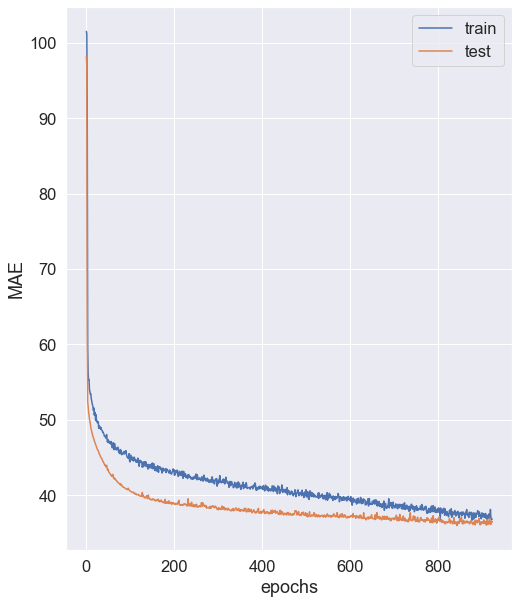

In [188]:
# plot train vs validation loss
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend(loc= "best")
plt.ylabel('MAE')
plt.xlabel('epochs')
plt.show()

In [32]:
def evaluate_LSTMmodel(model, test_x, test_y):
    predY = model.predict(test_x)
    test_x = test_x.reshape((test_x.shape[0], test_x.shape[2]))
    predY = predY.reshape((predY.shape[0], predY.shape[2]))
    test_y = test_y.reshape((test_y.shape[0], test_y.shape[2]))
    
    mae = mean_absolute_error(test_y, predY)

    print("Actual Vs Predicted Plot")
    plt.scatter(x = test_y, y = predY, c = 'DarkBlue')
    plt.ylabel('Predicted Value')
    plt.xlabel('Actual Value')
    plt.show
    
    print("MAE = {}".format(mae))
    print('')

Model Evaluation Scores on Training Data:
Actual Vs Predicted Plot
MAE = 35.07655065430725

Model Evaluation Scores on Validation Data:
Actual Vs Predicted Plot
MAE = 36.80638035819644

Model Evaluation Scores on Testing Data:
Actual Vs Predicted Plot
MAE = 40.66050188164962



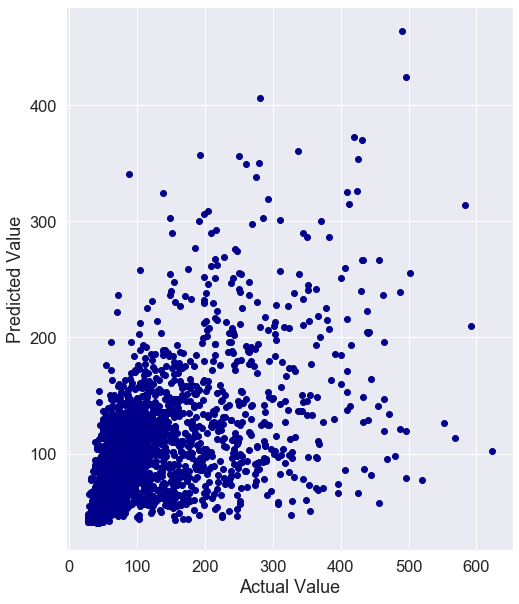

In [33]:
print('Model Evaluation Scores on Training Data:')
evaluate_LSTMmodel(model, trainX, trainY)

print('Model Evaluation Scores on Validation Data:')
evaluate_LSTMmodel(model, testX, testY)

print('Model Evaluation Scores on Testing Data:')
evaluate_LSTMmodel(model, testX1, testY1)
